# Forest-continuity backcasting: final threshold 0.729 and downstream analyses

This master notebook updates the complete analysis workflow to the final forest-continuity threshold of **0.729**, corresponding to a validation precision target of **0.85**.

The notebook is organized as follows:

1. Create the thresholded and minimum-patch-filtered binary continuity raster.
2. Validate the new raster and record provenance.
3. Recalculate model-performance figures for the final threshold.
4. Update spatial SHAP maps to the same probability threshold.
5. Recalculate hexagon and country-level continuity statistics.
6. Recalculate observed/expected genus analyses and spatial genus maps.
7. Recalculate the forest-age comparison.

All threshold-dependent caches and outputs use a `gt0729` identifier. Existing products based on the previous 0.80 threshold are therefore retained and cannot be silently reused.

**Important:** The final probability raster and fitted XGBoost model are not recreated. Only products that depend on conversion of probabilities into a binary continuity class are recalculated.


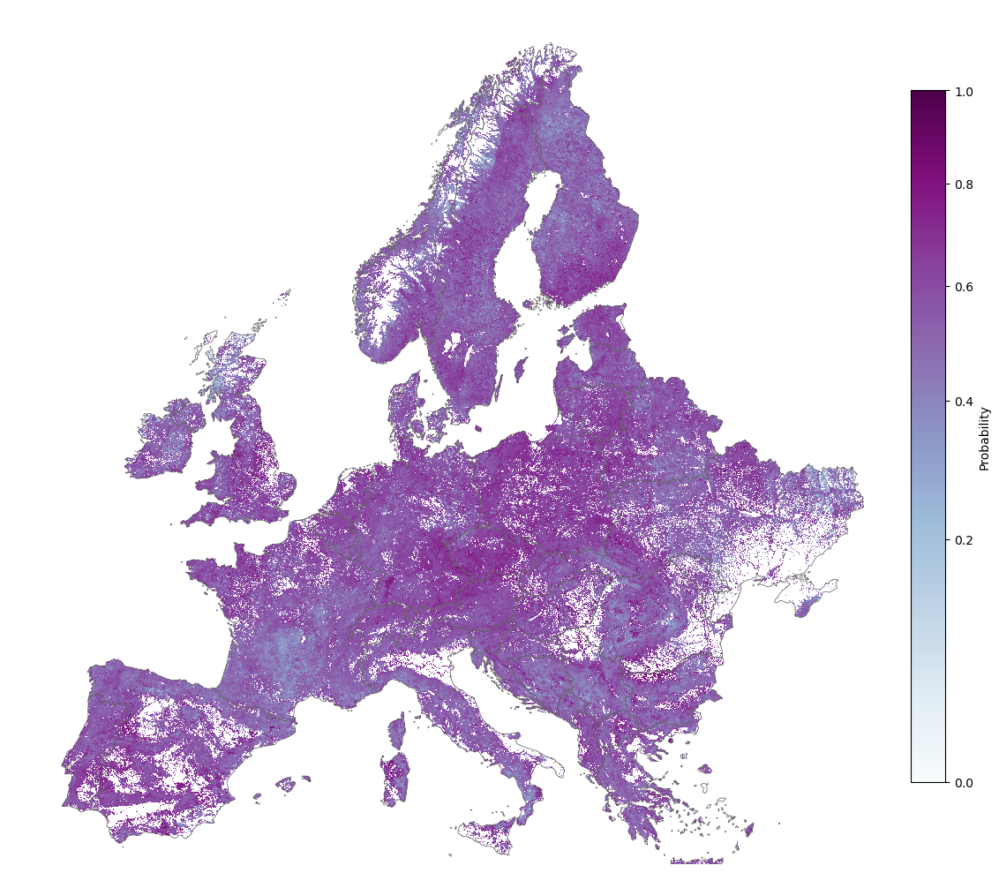

In [9]:
# ============================================================
# Quick-look probability raster with selected country boundaries
# same extent as hexagon map, without clipped country borders
# ============================================================

from pathlib import Path
import numpy as np
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
from rasterio.enums import Resampling
from shapely.geometry import box

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

PROBABILITY_RASTER = Path(
    "/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/"
    "global_model_no_dist.tif"
)

COUNTRY_BOUNDARIES = Path(
    "/mnt/eo/EO4Backcasting/_data/"
    "CNTR_RG_10M_2024_3035.gpkg"
)

# ------------------------------------------------------------
# Same country selection as later in the notebook
# ------------------------------------------------------------

european_countries = [
    "Albania", "Andorra", "Austria", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Czechia",
    "Denmark", "Estonia", "Finland", "France", "Germany",
    "Greece", "Hungary", "Ireland", "Italy", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine",
    "United Kingdom", "Vatican"
]

# ------------------------------------------------------------
# Load and filter country boundaries
# ------------------------------------------------------------

countries = gpd.read_file(COUNTRY_BOUNDARIES)

countries["country"] = (
    countries["NAME_ENGL"]
    .astype(str)
    .str.strip()
)

countries = countries[
    countries["country"].isin(european_countries)
].copy()

countries = countries[
    countries.geometry.notna()
    & ~countries.geometry.is_empty
].copy()

countries["geometry"] = countries.geometry.make_valid()

# Explode multipart geometries, but DO NOT clip the countries.
# Clipping them would create artificial straight border segments
# along the Europe bbox.
countries = countries.to_crs("EPSG:4326")
countries = countries.explode(
    index_parts=False
).reset_index(drop=True)

# ------------------------------------------------------------
# Europe bbox
# Same extent as used later for the hexagon map
# ------------------------------------------------------------

europe_bbox_4326 = box(
    -11, 34,
    35, 72
)

bbox_gdf = gpd.GeoDataFrame(
    geometry=[europe_bbox_4326],
    crs="EPSG:4326"
)

# ------------------------------------------------------------
# Read probability raster in reduced resolution
# ------------------------------------------------------------

with rasterio.open(PROBABILITY_RASTER) as src:

    # country boundaries and bbox to raster CRS
    countries_plot = countries.to_crs(src.crs)
    bbox_plot_crs = bbox_gdf.to_crs(src.crs)

    # downsample for quick plotting
    max_size = 2500

    scale = min(
        max_size / src.width,
        max_size / src.height,
        1
    )

    out_width = int(src.width * scale)
    out_height = int(src.height * scale)

    prob = src.read(
        1,
        out_shape=(
            out_height,
            out_width
        ),
        resampling=Resampling.average,
        masked=True
    )

    bounds = src.bounds

# ------------------------------------------------------------
# Mask background
# ------------------------------------------------------------

prob = np.ma.masked_where(
    prob <= 0,
    prob
)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(12, 10)
)

ax.set_facecolor("white")

im = ax.imshow(
    prob,
    cmap="BuPu",
    norm=PowerNorm(
        gamma=0.65,
        vmin=0,
        vmax=1
    ),
    extent=[
        bounds.left,
        bounds.right,
        bounds.bottom,
        bounds.top
    ],
    origin="upper",
    interpolation="nearest",
    zorder=1
)

# country boundaries
countries_plot.boundary.plot(
    ax=ax,
    color="0.4",
    linewidth=0.55,
    zorder=3
)

# ------------------------------------------------------------
# Same rectangular extent as hexagon map
# ------------------------------------------------------------

xmin, ymin, xmax, ymax = bbox_plot_crs.total_bounds

ax.set_xlim(
    xmin,
    xmax
)

ax.set_ylim(
    ymin,
    ymax
)

ax.set_axis_off()

# ------------------------------------------------------------
# Colorbar
# ------------------------------------------------------------

cbar = fig.colorbar(
    im,
    ax=ax,
    fraction=0.035,
    pad=0.02,
    shrink=0.82
)

cbar.set_label(
    "Probability"
)

cbar.set_ticks(
    [0, 0.2, 0.4, 0.6, 0.8, 1]
)

plt.tight_layout()
plt.show()

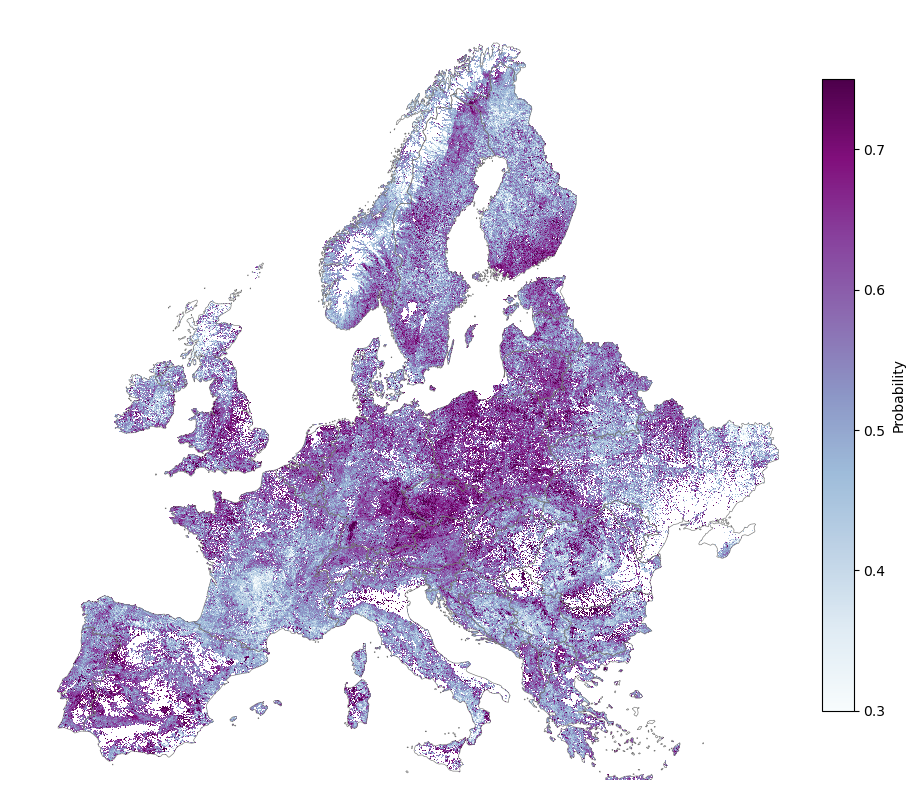

Saved: /mnt/eo/EO4Backcasting/_figs/probability_map_europe.png


<Figure size 640x480 with 0 Axes>

In [12]:
# ============================================================
# Quick-look probability raster with selected country boundaries
# linear color scaling similar to reference figure
# ============================================================

from pathlib import Path
import numpy as np
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from rasterio.enums import Resampling
from shapely.geometry import box

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

PROBABILITY_RASTER = Path(
    "/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/"
    "global_model_no_dist.tif"
)

COUNTRY_BOUNDARIES = Path(
    "/mnt/eo/EO4Backcasting/_data/"
    "CNTR_RG_10M_2024_3035.gpkg"
)

# ------------------------------------------------------------
# Same country selection as later in the notebook
# ------------------------------------------------------------

european_countries = [
    "Albania", "Andorra", "Austria", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Czechia",
    "Denmark", "Estonia", "Finland", "France", "Germany",
    "Greece", "Hungary", "Ireland", "Italy", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine",
    "United Kingdom", "Vatican"
]

# ------------------------------------------------------------
# Load and filter country boundaries
# ------------------------------------------------------------

countries = gpd.read_file(COUNTRY_BOUNDARIES)

countries["country"] = (
    countries["NAME_ENGL"]
    .astype(str)
    .str.strip()
)

countries = countries[
    countries["country"].isin(european_countries)
].copy()

countries = countries[
    countries.geometry.notna()
    & ~countries.geometry.is_empty
].copy()

countries["geometry"] = countries.geometry.make_valid()

# Keep complete geometries
countries = countries.to_crs("EPSG:4326")
countries = countries.explode(
    index_parts=False
).reset_index(drop=True)

# ------------------------------------------------------------
# Europe bbox
# same extent as hexagon map
# ------------------------------------------------------------

europe_bbox_4326 = box(
    -11, 34,
    35, 72
)

bbox_gdf = gpd.GeoDataFrame(
    geometry=[europe_bbox_4326],
    crs="EPSG:4326"
)

# ------------------------------------------------------------
# Read probability raster in reduced resolution
# ------------------------------------------------------------

with rasterio.open(PROBABILITY_RASTER) as src:

    countries_plot = countries.to_crs(src.crs)
    bbox_plot_crs = bbox_gdf.to_crs(src.crs)

    max_size = 2500

    scale = min(
        max_size / src.width,
        max_size / src.height,
        1
    )

    out_width = int(src.width * scale)
    out_height = int(src.height * scale)

    prob = src.read(
        1,
        out_shape=(
            out_height,
            out_width
        ),
        resampling=Resampling.average,
        masked=True
    )

    bounds = src.bounds

# ------------------------------------------------------------
# Mask background / invalid values
# ------------------------------------------------------------

prob = np.ma.masked_where(
    (~np.isfinite(prob)) | (prob <= 0),
    prob
)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(12, 10)
)

ax.set_facecolor("white")

# Display range chosen to enhance differences
vmin = 0.30
vmax = 0.75

im = ax.imshow(
    prob,
    cmap="BuPu",
    norm=Normalize(
        vmin=vmin,
        vmax=vmax,
        clip=True
    ),
    extent=[
        bounds.left,
        bounds.right,
        bounds.bottom,
        bounds.top
    ],
    origin="upper",
    interpolation="nearest",
    zorder=1
)

# Country boundaries
countries_plot.boundary.plot(
    ax=ax,
    color="0.45",
    linewidth=0.45,
    zorder=3
)

# ------------------------------------------------------------
# Same extent as hexagon map
# ------------------------------------------------------------

xmin, ymin, xmax, ymax = bbox_plot_crs.total_bounds

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.set_axis_off()

# ------------------------------------------------------------
# Colorbar
# ------------------------------------------------------------

cbar = fig.colorbar(
    im,
    ax=ax,
    fraction=0.035,
    pad=0.02,
    shrink=0.82
)

cbar.set_label("Probability")

cbar.set_ticks([
    0.3,
    0.4,
    0.5,
    0.6,
    0.7
])

out_fp = Path(
    "/mnt/eo/EO4Backcasting/_figs/"
    "probability_map_europe.png"
)

fig.savefig(
    out_fp,
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved:", out_fp)

plt.tight_layout()
plt.show()

Saved: /mnt/eo/EO4Backcasting/_figs/legend.png


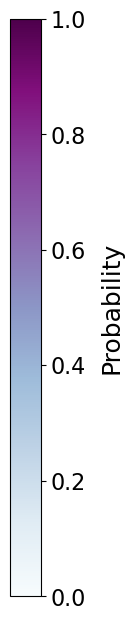

In [21]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import Normalize

norm = Normalize(vmin=0, vmax=1)
cmap = plt.get_cmap("BuPu")

# noch schmäler und höher
fig, ax = plt.subplots(figsize=(0.4, 7.5))

sm = mpl.cm.ScalarMappable(
    norm=norm,
    cmap=cmap
)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    cax=ax
)

cbar.set_label(
    "Probability",
    fontsize=18,
    labelpad=10
)

cbar.set_ticks([0, 0.2, 0.4, 0.6, 0.8, 1])
cbar.ax.tick_params(labelsize=16)

out_fp = "/mnt/eo/EO4Backcasting/_figs/legend.png"

fig.savefig(
    out_fp,
    format="png",
    bbox_inches="tight",
    transparent=True
)

print("Saved:", out_fp)

plt.show()

In [3]:
# ============================================================
# 0. CENTRAL SETTINGS
# ============================================================

from pathlib import Path
import json
import os
import shutil
import subprocess
from datetime import datetime

import numpy as np
import pandas as pd
import rasterio

FINAL_THRESHOLD = 0.729
TARGET_VALIDATION_PRECISION = 0.85

# 30 m × 30 m = 900 m² = 0.09 ha
PIXEL_AREA_HA = 0.09
MIN_PATCH_AREA_HA = 5.0
MIN_PATCH_PIXELS = int(np.ceil(MIN_PATCH_AREA_HA / PIXEL_AREA_HA))

PREDICTION_DIR = Path(
    "/mnt/eo/EO4Backcasting/_predictions/predictions_global_model"
)

PROBABILITY_RASTER = PREDICTION_DIR / "global_model_no_dist.tif"

THRESHOLDED_RAW_RASTER = (
    PREDICTION_DIR
    / "global_model_no_dist_gt0729_raw_TRUE_0_1.tif"
)

FINAL_BINARY_RASTER = (
    PREDICTION_DIR
    / "global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif"
)

FINAL_BINARY_NODATA0_RASTER = (
    PREDICTION_DIR
    / "global_model_no_dist_gt0729_4conn_5ha_nodata0.tif"
)

ANALYSIS_CACHE_DIR = Path("/mnt/eo/EO4Backcasting/_analysis_cache")
ANALYSIS_CACHE_DIR.mkdir(parents=True, exist_ok=True)

FIGURE_DIR = Path("/mnt/eo/EO4Backcasting/_figs")
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

FORCE_RECREATE_BINARY_RASTER = False
FORCE_RECOMPUTE_DOWNSTREAM = True

print("Final threshold:", FINAL_THRESHOLD)
print("Minimum connected-patch size:", MIN_PATCH_PIXELS, "pixels")
print("Final binary raster:", FINAL_BINARY_RASTER)


Final threshold: 0.729
Minimum connected-patch size: 56 pixels
Final binary raster: /mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif


## 1. Create the final binary forest-continuity raster

The workflow applies three operations:

1. classify pixels with probability ≥ 0.729 as continuity;
2. remove connected components smaller than 5 ha using four-neighbour connectivity;
3. write a final binary raster with values 0 and 1.

The implementation uses GDAL command-line utilities because the continental raster is too large for a full in-memory connected-component analysis. The commands preserve the georeferencing and process the raster blockwise/on disk.


In [2]:
# ============================================================
# 1.1 Check required GDAL utilities and source raster
# ============================================================

if not PROBABILITY_RASTER.exists():
    raise FileNotFoundError(f"Probability raster not found: {PROBABILITY_RASTER}")

def find_command(*names):
    for name in names:
        command = shutil.which(name)
        if command is not None:
            return command
    return None

GDAL_CALC = find_command("gdal_calc.py", "gdal_calc")
GDAL_SIEVE = find_command("gdal_sieve.py", "gdal_sieve")
GDAL_TRANSLATE = find_command("gdal_translate")

if GDAL_CALC is None:
    raise RuntimeError(
        "gdal_calc.py was not found in the active environment. "
        "Activate the GDAL-capable conda environment before running this notebook."
    )

if GDAL_SIEVE is None:
    raise RuntimeError(
        "gdal_sieve.py was not found in the active environment. "
        "Activate the GDAL-capable conda environment before running this notebook."
    )

print("gdal_calc:", GDAL_CALC)
print("gdal_sieve:", GDAL_SIEVE)
print("gdal_translate:", GDAL_TRANSLATE)


gdal_calc: /mnt/dss_project/lmandl/anaconda3/envs/backcasting/bin/gdal_calc.py
gdal_sieve: /mnt/dss_project/lmandl/anaconda3/envs/backcasting/bin/gdal_sieve.py
gdal_translate: /mnt/dss_project/lmandl/anaconda3/envs/backcasting/bin/gdal_translate


In [3]:
# ============================================================
# 1.2 Threshold probabilities at 0.729
# ============================================================

def run_command(command):
    print(" ".join(map(str, command)))
    subprocess.run(command, check=True)

if FORCE_RECREATE_BINARY_RASTER or not THRESHOLDED_RAW_RASTER.exists():
    command = [
        GDAL_CALC,
        "-A", str(PROBABILITY_RASTER),
        "--A_band=1",
        f"--calc=(A>={FINAL_THRESHOLD})",
        "--type=Byte",
        "--NoDataValue=0",
        "--co=COMPRESS=DEFLATE",
        "--co=TILED=YES",
        "--co=BIGTIFF=YES",
        "--overwrite",
        f"--outfile={THRESHOLDED_RAW_RASTER}",
    ]
    run_command(command)
else:
    print("Using existing raw threshold raster:", THRESHOLDED_RAW_RASTER)


/mnt/dss_project/lmandl/anaconda3/envs/backcasting/bin/gdal_calc.py -A /mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist.tif --A_band=1 --calc=(A>=0.729) --type=Byte --NoDataValue=0 --co=COMPRESS=DEFLATE --co=TILED=YES --co=BIGTIFF=YES --overwrite --outfile=/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_raw_TRUE_0_1.tif
0...10...20...30...40...50...60...70...80...90...100 - done in 00:06:05.


In [4]:
# ============================================================
# 1.3 Remove four-connected patches smaller than 5 ha
# ============================================================

# gdal_sieve replaces small raster polygons by the value of their largest
# neighbouring polygon. With a binary raster, this removes small isolated
# continuity patches while retaining four-neighbour connectivity.

if FORCE_RECREATE_BINARY_RASTER or not FINAL_BINARY_RASTER.exists():
    command = [
        GDAL_SIEVE,
        "-st", str(MIN_PATCH_PIXELS),
        "-4",
        "-of", "GTiff",
        str(THRESHOLDED_RAW_RASTER),
        str(FINAL_BINARY_RASTER),
    ]
    run_command(command)
else:
    print("Using existing filtered binary raster:", FINAL_BINARY_RASTER)


/mnt/dss_project/lmandl/anaconda3/envs/backcasting/bin/gdal_sieve.py -st 56 -4 -of GTiff /mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_raw_TRUE_0_1.tif /mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif
0...10...20...30...40...50...60...70...80...90...100 - done in 00:05:04.


In [5]:
# ============================================================
# 1.4 Create explicit nodata=0 version, if required downstream
# ============================================================

if FORCE_RECREATE_BINARY_RASTER or not FINAL_BINARY_NODATA0_RASTER.exists():
    if GDAL_TRANSLATE is not None:
        command = [
            GDAL_TRANSLATE,
            "-ot", "Byte",
            "-a_nodata", "0",
            "-co", "COMPRESS=DEFLATE",
            "-co", "TILED=YES",
            "-co", "BIGTIFF=YES",
            str(FINAL_BINARY_RASTER),
            str(FINAL_BINARY_NODATA0_RASTER),
        ]
        run_command(command)
    else:
        # Rasterio fallback if gdal_translate is unavailable.
        with rasterio.open(FINAL_BINARY_RASTER) as src:
            profile = src.profile.copy()
            profile.update(
                dtype="uint8",
                nodata=0,
                compress="deflate",
                tiled=True,
                BIGTIFF="YES",
            )
            with rasterio.open(FINAL_BINARY_NODATA0_RASTER, "w", **profile) as dst:
                for _, window in src.block_windows(1):
                    data = src.read(1, window=window)
                    dst.write((data == 1).astype("uint8"), 1, window=window)
else:
    print("Using existing nodata=0 raster:", FINAL_BINARY_NODATA0_RASTER)


/mnt/dss_project/lmandl/anaconda3/envs/backcasting/bin/gdal_translate -ot Byte -a_nodata 0 -co COMPRESS=DEFLATE -co TILED=YES -co BIGTIFF=YES /mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif /mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_4conn_5ha_nodata0.tif
Input file size is 130000, 140000
0...10...20...30...40...50...60...70...80...90...100 - done in 00:05:07.


In [6]:
# ============================================================
# 1.5 Validate raster values, alignment and mapped area
# ============================================================

def summarize_binary_raster(raster_path):
    counts = {0: 0, 1: 0, "other": 0}
    with rasterio.open(raster_path) as src:
        for _, window in src.block_windows(1):
            data = src.read(1, window=window)
            counts[0] += int(np.count_nonzero(data == 0))
            counts[1] += int(np.count_nonzero(data == 1))
            counts["other"] += int(np.count_nonzero((data != 0) & (data != 1)))

        pixel_area_m2 = abs(src.transform.a * src.transform.e)
        continuity_area_km2 = counts[1] * pixel_area_m2 / 1e6

        metadata = {
            "path": str(raster_path),
            "crs": str(src.crs),
            "width": src.width,
            "height": src.height,
            "transform": tuple(src.transform),
            "nodata": src.nodata,
            "count_0": counts[0],
            "count_1": counts[1],
            "count_other": counts["other"],
            "continuity_area_km2": continuity_area_km2,
        }

    return metadata

binary_summary = summarize_binary_raster(FINAL_BINARY_RASTER)
display(pd.Series(binary_summary, name="value").to_frame())

if binary_summary["count_other"] != 0:
    raise ValueError("Final raster contains values other than 0 and 1.")

provenance = {
    "created": datetime.now().isoformat(),
    "probability_raster": str(PROBABILITY_RASTER),
    "threshold": FINAL_THRESHOLD,
    "target_validation_precision": TARGET_VALIDATION_PRECISION,
    "connectivity": 4,
    "minimum_patch_area_ha": MIN_PATCH_AREA_HA,
    "minimum_patch_pixels": MIN_PATCH_PIXELS,
    "final_binary_raster": str(FINAL_BINARY_RASTER),
    "summary": binary_summary,
}

provenance_fp = PREDICTION_DIR / "global_model_no_dist_gt0729_provenance.json"
with open(provenance_fp, "w") as f:
    json.dump(provenance, f, indent=2)

print("Written:", provenance_fp)


,value
path,/mnt/eo/EO4Backcasting/_predictions/prediction...
crs,EPSG:3035
width,130000
height,140000
transform,"(30.0, 0.0, 2612197.933345846, 0.0, -30.0, 556..."
nodata,0.0
count_0,17979732681
count_1,220267319
count_other,0
continuity_area_km2,198240.5871


Written: /mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_provenance.json


# 2. Model performance at the final threshold

This section reproduces the spatial validation/test split, selects the lowest validation threshold reaching precision 0.85, and evaluates the resulting threshold on the independent test set. The expected selected threshold is approximately 0.729.


In [7]:
# Imports

from pathlib import Path
import json
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import xgboost as xgb

from sklearn.metrics import (
    average_precision_score,
    balanced_accuracy_score,
    brier_score_loss,
    confusion_matrix,
    f1_score,
    precision_recall_curve,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve,
)
from sklearn.calibration import calibration_curve

warnings.filterwarnings("ignore", category=FutureWarning)
pd.set_option("display.max_columns", 100)


In [11]:
# ------------------------------------------------------------
# SETTINGS — check these paths before running
# ------------------------------------------------------------

TRAINING_DATA_DIR = Path("/mnt/eo/EO4Backcasting/training_data")
TRAINING_FILE_PATTERN = "training_data_stm.csv"

MODEL_PATH = Path("/mnt/eo/EO4Backcasting/_models/global/xgb_model_final.json")

OUTPUT_DIR = Path("/mnt/eo/EO4Backcasting/_figs/model_performance_gt0729")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

LABEL_COLUMN = "label_undisturbed_20y"
TILE_COLUMN = "tile"

SEED = 42
TRAIN_FRACTION = 0.70
VALIDATION_FRACTION = 0.15
TEST_FRACTION = 0.15

TARGET_PRECISION = 0.85

# Set explicit tile lists here only if they were saved during model training.
# Otherwise leave them as None and the split will be reconstructed from SEED.
TRAIN_TILES = None
VALIDATION_TILES = None
TEST_TILES = None

DPI = 300
FIG_FORMATS = ("png", "pdf")

assert np.isclose(
    TRAIN_FRACTION + VALIDATION_FRACTION + TEST_FRACTION, 1.0
), "Split fractions must sum to 1."


In [12]:
# ------------------------------------------------------------
# Final 27 predictor variables
# ------------------------------------------------------------

STM_BANDS = ["BLUE", "GREEN", "RED", "NIR", "SWIR1", "SWIR2"]
STM_STATS = ["Q10", "Q50", "Q90", "STD"]

MODEL_FEATURES = [
    f"stm_{band}_{stat}"
    for band in STM_BANDS
    for stat in STM_STATS
] + [
    "nbr_mean",
    "nbr_sd",
    "nbr_sen_slope",
]

print(f"Number of model features: {len(MODEL_FEATURES)}")
MODEL_FEATURES


Number of model features: 27


['stm_BLUE_Q10',
 'stm_BLUE_Q50',
 'stm_BLUE_Q90',
 'stm_BLUE_STD',
 'stm_GREEN_Q10',
 'stm_GREEN_Q50',
 'stm_GREEN_Q90',
 'stm_GREEN_STD',
 'stm_RED_Q10',
 'stm_RED_Q50',
 'stm_RED_Q90',
 'stm_RED_STD',
 'stm_NIR_Q10',
 'stm_NIR_Q50',
 'stm_NIR_Q90',
 'stm_NIR_STD',
 'stm_SWIR1_Q10',
 'stm_SWIR1_Q50',
 'stm_SWIR1_Q90',
 'stm_SWIR1_STD',
 'stm_SWIR2_Q10',
 'stm_SWIR2_Q50',
 'stm_SWIR2_Q90',
 'stm_SWIR2_STD',
 'nbr_mean',
 'nbr_sd',
 'nbr_sen_slope']

In [13]:
# ------------------------------------------------------------
# Load all training samples
# ------------------------------------------------------------

csv_files = sorted(TRAINING_DATA_DIR.glob(TRAINING_FILE_PATTERN))

if not csv_files:
    raise FileNotFoundError(
        f"No files matching '{TRAINING_FILE_PATTERN}' found in {TRAINING_DATA_DIR}"
    )

print(f"Found {len(csv_files)} training files.")

frames = []
for fp in csv_files:
    df_part = pd.read_csv(fp)

    # Recover the tile name from the filename if the column is absent.
    if TILE_COLUMN not in df_part.columns:
        tile_name = fp.stem.removeprefix("training_").removesuffix("_features")
        df_part[TILE_COLUMN] = tile_name

    frames.append(df_part)

df = pd.concat(frames, ignore_index=True)

required_columns = [LABEL_COLUMN, TILE_COLUMN, *MODEL_FEATURES]
missing_columns = [column for column in required_columns if column not in df.columns]

if missing_columns:
    raise ValueError(
        "The following required columns are missing:\n"
        + "\n".join(missing_columns)
    )

df[LABEL_COLUMN] = pd.to_numeric(df[LABEL_COLUMN], errors="coerce")
df = df[df[LABEL_COLUMN].isin([0, 1])].copy()
df[LABEL_COLUMN] = df[LABEL_COLUMN].astype("uint8")

# XGBoost can handle missing predictor values, but rows without any usable
# predictor information should not be evaluated.
df[MODEL_FEATURES] = df[MODEL_FEATURES].apply(pd.to_numeric, errors="coerce")
df = df.loc[~df[MODEL_FEATURES].isna().all(axis=1)].copy()

print(f"Samples: {len(df):,}")
print(f"Tiles: {df[TILE_COLUMN].nunique():,}")
print("\nClass counts:")
display(df[LABEL_COLUMN].value_counts().rename_axis("class").to_frame("n"))


Found 1 training files.
Samples: 390,987
Tiles: 395

Class counts:


,n
class,
1,195896
0,195091


In [14]:
# ------------------------------------------------------------
# Spatial split by tile
# ------------------------------------------------------------

def reconstruct_tile_split(
    tile_values,
    train_fraction=0.70,
    validation_fraction=0.15,
    seed=42,
):
    """Shuffle unique tiles once and assign complete tiles to each subset."""
    tiles = np.array(sorted(pd.Series(tile_values).dropna().unique()))
    rng = np.random.default_rng(seed)
    rng.shuffle(tiles)

    n_tiles = len(tiles)
    n_train = int(np.floor(train_fraction * n_tiles))
    n_validation = int(np.floor(validation_fraction * n_tiles))

    train_tiles = tiles[:n_train]
    validation_tiles = tiles[n_train:n_train + n_validation]
    test_tiles = tiles[n_train + n_validation:]

    return train_tiles, validation_tiles, test_tiles


if all(x is not None for x in (TRAIN_TILES, VALIDATION_TILES, TEST_TILES)):
    train_tiles = np.asarray(TRAIN_TILES)
    validation_tiles = np.asarray(VALIDATION_TILES)
    test_tiles = np.asarray(TEST_TILES)
else:
    train_tiles, validation_tiles, test_tiles = reconstruct_tile_split(
        df[TILE_COLUMN],
        train_fraction=TRAIN_FRACTION,
        validation_fraction=VALIDATION_FRACTION,
        seed=SEED,
    )

split_overlap = (
    set(train_tiles) & set(validation_tiles)
    | set(train_tiles) & set(test_tiles)
    | set(validation_tiles) & set(test_tiles)
)
if split_overlap:
    raise ValueError(f"Tiles occur in more than one subset: {sorted(split_overlap)}")

split_lookup = {
    **{tile: "train" for tile in train_tiles},
    **{tile: "validation" for tile in validation_tiles},
    **{tile: "test" for tile in test_tiles},
}
df["split"] = df[TILE_COLUMN].map(split_lookup)

if df["split"].isna().any():
    missing_tiles = sorted(df.loc[df["split"].isna(), TILE_COLUMN].unique())
    raise ValueError(f"Tiles not assigned to a subset: {missing_tiles}")

split_summary = (
    df.groupby("split")
      .agg(
          n_samples=(LABEL_COLUMN, "size"),
          n_tiles=(TILE_COLUMN, "nunique"),
          positive_share=(LABEL_COLUMN, "mean"),
      )
      .reindex(["train", "validation", "test"])
)
split_summary["positive_share"] *= 100

display(split_summary)

split_summary.to_csv(OUTPUT_DIR / "spatial_split_summary.csv")


,n_samples,n_tiles,positive_share
split,,,
train,273979,276,50.095080
validation,59000,59,50.000000
test,58008,60,50.244794


In [15]:
# ------------------------------------------------------------
# Load final XGBoost model and generate probabilities
# ------------------------------------------------------------

if not MODEL_PATH.exists():
    raise FileNotFoundError(f"Model not found: {MODEL_PATH}")

model = xgb.XGBClassifier()
model.load_model(MODEL_PATH)

# Check feature names when they are stored in the model file.
booster_feature_names = model.get_booster().feature_names
if booster_feature_names is not None:
    if list(booster_feature_names) != MODEL_FEATURES:
        raise ValueError(
            "Feature order in MODEL_FEATURES does not match the saved model.\n"
            f"Saved model: {booster_feature_names}\n"
            f"Notebook: {MODEL_FEATURES}"
        )

validation_df = df[df["split"] == "validation"].copy()
test_df = df[df["split"] == "test"].copy()

X_validation = validation_df[MODEL_FEATURES]
y_validation = validation_df[LABEL_COLUMN].to_numpy()

X_test = test_df[MODEL_FEATURES]
y_test = test_df[LABEL_COLUMN].to_numpy()

p_validation = model.predict_proba(X_validation)[:, 1]
p_test = model.predict_proba(X_test)[:, 1]

print(f"Validation samples: {len(y_validation):,}")
print(f"Test samples: {len(y_test):,}")
print(f"Validation probability range: {p_validation.min():.4f}–{p_validation.max():.4f}")
print(f"Test probability range: {p_test.min():.4f}–{p_test.max():.4f}")


Validation samples: 59,000
Test samples: 58,008
Validation probability range: 0.0225–0.9769
Test probability range: 0.0278–0.9616


In [16]:
# ------------------------------------------------------------
# Select threshold on validation data
# ------------------------------------------------------------

def threshold_for_target_precision(y_true, probabilities, target_precision=0.90):
    """Return the lowest threshold whose precision reaches the target.

    Among all eligible thresholds, selecting the lowest threshold retains the
    highest possible recall while satisfying the requested precision.
    """
    precision, recall, thresholds = precision_recall_curve(y_true, probabilities)

    # precision and recall contain one additional endpoint without a threshold.
    precision_t = precision[:-1]
    recall_t = recall[:-1]

    eligible = np.flatnonzero(precision_t >= target_precision)

    if eligible.size == 0:
        best_idx = int(np.nanargmax(precision_t))
        print(
            f"Warning: target precision {target_precision:.2f} was not reached. "
            f"Using maximum observed precision {precision_t[best_idx]:.3f}."
        )
    else:
        # thresholds returned by sklearn are increasing. The first eligible
        # threshold is therefore the least restrictive one.
        best_idx = int(eligible[0])

    return {
        "threshold": float(thresholds[best_idx]),
        "precision": float(precision_t[best_idx]),
        "recall": float(recall_t[best_idx]),
    }


threshold_info = threshold_for_target_precision(
    y_validation,
    p_validation,
    target_precision=TARGET_PRECISION,
)

SELECTED_THRESHOLD = threshold_info["threshold"]

print(f"Selected validation threshold: {SELECTED_THRESHOLD:.6f}")
print(f"Validation precision: {threshold_info['precision']:.3f}")
print(f"Validation recall: {threshold_info['recall']:.3f}")

with open(OUTPUT_DIR / "selected_threshold.json", "w") as f:
    json.dump(
        {
            "target_precision": TARGET_PRECISION,
            **threshold_info,
        },
        f,
        indent=2,
    )


Selected validation threshold: 0.729315
Validation precision: 0.850
Validation recall: 0.198


In [17]:
# ------------------------------------------------------------
# Calculate test-set metrics
# ------------------------------------------------------------

y_test_pred = (p_test >= SELECTED_THRESHOLD).astype("uint8")

tn, fp, fn, tp = confusion_matrix(y_test, y_test_pred, labels=[0, 1]).ravel()

specificity = tn / (tn + fp) if (tn + fp) else np.nan
negative_predictive_value = tn / (tn + fn) if (tn + fn) else np.nan

metrics = {
    "selected_threshold": SELECTED_THRESHOLD,
    "n_test_samples": len(y_test),
    "n_test_tiles": test_df[TILE_COLUMN].nunique(),
    "prevalence_continuity": y_test.mean(),
    "precision_continuity": precision_score(y_test, y_test_pred, zero_division=0),
    "recall_continuity": recall_score(y_test, y_test_pred, zero_division=0),
    "f1_continuity": f1_score(y_test, y_test_pred, zero_division=0),
    "specificity": specificity,
    "negative_predictive_value": negative_predictive_value,
    "balanced_accuracy": balanced_accuracy_score(y_test, y_test_pred),
    "pr_auc_average_precision": average_precision_score(y_test, p_test),
    "roc_auc": roc_auc_score(y_test, p_test),
    "brier_score": brier_score_loss(y_test, p_test),
    "true_negative": tn,
    "false_positive": fp,
    "false_negative": fn,
    "true_positive": tp,
}

metrics_df = pd.DataFrame(
    {"metric": metrics.keys(), "value": metrics.values()}
)

display(metrics_df)
metrics_df.to_csv(OUTPUT_DIR / "test_performance_metrics.csv", index=False)


,metric,value
0,selected_threshold,0.729315
1,n_test_samples,58008.000000
2,n_test_tiles,60.000000
3,prevalence_continuity,0.502448
4,precision_continuity,0.870488
5,recall_continuity,0.202704
6,f1_continuity,0.328834
7,specificity,0.969545
8,negative_predictive_value,0.546319
9,balanced_accuracy,0.586124


In [18]:
# ------------------------------------------------------------
# Plot helpers
# ------------------------------------------------------------

def save_figure(fig, stem):
    for extension in FIG_FORMATS:
        fp = OUTPUT_DIR / f"{stem}.{extension}"
        fig.savefig(fp, dpi=DPI, bbox_inches="tight")
        print(f"Written: {fp}")


def plot_precision_recall(ax, y_true, probabilities, threshold):
    precision, recall, _ = precision_recall_curve(y_true, probabilities)
    ap = average_precision_score(y_true, probabilities)

    ax.plot(recall, precision, linewidth=2)
    ax.axhline(
        TARGET_PRECISION,
        linestyle="--",
        linewidth=1,
        label=f"Target precision = {TARGET_PRECISION:.2f}",
    )

    prediction = probabilities >= threshold
    point_precision = precision_score(y_true, prediction, zero_division=0)
    point_recall = recall_score(y_true, prediction, zero_division=0)

    ax.scatter(
        point_recall,
        point_precision,
        s=70,
        zorder=3,
        label=f"Selected threshold = {threshold:.3f}",
    )

    ax.set(
        xlabel="Recall",
        ylabel="Precision",
        xlim=(0, 1.01),
        ylim=(0, 1.01),
    )
    ax.text(
        0.04,
        0.08,
        f"PR-AUC = {ap:.3f}",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
    )
    ax.legend(frameon=False, loc="lower left")


def plot_normalized_confusion_matrix(ax, y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    row_sums = cm.sum(axis=1, keepdims=True)
    cm_normalized = np.divide(
        cm,
        row_sums,
        out=np.zeros_like(cm, dtype=float),
        where=row_sums != 0,
    )

    image = ax.imshow(cm_normalized, vmin=0, vmax=1)

    labels = ["Non-continuity", "Continuity"]
    ax.set_xticks([0, 1], labels=labels)
    ax.set_yticks([0, 1], labels=labels)
    ax.set_xlabel("Predicted class")
    ax.set_ylabel("Reference class")

    for row in range(2):
        for column in range(2):
            value = cm_normalized[row, column]
            count = cm[row, column]
            text_color = "white" if value > 0.5 else "black"
            ax.text(
                column,
                row,
                f"{value:.1%}\n(n = {count:,})",
                ha="center",
                va="center",
                color=text_color,
            )

    return image


Written: /mnt/eo/EO4Backcasting/_figs/model_performance_gt0729/model_performance_main.png
Written: /mnt/eo/EO4Backcasting/_figs/model_performance_gt0729/model_performance_main.pdf


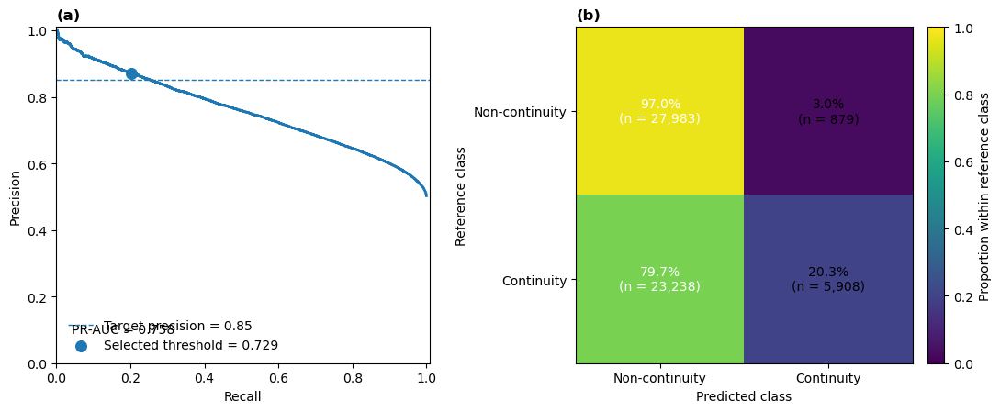

In [19]:
# ------------------------------------------------------------
# MAIN-TEXT FIGURE
# (a) precision–recall curve; (b) normalized confusion matrix
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(11, 4.6))

plot_precision_recall(
    axes[0],
    y_test,
    p_test,
    SELECTED_THRESHOLD,
)
axes[0].set_title("(a)", loc="left", fontweight="bold")

image = plot_normalized_confusion_matrix(
    axes[1],
    y_test,
    y_test_pred,
)
axes[1].set_title("(b)", loc="left", fontweight="bold")

colorbar = fig.colorbar(image, ax=axes[1], fraction=0.046, pad=0.04)
colorbar.set_label("Proportion within reference class")

fig.tight_layout()
save_figure(fig, "model_performance_main")
plt.show()


In [ ]:
# ------------------------------------------------------------
# Separate precision–recall curve
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(5.5, 5))
plot_precision_recall(ax, y_test, p_test, SELECTED_THRESHOLD)
fig.tight_layout()

save_figure(fig, "precision_recall_curve_test")
plt.show()


In [ ]:
# ------------------------------------------------------------
# Separate confusion matrix
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(5.7, 5))
image = plot_normalized_confusion_matrix(ax, y_test, y_test_pred)
colorbar = fig.colorbar(image, ax=ax, fraction=0.046, pad=0.04)
colorbar.set_label("Proportion within reference class")
fig.tight_layout()

save_figure(fig, "confusion_matrix_test")
plt.show()


Written: /mnt/eo/EO4Backcasting/_figs/model_performance_gt0729/calibration_curve_test.png
Written: /mnt/eo/EO4Backcasting/_figs/model_performance_gt0729/calibration_curve_test.pdf


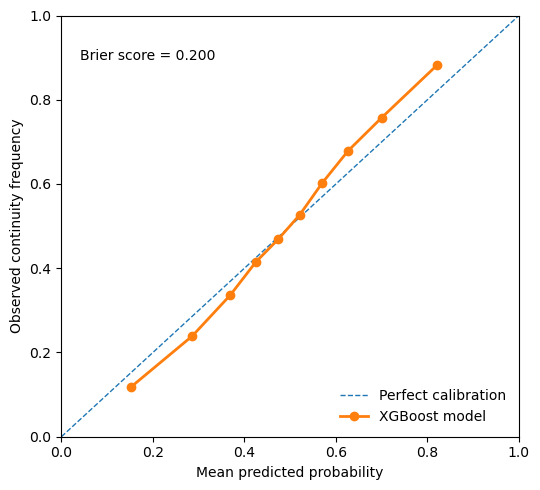

In [20]:
# ------------------------------------------------------------
# SI FIGURE: calibration plot
# ------------------------------------------------------------

fraction_positive, mean_predicted_probability = calibration_curve(
    y_test,
    p_test,
    n_bins=10,
    strategy="quantile",
)

fig, ax = plt.subplots(figsize=(5.5, 5))

ax.plot([0, 1], [0, 1], linestyle="--", linewidth=1, label="Perfect calibration")
ax.plot(
    mean_predicted_probability,
    fraction_positive,
    marker="o",
    linewidth=2,
    label="XGBoost model",
)

ax.set(
    xlabel="Mean predicted probability",
    ylabel="Observed continuity frequency",
    xlim=(0, 1),
    ylim=(0, 1),
)
ax.text(
    0.04,
    0.92,
    f"Brier score = {brier_score_loss(y_test, p_test):.3f}",
    transform=ax.transAxes,
    ha="left",
    va="top",
)
ax.legend(frameon=False)
fig.tight_layout()

save_figure(fig, "calibration_curve_test")
plt.show()


Written: /mnt/eo/EO4Backcasting/_figs/model_performance_gt0729/roc_curve_test.png
Written: /mnt/eo/EO4Backcasting/_figs/model_performance_gt0729/roc_curve_test.pdf


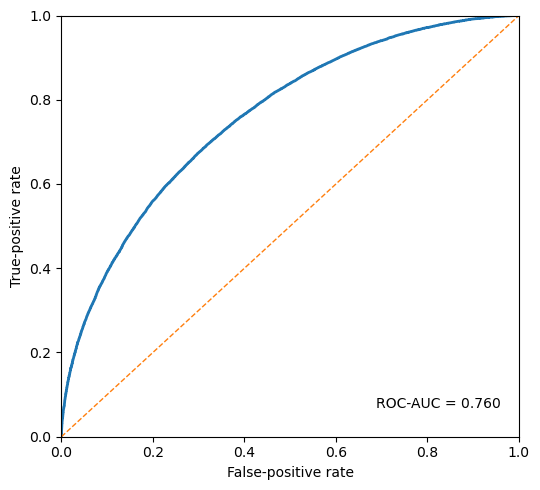

In [21]:
# ------------------------------------------------------------
# SI FIGURE: ROC curve
# ------------------------------------------------------------

false_positive_rate, true_positive_rate, _ = roc_curve(y_test, p_test)
roc_auc = roc_auc_score(y_test, p_test)

fig, ax = plt.subplots(figsize=(5.5, 5))

ax.plot(false_positive_rate, true_positive_rate, linewidth=2)
ax.plot([0, 1], [0, 1], linestyle="--", linewidth=1)

ax.set(
    xlabel="False-positive rate",
    ylabel="True-positive rate",
    xlim=(0, 1),
    ylim=(0, 1),
)
ax.text(
    0.96,
    0.06,
    f"ROC-AUC = {roc_auc:.3f}",
    transform=ax.transAxes,
    ha="right",
    va="bottom",
)
fig.tight_layout()

save_figure(fig, "roc_curve_test")
plt.show()


In [22]:
# ------------------------------------------------------------
# Optional: export sample-level test predictions
# ------------------------------------------------------------

test_predictions = test_df[
    [column for column in ["point_id", "x", "y", TILE_COLUMN, LABEL_COLUMN]
     if column in test_df.columns]
].copy()

test_predictions["predicted_probability"] = p_test
test_predictions["predicted_class"] = y_test_pred

test_predictions.to_csv(
    OUTPUT_DIR / "test_predictions.csv",
    index=False,
)

print(f"All outputs written to: {OUTPUT_DIR}")


All outputs written to: /mnt/eo/EO4Backcasting/_figs/model_performance_gt0729


# 3. SHAP analysis

Global SHAP importance and dependence plots remain properties of the fitted model and do not depend on the binary threshold. Spatial SHAP maps are updated to include pixels with predicted probability ≥ 0.729.


In [23]:
# ============================================================
# SHAP dependence plots + spatial SHAP group maps for XGBoost
# Backcasting model
# ============================================================

import os
from pathlib import Path

import numpy as np
import pandas as pd
import xgboost as xgb

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.lines import Line2D

# Optional, only needed for spatial plotting with country borders
import geopandas as gpd

In [24]:
# ============================================================
# 1. Paths, settings and cache files
# ============================================================

model_fp = Path("/mnt/eo/EO4Backcasting/_models/global/xgb_model_final.json")

# CSV with predictors + coordinates
csv_fp = Path("/mnt/eo/EO4Backcasting/training_data/training_data_stm.csv")

out_dir = Path("/mnt/eo/EO4Backcasting/_figures/shap")
out_dir.mkdir(parents=True, exist_ok=True)

# Cache directory for intermediate products
cache_dir = out_dir / "cache"
cache_dir.mkdir(parents=True, exist_ok=True)

# Main cache files
# df_shap_full.pkl contains predictors, IDs, predictions and all feature-level SHAP values.
# shap_sample_with_group_contributions.csv contains only grouped SHAP outputs and IDs.
# shap_points_europe.gpkg contains the filtered Europe-only spatial SHAP points.
# countries_europe_filtered.gpkg contains the filtered European country geometries used for plotting.
df_shap_cache_fp = cache_dir / "df_shap_full.pkl"
importance_cache_fp = cache_dir / "shap_global_importance.csv"
group_table_cache_fp = cache_dir / "shap_sample_with_group_contributions.csv"
gdf_shap_europe_cache_fp = cache_dir / "shap_points_europe.gpkg"
countries_europe_cache_fp = cache_dir / "countries_europe_filtered.gpkg"

# Set to True only if you want to force recomputation and overwrite existing cache files.
overwrite_cache = False

# Country borders
countries_fp = Path("/mnt/eo/EO4Backcasting/_data/CNTR_RG_10M_2024_3035.gpkg")

# For memory control if SHAP has to be computed again
max_rows_for_shap = 500_000   # use None for all rows, but be careful
random_seed = 42
use_random_sample = True

print("Cache directory:", cache_dir)
print("Overwrite cache:", overwrite_cache)


Cache directory: /mnt/eo/EO4Backcasting/_figures/shap/cache
Overwrite cache: False


In [25]:
# ============================================================
# 2. Load model
# ============================================================

booster = xgb.Booster()
booster.load_model(str(model_fp))

n_model_features = booster.num_features()

print("Model loaded:")
print(model_fp)
print("Number of features expected by model:", n_model_features)

try:
    print("Model feature names:", booster.feature_names)
except Exception:
    print("No feature names stored in model.")

Model loaded:
/mnt/eo/EO4Backcasting/_models/global/xgb_model_final.json
Number of features expected by model: 27
Model feature names: None


In [26]:
# ============================================================
# 3. Read CSV header and define feature columns
# ============================================================

header = pd.read_csv(csv_fp, nrows=0)
all_cols = list(header.columns)

print("Number of CSV columns:", len(all_cols))
print(all_cols)

Number of CSV columns: 65
['point_id', 't0', 'x', 'y', 'tile', 'label_undisturbed_20y', 'NNH', 'ibap_B1_med', 'ibap_B2_med', 'ibap_B3_med', 'ibap_B4_med', 'ibap_B5_med', 'ibap_B6_med', 'nbr_t0', 'nbr_mean', 'nbr_min', 'nbr_max', 'nbr_sd', 'nbr_mad', 'nbr_range', 'nbr_sen_slope', 'source_file', 'biome', 'stm_BLUE_Q10', 'stm_BLUE_Q25', 'stm_BLUE_Q50', 'stm_BLUE_Q75', 'stm_BLUE_Q90', 'stm_BLUE_AVG', 'stm_BLUE_STD', 'stm_GREEN_Q10', 'stm_GREEN_Q25', 'stm_GREEN_Q50', 'stm_GREEN_Q75', 'stm_GREEN_Q90', 'stm_GREEN_AVG', 'stm_GREEN_STD', 'stm_RED_Q10', 'stm_RED_Q25', 'stm_RED_Q50', 'stm_RED_Q75', 'stm_RED_Q90', 'stm_RED_AVG', 'stm_RED_STD', 'stm_NIR_Q10', 'stm_NIR_Q25', 'stm_NIR_Q50', 'stm_NIR_Q75', 'stm_NIR_Q90', 'stm_NIR_AVG', 'stm_NIR_STD', 'stm_SWIR1_Q10', 'stm_SWIR1_Q25', 'stm_SWIR1_Q50', 'stm_SWIR1_Q75', 'stm_SWIR1_Q90', 'stm_SWIR1_AVG', 'stm_SWIR1_STD', 'stm_SWIR2_Q10', 'stm_SWIR2_Q25', 'stm_SWIR2_Q50', 'stm_SWIR2_Q75', 'stm_SWIR2_Q90', 'stm_SWIR2_AVG', 'stm_SWIR2_STD']


In [27]:
# ============================================================
# 4. Define exact model features
# ============================================================
# This must match the feature order used during model training.

STM_BANDS = ["BLUE", "GREEN", "RED", "NIR", "SWIR1", "SWIR2"]
STM_STATS = ["Q10", "Q50", "Q90", "STD"]

feature_cols = [
    f"stm_{band}_{stat}"
    for band in STM_BANDS
    for stat in STM_STATS
] + [
    "nbr_mean",
    "nbr_sd",
    "nbr_sen_slope",
]

print("Number of model features:", len(feature_cols))
print(feature_cols)

missing = [c for c in feature_cols if c not in all_cols]

if missing:
    raise ValueError(f"Missing model feature columns in CSV: {missing}")

assert len(feature_cols) == booster.num_features(), (
    f"Feature mismatch: model expects {booster.num_features()} features, "
    f"but feature_cols has {len(feature_cols)}."
)

print("Feature list matches model feature count.")

Number of model features: 27
['stm_BLUE_Q10', 'stm_BLUE_Q50', 'stm_BLUE_Q90', 'stm_BLUE_STD', 'stm_GREEN_Q10', 'stm_GREEN_Q50', 'stm_GREEN_Q90', 'stm_GREEN_STD', 'stm_RED_Q10', 'stm_RED_Q50', 'stm_RED_Q90', 'stm_RED_STD', 'stm_NIR_Q10', 'stm_NIR_Q50', 'stm_NIR_Q90', 'stm_NIR_STD', 'stm_SWIR1_Q10', 'stm_SWIR1_Q50', 'stm_SWIR1_Q90', 'stm_SWIR1_STD', 'stm_SWIR2_Q10', 'stm_SWIR2_Q50', 'stm_SWIR2_Q90', 'stm_SWIR2_STD', 'nbr_mean', 'nbr_sd', 'nbr_sen_slope']
Feature list matches model feature count.


In [28]:
# ============================================================
# 5. Load existing SHAP table or compute it once
# ============================================================
# This is the expensive part. If df_shap_cache_fp exists, the notebook loads it
# instead of rereading the CSV and recomputing predictions/SHAP values.

shap_feature_cols = [f"shap_{c}" for c in feature_cols]

if df_shap_cache_fp.exists() and not overwrite_cache:
    print("Loading cached full SHAP table:")
    print(df_shap_cache_fp)

    df_shap = pd.read_pickle(df_shap_cache_fp)

    missing_cache_cols = [c for c in feature_cols + shap_feature_cols + ["prediction_probability"] if c not in df_shap.columns]
    if missing_cache_cols:
        raise ValueError(
            "Cached df_shap is missing required columns. "
            f"Either delete the cache or set overwrite_cache=True. Missing: {missing_cache_cols}"
        )

    print("Loaded cached df_shap:", df_shap.shape)

else:
    print("No valid full SHAP cache found. Computing SHAP values now...")

    # --------------------------------------------------------
    # Read only needed columns
    # --------------------------------------------------------
    id_cols = [
        "point_id",
        "t0",
        "x",
        "y",
        "tile",
        "biome",
        "label_undisturbed_20y",
        "source_file",
    ]

    cols_to_read = list(dict.fromkeys(id_cols + feature_cols))
    cols_to_read = [c for c in cols_to_read if c in all_cols]

    print("Columns to read:", len(cols_to_read))
    print(cols_to_read)

    if max_rows_for_shap is None or not use_random_sample:
        df = pd.read_csv(csv_fp, usecols=cols_to_read, nrows=max_rows_for_shap)
    else:
        n_total = sum(1 for _ in open(csv_fp)) - 1
        rng = np.random.default_rng(random_seed)

        if n_total > max_rows_for_shap:
            keep_idx = set(rng.choice(n_total, size=max_rows_for_shap, replace=False))
            df = pd.read_csv(
                csv_fp,
                usecols=cols_to_read,
                skiprows=lambda i: i > 0 and (i - 1) not in keep_idx
            )
        else:
            df = pd.read_csv(csv_fp, usecols=cols_to_read)

    print("Loaded rows:", len(df))

    # --------------------------------------------------------
    # Clean predictor matrix
    # --------------------------------------------------------
    X = df[feature_cols].copy()

    for col in feature_cols:
        X[col] = pd.to_numeric(X[col], errors="coerce")

    X = X.replace([np.inf, -np.inf], np.nan)

    # Remove rows where all predictors are missing.
    valid_rows = ~X.isna().all(axis=1)

    df = df.loc[valid_rows].reset_index(drop=True)
    X = X.loc[valid_rows].reset_index(drop=True)

    print("Rows after cleaning:", len(X))
    print("Number of predictors:", X.shape[1])

    # --------------------------------------------------------
    # Compute predictions and SHAP values
    # --------------------------------------------------------
    # Important: booster.feature_names is None, so do NOT pass feature_names.
    dmat = xgb.DMatrix(X)

    pred_prob = booster.predict(dmat)
    shap_contrib = booster.predict(dmat, pred_contribs=True)

    shap_values = shap_contrib[:, :-1]
    shap_bias = shap_contrib[:, -1]

    print("Prediction shape:", pred_prob.shape)
    print("SHAP values shape:", shap_values.shape)
    print("SHAP bias shape:", shap_bias.shape)

    assert shap_values.shape[1] == len(feature_cols)

    # --------------------------------------------------------
    # Build df_shap
    # --------------------------------------------------------
    shap_df = pd.DataFrame(shap_values, columns=shap_feature_cols)

    df_shap = pd.concat([df.reset_index(drop=True), shap_df], axis=1)
    df_shap["prediction_probability"] = pred_prob
    df_shap["shap_bias"] = shap_bias

    # Save full cache
    df_shap.to_pickle(df_shap_cache_fp)
    print("Saved full SHAP cache:", df_shap_cache_fp)

print("df_shap shape:", df_shap.shape)
df_shap.head()


Loading cached full SHAP table:
/mnt/eo/EO4Backcasting/_figures/shap/cache/df_shap_full.pkl
Loaded cached df_shap: (390987, 64)
df_shap shape: (390987, 64)


,point_id,t0,x,y,tile,label_undisturbed_20y,nbr_mean,nbr_sd,nbr_sen_slope,source_file,biome,stm_BLUE_Q10,stm_BLUE_Q50,stm_BLUE_Q90,stm_BLUE_STD,stm_GREEN_Q10,stm_GREEN_Q50,stm_GREEN_Q90,stm_GREEN_STD,stm_RED_Q10,stm_RED_Q50,stm_RED_Q90,stm_RED_STD,stm_NIR_Q10,stm_NIR_Q50,stm_NIR_Q90,stm_NIR_STD,stm_SWIR1_Q10,stm_SWIR1_Q50,stm_SWIR1_Q90,stm_SWIR1_STD,stm_SWIR2_Q10,stm_SWIR2_Q50,stm_SWIR2_Q90,stm_SWIR2_STD,shap_stm_BLUE_Q10,shap_stm_BLUE_Q50,shap_stm_BLUE_Q90,shap_stm_BLUE_STD,shap_stm_GREEN_Q10,shap_stm_GREEN_Q50,shap_stm_GREEN_Q90,shap_stm_GREEN_STD,shap_stm_RED_Q10,shap_stm_RED_Q50,shap_stm_RED_Q90,shap_stm_RED_STD,shap_stm_NIR_Q10,shap_stm_NIR_Q50,shap_stm_NIR_Q90,shap_stm_NIR_STD,shap_stm_SWIR1_Q10,shap_stm_SWIR1_Q50,shap_stm_SWIR1_Q90,shap_stm_SWIR1_STD,shap_stm_SWIR2_Q10,shap_stm_SWIR2_Q50,shap_stm_SWIR2_Q90,shap_stm_SWIR2_STD,shap_nbr_mean,shap_nbr_sd,shap_nbr_sen_slope,prediction_probability,shap_bias
0,X0001_Y0024_t02005_000002,2005,2.761703e+06,2.399875e+06,X0001_Y0024,0,0.635728,0.071809,0.008583,training_X0001_Y0024_features.csv,Temperate,401.0,419.0,515.0,77.0,714.0,774.0,802.0,56.0,627.0,766.0,811.0,119.0,2300.0,2397.0,3897.0,1119.0,1995.0,2053.0,2056.0,42.0,967.0,1111.0,1119.0,106.0,0.017094,0.110967,0.020412,0.005179,0.102243,0.090531,0.025295,-0.022117,-0.049529,0.101611,-0.027368,-0.001418,-0.048639,-0.081292,0.081205,0.194516,-0.193339,-0.243035,-0.072683,0.050445,0.006267,0.117393,0.008489,-0.014952,-0.069678,-0.113533,-0.335566,0.416522,0.004435
1,X0001_Y0024_t02005_000005,2005,2.761433e+06,2.400565e+06,X0001_Y0024,0,0.667818,0.053973,0.000035,training_X0001_Y0024_features.csv,Temperate,310.0,336.0,361.0,45.0,568.0,600.0,631.0,55.0,609.0,642.0,674.0,57.0,2211.0,2337.0,2463.0,222.0,1402.0,1450.0,1497.0,83.0,806.0,821.0,835.0,25.0,0.036569,0.044384,0.014945,0.011832,0.043292,-0.002258,-0.007689,-0.015853,-0.123695,0.000894,-0.028749,-0.019395,-0.080050,-0.058888,-0.059738,-0.128056,0.036859,0.144187,0.077490,0.063404,0.052036,0.075443,-0.023304,0.005275,-0.037491,-0.166561,0.180622,0.509984,0.004435
2,X0001_Y0024_t02005_000010,2005,2.762033e+06,2.402725e+06,X0001_Y0024,0,0.772283,0.018525,0.002059,training_X0001_Y0024_features.csv,Temperate,172.0,243.0,823.0,446.0,398.0,399.0,860.0,333.0,314.0,419.0,747.0,282.0,2209.0,2649.0,3311.0,693.0,1134.0,1367.0,1428.0,194.0,524.0,576.0,632.0,67.0,0.001778,-0.060666,0.032077,-0.143445,-0.018278,0.011597,0.073006,0.075841,-0.161439,-0.067228,-0.068535,0.001425,-0.199554,-0.052041,-0.059999,0.003442,0.033408,0.101554,0.097149,0.049584,-0.017418,-0.050769,-0.041596,-0.019542,-0.847432,0.192589,0.067680,0.256855,0.004435
3,X0001_Y0024_t02005_000011,2005,2.761913e+06,2.400625e+06,X0001_Y0024,0,0.671501,0.056128,-0.004569,training_X0001_Y0024_features.csv,Temperate,254.0,280.0,306.0,45.0,383.0,399.0,415.0,27.0,429.0,429.0,429.0,0.0,2165.0,2213.0,2260.0,83.0,1194.0,1388.0,1582.0,342.0,583.0,717.0,851.0,236.0,0.002664,-0.007118,0.013274,0.018824,0.009871,0.004761,-0.041447,0.026555,-0.104822,-0.055780,0.024897,-0.023746,-0.091542,-0.090123,0.016657,-0.128644,0.046689,0.080894,0.031069,-0.055639,-0.002413,-0.037519,-0.025112,0.024568,-0.048381,-0.187399,0.325253,0.433086,0.004435
4,X0001_Y0024_t02005_000012,2005,2.762033e+06,2.403265e+06,X0001_Y0024,0,0.745330,0.034705,0.007719,training_X0001_Y0024_features.csv,Temperate,214.0,222.0,430.0,152.0,497.0,513.0,588.0,60.0,396.0,468.0,666.0,174.0,2155.0,2495.0,3512.0,882.0,1793.0,1795.0,1817.0,16.0,715.0,876.0,952.0,151.0,-0.000390,-0.073319,0.015841,0.017299,-0.027477,-0.034153,-0.010180,-0.053006,-0.163713,-0.022510,-0.059268,-0.006918,-0.110028,-0.040200,-0.024496,0.152296,-0.065414,-0.037000,0.030839,0.068937,0.003343,0.027753,-0.037713,-0.046736,-0.577405,-0.058242,-0.533700,0.159611,0.004435


In [29]:
# ============================================================
# 6. Load existing global SHAP importance or compute from df_shap
# ============================================================

if importance_cache_fp.exists() and not overwrite_cache:
    print("Loading cached SHAP importance:")
    print(importance_cache_fp)
    importance_df = pd.read_csv(importance_cache_fp)
else:
    print("Computing SHAP importance from df_shap...")

    mean_abs_shap = df_shap[shap_feature_cols].abs().mean(axis=0).to_numpy()

    importance_df = (
        pd.DataFrame({
            "feature": feature_cols,
            "mean_abs_shap": mean_abs_shap,
        })
        .sort_values("mean_abs_shap", ascending=False)
        .reset_index(drop=True)
    )

    importance_df.to_csv(importance_cache_fp, index=False)
    print("Saved SHAP importance cache:", importance_cache_fp)

importance_df


Loading cached SHAP importance:
/mnt/eo/EO4Backcasting/_figures/shap/cache/shap_global_importance.csv


,feature,mean_abs_shap
0,nbr_sen_slope,0.265597
1,nbr_mean,0.257257
2,stm_SWIR1_Q90,0.148558
3,nbr_sd,0.147948
4,stm_SWIR1_Q50,0.127455
5,stm_RED_Q10,0.118806
6,stm_NIR_Q10,0.108887
7,stm_NIR_Q50,0.097827
8,stm_NIR_STD,0.085922
9,stm_SWIR1_STD,0.072798


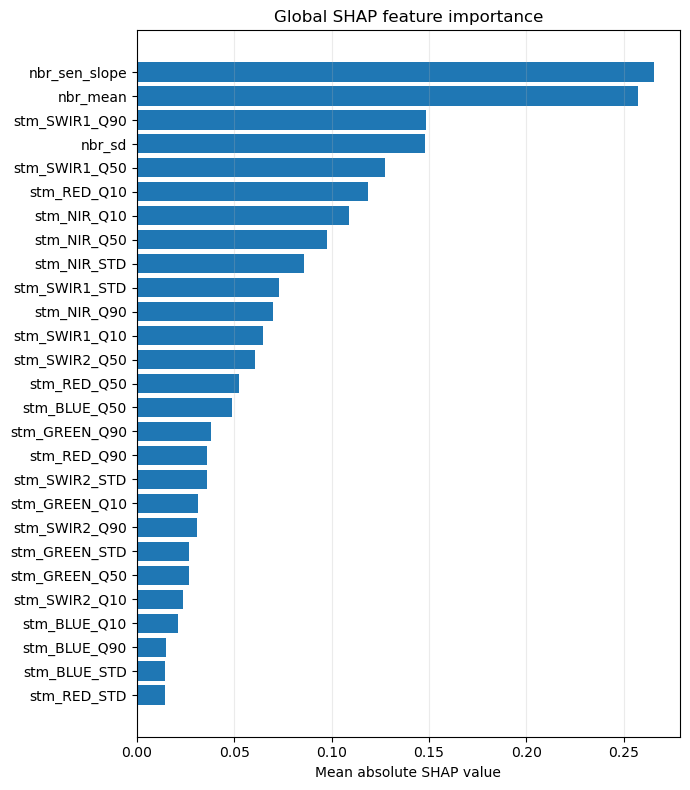

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_global_feature_importance.png


In [30]:
# ============================================================
# 10. Plot global SHAP feature importance
# ============================================================

top_n = 27
imp_plot = importance_df.head(top_n).iloc[::-1]

fig, ax = plt.subplots(figsize=(7, 8))

ax.barh(
    imp_plot["feature"],
    imp_plot["mean_abs_shap"]
)

ax.set_xlabel("Mean absolute SHAP value")
ax.set_ylabel("")
ax.set_title("Global SHAP feature importance")
ax.grid(axis="x", alpha=0.25)

plt.tight_layout()

out_fp = out_dir / "shap_global_feature_importance.png"
fig.savefig(out_fp, dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

print("Saved:", out_fp)

In [31]:
# ============================================================
# 11. SHAP dependence plot function
# ============================================================

def plot_shap_dependence(
    df_shap,
    feature,
    color_feature="prediction_probability",
    sample_n=150_000,
    out_dir=out_dir
):
    shap_col = f"shap_{feature}"

    needed_cols = [feature, shap_col]

    if color_feature is not None and color_feature in df_shap.columns:
        needed_cols.append(color_feature)

    plot_df = df_shap[needed_cols].copy()
    plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
    plot_df = plot_df.dropna(subset=[feature, shap_col])

    if len(plot_df) > sample_n:
        plot_df = plot_df.sample(sample_n, random_state=42)

    fig, ax = plt.subplots(figsize=(6.4, 4.8))

    if color_feature is not None and color_feature in plot_df.columns:
        sc = ax.scatter(
            plot_df[feature],
            plot_df[shap_col],
            c=plot_df[color_feature],
            s=4,
            alpha=0.35,
            linewidths=0
        )

        cbar = plt.colorbar(sc, ax=ax)
        cbar.set_label(color_feature)

    else:
        ax.scatter(
            plot_df[feature],
            plot_df[shap_col],
            s=4,
            alpha=0.35,
            linewidths=0
        )

    ax.axhline(
        0,
        color="black",
        linewidth=0.8,
        linestyle="--",
        alpha=0.7
    )

    ax.set_xlabel(feature)
    ax.set_ylabel(f"SHAP value for {feature}")
    ax.set_title(f"SHAP dependence: {feature}")
    ax.grid(alpha=0.2)

    plt.tight_layout()

    suffix = f"_colored_by_{color_feature}" if color_feature else ""
    out_fp = out_dir / f"shap_dependence_{feature}{suffix}.png"

    fig.savefig(out_fp, dpi=300, bbox_inches="tight", facecolor="white")
    plt.show()

    print("Saved:", out_fp)

In [32]:
# ============================================================
# 12. Select features for dependence plots
# ============================================================
# These are the most relevant ones for your backcasting story.

selected_features = [
    "nbr_sen_slope",
    "nbr_mean",
    "nbr_sd",
    "stm_NIR_Q50",
    "stm_SWIR1_Q50",
    "stm_SWIR2_Q50",
    "stm_NIR_STD",
    "stm_SWIR1_STD",
    "stm_SWIR2_STD",
]

# Keep only features that exist.
selected_features = [f for f in selected_features if f in feature_cols]

print(selected_features)

['nbr_sen_slope', 'nbr_mean', 'nbr_sd', 'stm_NIR_Q50', 'stm_SWIR1_Q50', 'stm_SWIR2_Q50', 'stm_NIR_STD', 'stm_SWIR1_STD', 'stm_SWIR2_STD']


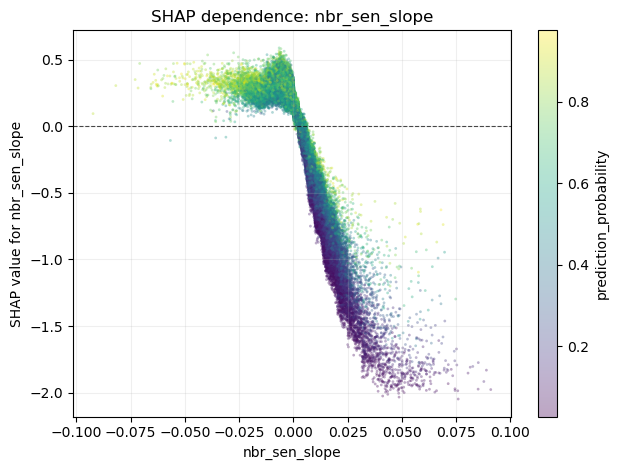

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_nbr_sen_slope_colored_by_prediction_probability.png


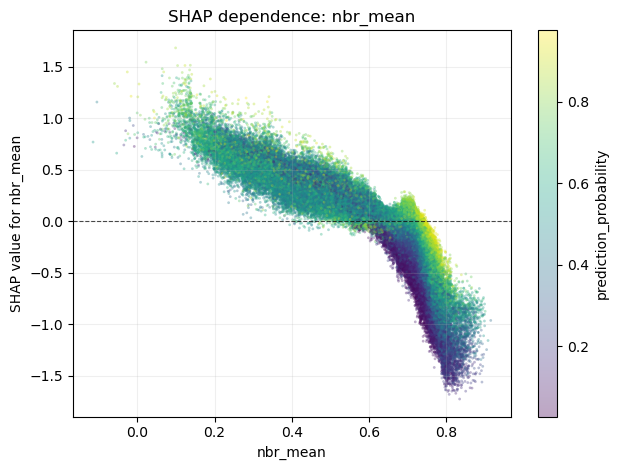

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_nbr_mean_colored_by_prediction_probability.png


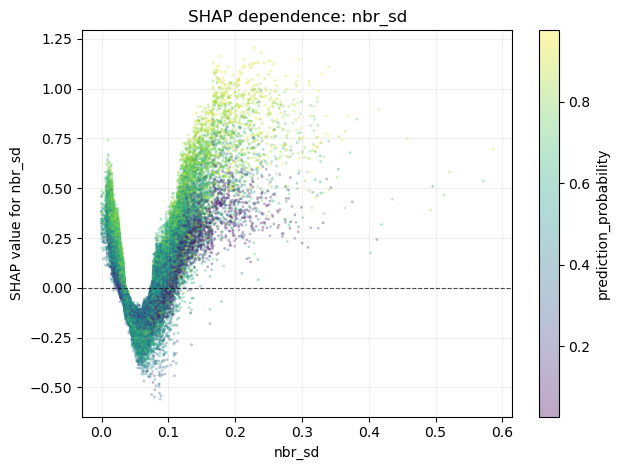

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_nbr_sd_colored_by_prediction_probability.png


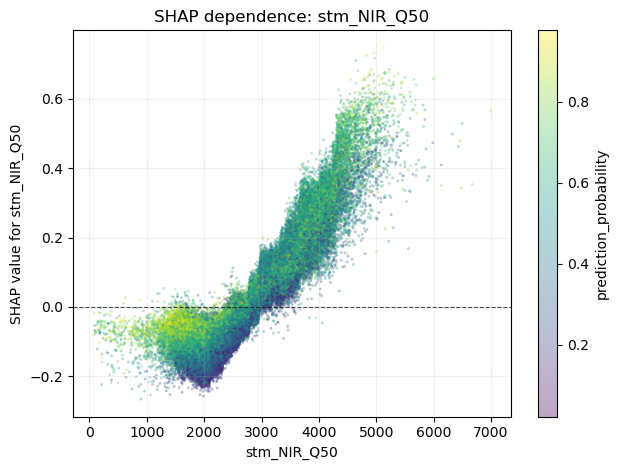

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_NIR_Q50_colored_by_prediction_probability.png


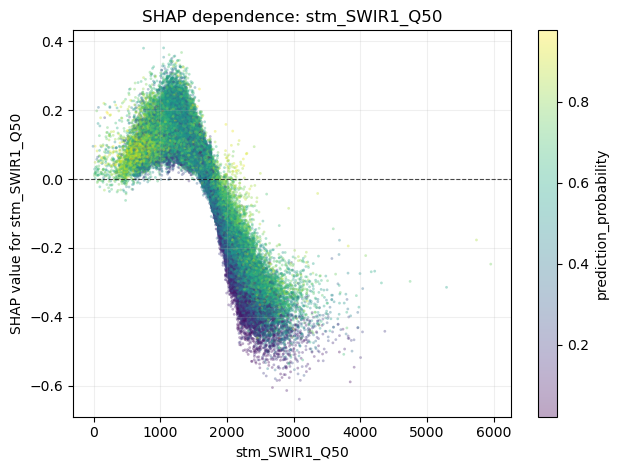

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_SWIR1_Q50_colored_by_prediction_probability.png


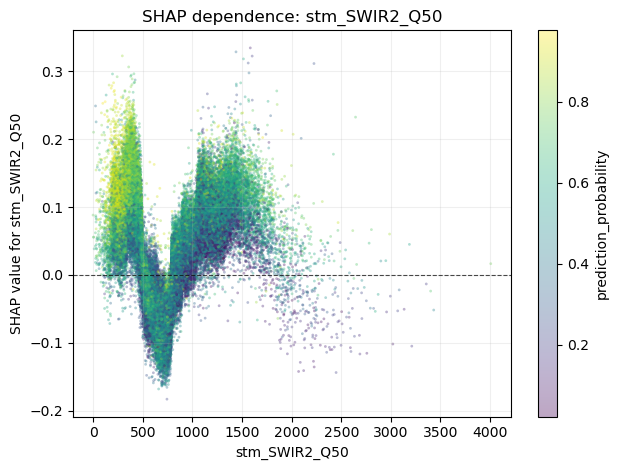

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_SWIR2_Q50_colored_by_prediction_probability.png


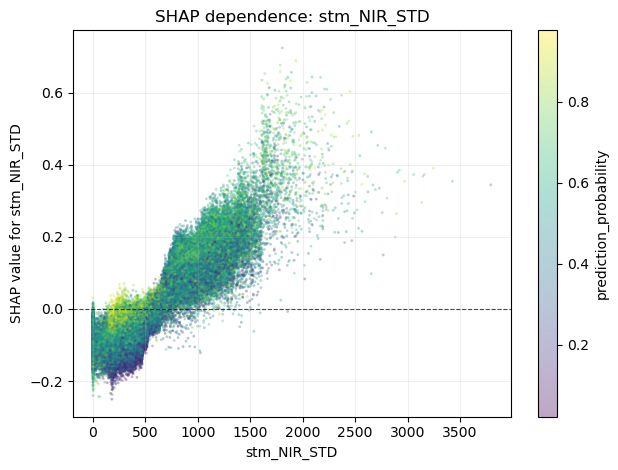

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_NIR_STD_colored_by_prediction_probability.png


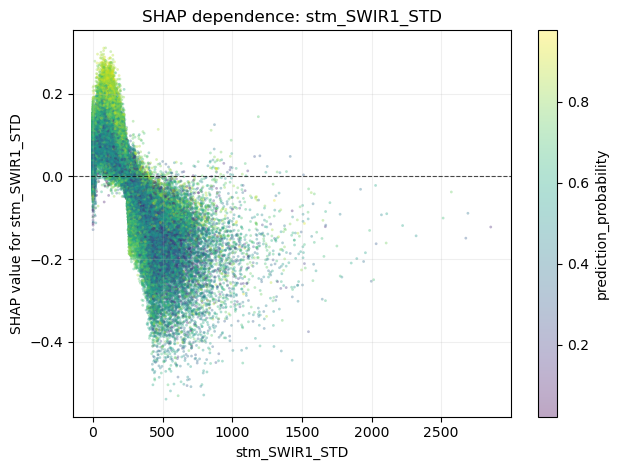

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_SWIR1_STD_colored_by_prediction_probability.png


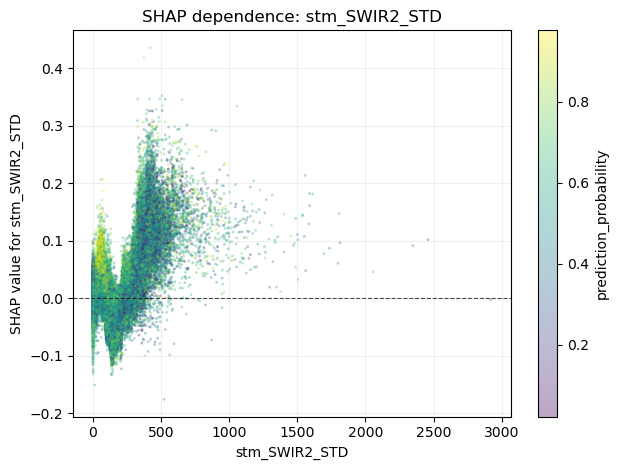

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_SWIR2_STD_colored_by_prediction_probability.png


In [33]:
# ============================================================
# 13. Make dependence plots
# ============================================================

for feat in selected_features:
    plot_shap_dependence(
        df_shap=df_shap,
        feature=feat,
        color_feature="prediction_probability",
        sample_n=150_000,
        out_dir=out_dir
    )

Top SHAP features:
['nbr_sen_slope', 'nbr_mean', 'stm_SWIR1_Q90', 'nbr_sd', 'stm_SWIR1_Q50', 'stm_RED_Q10', 'stm_NIR_Q10', 'stm_NIR_Q50']


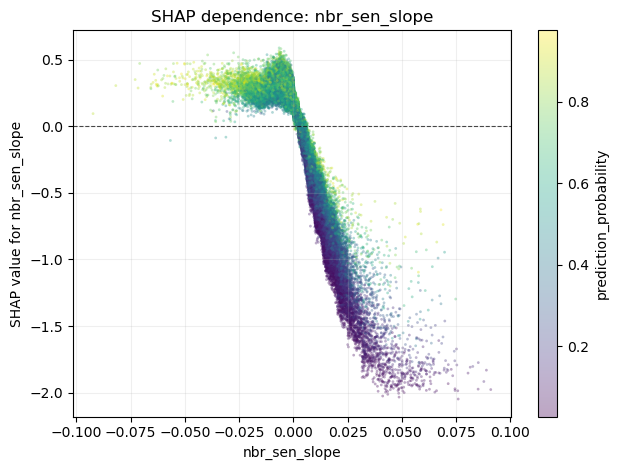

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_nbr_sen_slope_colored_by_prediction_probability.png


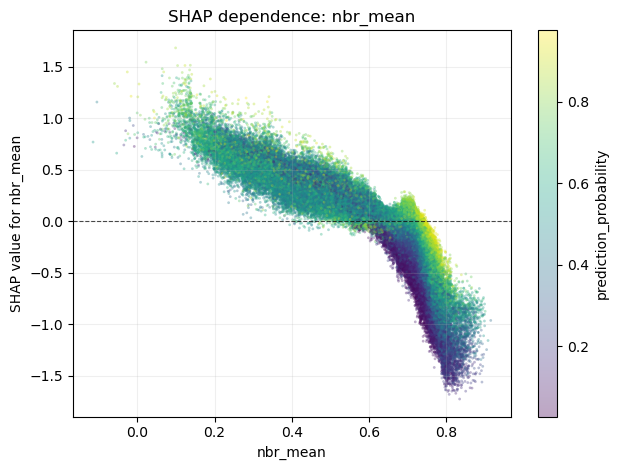

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_nbr_mean_colored_by_prediction_probability.png


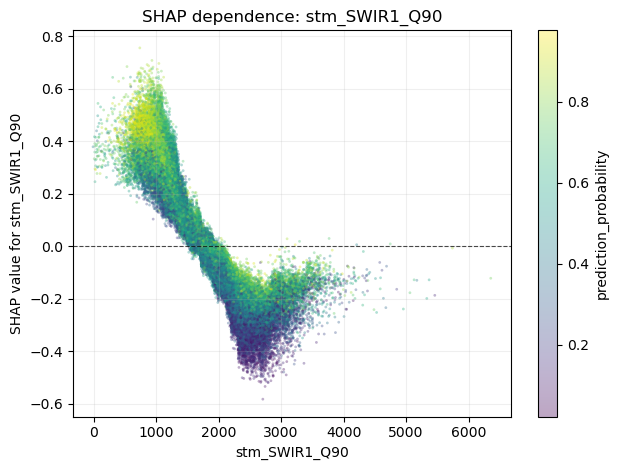

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_SWIR1_Q90_colored_by_prediction_probability.png


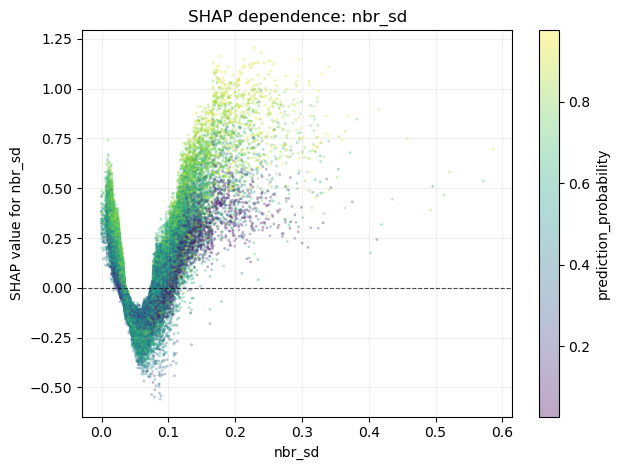

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_nbr_sd_colored_by_prediction_probability.png


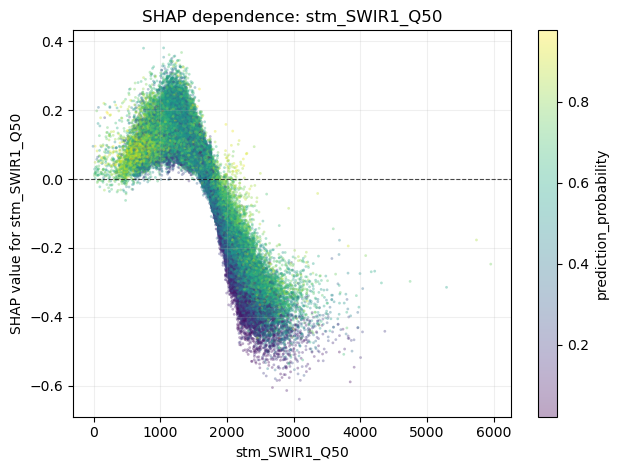

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_SWIR1_Q50_colored_by_prediction_probability.png


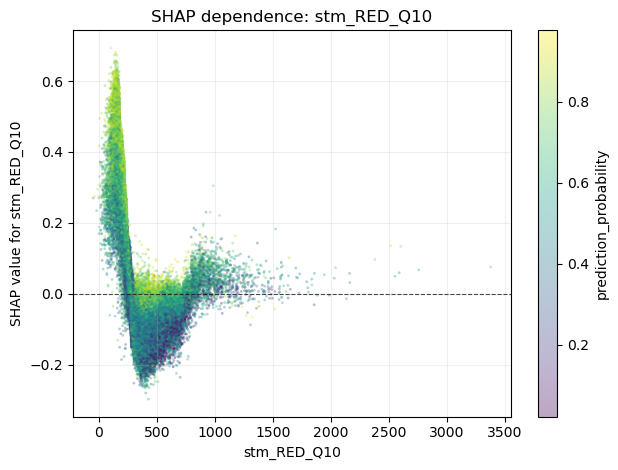

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_RED_Q10_colored_by_prediction_probability.png


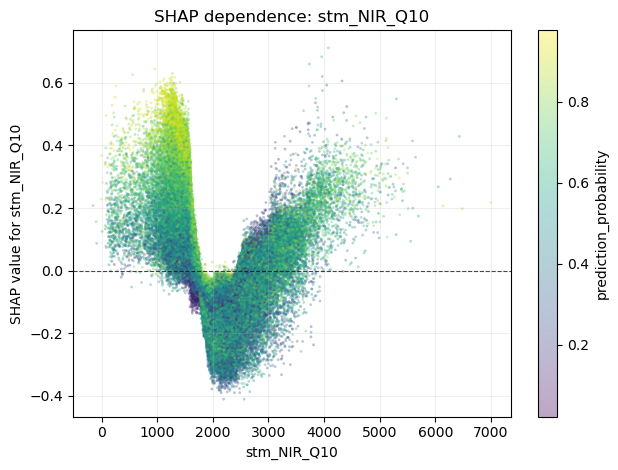

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_NIR_Q10_colored_by_prediction_probability.png


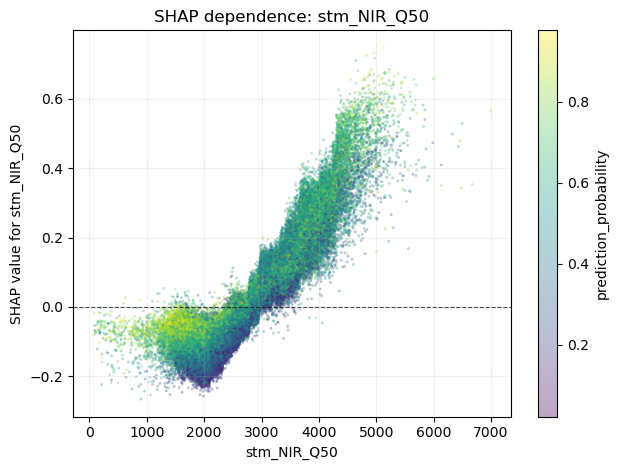

Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_stm_NIR_Q50_colored_by_prediction_probability.png


In [34]:
# ============================================================
# 14. Optional: dependence plots for top SHAP features
# ============================================================

top_features = importance_df["feature"].head(8).tolist()

print("Top SHAP features:")
print(top_features)

for feat in top_features:
    plot_shap_dependence(
        df_shap=df_shap,
        feature=feat,
        color_feature="prediction_probability",
        sample_n=150_000,
        out_dir=out_dir
    )

Top SHAP features:
['nbr_sen_slope', 'nbr_mean', 'stm_SWIR1_Q90', 'nbr_sd', 'stm_SWIR1_Q50', 'stm_RED_Q10', 'stm_NIR_Q10', 'stm_NIR_Q50']
Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_top8_custom_labels.png


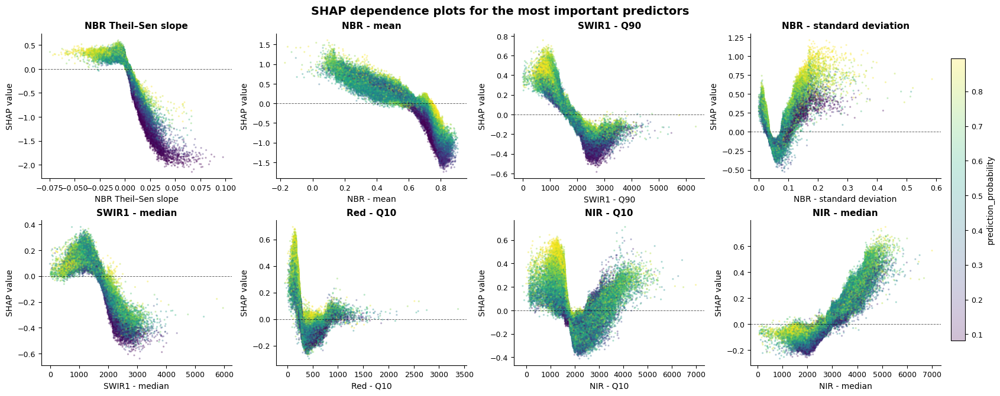

In [35]:
# ============================================================
# 14. SHAP dependence plots for top features with custom labels
#     Multi-panel figure
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

out_dir = Path(out_dir)
out_dir.mkdir(parents=True, exist_ok=True)

top_features = importance_df["feature"].head(8).tolist()

print("Top SHAP features:")
print(top_features)

# ------------------------------------------------------------
# Custom labels
# Adapt this dictionary to your feature names
# ------------------------------------------------------------

feature_labels = {    
    "nbr_t0": "NBR at t₀",
    "nbr_mean": "NBR - mean",
    "nbr_min": "NBR - minimum",
    "nbr_max": "NBR - maximum",
    "nbr_sd": "NBR - standard deviation",
    "nbr_mad": "NBR - median absolute deviation",
    "nbr_range": "NBR - range",
    "nbr_sen_slope": "NBR Theil–Sen slope",
    
    "stm_BLUE_Q10": "Blue - Q10",
    "stm_BLUE_Q25": "Blue - Q25",
    "stm_BLUE_Q50": "Blue - median",
    "stm_BLUE_Q75": "Blue - Q75",
    "stm_BLUE_Q90": "Blue - Q90",
    "stm_BLUE_AVG": "Blue - mean",
    "stm_BLUE_STD": "Blue - standard deviation",

    "stm_GREEN_Q10": "Green - Q10",
    "stm_GREEN_Q25": "Green - Q25",
    "stm_GREEN_Q50": "Green - median",
    "stm_GREEN_Q75": "Green - Q75",
    "stm_GREEN_Q90": "Green - Q90",
    "stm_GREEN_AVG": "Green - mean",
    "stm_GREEN_STD": "Green - standard deviation",

    "stm_RED_Q10": "Red - Q10",
    "stm_RED_Q25": "Red - Q25",
    "stm_RED_Q50": "Red - median",
    "stm_RED_Q75": "Red - Q75",
    "stm_RED_Q90": "Red - Q90",
    "stm_RED_AVG": "Red - mean",
    "stm_RED_STD": "Red - standard deviation",

    "stm_NIR_Q10": "NIR - Q10",
    "stm_NIR_Q25": "NIR - Q25",
    "stm_NIR_Q50": "NIR - median",
    "stm_NIR_Q75": "NIR - Q75",
    "stm_NIR_Q90": "NIR - Q90",
    "stm_NIR_AVG": "NIR - mean",
    "stm_NIR_STD": "NIR - standard deviation",

    "stm_SWIR1_Q10": "SWIR1 - Q10",
    "stm_SWIR1_Q25": "SWIR1 - Q25",
    "stm_SWIR1_Q50": "SWIR1 - median",
    "stm_SWIR1_Q75": "SWIR1 - Q75",
    "stm_SWIR1_Q90": "SWIR1 - Q90",
    "stm_SWIR1_AVG": "SWIR1 - mean",
    "stm_SWIR1_STD": "SWIR1 - standard deviation",

    "stm_SWIR2_Q10": "SWIR2 - Q10",
    "stm_SWIR2_Q25": "SWIR2 - Q25",
    "stm_SWIR2_Q50": "SWIR2 - median",
    "stm_SWIR2_Q75": "SWIR2 - Q75",
    "stm_SWIR2_Q90": "SWIR2 - Q90",
    "stm_SWIR2_AVG": "SWIR2 - mean",
    "stm_SWIR2_STD": "SWIR2 - standard deviation",
}

# Falls ein Feature nicht im Dictionary steht, wird automatisch der Originalname verwendet
def nice_label(x):
    return feature_labels.get(x, x)


# ------------------------------------------------------------
# Plot function
# ------------------------------------------------------------

def plot_shap_dependence_grid(
    df_shap,
    features,
    color_feature="prediction_probability",
    sample_n=150_000,
    ncols=4,
    out_fp=None,
    point_size=2,
    alpha=0.25
):
    """
    Multi-panel SHAP dependence plot.
    
    Requires df_shap to contain:
    - each feature column, e.g. stm_NIR_Q50
    - corresponding SHAP columns named shap_<feature>, e.g. shap_stm_NIR_Q50
    - color_feature column, e.g. prediction_probability
    """

    # --------------------------------------------------------
    # Check required columns
    # --------------------------------------------------------

    missing = []

    for feat in features:
        shap_col = f"shap_{feat}"
        if feat not in df_shap.columns:
            missing.append(feat)
        if shap_col not in df_shap.columns:
            missing.append(shap_col)

    if color_feature not in df_shap.columns:
        missing.append(color_feature)

    if missing:
        raise ValueError(
            "Missing columns in df_shap:\n" + "\n".join(sorted(set(missing)))
        )

    # --------------------------------------------------------
    # Sample data
    # --------------------------------------------------------

    plot_cols = []
    for feat in features:
        plot_cols.extend([feat, f"shap_{feat}"])
    plot_cols.append(color_feature)

    df_plot = df_shap[plot_cols].replace([np.inf, -np.inf], np.nan).dropna()

    if sample_n is not None and len(df_plot) > sample_n:
        df_plot = df_plot.sample(sample_n, random_state=42)

    # --------------------------------------------------------
    # Figure layout
    # --------------------------------------------------------

    n_features = len(features)
    nrows = int(np.ceil(n_features / ncols))

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(4.2 * ncols, 3.3 * nrows),
        constrained_layout=True
    )

    axes = np.array(axes).reshape(-1)

    # Common color scale
    cmin = df_plot[color_feature].quantile(0.01)
    cmax = df_plot[color_feature].quantile(0.99)

    scatter_ref = None

    for i, feat in enumerate(features):
        ax = axes[i]
        shap_col = f"shap_{feat}"

        x = df_plot[feat]
        y = df_plot[shap_col]
        c = df_plot[color_feature]

        scatter_ref = ax.scatter(
            x,
            y,
            c=c,
            s=point_size,
            alpha=alpha,
            vmin=cmin,
            vmax=cmax,
            rasterized=True
        )

        ax.axhline(
            0,
            color="black",
            linewidth=0.7,
            linestyle="--",
            alpha=0.6
        )

        ax.set_title(
            nice_label(feat),
            fontsize=11,
            fontweight="bold"
        )

        ax.set_xlabel(nice_label(feat), fontsize=10)
        ax.set_ylabel("SHAP value", fontsize=10)

        ax.tick_params(axis="both", labelsize=9)

        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

    # Remove empty axes
    for j in range(n_features, len(axes)):
        axes[j].axis("off")

    # Shared colorbar
    cbar = fig.colorbar(
        scatter_ref,
        ax=axes[:n_features],
        shrink=0.85,
        pad=0.01
    )
    cbar.set_label(nice_label(color_feature), fontsize=10)
    cbar.ax.tick_params(labelsize=9)

    fig.suptitle(
        "SHAP dependence plots for the most important predictors",
        fontsize=14,
        fontweight="bold"
    )

    if out_fp is not None:
        fig.savefig(out_fp, dpi=300, bbox_inches="tight", facecolor="white")
        print("Saved:", out_fp)

    plt.show()

    return fig


# ------------------------------------------------------------
# Run plot
# ------------------------------------------------------------

out_fp = out_dir / "shap_dependence_top8_custom_labels.png"

fig = plot_shap_dependence_grid(
    df_shap=df_shap,
    features=top_features,
    color_feature="prediction_probability",
    sample_n=150_000,
    ncols=4,
    out_fp=out_fp,
    point_size=2,
    alpha=0.25
)

Top SHAP features:
['nbr_sen_slope', 'nbr_mean', 'stm_SWIR1_Q90', 'nbr_sd', 'stm_SWIR1_Q50', 'stm_RED_Q10', 'stm_NIR_Q10', 'stm_NIR_Q50']
Plotting points: 150,000
Shared y-axis limits: -1.641, 1.101
Color scale limits: 0.083, 0.894
Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_top8_custom_labels_shared_yaxis_better_colors.png


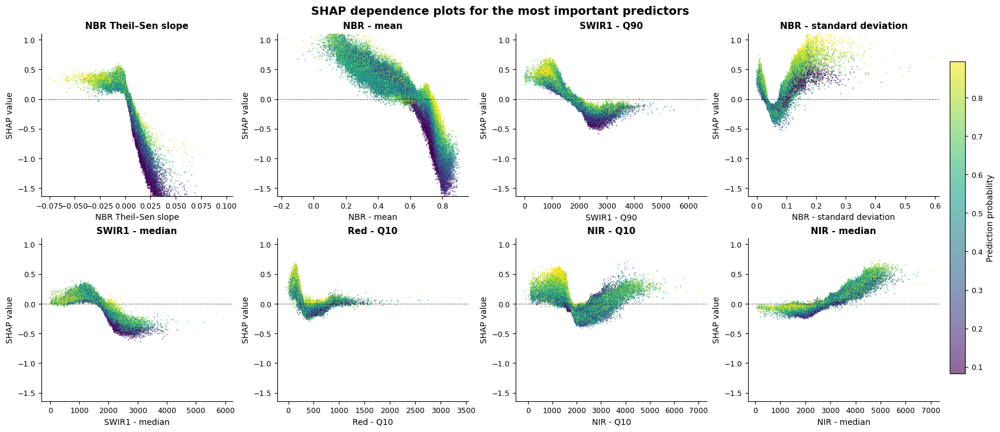

In [36]:
# ============================================================
# 14. SHAP dependence plots for top features with custom labels
#     Multi-panel figure with shared y-axis limits
#     + better colorbar / point color consistency
#     + more vertical space
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.colors import Normalize

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

out_dir = Path(out_dir)
out_dir.mkdir(parents=True, exist_ok=True)

top_features = importance_df["feature"].head(8).tolist()

print("Top SHAP features:")
print(top_features)

# ------------------------------------------------------------
# Custom labels
# Adapt this dictionary to your feature names
# ------------------------------------------------------------

feature_labels = {    
    "nbr_t0": "NBR at t₀",
    "nbr_mean": "NBR - mean",
    "nbr_min": "NBR - minimum",
    "nbr_max": "NBR - maximum",
    "nbr_sd": "NBR - standard deviation",
    "nbr_mad": "NBR - median absolute deviation",
    "nbr_range": "NBR - range",
    "nbr_sen_slope": "NBR Theil–Sen slope",
    
    "stm_BLUE_Q10": "Blue - Q10",
    "stm_BLUE_Q25": "Blue - Q25",
    "stm_BLUE_Q50": "Blue - median",
    "stm_BLUE_Q75": "Blue - Q75",
    "stm_BLUE_Q90": "Blue - Q90",
    "stm_BLUE_AVG": "Blue - mean",
    "stm_BLUE_STD": "Blue - standard deviation",

    "stm_GREEN_Q10": "Green - Q10",
    "stm_GREEN_Q25": "Green - Q25",
    "stm_GREEN_Q50": "Green - median",
    "stm_GREEN_Q75": "Green - Q75",
    "stm_GREEN_Q90": "Green - Q90",
    "stm_GREEN_AVG": "Green - mean",
    "stm_GREEN_STD": "Green - standard deviation",

    "stm_RED_Q10": "Red - Q10",
    "stm_RED_Q25": "Red - Q25",
    "stm_RED_Q50": "Red - median",
    "stm_RED_Q75": "Red - Q75",
    "stm_RED_Q90": "Red - Q90",
    "stm_RED_AVG": "Red - mean",
    "stm_RED_STD": "Red - standard deviation",

    "stm_NIR_Q10": "NIR - Q10",
    "stm_NIR_Q25": "NIR - Q25",
    "stm_NIR_Q50": "NIR - median",
    "stm_NIR_Q75": "NIR - Q75",
    "stm_NIR_Q90": "NIR - Q90",
    "stm_NIR_AVG": "NIR - mean",
    "stm_NIR_STD": "NIR - standard deviation",

    "stm_SWIR1_Q10": "SWIR1 - Q10",
    "stm_SWIR1_Q25": "SWIR1 - Q25",
    "stm_SWIR1_Q50": "SWIR1 - median",
    "stm_SWIR1_Q75": "SWIR1 - Q75",
    "stm_SWIR1_Q90": "SWIR1 - Q90",
    "stm_SWIR1_AVG": "SWIR1 - mean",
    "stm_SWIR1_STD": "SWIR1 - standard deviation",

    "stm_SWIR2_Q10": "SWIR2 - Q10",
    "stm_SWIR2_Q25": "SWIR2 - Q25",
    "stm_SWIR2_Q50": "SWIR2 - median",
    "stm_SWIR2_Q75": "SWIR2 - Q75",
    "stm_SWIR2_Q90": "SWIR2 - Q90",
    "stm_SWIR2_AVG": "SWIR2 - mean",
    "stm_SWIR2_STD": "SWIR2 - standard deviation",

    "prediction_probability": "Prediction probability",
}

def nice_label(x):
    return feature_labels.get(x, x)


# ------------------------------------------------------------
# Plot function
# ------------------------------------------------------------

def plot_shap_dependence_grid(
    df_shap,
    features,
    color_feature="prediction_probability",
    sample_n=150_000,
    ncols=4,
    out_fp=None,
    point_size=2.5,
    alpha=0.60,
    cmap="viridis",
    y_limits="quantile",       # "quantile" oder "full"
    y_quantile_low=0.01,
    y_quantile_high=0.99,
    y_pad_fraction=0.12,
    color_quantile_low=0.01,
    color_quantile_high=0.99
):
    """
    Multi-panel SHAP dependence plot with:
    - shared y-axis limits
    - explicit colormap
    - colorbar based on the same norm and cmap as the scatter points
    
    Requires df_shap to contain:
    - each feature column, e.g. stm_NIR_Q50
    - corresponding SHAP columns named shap_<feature>, e.g. shap_stm_NIR_Q50
    - color_feature column, e.g. prediction_probability

    y_limits:
    - "quantile": uses y_quantile_low / y_quantile_high across all SHAP columns.
    - "full": uses full min/max across all SHAP columns.
    """

    # --------------------------------------------------------
    # Check required columns
    # --------------------------------------------------------

    missing = []

    for feat in features:
        shap_col = f"shap_{feat}"
        if feat not in df_shap.columns:
            missing.append(feat)
        if shap_col not in df_shap.columns:
            missing.append(shap_col)

    if color_feature not in df_shap.columns:
        missing.append(color_feature)

    if missing:
        raise ValueError(
            "Missing columns in df_shap:\n" + "\n".join(sorted(set(missing)))
        )

    # --------------------------------------------------------
    # Prepare plotting data
    # --------------------------------------------------------

    plot_cols = []
    for feat in features:
        plot_cols.extend([feat, f"shap_{feat}"])
    plot_cols.append(color_feature)

    df_plot = (
        df_shap[plot_cols]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    if sample_n is not None and len(df_plot) > sample_n:
        df_plot = df_plot.sample(sample_n, random_state=42)

    print(f"Plotting points: {len(df_plot):,}")

    # --------------------------------------------------------
    # Shared y-axis limits
    # --------------------------------------------------------

    shap_cols = [f"shap_{feat}" for feat in features]

    if y_limits == "quantile":
        y_min = df_plot[shap_cols].quantile(y_quantile_low).min()
        y_max = df_plot[shap_cols].quantile(y_quantile_high).max()

    elif y_limits == "full":
        y_min = df_plot[shap_cols].min().min()
        y_max = df_plot[shap_cols].max().max()

    else:
        raise ValueError("y_limits must be either 'quantile' or 'full'.")

    y_pad = y_pad_fraction * (y_max - y_min)
    y_min -= y_pad
    y_max += y_pad

    print(f"Shared y-axis limits: {y_min:.3f}, {y_max:.3f}")

    # --------------------------------------------------------
    # Shared color scale
    # --------------------------------------------------------

    cmin = df_plot[color_feature].quantile(color_quantile_low)
    cmax = df_plot[color_feature].quantile(color_quantile_high)

    norm = Normalize(vmin=cmin, vmax=cmax)

    print(f"Color scale limits: {cmin:.3f}, {cmax:.3f}")

    # --------------------------------------------------------
    # Figure layout
    # --------------------------------------------------------

    n_features = len(features)
    nrows = int(np.ceil(n_features / ncols))

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(4.2 * ncols, 3.6 * nrows),
        constrained_layout=True
    )

    fig.patch.set_facecolor("white")

    axes = np.array(axes).reshape(-1)

    scatter_ref = None

    for i, feat in enumerate(features):
        ax = axes[i]
        shap_col = f"shap_{feat}"

        x = df_plot[feat]
        y = df_plot[shap_col]
        c = df_plot[color_feature]

        ax.set_facecolor("white")

        scatter_ref = ax.scatter(
            x,
            y,
            c=c,
            cmap=cmap,
            norm=norm,
            s=point_size,
            alpha=alpha,
            edgecolors="none",
            rasterized=True
        )

        ax.axhline(
            0,
            color="black",
            linewidth=0.7,
            linestyle="--",
            alpha=0.6
        )

        ax.set_ylim(y_min, y_max)

        ax.set_title(
            nice_label(feat),
            fontsize=11,
            fontweight="bold"
        )

        ax.set_xlabel(nice_label(feat), fontsize=10)
        ax.set_ylabel("SHAP value", fontsize=10)

        ax.tick_params(axis="both", labelsize=9)

        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

    # --------------------------------------------------------
    # Remove empty axes
    # --------------------------------------------------------

    for j in range(n_features, len(axes)):
        axes[j].axis("off")

    # --------------------------------------------------------
    # Shared colorbar
    # --------------------------------------------------------

    cbar = fig.colorbar(
        scatter_ref,
        ax=axes[:n_features],
        shrink=0.85,
        pad=0.01
    )

    cbar.set_label(nice_label(color_feature), fontsize=10)
    cbar.ax.tick_params(labelsize=9)

    # --------------------------------------------------------
    # Title
    # --------------------------------------------------------

    fig.suptitle(
        "SHAP dependence plots for the most important predictors",
        fontsize=14,
        fontweight="bold"
    )

    # --------------------------------------------------------
    # Save
    # --------------------------------------------------------

    if out_fp is not None:
        fig.savefig(out_fp, dpi=300, bbox_inches="tight", facecolor="white")
        print("Saved:", out_fp)

    plt.show()

    return fig


# ------------------------------------------------------------
# Run plot
# ------------------------------------------------------------

out_fp = out_dir / "shap_dependence_top8_custom_labels_shared_yaxis_better_colors.png"

fig = plot_shap_dependence_grid(
    df_shap=df_shap,
    features=top_features,
    color_feature="prediction_probability",
    sample_n=150_000,
    ncols=4,
    out_fp=out_fp,
    point_size=2.5,
    alpha=0.60,
    cmap="viridis",
    y_limits="quantile",
    y_pad_fraction=0.12,
    color_quantile_low=0.01,
    color_quantile_high=0.99
)

SHAP features plotted:
['nbr_sen_slope', 'nbr_mean', 'nbr_sd', 'stm_RED_Q10', 'stm_NIR_Q10', 'stm_NIR_Q50', 'stm_SWIR1_Q50', 'stm_SWIR1_Q90']
Plotting points: 150,000
Shared y-axis limits: -1.641, 1.101
Color scale limits: 0.083, 0.894
Saved: /mnt/eo/EO4Backcasting/_figures/shap/shap_dependence_big_labels.png
File exists: True
File size MB: 3.38
PNG check: OK


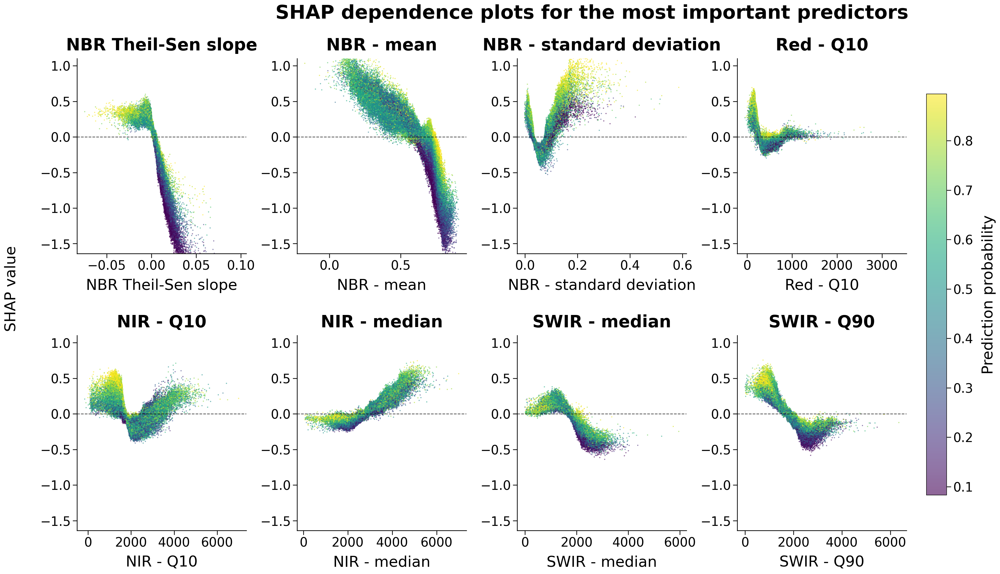

In [40]:
# ============================================================
# SHAP dependence plots for manuscript
# Large labels, fixed feature order, robust PNG export
# ============================================================

import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.colors import Normalize
from PIL import Image

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

out_dir = Path(out_dir)
out_dir.mkdir(parents=True, exist_ok=True)

top_features = [
    "nbr_sen_slope",
    "nbr_mean",
    "nbr_sd",
    "stm_RED_Q10",
    "stm_NIR_Q10",
    "stm_NIR_Q50",
    "stm_SWIR1_Q50",
    "stm_SWIR1_Q90",
]

print("SHAP features plotted:")
print(top_features)

# ------------------------------------------------------------
# Custom labels
# ------------------------------------------------------------

feature_labels = {
    "nbr_t0": "NBR at t0",
    "nbr_mean": "NBR - mean",
    "nbr_min": "NBR - minimum",
    "nbr_max": "NBR - maximum",
    "nbr_sd": "NBR - standard deviation",
    "nbr_mad": "NBR - median absolute deviation",
    "nbr_range": "NBR - range",
    "nbr_sen_slope": "NBR Theil-Sen slope",

    "stm_BLUE_Q10": "Blue - Q10",
    "stm_BLUE_Q25": "Blue - Q25",
    "stm_BLUE_Q50": "Blue - median",
    "stm_BLUE_Q75": "Blue - Q75",
    "stm_BLUE_Q90": "Blue - Q90",
    "stm_BLUE_AVG": "Blue - mean",
    "stm_BLUE_STD": "Blue - standard deviation",

    "stm_GREEN_Q10": "Green - Q10",
    "stm_GREEN_Q25": "Green - Q25",
    "stm_GREEN_Q50": "Green - median",
    "stm_GREEN_Q75": "Green - Q75",
    "stm_GREEN_Q90": "Green - Q90",
    "stm_GREEN_AVG": "Green - mean",
    "stm_GREEN_STD": "Green - standard deviation",

    "stm_RED_Q10": "Red - Q10",
    "stm_RED_Q25": "Red - Q25",
    "stm_RED_Q50": "Red - median",
    "stm_RED_Q75": "Red - Q75",
    "stm_RED_Q90": "Red - Q90",
    "stm_RED_AVG": "Red - mean",
    "stm_RED_STD": "Red - standard deviation",

    "stm_NIR_Q10": "NIR - Q10",
    "stm_NIR_Q25": "NIR - Q25",
    "stm_NIR_Q50": "NIR - median",
    "stm_NIR_Q75": "NIR - Q75",
    "stm_NIR_Q90": "NIR - Q90",
    "stm_NIR_AVG": "NIR - mean",
    "stm_NIR_STD": "NIR - standard deviation",

    "stm_SWIR1_Q10": "SWIR - Q10",
    "stm_SWIR1_Q25": "SWIR - Q25",
    "stm_SWIR1_Q50": "SWIR - median",
    "stm_SWIR1_Q75": "SWIR - Q75",
    "stm_SWIR1_Q90": "SWIR - Q90",
    "stm_SWIR1_AVG": "SWIR - mean",
    "stm_SWIR1_STD": "SWIR - standard deviation",

    "stm_SWIR2_Q10": "SWIR2 - Q10",
    "stm_SWIR2_Q25": "SWIR2 - Q25",
    "stm_SWIR2_Q50": "SWIR2 - median",
    "stm_SWIR2_Q75": "SWIR2 - Q75",
    "stm_SWIR2_Q90": "SWIR2 - Q90",
    "stm_SWIR2_AVG": "SWIR2 - mean",
    "stm_SWIR2_STD": "SWIR2 - standard deviation",

    "prediction_probability": "Prediction probability",
}


def nice_label(x):
    return feature_labels.get(x, x)


# ------------------------------------------------------------
# Plot function
# ------------------------------------------------------------

def plot_shap_dependence_grid(
    df_shap,
    features,
    color_feature="prediction_probability",
    sample_n=150_000,
    ncols=4,
    out_fp=None,
    point_size=4.0,
    alpha=0.60,
    cmap="viridis",
    y_limits="quantile",
    y_quantile_low=0.01,
    y_quantile_high=0.99,
    y_pad_fraction=0.12,
    color_quantile_low=0.01,
    color_quantile_high=0.99
):

    # --------------------------------------------------------
    # Check required columns
    # --------------------------------------------------------

    missing = []

    for feat in features:
        shap_col = f"shap_{feat}"

        if feat not in df_shap.columns:
            missing.append(feat)

        if shap_col not in df_shap.columns:
            missing.append(shap_col)

    if color_feature not in df_shap.columns:
        missing.append(color_feature)

    if missing:
        raise ValueError(
            "Missing columns in df_shap:\n"
            + "\n".join(sorted(set(missing)))
        )

    # --------------------------------------------------------
    # Prepare plotting data
    # --------------------------------------------------------

    plot_cols = []

    for feat in features:
        plot_cols.extend([feat, f"shap_{feat}"])

    plot_cols.append(color_feature)

    df_plot = (
        df_shap[plot_cols]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    if sample_n is not None and len(df_plot) > sample_n:
        df_plot = df_plot.sample(
            sample_n,
            random_state=42
        )

    print(f"Plotting points: {len(df_plot):,}")

    # --------------------------------------------------------
    # Shared y-axis limits
    # --------------------------------------------------------

    shap_cols = [f"shap_{feat}" for feat in features]

    if y_limits == "quantile":
        y_min = (
            df_plot[shap_cols]
            .quantile(y_quantile_low)
            .min()
        )

        y_max = (
            df_plot[shap_cols]
            .quantile(y_quantile_high)
            .max()
        )

    elif y_limits == "full":
        y_min = df_plot[shap_cols].min().min()
        y_max = df_plot[shap_cols].max().max()

    else:
        raise ValueError(
            "y_limits must be either 'quantile' or 'full'."
        )

    y_pad = y_pad_fraction * (y_max - y_min)

    y_min -= y_pad
    y_max += y_pad

    print(f"Shared y-axis limits: {y_min:.3f}, {y_max:.3f}")

    # --------------------------------------------------------
    # Shared color scale
    # --------------------------------------------------------

    cmin = df_plot[color_feature].quantile(
        color_quantile_low
    )

    cmax = df_plot[color_feature].quantile(
        color_quantile_high
    )

    norm = Normalize(
        vmin=cmin,
        vmax=cmax
    )

    print(f"Color scale limits: {cmin:.3f}, {cmax:.3f}")

    # --------------------------------------------------------
    # Figure layout
    # --------------------------------------------------------

    n_features = len(features)
    nrows = int(np.ceil(n_features / ncols))

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(28, 14),
        dpi=150
    )

    fig.patch.set_facecolor("white")

    axes = np.array(axes).reshape(-1)

    fig.subplots_adjust(
        left=0.075,
        right=0.90,
        bottom=0.10,
        top=0.88,
        wspace=0.30,
        hspace=0.42
    )

    scatter_ref = None

    # --------------------------------------------------------
    # Font sizes
    # --------------------------------------------------------

    subplot_title_size = 28
    axis_label_size = 25
    tick_label_size = 21
    colorbar_label_size = 25
    colorbar_tick_size = 21
    main_title_size = 32

    # --------------------------------------------------------
    # Panels
    # --------------------------------------------------------

    for i, feat in enumerate(features):

        ax = axes[i]

        shap_col = f"shap_{feat}"

        x = df_plot[feat]
        y = df_plot[shap_col]
        c = df_plot[color_feature]

        ax.set_facecolor("white")

        scatter_ref = ax.scatter(
            x,
            y,
            c=c,
            cmap=cmap,
            norm=norm,
            s=point_size,
            alpha=alpha,
            edgecolors="none"
        )

        ax.axhline(
            0,
            color="black",
            linewidth=1.2,
            linestyle="--",
            alpha=0.7
        )

        ax.set_ylim(
            y_min,
            y_max
        )

        ax.set_title(
            nice_label(feat),
            fontsize=subplot_title_size,
            fontweight="bold",
            pad=14
        )

        ax.set_xlabel(
            nice_label(feat),
            fontsize=axis_label_size,
            labelpad=10
        )

        # No individual y-axis label for each subplot
        ax.set_ylabel("")

        ax.tick_params(
            axis="both",
            which="major",
            labelsize=tick_label_size,
            length=7,
            width=1.2
        )

        for spine in ["top", "right"]:
            ax.spines[spine].set_visible(False)

        for spine in ["left", "bottom"]:
            ax.spines[spine].set_linewidth(1.2)

    # --------------------------------------------------------
    # Shared y-axis label
    # --------------------------------------------------------

    fig.supylabel(
        "SHAP value",
        fontsize=axis_label_size,
        x=0.015
    )

    # --------------------------------------------------------
    # Remove empty axes
    # --------------------------------------------------------

    for j in range(n_features, len(axes)):
        axes[j].axis("off")

    # --------------------------------------------------------
    # Shared colorbar
    # --------------------------------------------------------

    cbar = fig.colorbar(
        scatter_ref,
        ax=axes[:n_features],
        shrink=0.85,
        pad=0.02
    )

    cbar.set_label(
        nice_label(color_feature),
        fontsize=colorbar_label_size,
        labelpad=14
    )

    cbar.ax.tick_params(
        labelsize=colorbar_tick_size,
        length=7,
        width=1.2
    )

    # --------------------------------------------------------
    # Main title
    # --------------------------------------------------------

    fig.suptitle(
        "SHAP dependence plots for the most important predictors",
        fontsize=main_title_size,
        fontweight="bold",
        y=0.97
    )

    # --------------------------------------------------------
    # Save robustly
    # --------------------------------------------------------

    if out_fp is not None:

        out_fp = Path(out_fp)

        fig.savefig(
            out_fp,
            dpi=300,
            facecolor="white",
            edgecolor="white",
            format="png"
        )

        print("Saved:", out_fp)
        print("File exists:", out_fp.exists())
        print(
            "File size MB:",
            round(out_fp.stat().st_size / 1024 / 1024, 2)
        )

        try:
            with Image.open(out_fp) as img:
                img.verify()

            print("PNG check: OK")

        except Exception as e:
            print("PNG check failed:", e)

    plt.show()

    return fig


# ------------------------------------------------------------
# Run plot
# ------------------------------------------------------------

out_fp = out_dir / "shap_dependence_big_labels.png"

fig = plot_shap_dependence_grid(
    df_shap=df_shap,
    features=top_features,
    color_feature="prediction_probability",
    sample_n=150_000,
    ncols=4,
    out_fp=out_fp,
    point_size=4.0,
    alpha=0.60,
    cmap="viridis",
    y_limits="quantile",
    y_pad_fraction=0.12,
    color_quantile_low=0.01,
    color_quantile_high=0.99
)

plt.close(fig)

In [41]:
# ============================================================
# 15. Define SHAP feature groups
# ============================================================
# This grouping separates:
# - NBR dynamics after t0
# - within-year spectral variability
# - spectral level in visible / NIR / SWIR bands

def assign_feature_group(feature_name):
    f = feature_name.lower()

    if f.startswith("nbr_"):
        return "Post-1985 NBR dynamics"
    elif f.endswith("_std"):
        return "Within-year spectral variability"
    elif "swir1" in f or "swir2" in f:
        return "SWIR spectral level"
    elif "nir" in f:
        return "NIR spectral level"
    elif "blue" in f or "green" in f or "red" in f:
        return "Visible spectral level"
    else:
        return "Other"


feature_groups = pd.DataFrame({
    "feature": feature_cols,
    "group": [assign_feature_group(f) for f in feature_cols]
})

feature_groups

,feature,group
0,stm_BLUE_Q10,Visible spectral level
1,stm_BLUE_Q50,Visible spectral level
2,stm_BLUE_Q90,Visible spectral level
3,stm_BLUE_STD,Within-year spectral variability
4,stm_GREEN_Q10,Visible spectral level
5,stm_GREEN_Q50,Visible spectral level
6,stm_GREEN_Q90,Visible spectral level
7,stm_GREEN_STD,Within-year spectral variability
8,stm_RED_Q10,Visible spectral level
9,stm_RED_Q50,Visible spectral level


In [42]:
# ============================================================
# 16. Check feature grouping
# ============================================================

feature_groups.groupby("group")["feature"].apply(list)

group
NIR spectral level                            [stm_NIR_Q10, stm_NIR_Q50, stm_NIR_Q90]
Post-1985 NBR dynamics                              [nbr_mean, nbr_sd, nbr_sen_slope]
SWIR spectral level                 [stm_SWIR1_Q10, stm_SWIR1_Q50, stm_SWIR1_Q90, ...
Visible spectral level              [stm_BLUE_Q10, stm_BLUE_Q50, stm_BLUE_Q90, stm...
Within-year spectral variability    [stm_BLUE_STD, stm_GREEN_STD, stm_RED_STD, stm...
Name: feature, dtype: object

In [43]:
# ============================================================
# 17. Aggregate SHAP values by group
# ============================================================

group_names = feature_groups["group"].unique().tolist()

for group in group_names:
    group_features = feature_groups.loc[
        feature_groups["group"] == group,
        "feature"
    ].tolist()

    group_shap_cols = [f"shap_{f}" for f in group_features]

    df_shap[f"shap_group_{group}"] = df_shap[group_shap_cols].sum(axis=1)

group_shap_cols = [f"shap_group_{g}" for g in group_names]

print(group_shap_cols)

['shap_group_Visible spectral level', 'shap_group_Within-year spectral variability', 'shap_group_NIR spectral level', 'shap_group_SWIR spectral level', 'shap_group_Post-1985 NBR dynamics']


In [44]:
# ============================================================
# 18. Dominant positive SHAP group per point
# ============================================================
# This shows which feature group most strongly supports
# high forest-continuity probability at each location.

group_values = df_shap[group_shap_cols].to_numpy()

max_idx = np.argmax(group_values, axis=1)
max_val = np.max(group_values, axis=1)

dominant_group = np.array(group_names, dtype=object)[max_idx]
dominant_group[max_val <= 0] = "No positive contribution"

df_shap["dominant_positive_shap_group"] = dominant_group
df_shap["dominant_positive_shap_value"] = max_val

df_shap["dominant_positive_shap_group"].value_counts()

dominant_positive_shap_group
Post-1985 NBR dynamics              121250
SWIR spectral level                 113391
NIR spectral level                   52827
Visible spectral level               48546
Within-year spectral variability     38218
No positive contribution             16755
Name: count, dtype: int64

In [45]:
# ============================================================
# 19. Dominant negative SHAP group per point
# ============================================================
# This shows which feature group most strongly pushes predictions
# away from high forest-continuity probability.

min_idx = np.argmin(group_values, axis=1)
min_val = np.min(group_values, axis=1)

dominant_negative_group = np.array(group_names, dtype=object)[min_idx]
dominant_negative_group[min_val >= 0] = "No negative contribution"

df_shap["dominant_negative_shap_group"] = dominant_negative_group
df_shap["dominant_negative_shap_value"] = min_val

df_shap["dominant_negative_shap_group"].value_counts()

dominant_negative_shap_group
SWIR spectral level                 109393
Post-1985 NBR dynamics              106704
NIR spectral level                   72399
Visible spectral level               52319
Within-year spectral variability     29112
No negative contribution             21060
Name: count, dtype: int64

In [46]:
# ============================================================
# Save grouped SHAP table as CSV if it does not already exist
# ============================================================
# This table is lighter than df_shap_full.pkl because it keeps only IDs,
# prediction probability and grouped SHAP outputs.

keep_cols = [
    c for c in [
        "point_id",
        "t0",
        "x",
        "y",
        "tile",
        "biome",
        "label_undisturbed_20y",
        "prediction_probability",
        "dominant_positive_shap_group",
        "dominant_positive_shap_value",
        "dominant_negative_shap_group",
        "dominant_negative_shap_value",
    ]
    if c in df_shap.columns
]

keep_cols += group_shap_cols

if group_table_cache_fp.exists() and not overwrite_cache:
    print("Grouped SHAP table already exists, not overwriting:")
    print(group_table_cache_fp)
else:
    df_shap[keep_cols].to_csv(group_table_cache_fp, index=False)
    print("Saved grouped SHAP table:", group_table_cache_fp)


Grouped SHAP table already exists, not overwriting:
/mnt/eo/EO4Backcasting/_figures/shap/cache/shap_sample_with_group_contributions.csv


In [47]:
# ============================================================
# Load existing Europe-only spatial SHAP data or create it once
# ============================================================
# If shap_points_europe.gpkg and countries_europe_filtered.gpkg exist,
# they are loaded directly. Otherwise the Europe filter is applied and saved.

from shapely.geometry import box

if (
    gdf_shap_europe_cache_fp.exists()
    and countries_europe_cache_fp.exists()
    and not overwrite_cache
):
    print("Loading cached Europe-only SHAP points:")
    print(gdf_shap_europe_cache_fp)

    gdf_shap = gpd.read_file(gdf_shap_europe_cache_fp, layer="shap_points_europe")
    countries = gpd.read_file(countries_europe_cache_fp, layer="countries_europe")

    print("Loaded Europe-only SHAP rows:", len(gdf_shap))
    print("Loaded European country polygons:", len(countries))

else:
    print("No valid Europe-only spatial cache found. Creating spatial data now...")

    # --------------------------------------------------------
    # Convert SHAP table to GeoDataFrame
    # --------------------------------------------------------
    if "x" not in df_shap.columns or "y" not in df_shap.columns:
        raise ValueError("Spatial SHAP maps require x and y columns.")

    gdf_shap = gpd.GeoDataFrame(
        df_shap.copy(),
        geometry=gpd.points_from_xy(df_shap["x"], df_shap["y"]),
        crs="EPSG:3035"
    )

    print("SHAP rows before spatial filtering:", len(gdf_shap))
    print("SHAP CRS:", gdf_shap.crs)

    # --------------------------------------------------------
    # European country list and mainland bbox
    # --------------------------------------------------------
    european_countries = [
        "Albania", "Andorra", "Austria", "Belarus", "Belgium",
        "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Czechia",
        "Denmark", "Estonia", "Finland", "France", "Germany",
        "Greece", "Hungary", "Ireland", "Italy", "Kosovo", "Latvia",
        "Liechtenstein", "Lithuania", "Luxembourg", "Moldova", "Monaco",
        "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
        "Portugal", "Romania", "San Marino", "Serbia", "Slovakia",
        "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine",
        "United Kingdom", "Vatican"
    ]

    # Mainland Europe extent in lon/lat.
    # Use xmax=45 if you want to keep the full eastern Ukraine.
    mainland_bbox_4326 = box(-11, 34, 45, 72)

    # --------------------------------------------------------
    # Load country polygons
    # --------------------------------------------------------
    if countries_fp is None or not Path(countries_fp).exists():
        raise FileNotFoundError(
            "countries_fp is missing. Set countries_fp to a valid European country boundary file."
        )

    countries_raw = gpd.read_file(countries_fp)

    print("Country columns:")
    print(countries_raw.columns.tolist())

    possible_name_cols = [
        "NAME_ENGL",  # common in Eurostat CNTR files
        "NAME", "NAME_EN", "ADMIN", "SOVEREIGNT", "name", "name_en",
        "country", "CNTR_NAME", "NAME_LONG"
    ]

    name_col = None
    for col in possible_name_cols:
        if col in countries_raw.columns:
            name_col = col
            break

    if name_col is None:
        raise ValueError(
            "Could not detect country-name column. "
            "Inspect countries_raw.columns and set name_col manually."
        )

    print("Using country-name column:", name_col)

    # --------------------------------------------------------
    # Filter in EPSG:4326 and remove overseas territories
    # --------------------------------------------------------
    countries_4326 = countries_raw.to_crs("EPSG:4326")

    countries_4326 = countries_4326[
        countries_4326[name_col].isin(european_countries)
    ].copy()

    print("Countries after name filter:", countries_4326[name_col].nunique())
    print(sorted(countries_4326[name_col].unique()))

    # Clip to mainland Europe bbox. This removes overseas parts inside multipolygons.
    countries_4326["geometry"] = countries_4326.geometry.intersection(mainland_bbox_4326)
    countries_4326 = countries_4326[~countries_4326.geometry.is_empty].copy()

    # Explode multipolygons and remove tiny fragments/slivers
    countries_4326 = countries_4326.explode(index_parts=False).reset_index(drop=True)

    countries = countries_4326.to_crs("EPSG:3035")
    countries["area_km2"] = countries.geometry.area / 1e6

    min_area_km2 = 50
    countries = countries[countries["area_km2"] >= min_area_km2].copy()

    print("European country polygons after bbox/sliver filter:", len(countries))

    # --------------------------------------------------------
    # Spatially filter SHAP points to European countries
    # --------------------------------------------------------
    if gdf_shap.crs != countries.crs:
        gdf_shap = gdf_shap.to_crs(countries.crs)

    gdf_shap = gpd.sjoin(
        gdf_shap,
        countries[["geometry"]],
        how="inner",
        predicate="within"
    ).drop(columns=["index_right"])

    print("SHAP rows after European spatial filter:", len(gdf_shap))

    # Keep df_shap consistent if used later
    df_shap = pd.DataFrame(gdf_shap.drop(columns="geometry")).copy()

    # --------------------------------------------------------
    # Save spatial cache
    # --------------------------------------------------------
    gdf_shap.to_file(
        gdf_shap_europe_cache_fp,
        layer="shap_points_europe",
        driver="GPKG"
    )

    countries.to_file(
        countries_europe_cache_fp,
        layer="countries_europe",
        driver="GPKG"
    )

    print("Saved Europe-only SHAP points:", gdf_shap_europe_cache_fp)
    print("Saved filtered European countries:", countries_europe_cache_fp)

print("Final Europe-only SHAP rows:", len(gdf_shap))
print("Final country polygons:", len(countries))


Loading cached Europe-only SHAP points:
/mnt/eo/EO4Backcasting/_figures/shap/cache/shap_points_europe.gpkg
Loaded Europe-only SHAP rows: 379431
Loaded European country polygons: 176
Final Europe-only SHAP rows: 379431
Final country polygons: 176


In [48]:
# ============================================================
# Rename SHAP group labels for cleaner legend
# ============================================================

group_rename = {
    "SWIR spectral level": "SWIR reflectance",
    "NIR spectral level": "NIR reflectance",
    "Visible spectral level": "Visible reflectance",
}

for col in [
    "dominant_positive_shap_group",
    "dominant_negative_shap_group",
]:
    if col in gdf_shap.columns:
        gdf_shap[col] = gdf_shap[col].replace(group_rename)

if "dominant_positive_shap_group" in df_shap.columns:
    df_shap["dominant_positive_shap_group"] = df_shap[
        "dominant_positive_shap_group"
    ].replace(group_rename)

if "dominant_negative_shap_group" in df_shap.columns:
    df_shap["dominant_negative_shap_group"] = df_shap[
        "dominant_negative_shap_group"
    ].replace(group_rename)

High-probability rows: 42807
dominant_positive_shap_group
SWIR reflectance                    17587
Recovery proxy (NBR trend)          16004
Visible reflectance                  5662
NIR reflectance                      2767
Within-year spectral variability      787
Name: count, dtype: int64


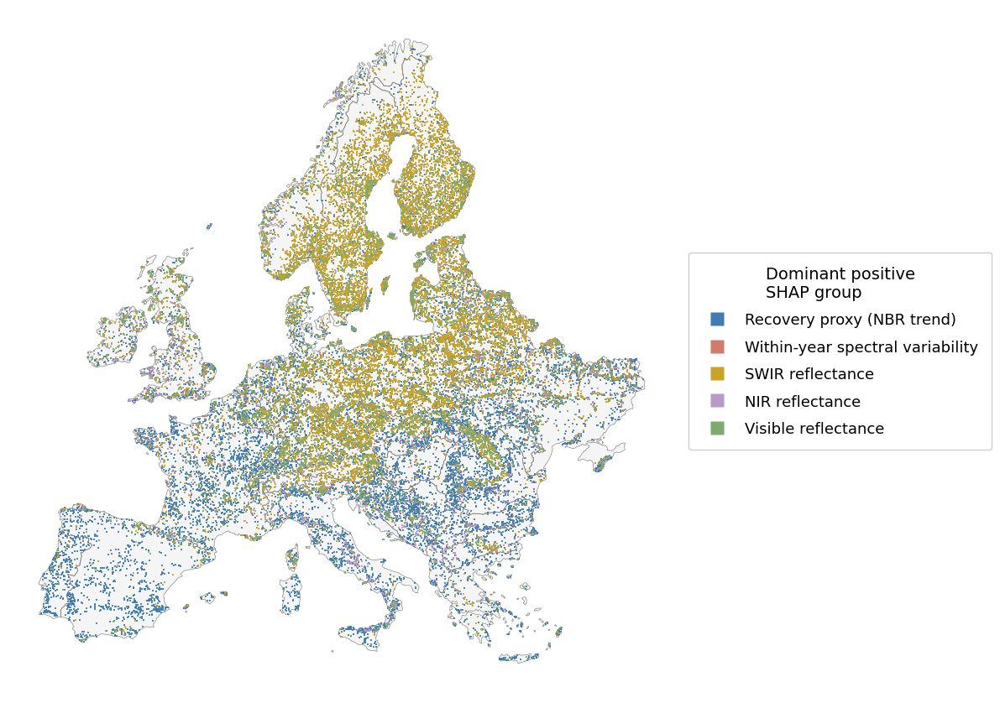

Saved: /mnt/eo/EO4Backcasting/_figures/shap/spatial_dominant_positive_shap_group_prob_ge_0p729_final_labels_right_legend.png


In [50]:
# ============================================================
# Spatial map only for high-probability forests
# better visible version + final renamed labels + legend on right
# ============================================================

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

prob_threshold = 0.729
show_no_positive = False

marker_size = 4
marker_alpha = 0.90

# ------------------------------------------------------------
# Rename SHAP group labels for cleaner legend
# ------------------------------------------------------------

group_rename = {
    "Post-1985 NBR dynamics": "Recovery proxy (NBR trend)",
    "SWIR spectral level": "SWIR reflectance",
    "NIR spectral level": "NIR reflectance",
    "Visible spectral level": "Visible reflectance",
}

for col in ["dominant_positive_shap_group", "dominant_negative_shap_group"]:
    if col in gdf_shap.columns:
        gdf_shap[col] = gdf_shap[col].replace(group_rename)

# ------------------------------------------------------------
# Subset high-probability forests
# ------------------------------------------------------------

gdf_high = gdf_shap[
    gdf_shap["prediction_probability"] >= prob_threshold
].copy()

if not show_no_positive:
    gdf_high = gdf_high[
        gdf_high["dominant_positive_shap_group"] != "No positive contribution"
    ].copy()

print("High-probability rows:", len(gdf_high))
print(gdf_high["dominant_positive_shap_group"].value_counts())

# ------------------------------------------------------------
# Contrasting colors
# ------------------------------------------------------------

group_colors = {
    "Recovery proxy (NBR trend)": "#3E7CB1",          # gedämpftes Blau
    "Within-year spectral variability": "#D17C6B",   # weiches Terracotta
    "SWIR reflectance": "#C9A227",                   # gedämpftes Ocker
    "NIR reflectance": "#B79AC8",                    # weiches Lila
    "Visible reflectance": "#7DAA6D",                # gedecktes Grün
    "Other": "#6E6E6E",
    "No positive contribution": "#D9D9D9",
}

group_order = [
    "Recovery proxy (NBR trend)",
    "Within-year spectral variability",
    "SWIR reflectance",
    "NIR reflectance",
    "Visible reflectance",
    "Other",
    "No positive contribution",
]

group_order = [
    g for g in group_order
    if g in gdf_high["dominant_positive_shap_group"].unique()
]

# Safety check
missing_colors = [
    g for g in gdf_high["dominant_positive_shap_group"].unique()
    if g not in group_colors
]

if missing_colors:
    raise ValueError(
        "Missing colors for these SHAP groups: "
        f"{missing_colors}. Add them to group_colors."
    )

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(12, 10.5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

if countries is not None:
    countries.plot(
        ax=ax,
        facecolor="#f5f5f5",
        edgecolor="none",
        zorder=0
    )

    countries.boundary.plot(
        ax=ax,
        color="#6f6f6f",
        linewidth=0.45,
        alpha=0.9,
        zorder=1
    )

for group in group_order:
    sub = gdf_high[
        gdf_high["dominant_positive_shap_group"] == group
    ]

    if len(sub) == 0:
        continue

    sub.plot(
        ax=ax,
        color=group_colors[group],
        markersize=marker_size,
        alpha=marker_alpha,
        linewidth=0,
        marker="s",
        zorder=2
    )

# ------------------------------------------------------------
# Legend on the right
# ------------------------------------------------------------

legend_handles = [
    Line2D(
        [0],
        [0],
        marker="s",
        color="none",
        markerfacecolor=group_colors[g],
        markeredgecolor="none",
        markersize=11,
        label=g
    )
    for g in group_order
]

ax.legend(
    handles=legend_handles,
    title="Dominant positive\nSHAP group",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    facecolor="white",
    framealpha=0.98,
    fontsize=13,
    title_fontsize=14,
    borderaxespad=0.0,
    borderpad=0.9,
    labelspacing=0.8,
    handletextpad=0.8,
)
# ------------------------------------------------------------
# Title and layout
# ------------------------------------------------------------

ax.set_title(
    "",
    fontsize=14,
    pad=12
)

ax.set_axis_off()
ax.set_aspect("equal")

plt.subplots_adjust(right=0.78)
plt.tight_layout()

out_fp = out_dir / (
    f"spatial_dominant_positive_shap_group_"
    f"prob_ge_{str(prob_threshold).replace('.', 'p')}_"
    f"final_labels_right_legend.png"
)

fig.savefig(
    out_fp,
    dpi=400,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved:", out_fp)

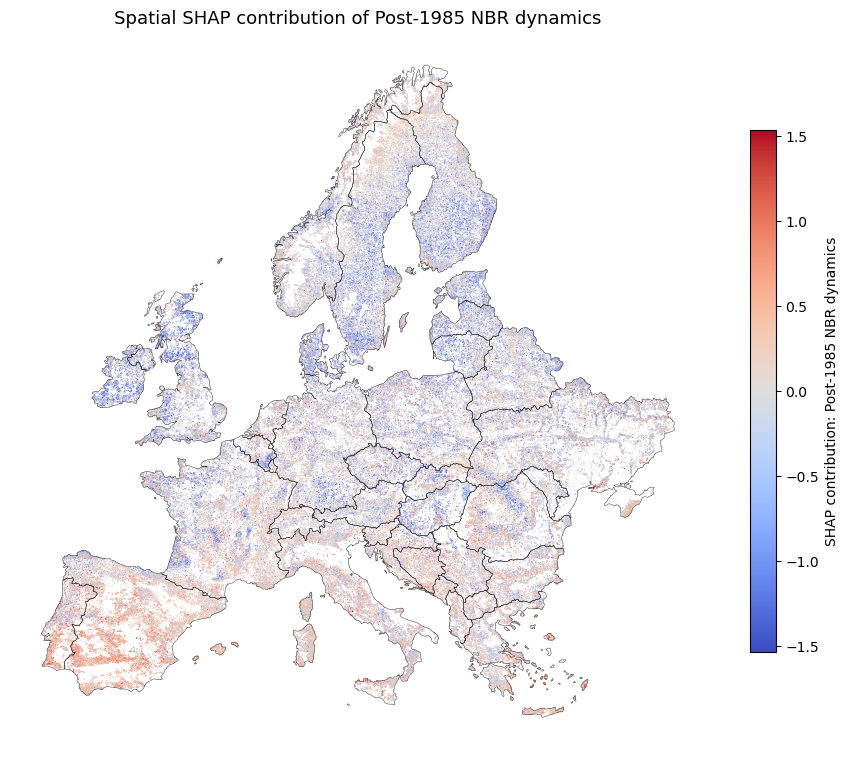

Saved: /mnt/eo/EO4Backcasting/_figures/shap/spatial_shap_contribution_Post_1985_NBR_dynamics.png


In [51]:
# ============================================================
# 25. Spatial map of one SHAP group contribution
# ============================================================
# Change this to any group in group_names.

target_group = "Post-1985 NBR dynamics"
target_col = f"shap_group_{target_group}"

plot_gdf = gdf_shap.copy()
plot_gdf = plot_gdf.replace([np.inf, -np.inf], np.nan)
plot_gdf = plot_gdf.dropna(subset=[target_col])

vmax = np.nanpercentile(np.abs(plot_gdf[target_col]), 98)
vmin = -vmax

fig, ax = plt.subplots(figsize=(9, 9))

if countries is not None:
    countries.boundary.plot(
        ax=ax,
        color="black",
        linewidth=0.35,
        alpha=0.8,
        zorder=2
    )

plot_gdf.plot(
    ax=ax,
    column=target_col,
    cmap="coolwarm",
    vmin=vmin,
    vmax=vmax,
    markersize=0.5,
    alpha=0.7,
    linewidth=0,
    legend=True,
    legend_kwds={
        "label": f"SHAP contribution: {target_group}",
        "shrink": 0.6
    },
    zorder=1
)

ax.set_title(
    f"Spatial SHAP contribution of {target_group}",
    fontsize=13
)

ax.set_axis_off()
ax.set_aspect("equal")

plt.tight_layout()

out_fp = out_dir / f"spatial_shap_contribution_{target_group.replace(' ', '_').replace('-', '_')}.png"
fig.savefig(out_fp, dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

print("Saved:", out_fp)

Rows before filtering: 379431
Rows for facet maps: 42807
Resolved SHAP group columns:
Recovery proxy (NBR trend) -> shap_group_Post-1985 NBR dynamics
Within-year spectral variability -> shap_group_Within-year spectral variability
SWIR reflectance -> shap_group_SWIR spectral level
NIR reflectance -> shap_group_NIR spectral level
Visible reflectance -> shap_group_Visible spectral level
Shared color scale:
vmin: 0
vmax: 1.0452957344055178
Recovery proxy (NBR trend) positive rows: 37195
Within-year spectral variability positive rows: 33895
SWIR reflectance positive rows: 33339
NIR reflectance positive rows: 35511
Visible reflectance positive rows: 39485


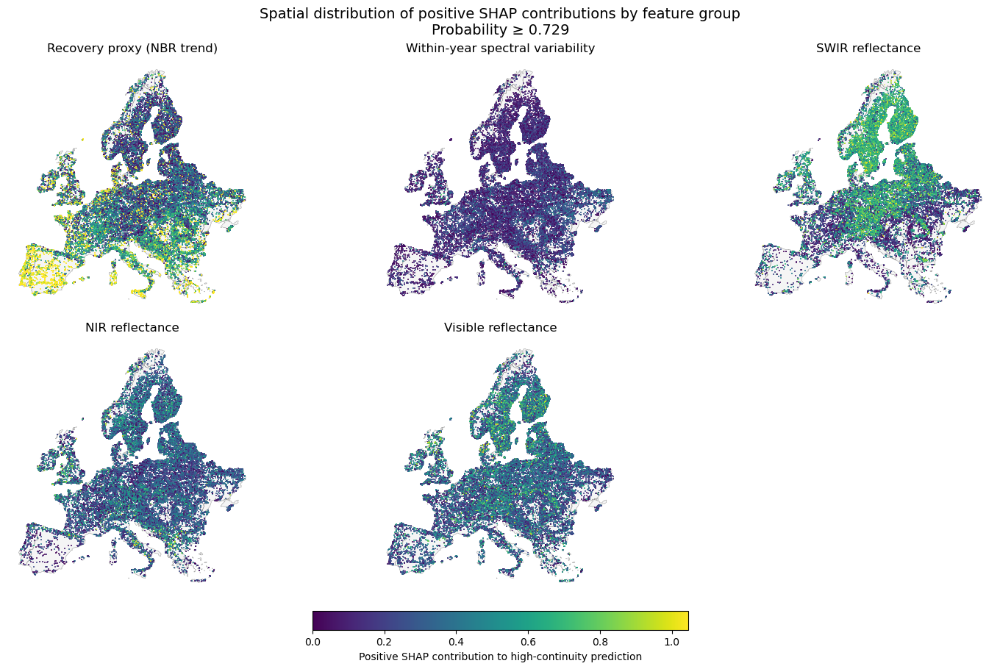

Saved: /mnt/eo/EO4Backcasting/_figures/shap/facet_maps_positive_shap_groups_prob_ge_0p729_final_labels.png


In [53]:
# ============================================================
# Facet maps: positive SHAP contribution per feature group
# with final renamed labels
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

prob_threshold = 0.729
marker_size = 2
marker_alpha = 0.80

# ------------------------------------------------------------
# Subset high-probability forests
# ------------------------------------------------------------

gdf_plot = gdf_shap[
    gdf_shap["prediction_probability"] >= prob_threshold
].copy()

print("Rows before filtering:", len(gdf_shap))
print("Rows for facet maps:", len(gdf_plot))

# ------------------------------------------------------------
# Rename dominant SHAP group labels
# ------------------------------------------------------------

group_rename = {
    "Post-1985 NBR dynamics": "Recovery proxy (NBR trend)",
    "SWIR spectral level": "SWIR reflectance",
    "NIR spectral level": "NIR reflectance",
    "Visible spectral level": "Visible reflectance",
}

for col in ["dominant_positive_shap_group", "dominant_negative_shap_group"]:
    if col in gdf_plot.columns:
        gdf_plot[col] = gdf_plot[col].replace(group_rename)

# ------------------------------------------------------------
# Define SHAP group columns with final display labels
# ------------------------------------------------------------

plot_groups = {
    "Recovery proxy (NBR trend)": [
        "shap_group_Recovery proxy (NBR trend)",
        "shap_group_Post-1985 NBR dynamics",
    ],
    "Within-year spectral variability": [
        "shap_group_Within-year spectral variability"
    ],
    "SWIR reflectance": [
        "shap_group_SWIR reflectance",
        "shap_group_SWIR spectral level"
    ],
    "NIR reflectance": [
        "shap_group_NIR reflectance",
        "shap_group_NIR spectral level"
    ],
    "Visible reflectance": [
        "shap_group_Visible reflectance",
        "shap_group_Visible spectral level"
    ],
}

# Resolve to the actually existing column names
plot_groups_resolved = {}

for label, candidate_cols in plot_groups.items():
    found_col = None

    for col in candidate_cols:
        if col in gdf_plot.columns:
            found_col = col
            break

    if found_col is not None:
        plot_groups_resolved[label] = found_col

print("Resolved SHAP group columns:")
for label, col in plot_groups_resolved.items():
    print(f"{label} -> {col}")

if len(plot_groups_resolved) == 0:
    raise ValueError("No SHAP group columns found. Check column names in gdf_shap.")

# ------------------------------------------------------------
# Convert to positive-only SHAP contribution
# ------------------------------------------------------------

for label, col in plot_groups_resolved.items():
    pos_col = col + "_positive"
    gdf_plot[pos_col] = gdf_plot[col].clip(lower=0)

# ------------------------------------------------------------
# Shared color scale across all panels
# ------------------------------------------------------------

positive_cols = [
    col + "_positive"
    for col in plot_groups_resolved.values()
]

all_positive_values = np.concatenate([
    gdf_plot[c].dropna().to_numpy()
    for c in positive_cols
    if gdf_plot[c].notna().any()
])

vmin = 0
vmax = np.nanpercentile(all_positive_values, 98)

print("Shared color scale:")
print("vmin:", vmin)
print("vmax:", vmax)

norm = Normalize(vmin=vmin, vmax=vmax)
cmap = plt.cm.viridis
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

# ------------------------------------------------------------
# Plot facet maps
# ------------------------------------------------------------

n_groups = len(plot_groups_resolved)
ncols = 3
nrows = int(np.ceil(n_groups / ncols))

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(15, 9),
    constrained_layout=True
)

axes = np.array(axes).reshape(-1)

for ax, (label, col) in zip(axes, plot_groups_resolved.items()):

    pos_col = col + "_positive"

    ax.set_facecolor("white")

    if countries is not None:
        countries.plot(
            ax=ax,
            facecolor="#f5f5f5",
            edgecolor="none",
            zorder=0
        )

        countries.boundary.plot(
            ax=ax,
            color="#8a8a8a",
            linewidth=0.35,
            alpha=0.9,
            zorder=1
        )

    sub = gdf_plot[
        gdf_plot[pos_col] > 0
    ].copy()

    print(label, "positive rows:", len(sub))

    if len(sub) > 0:
        sub.plot(
            ax=ax,
            column=pos_col,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            markersize=marker_size,
            alpha=marker_alpha,
            linewidth=0,
            marker="s",
            zorder=2
        )

    ax.set_title(label, fontsize=12)
    ax.set_axis_off()
    ax.set_aspect("equal")

# Remove unused axes
for ax in axes[n_groups:]:
    ax.set_visible(False)

# ------------------------------------------------------------
# Shared colorbar
# ------------------------------------------------------------

cbar = fig.colorbar(
    sm,
    ax=axes[:n_groups],
    orientation="horizontal",
    fraction=0.035,
    pad=0.03
)

cbar.set_label(
    "Positive SHAP contribution to high-continuity prediction",
    fontsize=10
)

fig.suptitle(
    f"Spatial distribution of positive SHAP contributions by feature group\n"
    f"Probability ≥ {prob_threshold}",
    fontsize=14
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

out_fp = out_dir / (
    f"facet_maps_positive_shap_groups_"
    f"prob_ge_{str(prob_threshold).replace('.', 'p')}_"
    f"final_labels.png"
)

fig.savefig(
    out_fp,
    dpi=400,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print("Saved:", out_fp)

In [54]:
# ============================================================
# Optional: copy/save Europe-only SHAP GeoPackage for QGIS
# ============================================================
# The Europe-only GeoPackage is already written to:
#   gdf_shap_europe_cache_fp
# This block writes an additional copy in out_dir only if needed.

out_gpkg = out_dir / "shap_sample_spatial_europe_only.gpkg"

if out_gpkg.exists() and not overwrite_cache:
    print("QGIS GeoPackage already exists, not overwriting:")
    print(out_gpkg)
else:
    gdf_shap.to_file(
        out_gpkg,
        layer="shap_points_europe",
        driver="GPKG"
    )
    print("Saved QGIS GeoPackage:", out_gpkg)


Saved QGIS GeoPackage: /mnt/eo/EO4Backcasting/_figures/shap/shap_sample_spatial_europe_only.gpkg


# 4. Hexagon and country-level forest-continuity statistics

All summaries are recalculated from the new `gt0729` binary raster. Threshold-specific cache names prevent reuse of previous 0.80 results.


In [55]:
# ------------------------------------------------------------
# Imports and global settings
# ------------------------------------------------------------
from pathlib import Path
from collections import Counter
from datetime import datetime
import shutil
import tempfile

import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.vrt import WarpedVRT
from rasterio.enums import Resampling
from rasterio.features import rasterize
from rasterio.windows import bounds as window_bounds
from rasterio.windows import transform as window_transform

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Patch
from shapely.geometry import Polygon, box
from tqdm.auto import tqdm

# ------------------------------------------------------------
# Main inputs
# ------------------------------------------------------------
# Binary forest-continuity product. Pixels with value 1 are treated as continuously undisturbed forest.
continuity_fp = Path(
    "/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/"
    "global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif"
)

# Forest mask aligned or alignable to the continuity raster. Pixels with value 1 are forest.
forest_mask_fp = Path("/mnt/eo/EFDA_v211/forest_landuse_aligned.tif")

# Country polygons in EPSG:3035.
country_gpkg = Path("/mnt/eo/EO4Backcasting/_data/CNTR_RG_10M_2024_3035.gpkg")
country_name_col = "NAME_ENGL"

# ------------------------------------------------------------
# Output/cache folders
# ------------------------------------------------------------
out_dir = Path("/mnt/eo/EO4Backcasting/figures")
out_dir.mkdir(parents=True, exist_ok=True)

cache_dir = Path("/mnt/eo/EO4Backcasting/_analysis_cache")
cache_dir.mkdir(parents=True, exist_ok=True)

# Use a new cache name so an older product clipped at 35°E is not silently reused.
hex_gpkg = cache_dir / "forest_continuity_gt0729_by_small_clipped_hexagon_lon45_gt0729.gpkg"

FORCE_RECOMPUTE = True

# ------------------------------------------------------------
# Analysis settings
# ------------------------------------------------------------
pixel_area_ha = 0.09       # 30 m pixel = 900 m² = 0.09 ha
forest_value = 1
continuity_value = 1

hex_radius = 17_500        # metres; approximately 500 km² hexagons
min_forest_area_ha = 500   # keep only hexagons with at least this much forest area

# Mainland Europe extent used to remove remote/overseas parts and avoid the old 35°E cutoff.
# 45°E keeps the eastern part of Ukraine within the processing extent.
mainland_bbox_4326 = box(-11, 34, 45, 72)

# A product with max longitude below this value is very likely still based on the old 35°E clipping.
eastern_extent_check_min_lon = 38.0

# Countries to keep. Ukraine is intentionally included.
european_countries = [
    "Albania", "Andorra", "Austria", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Czechia",
    "Denmark", "Estonia", "Finland", "France", "Germany",
    "Greece", "Hungary", "Ireland", "Italy", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine",
    "United Kingdom", "Vatican"
]

excluded_countries = {"Russian Federation", "Russia", "Turkey", "Kazakhstan"}


In [56]:
# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def create_hex_grid(bounds, hex_radius, crs):
    """Create a flat-top hexagon grid for a given bounding box."""
    minx, miny, maxx, maxy = bounds
    dx = 1.5 * hex_radius
    dy = np.sqrt(3) * hex_radius

    hexagons = []
    hex_ids = []
    x = minx - 2 * hex_radius
    col = 0
    hex_id = 1

    while x < maxx + 2 * hex_radius:
        y_offset = 0 if col % 2 == 0 else dy / 2
        y = miny - dy

        while y < maxy + dy:
            cy = y + y_offset
            angles = np.deg2rad([0, 60, 120, 180, 240, 300])
            coords = [(x + hex_radius * np.cos(a), cy + hex_radius * np.sin(a)) for a in angles]
            hexagons.append(Polygon(coords))
            hex_ids.append(hex_id)
            hex_id += 1
            y += dy

        x += dx
        col += 1

    return gpd.GeoDataFrame({"hex_id": hex_ids}, geometry=hexagons, crs=crs)


def geometry_union(geoseries):
    """Compatibility wrapper for GeoPandas versions with or without union_all()."""
    if hasattr(geoseries, "union_all"):
        return geoseries.union_all()
    return geoseries.unary_union


def load_europe_countries(target_crs=None, clip_mainland=True):
    """Load European country polygons and optionally clip them to mainland Europe up to 45°E."""
    countries = gpd.read_file(country_gpkg)
    countries["country"] = countries[country_name_col].astype(str).str.strip()

    countries = countries[countries["country"].isin(european_countries)].copy()
    countries = countries[~countries["country"].isin(excluded_countries)].copy()

    countries = countries[countries.geometry.notna() & ~countries.geometry.is_empty].copy()
    countries["geometry"] = countries.geometry.make_valid()

    if clip_mainland:
        countries_4326 = countries.to_crs(4326)
        parts = countries_4326.explode(index_parts=False).reset_index(drop=True)

        minx, miny, maxx, maxy = mainland_bbox_4326.bounds
        representative_points = parts.representative_point()
        keep = (
            (representative_points.x >= minx) & (representative_points.x <= maxx) &
            (representative_points.y >= miny) & (representative_points.y <= maxy)
        )
        parts = parts.loc[keep].copy()

        bbox_gdf = gpd.GeoDataFrame(geometry=[mainland_bbox_4326], crs=4326)
        parts = gpd.clip(parts, bbox_gdf)
        countries = parts.dissolve(by="country", as_index=False)

    if target_crs is not None and countries.crs != target_crs:
        countries = countries.to_crs(target_crs)

    return countries


def cache_is_stale_or_clipped(gdf, min_expected_max_lon=eastern_extent_check_min_lon):
    """Return True if cached hexagons still look clipped at the old 35°E extent."""
    max_lon = gdf.to_crs(4326).total_bounds[2]
    return max_lon < min_expected_max_lon


def backup_existing_gpkg(path):
    """Rename an existing GeoPackage and possible SQLite sidecar files with a timestamp."""
    path = Path(path)

    if not path.exists():
        return

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    backup_path = path.with_name(f"{path.stem}_backup_{timestamp}{path.suffix}")
    path.rename(backup_path)
    print(f"Existing GPKG renamed to: {backup_path}")

    for suffix in ["-wal", "-shm", "-journal"]:
        sidecar = Path(str(path) + suffix)
        if sidecar.exists():
            sidecar_backup = path.with_name(f"{path.stem}_backup_{timestamp}{path.suffix}{suffix}")
            sidecar.rename(sidecar_backup)
            print(f"Existing sidecar renamed to: {sidecar_backup}")


def choose_tmp_base():
    """Choose a temporary write folder for GeoPackage creation."""
    candidates = [
        Path("/mnt/dss_project/lmandl/tmp_gpkg_write"),
        Path(tempfile.gettempdir()) / "lmandl_tmp_gpkg_write",
    ]

    for candidate in candidates:
        try:
            candidate.mkdir(parents=True, exist_ok=True)
            return candidate
        except Exception:
            continue

    raise RuntimeError("No writable temporary directory found for GeoPackage writing.")


def write_hexes_gpkg_with_backup(gdf, path, layer="hexes"):
    """
    Write the GeoDataFrame to a temporary path first, validate it,
    then copy the finished GeoPackage to the final target path.
    This avoids common SQLite/GPKG transaction errors on network mounts.
    """
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)

    gdf_out = gdf.copy()
    gdf_out = gdf_out[gdf_out.geometry.notna() & ~gdf_out.geometry.is_empty].copy()
    gdf_out["geometry"] = gdf_out.geometry.make_valid()

    tmp_base = choose_tmp_base()

    with tempfile.TemporaryDirectory(dir=tmp_base) as tmp_dir:
        tmp_path = Path(tmp_dir) / path.name
        print(f"Writing temporary GPKG first: {tmp_path}")

        try:
            gdf_out.to_file(tmp_path, layer=layer, driver="GPKG", engine="pyogrio")
        except Exception as e_pyogrio:
            print("pyogrio write failed. Trying fiona instead.")
            print(f"pyogrio error: {e_pyogrio}")
            gdf_out.to_file(tmp_path, layer=layer, driver="GPKG", engine="fiona")

        test = gpd.read_file(tmp_path, layer=layer)
        print(f"Temporary GPKG successfully written and read: {len(test)} features")

        backup_existing_gpkg(path)
        shutil.copy2(tmp_path, path)

    print(f"Written final GPKG: {path}")


def try_read_cached_hexes(path, layer="hexes"):
    """Try to read a cached hexagon product. Return None if it is missing or invalid."""
    path = Path(path)

    if not path.exists():
        return None

    try:
        gdf = gpd.read_file(path, layer=layer)
        print(f"Loaded cached hexagon product: {path}")
        return gdf
    except Exception as e:
        print("Existing GPKG could not be read and will be recomputed.")
        print(f"Read error: {e}")
        backup_existing_gpkg(path)
        return None


In [57]:
# ------------------------------------------------------------
# Load or compute hexagon summary
# ------------------------------------------------------------
def compute_hexagon_summary():
    with rasterio.open(continuity_fp) as continuity_src:
        countries_eur = load_europe_countries(
            target_crs=continuity_src.crs,
            clip_mainland=True
        )

    europe_geom = geometry_union(countries_eur.geometry)
    europe_bounds = countries_eur.total_bounds

    hexes = create_hex_grid(
        bounds=europe_bounds,
        hex_radius=hex_radius,
        crs=countries_eur.crs
    )

    hexes = hexes[hexes.intersects(europe_geom)].copy()

    europe_clip = gpd.GeoDataFrame(geometry=[europe_geom], crs=countries_eur.crs)
    hexes = gpd.clip(hexes, europe_clip)
    hexes = hexes[hexes.geometry.notna() & ~hexes.geometry.is_empty].copy()
    hexes["geometry"] = hexes.geometry.make_valid()
    hexes = hexes.reset_index(drop=True)
    hexes["hex_id"] = np.arange(1, len(hexes) + 1).astype(np.int32)

    print("Number of clipped hexagons:", len(hexes))

    hex_sindex = hexes.sindex
    forest_counter = Counter()
    continuity_counter = Counter()

    with rasterio.open(continuity_fp) as continuity_src, rasterio.open(forest_mask_fp) as forest_src:
        with WarpedVRT(
            forest_src,
            crs=continuity_src.crs,
            transform=continuity_src.transform,
            width=continuity_src.width,
            height=continuity_src.height,
            resampling=Resampling.nearest,
            src_nodata=forest_src.nodata,
            nodata=0,
        ) as forest_vrt:

            windows = [window for _, window in continuity_src.block_windows(1)]

            for window in tqdm(
                windows,
                desc="Counting forest and forest-continuity area by clipped hexagon"
            ):
                continuity = continuity_src.read(1, window=window)
                forest = forest_vrt.read(1, window=window)

                if not (np.any(forest == forest_value) or np.any(continuity == continuity_value)):
                    continue

                block_geom = box(*window_bounds(window, continuity_src.transform))

                candidate_idx = list(hex_sindex.intersection(block_geom.bounds))
                if not candidate_idx:
                    continue

                hex_block = hexes.iloc[candidate_idx].copy()
                hex_block = hex_block[hex_block.intersects(block_geom)]

                if hex_block.empty:
                    continue

                hex_raster = rasterize(
                    shapes=zip(hex_block.geometry, hex_block["hex_id"]),
                    out_shape=continuity.shape,
                    transform=window_transform(window, continuity_src.transform),
                    fill=0,
                    dtype="int32",
                    all_touched=False,
                )

                valid_hex = hex_raster != 0
                valid_forest = valid_hex & (forest == forest_value)

                forest_ids = hex_raster[valid_forest].astype(np.int32)
                continuity_ids = hex_raster[
                    valid_forest & (continuity == continuity_value)
                ].astype(np.int32)

                if forest_ids.size > 0:
                    unique, counts = np.unique(forest_ids, return_counts=True)
                    forest_counter.update(dict(zip(unique, counts)))

                if continuity_ids.size > 0:
                    unique, counts = np.unique(continuity_ids, return_counts=True)
                    continuity_counter.update(dict(zip(unique, counts)))

    df_forest_hex = pd.DataFrame(
        forest_counter.items(),
        columns=["hex_id", "forest_pixels"]
    )

    df_continuity_hex = pd.DataFrame(
        continuity_counter.items(),
        columns=["hex_id", "continuity_pixels"]
    )

    df_hex = df_forest_hex.merge(
        df_continuity_hex,
        on="hex_id",
        how="left"
    )

    df_hex["continuity_pixels"] = df_hex["continuity_pixels"].fillna(0)
    df_hex["forest_area_ha"] = df_hex["forest_pixels"] * pixel_area_ha
    df_hex["continuity_area_ha"] = df_hex["continuity_pixels"] * pixel_area_ha
    df_hex["continuity_area_km2"] = df_hex["continuity_area_ha"] / 100
    df_hex["continuity_share_percent"] = (
        df_hex["continuity_area_ha"] / df_hex["forest_area_ha"] * 100
    )

    hexes_plot = hexes.merge(df_hex, on="hex_id", how="left")
    hexes_plot = hexes_plot[
        hexes_plot["forest_area_ha"].notna() &
        (hexes_plot["forest_area_ha"] >= min_forest_area_ha)
    ].copy()

    return hexes_plot, countries_eur


hexes_plot = None
countries_eur = None

if hex_gpkg.exists() and not FORCE_RECOMPUTE:
    hexes_cached = try_read_cached_hexes(hex_gpkg, layer="hexes")

    if hexes_cached is not None and cache_is_stale_or_clipped(hexes_cached):
        print(
            f"Cached hexagon product appears clipped at "
            f"{hexes_cached.to_crs(4326).total_bounds[2]:.2f}°E. Recomputing."
        )
        hexes_cached = None

    if hexes_cached is not None:
        hexes_plot = hexes_cached
        with rasterio.open(continuity_fp) as src:
            countries_eur = load_europe_countries(target_crs=src.crs, clip_mainland=True)
    else:
        hexes_plot, countries_eur = compute_hexagon_summary()
        write_hexes_gpkg_with_backup(hexes_plot, hex_gpkg, layer="hexes")
else:
    if FORCE_RECOMPUTE:
        print("FORCE_RECOMPUTE=True. Recomputing hexagon product.")
    hexes_plot, countries_eur = compute_hexagon_summary()
    write_hexes_gpkg_with_backup(hexes_plot, hex_gpkg, layer="hexes")

hex_bounds_4326 = hexes_plot.to_crs(4326).total_bounds
country_bounds_4326 = countries_eur.to_crs(4326).total_bounds

print("Hexagons with sufficient forest:", len(hexes_plot))
print("Hex bounds EPSG:4326:", hex_bounds_4326)
print("Country bounds EPSG:4326:", country_bounds_4326)

if hex_bounds_4326[2] < eastern_extent_check_min_lon:
    raise RuntimeError(
        "The hexagon product still appears to be clipped too far west. "
        f"Current max longitude is {hex_bounds_4326[2]:.2f}°E. "
        "Check the country selection, mainland_bbox_4326 and whether an old cache was reused."
    )

display(
    hexes_plot[
        [
            "hex_id",
            "forest_area_ha",
            "continuity_area_ha",
            "continuity_area_km2",
            "continuity_share_percent"
        ]
    ].head()
)


FORCE_RECOMPUTE=True. Recomputing hexagon product.
Number of clipped hexagons: 8406


Counting forest and forest-continuity area by clipped hexagon:   0%|          | 0/140000 [00:00<?, ?it/s]

Writing temporary GPKG first: /mnt/dss_project/lmandl/tmp_gpkg_write/tmpko6dsew6/forest_continuity_gt0729_by_small_clipped_hexagon_lon45_gt0729.gpkg
Temporary GPKG successfully written and read: 7694 features
Written final GPKG: /mnt/eo/EO4Backcasting/_analysis_cache/forest_continuity_gt0729_by_small_clipped_hexagon_lon45_gt0729.gpkg
Hexagons with sufficient forest: 7694
Hex bounds EPSG:4326: [-10.38725127  34.92559576  40.18881557  71.01985738]
Country bounds EPSG:4326: [-10.38725127  34.81394948  40.18881557  71.14309588]


,hex_id,forest_area_ha,continuity_area_ha,continuity_area_km2,continuity_share_percent
3,4,3075.21,171.36,1.7136,5.572302
6,7,4745.88,562.41,5.6241,11.850489
7,8,5771.16,1025.82,10.2582,17.774936
8,9,3308.22,152.01,1.5201,4.594918
9,10,14613.30,699.21,6.9921,4.784751


In [58]:
# ------------------------------------------------------------
# Plot helper
# ------------------------------------------------------------
def add_country_boundaries(ax, countries, target_crs):
    countries_plot = countries.to_crs(target_crs)
    countries_plot.boundary.plot(
        ax=ax,
        linewidth=0.40,
        edgecolor="0.30",
        alpha=0.85,
        zorder=10,
    )


def save_figure(fig, png_path, svg_path):
    fig.savefig(png_path, dpi=300, bbox_inches="tight", pad_inches=0.02, facecolor="white")
    fig.savefig(svg_path, bbox_inches="tight", pad_inches=0.02, facecolor="white")
    print("Saved PNG:", png_path)
    print("Saved SVG:", svg_path)


count    7694.000000
mean        9.166282
std         7.381488
min         0.000000
25%         3.735739
50%         6.967157
75%        12.724593
max        63.681193
Name: continuity_share_percent, dtype: float64
Hexagons with continuity_share_percent < 0.1: 3
Hexagons with continuity_share_percent >= 0.1: 7691
Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_0_1_7_lowvals_grey_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_0_1_7_lowvals_grey_countries_lon45_gt0729.svg


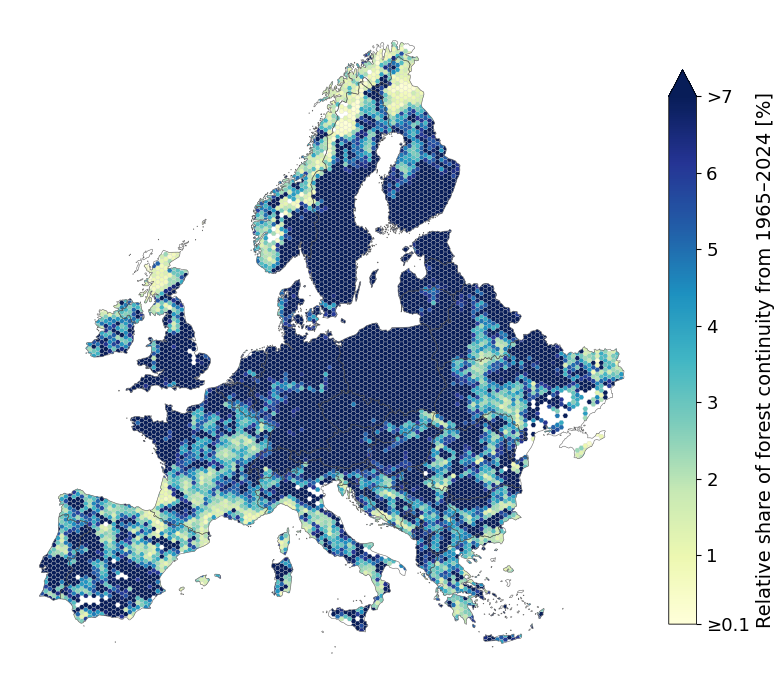

In [59]:
# ------------------------------------------------------------
# Plot 1: Relative forest-continuity share by hexagon
# Values < 0.1% are shown in very light grey.
# Hexagon colours are fixed to 0.1–7%; values above 7% use the darkest colour.
# The colorbar ends at 7 and uses an extension triangle for values >7.
# No separate legend box is added for values < 0.1%.
# ------------------------------------------------------------

rel_col = "continuity_share_percent"
low_threshold = 0.1

hexes_rel = hexes_plot[hexes_plot[rel_col].notna()].copy()
hexes_low = hexes_rel[hexes_rel[rel_col] < low_threshold].copy()
hexes_high = hexes_rel[hexes_rel[rel_col] >= low_threshold].copy()

print(hexes_rel[rel_col].describe())
print(f"Hexagons with {rel_col} < {low_threshold}: {len(hexes_low)}")
print(f"Hexagons with {rel_col} >= {low_threshold}: {len(hexes_high)}")

# Plotting norm: controls the actual hexagon colours.
vmin = low_threshold
vmax = 7
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax, clip=False)

cmap = plt.get_cmap("YlGnBu").copy()
cmap.set_bad(alpha=0)
cmap.set_over(cmap(1.0))  # values >7 use darkest colour

fig, ax = plt.subplots(figsize=(10, 10))

if len(hexes_low) > 0:
    hexes_low.plot(
        ax=ax,
        color="0.94",
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=1,
    )

if len(hexes_high) > 0:
    hexes_high.plot(
        column=rel_col,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=2,
    )

add_country_boundaries(ax, countries_eur, hexes_rel.crs)

# Colorbar uses the same scale as the plotted values.
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=ax,
    shrink=0.72,
    pad=0.02,
    ticks=[low_threshold, 1, 2, 3, 4, 5, 6, 7],
    extend="max",
)

cbar.ax.set_yticklabels(
    ["≥0.1", "1", "2", "3", "4", "5", "6", ">7"]
)

cbar.set_label("Relative share of forest continuity from 1965–2024 [%]", fontsize=14)
cbar.ax.tick_params(labelsize=13)
cbar.outline.set_linewidth(0.6)

ax.set_axis_off()

out_png_rel = out_dir / "forest_continuity_share_hexagons_linear_0_1_7_lowvals_grey_countries_lon45_gt0729.png"
out_svg_rel = out_dir / "forest_continuity_share_hexagons_linear_0_1_7_lowvals_grey_countries_lon45_gt0729.svg"

save_figure(fig, out_png_rel, out_svg_rel)
plt.show()

count    7694.000000
mean        9.166282
std         7.381488
min         0.000000
25%         3.735739
50%         6.967157
75%        12.724593
max        63.681193
Name: continuity_share_percent, dtype: float64
Hexagons with continuity_share_percent < 1: 199
Hexagons with continuity_share_percent >= 1: 7495
Hexagons with continuity_share_percent > 30: 142
Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_1_30_below1_grey_over30_darkest_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_1_30_below1_grey_over30_darkest_countries_lon45_gt0729.svg


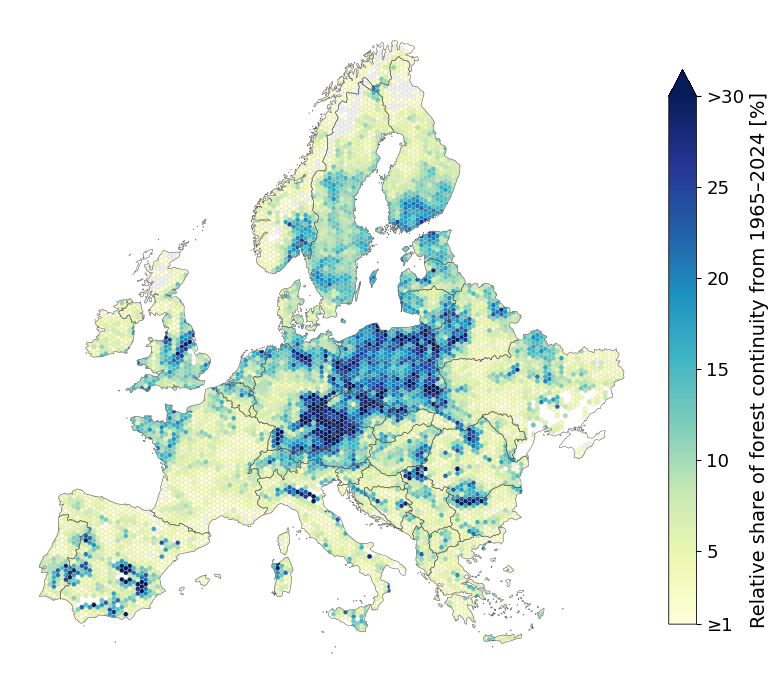

Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_1_30_below1_grey_over30_darkest_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_1_30_below1_grey_over30_darkest_countries_lon45_gt0729.svg


In [62]:
# ------------------------------------------------------------
# Plot 1: Relative forest-continuity share by hexagon
# Values < 1% are shown in very light grey.
# Values from 1–30% use the continuous colour scale.
# Values >30% use the darkest colour.
# ------------------------------------------------------------

rel_col = "continuity_share_percent"
low_threshold = 5
upper_threshold = 30

# ------------------------------------------------------------
# Prepare data
# ------------------------------------------------------------

hexes_rel = hexes_plot[
    hexes_plot[rel_col].notna()
].copy()

hexes_low = hexes_rel[
    hexes_rel[rel_col] < low_threshold
].copy()

hexes_high = hexes_rel[
    hexes_rel[rel_col] >= low_threshold
].copy()

print(hexes_rel[rel_col].describe())
print(f"Hexagons with {rel_col} < {low_threshold}: {len(hexes_low)}")
print(f"Hexagons with {rel_col} >= {low_threshold}: {len(hexes_high)}")
print(
    f"Hexagons with {rel_col} > {upper_threshold}: "
    f"{(hexes_rel[rel_col] > upper_threshold).sum()}"
)

if len(hexes_high) == 0:
    raise ValueError(
        f"No hexagons with {rel_col} >= {low_threshold} found."
    )

# ------------------------------------------------------------
# Fixed colour range: 1–30%
# ------------------------------------------------------------

vmin = low_threshold
vmax = upper_threshold

norm = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax,
    clip=False
)

cmap = plt.get_cmap("YlGnBu").copy()
cmap.set_bad(alpha=0)
cmap.set_over(cmap(1.0))

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10, 10)
)

# Values below 1% in light grey
if len(hexes_low) > 0:
    hexes_low.plot(
        ax=ax,
        color="0.94",
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=1
    )

# Values >= 1%
if len(hexes_high) > 0:
    hexes_high.plot(
        column=rel_col,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=2
    )

# Country boundaries
add_country_boundaries(
    ax,
    countries_eur,
    hexes_rel.crs
)

# ------------------------------------------------------------
# Colorbar
# ------------------------------------------------------------

sm = mpl.cm.ScalarMappable(
    cmap=cmap,
    norm=norm
)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=ax,
    shrink=0.72,
    pad=0.02,
    ticks=[1, 5, 10, 15, 20, 25, 30],
    extend="max"
)

cbar.ax.set_yticklabels(
    ["≥1", "5", "10", "15", "20", "25", ">30"]
)

cbar.set_label(
    "Relative share of forest continuity from 1965–2024 [%]",
    fontsize=14
)

cbar.ax.tick_params(
    labelsize=13
)

cbar.outline.set_linewidth(0.6)

# ------------------------------------------------------------
# Final layout
# ------------------------------------------------------------

ax.set_axis_off()
ax.set_aspect("equal")

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

out_png_rel = out_dir / (
    "forest_continuity_share_hexagons_"
    "linear_1_30_below1_grey_over30_darkest_"
    "countries_lon45_gt0729.png"
)

out_svg_rel = out_dir / (
    "forest_continuity_share_hexagons_"
    "linear_1_30_below1_grey_over30_darkest_"
    "countries_lon45_gt0729.svg"
)

save_figure(
    fig,
    out_png_rel,
    out_svg_rel
)

plt.show()

print("Saved PNG:", out_png_rel)
print("Saved SVG:", out_svg_rel)

count    7694.000000
mean        9.166282
std         7.381488
min         0.000000
25%         3.735739
50%         6.967157
75%        12.724593
max        63.681193
Name: continuity_share_percent, dtype: float64
Hexagons with continuity_share_percent < 5: 2737
Hexagons with continuity_share_percent >= 5: 4957
Hexagons with continuity_share_percent > 30: 142
Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_countries_lon45_gt0729.svg


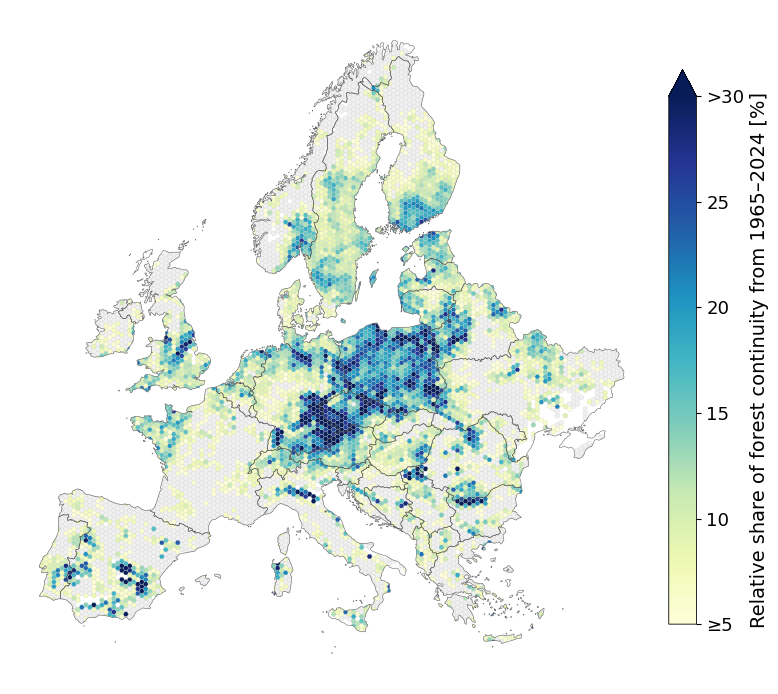

Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_countries_lon45_gt0729.svg


In [63]:
# ------------------------------------------------------------
# Plot 1: Relative forest-continuity share by hexagon
# Values < 5% are shown in very light grey.
# Values from 5–30% use the continuous colour scale.
# Values >30% use the darkest colour.
# ------------------------------------------------------------

rel_col = "continuity_share_percent"
low_threshold = 5
upper_threshold = 30

# ------------------------------------------------------------
# Prepare data
# ------------------------------------------------------------

hexes_rel = hexes_plot[
    hexes_plot[rel_col].notna()
].copy()

hexes_low = hexes_rel[
    hexes_rel[rel_col] < low_threshold
].copy()

hexes_high = hexes_rel[
    hexes_rel[rel_col] >= low_threshold
].copy()

print(hexes_rel[rel_col].describe())
print(f"Hexagons with {rel_col} < {low_threshold}: {len(hexes_low)}")
print(f"Hexagons with {rel_col} >= {low_threshold}: {len(hexes_high)}")
print(
    f"Hexagons with {rel_col} > {upper_threshold}: "
    f"{(hexes_rel[rel_col] > upper_threshold).sum()}"
)

if len(hexes_high) == 0:
    raise ValueError(
        f"No hexagons with {rel_col} >= {low_threshold} found."
    )

# ------------------------------------------------------------
# Fixed colour range: 5–30%
# ------------------------------------------------------------

vmin = low_threshold
vmax = upper_threshold

norm = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax,
    clip=False
)

cmap = plt.get_cmap("YlGnBu").copy()
cmap.set_bad(alpha=0)
cmap.set_over(cmap(1.0))

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10, 10)
)

# Values below 5% in light grey
if len(hexes_low) > 0:
    hexes_low.plot(
        ax=ax,
        color="0.94",
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=1
    )

# Values >= 5%
if len(hexes_high) > 0:
    hexes_high.plot(
        column=rel_col,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=2
    )

# Country boundaries
add_country_boundaries(
    ax,
    countries_eur,
    hexes_rel.crs
)

# ------------------------------------------------------------
# Colorbar
# ------------------------------------------------------------

sm = mpl.cm.ScalarMappable(
    cmap=cmap,
    norm=norm
)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=ax,
    shrink=0.72,
    pad=0.02,
    ticks=[5, 10, 15, 20, 25, 30],
    extend="max"
)

cbar.ax.set_yticklabels(
    ["≥5", "10", "15", "20", "25", ">30"]
)

cbar.set_label(
    "Relative share of forest continuity from 1965–2024 [%]",
    fontsize=14
)

cbar.ax.tick_params(
    labelsize=13
)

cbar.outline.set_linewidth(0.6)

# ------------------------------------------------------------
# Final layout
# ------------------------------------------------------------

ax.set_axis_off()
ax.set_aspect("equal")

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

out_png_rel = out_dir / (
    "forest_continuity_share_hexagons_"
    "linear_5_30_below5_grey_over30_darkest_"
    "countries_lon45_gt0729.png"
)

out_svg_rel = out_dir / (
    "forest_continuity_share_hexagons_"
    "linear_5_30_below5_grey_over30_darkest_"
    "countries_lon45_gt0729.svg"
)

save_figure(
    fig,
    out_png_rel,
    out_svg_rel
)

plt.show()

print("Saved PNG:", out_png_rel)
print("Saved SVG:", out_svg_rel)

count    7694.000000
mean        9.166282
std         7.381488
min         0.000000
25%         3.735739
50%         6.967157
75%        12.724593
max        63.681193
Name: continuity_share_percent, dtype: float64
Hexagons with continuity_share_percent < 5: 2737
Hexagons with continuity_share_percent >= 5: 4957
Hexagons with continuity_share_percent > 30: 142
Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_horizontal_colorbar_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_horizontal_colorbar_countries_lon45_gt0729.svg


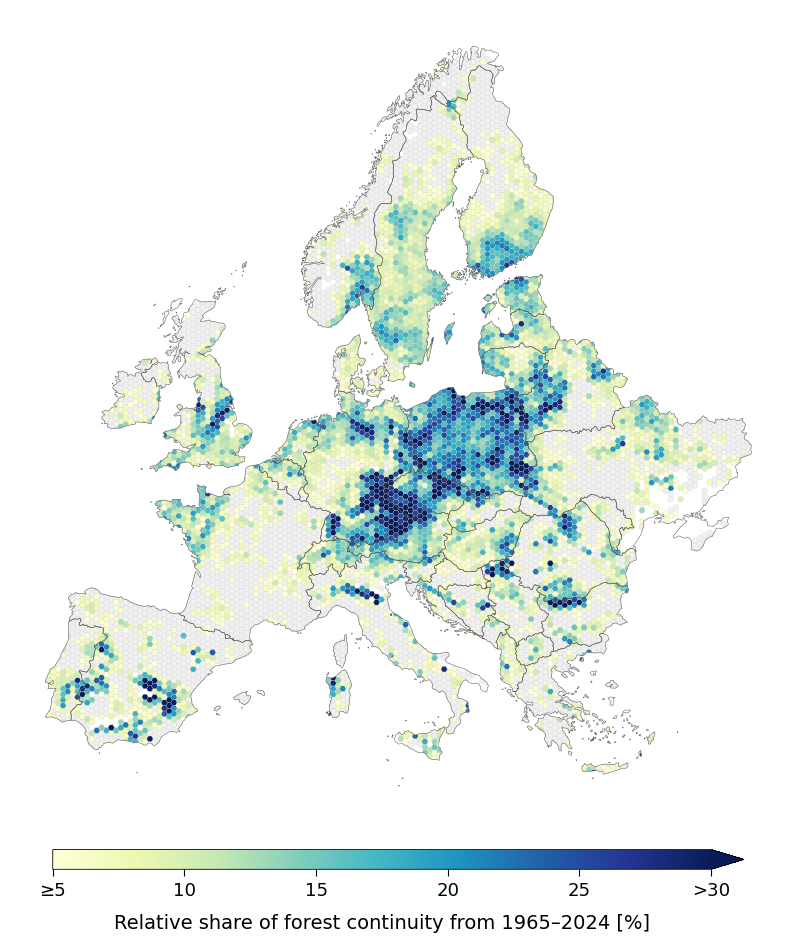

Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_horizontal_colorbar_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_share_hexagons_linear_5_30_below5_grey_over30_darkest_horizontal_colorbar_countries_lon45_gt0729.svg


In [64]:
# ------------------------------------------------------------
# Plot 1: Relative forest-continuity share by hexagon
# Values < 5% are shown in very light grey.
# Values from 5–30% use the continuous colour scale.
# Values >30% use the darkest colour.
# The colorbar is horizontal below the map and ends at 30,
# with an extension triangle for values >30.
# ------------------------------------------------------------

rel_col = "continuity_share_percent"
low_threshold = 5
upper_threshold = 30

# ------------------------------------------------------------
# Prepare data
# ------------------------------------------------------------

hexes_rel = hexes_plot[
    hexes_plot[rel_col].notna()
].copy()

hexes_low = hexes_rel[
    hexes_rel[rel_col] < low_threshold
].copy()

hexes_high = hexes_rel[
    hexes_rel[rel_col] >= low_threshold
].copy()

print(hexes_rel[rel_col].describe())
print(f"Hexagons with {rel_col} < {low_threshold}: {len(hexes_low)}")
print(f"Hexagons with {rel_col} >= {low_threshold}: {len(hexes_high)}")
print(
    f"Hexagons with {rel_col} > {upper_threshold}: "
    f"{(hexes_rel[rel_col] > upper_threshold).sum()}"
)

if len(hexes_high) == 0:
    raise ValueError(
        f"No hexagons with {rel_col} >= {low_threshold} found."
    )

# ------------------------------------------------------------
# Fixed colour range: 5–30%
# ------------------------------------------------------------

vmin = low_threshold
vmax = upper_threshold

norm = mpl.colors.Normalize(
    vmin=vmin,
    vmax=vmax,
    clip=False
)

cmap = plt.get_cmap("YlGnBu").copy()
cmap.set_bad(alpha=0)
cmap.set_over(cmap(1.0))

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10, 10)
)

# Values below 5% in light grey
if len(hexes_low) > 0:
    hexes_low.plot(
        ax=ax,
        color="0.94",
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=1
    )

# Values >= 5%
if len(hexes_high) > 0:
    hexes_high.plot(
        column=rel_col,
        ax=ax,
        cmap=cmap,
        norm=norm,
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=2
    )

# Country boundaries
add_country_boundaries(
    ax,
    countries_eur,
    hexes_rel.crs
)

# ------------------------------------------------------------
# Horizontal colorbar below map
# ------------------------------------------------------------

sm = mpl.cm.ScalarMappable(
    cmap=cmap,
    norm=norm
)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="horizontal",
    shrink=0.72,
    pad=0.03,
    fraction=0.045,
    aspect=35,
    ticks=[5, 10, 15, 20, 25, 30],
    extend="max"
)

cbar.ax.set_xticklabels(
    ["≥5", "10", "15", "20", "25", ">30"]
)

cbar.set_label(
    "Relative share of forest continuity from 1965–2024 [%]",
    fontsize=14,
    labelpad=10
)

cbar.ax.tick_params(
    axis="x",
    labelsize=13,
    length=5,
    width=0.8
)

cbar.outline.set_linewidth(0.6)

# ------------------------------------------------------------
# Final layout
# ------------------------------------------------------------

ax.set_axis_off()
ax.set_aspect("equal")

# Leave enough space for the horizontal colorbar
fig.subplots_adjust(
    left=0.02,
    right=0.98,
    top=0.98,
    bottom=0.10
)

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

out_png_rel = out_dir / (
    "forest_continuity_share_hexagons_"
    "linear_5_30_below5_grey_over30_darkest_"
    "horizontal_colorbar_"
    "countries_lon45_gt0729.png"
)

out_svg_rel = out_dir / (
    "forest_continuity_share_hexagons_"
    "linear_5_30_below5_grey_over30_darkest_"
    "horizontal_colorbar_"
    "countries_lon45_gt0729.svg"
)

save_figure(
    fig,
    out_png_rel,
    out_svg_rel
)

plt.show()

print("Saved PNG:", out_png_rel)
print("Saved SVG:", out_svg_rel)

count    7694.000000
mean       25.576157
std        31.590267
min         0.000000
25%         4.917600
50%        13.103100
75%        33.861825
max       327.147300
Name: continuity_area_km2, dtype: float64
Hexagons with continuity_area_km2 <= 0: 2
Hexagons with continuity_area_km2 > 0: 7692
Colour scale minimum: 0.00 km²
Colour scale maximum (98th percentile): 119.34 km²
Hexagons above colour-scale maximum: 154
Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_area_hexagons_p98cap_zero_grey_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_area_hexagons_p98cap_zero_grey_countries_lon45_gt0729.svg


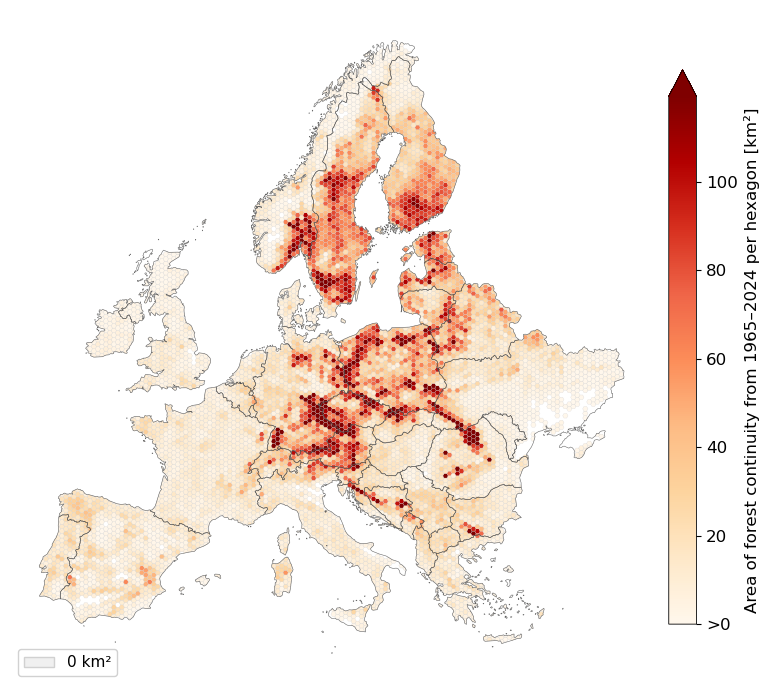

Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_area_hexagons_p98cap_zero_grey_countries_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_area_hexagons_p98cap_zero_grey_countries_lon45_gt0729.svg


In [65]:
# ------------------------------------------------------------
# Plot 2: Absolute forest-continuity area by hexagon
# Based on the updated binary continuity raster
# with probability threshold = 0.729.
#
# Values equal to 0 km² are shown in very light grey.
# Positive values use a continuous colour scale.
# The colour scale is capped at the 98th percentile so that
# a few very large values do not dominate the visualisation.
# Values above the 98th percentile use the darkest colour.
# ------------------------------------------------------------

abs_col = "continuity_area_km2"
zero_threshold = 0

# ------------------------------------------------------------
# Prepare data
# ------------------------------------------------------------

hexes_abs = hexes_plot[
    hexes_plot[abs_col].notna()
].copy()

hexes_zero = hexes_abs[
    hexes_abs[abs_col] <= zero_threshold
].copy()

hexes_positive = hexes_abs[
    hexes_abs[abs_col] > zero_threshold
].copy()

print(hexes_abs[abs_col].describe())

print(
    f"Hexagons with {abs_col} <= {zero_threshold}: "
    f"{len(hexes_zero)}"
)

print(
    f"Hexagons with {abs_col} > {zero_threshold}: "
    f"{len(hexes_positive)}"
)

if len(hexes_positive) == 0:
    raise ValueError(
        "No hexagons with positive forest-continuity area found."
    )

# ------------------------------------------------------------
# Colour scale capped at the 98th percentile
# ------------------------------------------------------------

vmin_abs = 0

vmax_abs = float(
    np.nanpercentile(
        hexes_positive[abs_col],
        98
    )
)

if vmax_abs <= 0:
    vmax_abs = float(
        hexes_positive[abs_col].max()
    )

print(f"Colour scale minimum: {vmin_abs:.2f} km²")
print(f"Colour scale maximum (98th percentile): {vmax_abs:.2f} km²")
print(
    "Hexagons above colour-scale maximum:",
    int((hexes_positive[abs_col] > vmax_abs).sum())
)

norm_abs = mpl.colors.Normalize(
    vmin=vmin_abs,
    vmax=vmax_abs,
    clip=False
)

cmap_abs = plt.get_cmap("OrRd").copy()
cmap_abs.set_bad(alpha=0)
cmap_abs.set_over(cmap_abs(1.0))

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(10, 10)
)

# Hexagons with no mapped continuity
if len(hexes_zero) > 0:
    hexes_zero.plot(
        ax=ax,
        color="0.94",
        linewidth=0.18,
        edgecolor="0.82",
        alpha=1.0,
        zorder=1
    )

# Hexagons with positive continuity area
hexes_positive.plot(
    column=abs_col,
    ax=ax,
    cmap=cmap_abs,
    norm=norm_abs,
    linewidth=0.18,
    edgecolor="0.82",
    alpha=1.0,
    zorder=2
)

# Country boundaries
add_country_boundaries(
    ax,
    countries_eur,
    hexes_abs.crs
)

# ------------------------------------------------------------
# Colour bar
# ------------------------------------------------------------

sm_abs = mpl.cm.ScalarMappable(
    cmap=cmap_abs,
    norm=norm_abs
)

sm_abs.set_array([])

cbar = fig.colorbar(
    sm_abs,
    ax=ax,
    shrink=0.72,
    pad=0.02,
    extend="max"
)

# Display the start of the coloured range as >0,
# since exactly 0 km² is shown separately in grey.
cbar.ax.yaxis.set_major_formatter(
    mpl.ticker.FuncFormatter(
        lambda x, pos: ">0" if np.isclose(x, 0) else f"{x:g}"
    )
)

cbar.set_label(
    "Area of forest continuity from 1965–2024 per hexagon [km²]",
    fontsize=12
)

cbar.ax.tick_params(
    labelsize=12
)

cbar.outline.set_linewidth(0.6)

# ------------------------------------------------------------
# Legend for zero values
# ------------------------------------------------------------

legend_handles = [
    Patch(
        facecolor="0.94",
        edgecolor="0.82",
        label="0 km²"
    )
]

ax.legend(
    handles=legend_handles,
    loc="lower left",
    frameon=True,
    framealpha=0.9,
    fontsize=11
)

# ------------------------------------------------------------
# Final layout
# ------------------------------------------------------------

ax.set_axis_off()
ax.set_aspect("equal")

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

out_png_abs = out_dir / (
    "forest_continuity_area_hexagons_"
    "p98cap_zero_grey_countries_"
    "lon45_gt0729.png"
)

out_svg_abs = out_dir / (
    "forest_continuity_area_hexagons_"
    "p98cap_zero_grey_countries_"
    "lon45_gt0729.svg"
)

save_figure(
    fig,
    out_png_abs,
    out_svg_abs
)

plt.show()

print("Saved PNG:", out_png_abs)
print("Saved SVG:", out_svg_abs)

Pixel area: 0.000900 km²


Counting forest continuity by country on pixel basis:   0%|          | 0/140000 [00:00<?, ?it/s]

Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_relative_share_top10_countries_pixelbased_lon45_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_relative_share_top10_countries_pixelbased_lon45_gt0729.svg


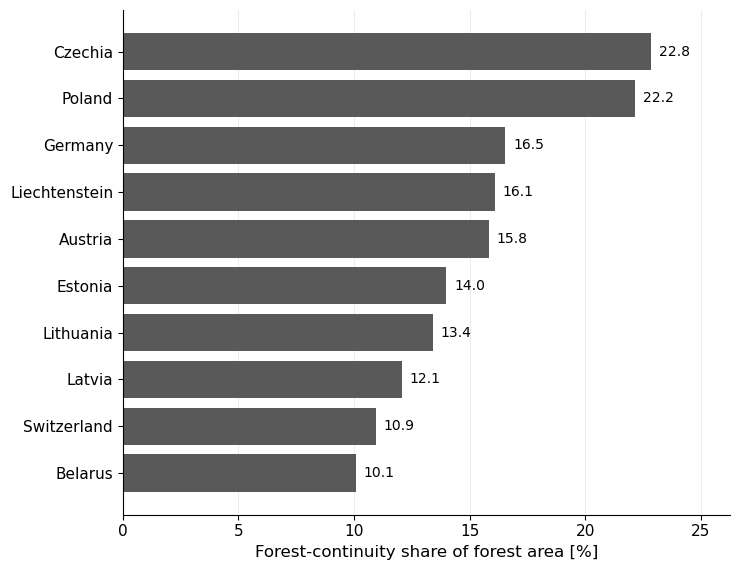

,Country,Forest share total [%],Forest area total [km²],Forest continuity share [% of forest],Forest continuity area [km²]
0,Netherlands,15.3,5668,10.0,568
1,San Marino,20.6,11,9.3,1
2,Sweden,68.0,306031,9.3,28353
3,Slovenia,66.0,13342,9.1,1215
4,Slovakia,50.4,24689,8.8,2181
5,Romania,37.1,88432,8.2,7252
6,Norway,34.3,111272,7.7,8530
7,Finland,72.4,244993,7.7,18748
8,Belgium,27.6,8501,7.7,650
9,Denmark,14.8,6398,7.6,486


openpyxl is not installed. Skipped Excel export and saved CSV only.
Saved:
  Top-10 bar plot PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_relative_share_top10_countries_pixelbased_lon45_gt0729.png
  Top-10 bar plot SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_relative_share_top10_countries_pixelbased_lon45_gt0729.svg
  Remaining-country table CSV: /mnt/eo/EO4Backcasting/figures/forest_continuity_country_table_remaining_pixelbased_lon45_gt0729.csv
  Full-country table CSV:      /mnt/eo/EO4Backcasting/figures/forest_continuity_country_table_all_pixelbased_lon45_gt0729.csv


In [66]:
# ------------------------------------------------------------
# Pixel-based country statistics:
# 1) Top-10 bar plot by relative forest-continuity share
# 2) Table for all remaining countries
#
# Definitions:
# - Forest area total [km²] = forest pixels within country * pixel area
# - Forest share total [%] = forest area / country area * 100
# - Forest continuity area [km²] = forest-continuity pixels within forest * pixel area
# - Forest continuity share [% of forest] = continuity area / forest area * 100
#
# This uses the original rasters directly, not the hexagon aggregation.
# ------------------------------------------------------------

from IPython.display import display

top_n = 10
country_min_forest_area_km2 = 1.0  # exclude countries/parts with almost no mapped forest

# ------------------------------------------------------------
# Load countries in raster CRS
# ------------------------------------------------------------
with rasterio.open(continuity_fp) as continuity_src:
    countries_pix = load_europe_countries(
        target_crs=continuity_src.crs,
        clip_mainland=True
    )

countries_pix = countries_pix[countries_pix.geometry.notna() & ~countries_pix.geometry.is_empty].copy()
countries_pix["geometry"] = countries_pix.geometry.make_valid()
countries_pix = countries_pix.reset_index(drop=True)

countries_pix["country_id"] = np.arange(1, len(countries_pix) + 1).astype(np.int32)
countries_pix["country_area_km2"] = countries_pix.geometry.area / 1_000_000

country_lookup = countries_pix[["country_id", "country", "country_area_km2"]].copy()

# ------------------------------------------------------------
# Count forest and continuity pixels by country
# ------------------------------------------------------------
forest_counter = Counter()
continuity_counter = Counter()

with rasterio.open(continuity_fp) as continuity_src, rasterio.open(forest_mask_fp) as forest_src:
    pixel_area_km2 = abs(continuity_src.transform.a * continuity_src.transform.e) / 1_000_000
    print(f"Pixel area: {pixel_area_km2:.6f} km²")

    with WarpedVRT(
        forest_src,
        crs=continuity_src.crs,
        transform=continuity_src.transform,
        width=continuity_src.width,
        height=continuity_src.height,
        resampling=Resampling.nearest,
        src_nodata=forest_src.nodata,
        nodata=0,
    ) as forest_vrt:

        country_sindex = countries_pix.sindex
        windows = [window for _, window in continuity_src.block_windows(1)]

        for window in tqdm(windows, desc="Counting forest continuity by country on pixel basis"):
            continuity = continuity_src.read(1, window=window)
            forest = forest_vrt.read(1, window=window)

            # Skip blocks without relevant pixels
            if not (np.any(forest == forest_value) or np.any(continuity == continuity_value)):
                continue

            block_geom = box(*window_bounds(window, continuity_src.transform))

            candidate_idx = list(country_sindex.intersection(block_geom.bounds))
            if not candidate_idx:
                continue

            country_block = countries_pix.iloc[candidate_idx].copy()
            country_block = country_block[country_block.intersects(block_geom)]

            if country_block.empty:
                continue

            country_raster = rasterize(
                shapes=zip(country_block.geometry, country_block["country_id"]),
                out_shape=continuity.shape,
                transform=window_transform(window, continuity_src.transform),
                fill=0,
                dtype="int32",
                all_touched=False,
            )

            valid_country = country_raster != 0
            valid_forest = valid_country & (forest == forest_value)

            forest_ids = country_raster[valid_forest].astype(np.int32)

            continuity_ids = country_raster[
                valid_forest & (continuity == continuity_value)
            ].astype(np.int32)

            if forest_ids.size > 0:
                unique, counts = np.unique(forest_ids, return_counts=True)
                forest_counter.update(dict(zip(unique, counts)))

            if continuity_ids.size > 0:
                unique, counts = np.unique(continuity_ids, return_counts=True)
                continuity_counter.update(dict(zip(unique, counts)))

# ------------------------------------------------------------
# Build country-level table
# ------------------------------------------------------------
df_forest = pd.DataFrame(
    forest_counter.items(),
    columns=["country_id", "forest_pixels"]
)

df_continuity = pd.DataFrame(
    continuity_counter.items(),
    columns=["country_id", "continuity_pixels"]
)

country_stats = country_lookup.merge(df_forest, on="country_id", how="left")
country_stats = country_stats.merge(df_continuity, on="country_id", how="left")

country_stats["forest_pixels"] = country_stats["forest_pixels"].fillna(0).astype(np.int64)
country_stats["continuity_pixels"] = country_stats["continuity_pixels"].fillna(0).astype(np.int64)

country_stats["forest_area_km2"] = country_stats["forest_pixels"] * pixel_area_km2
country_stats["continuity_area_km2"] = country_stats["continuity_pixels"] * pixel_area_km2

country_stats["forest_share_percent"] = (
    country_stats["forest_area_km2"] / country_stats["country_area_km2"] * 100
)

country_stats["continuity_share_percent"] = np.where(
    country_stats["forest_area_km2"] > 0,
    country_stats["continuity_area_km2"] / country_stats["forest_area_km2"] * 100,
    np.nan,
)

country_stats = country_stats[
    country_stats["forest_area_km2"] >= country_min_forest_area_km2
].copy()

country_stats = country_stats.sort_values(
    "continuity_share_percent",
    ascending=False
).reset_index(drop=True)

# ------------------------------------------------------------
# Split into top 10 and remaining countries
# ------------------------------------------------------------
country_top10 = country_stats.head(top_n).copy()
country_rest = country_stats.iloc[top_n:].copy()

country_top10_plot = country_top10.sort_values(
    "continuity_share_percent",
    ascending=True
).copy()

# ------------------------------------------------------------
# Plot: Top 10 countries
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7.5, 5.8))

ax.barh(
    country_top10_plot["country"],
    country_top10_plot["continuity_share_percent"],
    color="0.35",
)

ax.set_xlabel("Forest-continuity share of forest area [%]", fontsize=12)
ax.set_ylabel("")
ax.tick_params(axis="x", labelsize=11)
ax.tick_params(axis="y", labelsize=11)

ax.grid(axis="x", linewidth=0.5, alpha=0.35)
ax.set_axisbelow(True)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

xmax = country_top10_plot["continuity_share_percent"].max()
ax.set_xlim(0, xmax * 1.15)

for y, value in enumerate(country_top10_plot["continuity_share_percent"]):
    ax.text(
        value + xmax * 0.015,
        y,
        f"{value:.1f}",
        va="center",
        fontsize=10,
    )

plt.tight_layout()

out_png_top10 = out_dir / "forest_continuity_relative_share_top10_countries_pixelbased_lon45_gt0729.png"
out_svg_top10 = out_dir / "forest_continuity_relative_share_top10_countries_pixelbased_lon45_gt0729.svg"

save_figure(fig, out_png_top10, out_svg_top10)
plt.show()

# ------------------------------------------------------------
# Table: Remaining countries
# ------------------------------------------------------------
country_rest_table = country_rest[
    [
        "country",
        "forest_share_percent",
        "forest_area_km2",
        "continuity_share_percent",
        "continuity_area_km2",
    ]
].copy()

country_rest_table = country_rest_table.rename(
    columns={
        "country": "Country",
        "forest_share_percent": "Forest share total [%]",
        "forest_area_km2": "Forest area total [km²]",
        "continuity_share_percent": "Forest continuity share [% of forest]",
        "continuity_area_km2": "Forest continuity area [km²]",
    }
)

country_rest_table = country_rest_table.sort_values(
    "Forest continuity share [% of forest]",
    ascending=False
).reset_index(drop=True)

country_rest_table_display = country_rest_table.copy()

country_rest_table_display["Forest share total [%]"] = country_rest_table_display["Forest share total [%]"].round(1)
country_rest_table_display["Forest area total [km²]"] = country_rest_table_display["Forest area total [km²]"].round(0).astype(int)
country_rest_table_display["Forest continuity share [% of forest]"] = country_rest_table_display["Forest continuity share [% of forest]"].round(1)
country_rest_table_display["Forest continuity area [km²]"] = country_rest_table_display["Forest continuity area [km²]"].round(0).astype(int)

display(country_rest_table_display)

# ------------------------------------------------------------
# Save tables
# ------------------------------------------------------------
out_csv_rest = out_dir / "forest_continuity_country_table_remaining_pixelbased_lon45_gt0729.csv"
country_rest_table_display.to_csv(out_csv_rest, index=False)

# Optional: full table including top 10
country_all_table = country_stats[
    [
        "country",
        "forest_share_percent",
        "forest_area_km2",
        "continuity_share_percent",
        "continuity_area_km2",
    ]
].copy()

country_all_table = country_all_table.rename(
    columns={
        "country": "Country",
        "forest_share_percent": "Forest share total [%]",
        "forest_area_km2": "Forest area total [km²]",
        "continuity_share_percent": "Forest continuity share [% of forest]",
        "continuity_area_km2": "Forest continuity area [km²]",
    }
)

country_all_table_display = country_all_table.copy()

country_all_table_display["Forest share total [%]"] = country_all_table_display["Forest share total [%]"].round(1)
country_all_table_display["Forest area total [km²]"] = country_all_table_display["Forest area total [km²]"].round(0).astype(int)
country_all_table_display["Forest continuity share [% of forest]"] = country_all_table_display["Forest continuity share [% of forest]"].round(1)
country_all_table_display["Forest continuity area [km²]"] = country_all_table_display["Forest continuity area [km²]"].round(0).astype(int)

out_csv_all = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_gt0729.csv"
country_all_table_display.to_csv(out_csv_all, index=False)

# Optional Excel export if openpyxl is available
try:
    import openpyxl

    out_xlsx_rest = out_dir / "forest_continuity_country_table_remaining_pixelbased_lon45_gt0729.xlsx"
    out_xlsx_all = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_gt0729.xlsx"

    country_rest_table_display.to_excel(out_xlsx_rest, index=False)
    country_all_table_display.to_excel(out_xlsx_all, index=False)

    print(f"Saved Excel table for remaining countries: {out_xlsx_rest}")
    print(f"Saved Excel table for all countries:       {out_xlsx_all}")

except ModuleNotFoundError:
    print("openpyxl is not installed. Skipped Excel export and saved CSV only.")

print("Saved:")
print(f"  Top-10 bar plot PNG: {out_png_top10}")
print(f"  Top-10 bar plot SVG: {out_svg_top10}")
print(f"  Remaining-country table CSV: {out_csv_rest}")
print(f"  Full-country table CSV:      {out_csv_all}")

In [67]:
# ------------------------------------------------------------
# Pixel-based country statistics:
# 1) Top-10 bar plot by relative forest-continuity share
# 2) Table for all remaining countries
#
# Definitions:
# - Forest area total [km²] = forest pixels within country * pixel area
# - Forest share total [%] = forest area / country area * 100
# - Forest continuity area [km²] = forest-continuity pixels within forest * pixel area
# - Forest continuity share [% of forest] = continuity area / forest area * 100
#
# Note:
# - The original continuity_share_percent is kept unchanged.
# - continuity_share_percent_plus1 adds +1 percentage point for plotting/table display.
# ------------------------------------------------------------

from IPython.display import display
from collections import Counter

top_n = 10
country_min_forest_area_km2 = 1.0  # exclude countries/parts with almost no mapped forest

# Font sizes
axis_label_fontsize = 15
x_tick_fontsize = 13
country_name_fontsize = 15
bar_value_fontsize = 13

# ------------------------------------------------------------
# Load countries in raster CRS
# ------------------------------------------------------------
with rasterio.open(continuity_fp) as continuity_src:
    countries_pix = load_europe_countries(
        target_crs=continuity_src.crs,
        clip_mainland=True
    )

countries_pix = countries_pix[
    countries_pix.geometry.notna() & ~countries_pix.geometry.is_empty
].copy()

countries_pix["geometry"] = countries_pix.geometry.make_valid()
countries_pix = countries_pix.reset_index(drop=True)

countries_pix["country_id"] = np.arange(1, len(countries_pix) + 1).astype(np.int32)
countries_pix["country_area_km2"] = countries_pix.geometry.area / 1_000_000

country_lookup = countries_pix[["country_id", "country", "country_area_km2"]].copy()

# ------------------------------------------------------------
# Count forest and continuity pixels by country
# ------------------------------------------------------------
forest_counter = Counter()
continuity_counter = Counter()

with rasterio.open(continuity_fp) as continuity_src, rasterio.open(forest_mask_fp) as forest_src:
    pixel_area_km2 = abs(continuity_src.transform.a * continuity_src.transform.e) / 1_000_000
    print(f"Pixel area: {pixel_area_km2:.6f} km²")

    with WarpedVRT(
        forest_src,
        crs=continuity_src.crs,
        transform=continuity_src.transform,
        width=continuity_src.width,
        height=continuity_src.height,
        resampling=Resampling.nearest,
        src_nodata=forest_src.nodata,
        nodata=0,
    ) as forest_vrt:

        country_sindex = countries_pix.sindex
        windows = [window for _, window in continuity_src.block_windows(1)]

        for window in tqdm(windows, desc="Counting forest continuity by country on pixel basis"):
            continuity = continuity_src.read(1, window=window)
            forest = forest_vrt.read(1, window=window)

            # Skip blocks without relevant pixels
            if not (np.any(forest == forest_value) or np.any(continuity == continuity_value)):
                continue

            block_geom = box(*window_bounds(window, continuity_src.transform))

            candidate_idx = list(country_sindex.intersection(block_geom.bounds))
            if not candidate_idx:
                continue

            country_block = countries_pix.iloc[candidate_idx].copy()
            country_block = country_block[country_block.intersects(block_geom)]

            if country_block.empty:
                continue

            country_raster = rasterize(
                shapes=zip(country_block.geometry, country_block["country_id"]),
                out_shape=continuity.shape,
                transform=window_transform(window, continuity_src.transform),
                fill=0,
                dtype="int32",
                all_touched=False,
            )

            valid_country = country_raster != 0
            valid_forest = valid_country & (forest == forest_value)

            forest_ids = country_raster[valid_forest].astype(np.int32)

            continuity_ids = country_raster[
                valid_forest & (continuity == continuity_value)
            ].astype(np.int32)

            if forest_ids.size > 0:
                unique, counts = np.unique(forest_ids, return_counts=True)
                forest_counter.update(dict(zip(unique, counts)))

            if continuity_ids.size > 0:
                unique, counts = np.unique(continuity_ids, return_counts=True)
                continuity_counter.update(dict(zip(unique, counts)))

# ------------------------------------------------------------
# Build country-level table
# ------------------------------------------------------------
df_forest = pd.DataFrame(
    forest_counter.items(),
    columns=["country_id", "forest_pixels"]
)

df_continuity = pd.DataFrame(
    continuity_counter.items(),
    columns=["country_id", "continuity_pixels"]
)

country_stats = country_lookup.merge(df_forest, on="country_id", how="left")
country_stats = country_stats.merge(df_continuity, on="country_id", how="left")

country_stats["forest_pixels"] = country_stats["forest_pixels"].fillna(0).astype(np.int64)
country_stats["continuity_pixels"] = country_stats["continuity_pixels"].fillna(0).astype(np.int64)

country_stats["forest_area_km2"] = country_stats["forest_pixels"] * pixel_area_km2
country_stats["continuity_area_km2"] = country_stats["continuity_pixels"] * pixel_area_km2

country_stats["forest_share_percent"] = (
    country_stats["forest_area_km2"] / country_stats["country_area_km2"] * 100
)

country_stats["continuity_share_percent"] = np.where(
    country_stats["forest_area_km2"] > 0,
    country_stats["continuity_area_km2"] / country_stats["forest_area_km2"] * 100,
    np.nan,
)

country_stats = country_stats[
    country_stats["forest_area_km2"] >= country_min_forest_area_km2
].copy()

# Add +1 percentage point to all countries.
# The original continuity_share_percent remains unchanged.
country_stats["continuity_share_percent_plus1"] = (
    country_stats["continuity_share_percent"] + 1
)

country_stats = country_stats.sort_values(
    "continuity_share_percent_plus1",
    ascending=False
).reset_index(drop=True)

# ------------------------------------------------------------
# Split into top 10 and remaining countries
# ------------------------------------------------------------
country_top10 = country_stats.head(top_n).copy()
country_rest = country_stats.iloc[top_n:].copy()

country_top10_plot = country_top10.sort_values(
    "continuity_share_percent_plus1",
    ascending=True
).copy()

# ------------------------------------------------------------
# Plot: Top 10 countries
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(7.8, 6.0))

ax.barh(
    country_top10_plot["country"],
    country_top10_plot["continuity_share_percent_plus1"],
    color="0.35",
)

ax.set_xlabel(
    "Forest-continuity share of forest area [%]",
    fontsize=axis_label_fontsize
)

ax.set_ylabel("")

# x-axis tick labels = percentage values
# y-axis tick labels = country names
ax.tick_params(axis="x", labelsize=x_tick_fontsize)
ax.tick_params(axis="y", labelsize=country_name_fontsize)

ax.grid(axis="x", linewidth=0.5, alpha=0.35)
ax.set_axisbelow(True)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

xmax = country_top10_plot["continuity_share_percent_plus1"].max()
ax.set_xlim(0, xmax * 1.18)

for y, value in enumerate(country_top10_plot["continuity_share_percent_plus1"]):
    ax.text(
        value + xmax * 0.015,
        y,
        f"{value:.1f}",
        va="center",
        fontsize=bar_value_fontsize,
    )

plt.tight_layout()

out_png_top10 = out_dir / "forest_continuity_relative_share_top10_countries_pixelbased_lon45_plus1_gt0729.png"
out_svg_top10 = out_dir / "forest_continuity_relative_share_top10_countries_pixelbased_lon45_plus1_gt0729.svg"

save_figure(fig, out_png_top10, out_svg_top10)
plt.show()

# ------------------------------------------------------------
# Table: Remaining countries
# ------------------------------------------------------------
country_rest_table = country_rest[
    [
        "country",
        "forest_share_percent",
        "forest_area_km2",
        "continuity_share_percent_plus1",
        "continuity_area_km2",
    ]
].copy()

country_rest_table = country_rest_table.rename(
    columns={
        "country": "Country",
        "forest_share_percent": "Forest share total [%]",
        "forest_area_km2": "Forest area total [km²]",
        "continuity_share_percent_plus1": "Forest continuity share [% of forest]",
        "continuity_area_km2": "Forest continuity area [km²]",
    }
)

country_rest_table = country_rest_table.sort_values(
    "Forest continuity share [% of forest]",
    ascending=False
).reset_index(drop=True)

country_rest_table_display = country_rest_table.copy()

country_rest_table_display["Forest share total [%]"] = (
    country_rest_table_display["Forest share total [%]"].round(1)
)

country_rest_table_display["Forest area total [km²]"] = (
    country_rest_table_display["Forest area total [km²]"].round(0).astype(int)
)

country_rest_table_display["Forest continuity share [% of forest]"] = (
    country_rest_table_display["Forest continuity share [% of forest]"].round(1)
)

country_rest_table_display["Forest continuity area [km²]"] = (
    country_rest_table_display["Forest continuity area [km²]"].round(0).astype(int)
)

display(country_rest_table_display)

# ------------------------------------------------------------
# Save table for remaining countries
# ------------------------------------------------------------
out_csv_rest = out_dir / "forest_continuity_country_table_remaining_pixelbased_lon45_plus1_gt0729.csv"
country_rest_table_display.to_csv(out_csv_rest, index=False)

# ------------------------------------------------------------
# Full table including top 10
# ------------------------------------------------------------
country_all_table = country_stats[
    [
        "country",
        "forest_share_percent",
        "forest_area_km2",
        "continuity_share_percent_plus1",
        "continuity_area_km2",
    ]
].copy()

country_all_table = country_all_table.rename(
    columns={
        "country": "Country",
        "forest_share_percent": "Forest share total [%]",
        "forest_area_km2": "Forest area total [km²]",
        "continuity_share_percent_plus1": "Forest continuity share [% of forest]",
        "continuity_area_km2": "Forest continuity area [km²]",
    }
)

country_all_table_display = country_all_table.copy()

country_all_table_display["Forest share total [%]"] = (
    country_all_table_display["Forest share total [%]"].round(1)
)

country_all_table_display["Forest area total [km²]"] = (
    country_all_table_display["Forest area total [km²]"].round(0).astype(int)
)

country_all_table_display["Forest continuity share [% of forest]"] = (
    country_all_table_display["Forest continuity share [% of forest]"].round(1)
)

country_all_table_display["Forest continuity area [km²]"] = (
    country_all_table_display["Forest continuity area [km²]"].round(0).astype(int)
)

out_csv_all = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_plus1_gt0729.csv"
country_all_table_display.to_csv(out_csv_all, index=False)

# ------------------------------------------------------------
# Optional Excel export if openpyxl is available
# ------------------------------------------------------------
try:
    import openpyxl

    out_xlsx_rest = out_dir / "forest_continuity_country_table_remaining_pixelbased_lon45_plus1_gt0729.xlsx"
    out_xlsx_all = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_plus1_gt0729.xlsx"

    country_rest_table_display.to_excel(out_xlsx_rest, index=False)
    country_all_table_display.to_excel(out_xlsx_all, index=False)

    print(f"Saved Excel table for remaining countries: {out_xlsx_rest}")
    print(f"Saved Excel table for all countries:       {out_xlsx_all}")

except ModuleNotFoundError:
    print("openpyxl is not installed. Skipped Excel export and saved CSV only.")

print("Saved:")
print(f"  Top-10 bar plot PNG: {out_png_top10}")
print(f"  Top-10 bar plot SVG: {out_svg_top10}")
print(f"  Remaining-country table CSV: {out_csv_rest}")
print(f"  Full-country table CSV:      {out_csv_all}")

Pixel area: 0.000900 km²


Counting forest continuity by country on pixel basis:   0%|          | 0/140000 [00:00<?, ?it/s]

KeyboardInterrupt: 

Saved PNG: /mnt/eo/EO4Backcasting/figures/forest_continuity_relative_share_top10_countries_pixelbased_lon45_plus1_plotonly_gt0729.png
Saved SVG: /mnt/eo/EO4Backcasting/figures/forest_continuity_relative_share_top10_countries_pixelbased_lon45_plus1_plotonly_gt0729.svg


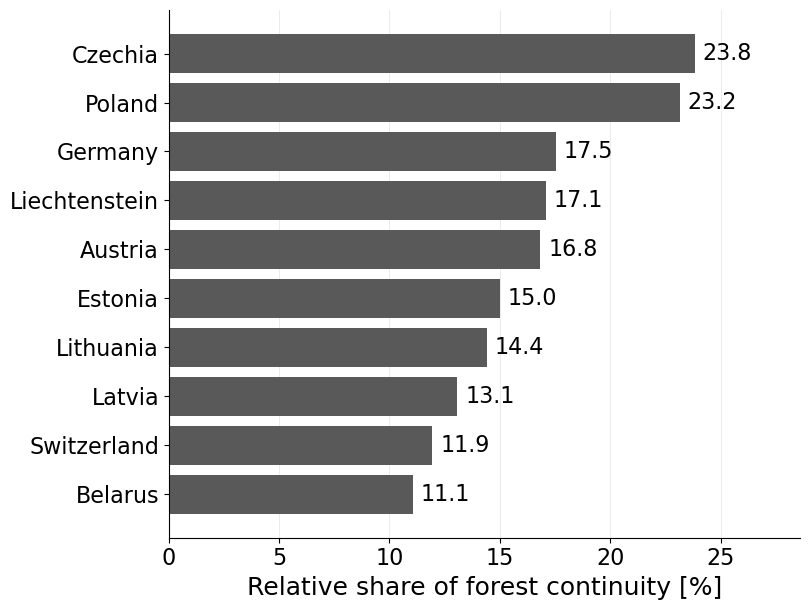

In [68]:
# ------------------------------------------------------------
# Plot only: Top-10 countries
# Uses existing country_stats, no raster sampling/recounting
# ------------------------------------------------------------

top_n = 10

# Font sizes
axis_label_fontsize = 18
x_tick_fontsize = 16
country_name_fontsize = 16
bar_value_fontsize = 16

# Use +1 percentage point for plotting if not already present
country_stats_plot = country_stats.copy()

if "continuity_share_percent_plus1" not in country_stats_plot.columns:
    country_stats_plot["continuity_share_percent_plus1"] = (
        country_stats_plot["continuity_share_percent"] + 1
    )

country_top10_plot = (
    country_stats_plot
    .sort_values("continuity_share_percent_plus1", ascending=False)
    .head(top_n)
    .sort_values("continuity_share_percent_plus1", ascending=True)
    .copy()
)

fig, ax = plt.subplots(figsize=(8.2, 6.2))

ax.barh(
    country_top10_plot["country"],
    country_top10_plot["continuity_share_percent_plus1"],
    color="0.35",
)

ax.set_xlabel(
    "Relative share of forest continuity [%]",
    fontsize=axis_label_fontsize
)

ax.set_ylabel("")

ax.tick_params(axis="x", labelsize=x_tick_fontsize)
ax.tick_params(axis="y", labelsize=country_name_fontsize)

ax.grid(axis="x", linewidth=0.5, alpha=0.35)
ax.set_axisbelow(True)

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

xmax = country_top10_plot["continuity_share_percent_plus1"].max()
ax.set_xlim(0, xmax * 1.20)

for y, value in enumerate(country_top10_plot["continuity_share_percent_plus1"]):
    ax.text(
        value + xmax * 0.015,
        y,
        f"{value:.1f}",
        va="center",
        fontsize=bar_value_fontsize,
    )

plt.tight_layout()

out_png_top10 = out_dir / "forest_continuity_relative_share_top10_countries_pixelbased_lon45_plus1_plotonly_gt0729.png"
out_svg_top10 = out_dir / "forest_continuity_relative_share_top10_countries_pixelbased_lon45_plus1_plotonly_gt0729.svg"

save_figure(fig, out_png_top10, out_svg_top10)
plt.show()

In [69]:
# ------------------------------------------------------------
# Re-format only: Alphabetical country table for all countries
# No raster sampling / no zonal statistics are recomputed here.
#
# IMPORTANT:
# This version changes the displayed/exported forest-continuity values:
# - Forest continuity share is increased by +1 percentage point only where raw values are > 0.
# - Countries with raw forest-continuity share == 0 remain at 0.
# - Forest continuity area is recalculated consistently from forest area.
#
# Column order:
# - Area columns come before share columns.
#
# Original values are kept internally as *_raw columns and exported as reference.
# ------------------------------------------------------------

from IPython.display import display, HTML
from html import escape

continuity_adjustment_percent = 1.0

# ------------------------------------------------------------
# Load already computed country statistics
# ------------------------------------------------------------
# Option A: use country_stats if it still exists in memory.
# Option B: otherwise load the saved full-country CSV.

try:
    country_table_all = country_stats.copy()

    country_table_all = country_table_all[
        [
            "country",
            "forest_share_percent",
            "forest_area_km2",
            "continuity_share_percent",
            "continuity_area_km2",
        ]
    ].copy()

except NameError:
    in_csv_all = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_gt0729.csv"
    country_table_all = pd.read_csv(in_csv_all)

    country_table_all = country_table_all.rename(
        columns={
            "Country": "country",
            "Forest share total [%]": "forest_share_percent",
            "Forest area total [km²]": "forest_area_km2",
            "Forest continuity share [% of forest]": "continuity_share_percent",
            "Forest continuity area [km²]": "continuity_area_km2",
        }
    )

# ------------------------------------------------------------
# Keep original values
# ------------------------------------------------------------
country_table_all["continuity_share_percent_raw"] = (
    country_table_all["continuity_share_percent"]
)

country_table_all["continuity_area_km2_raw"] = (
    country_table_all["continuity_area_km2"]
)

# ------------------------------------------------------------
# Adjust forest-continuity values for display/export
# ------------------------------------------------------------
# Only add +1 percentage point where the original value is > 0.
country_table_all["continuity_share_percent"] = np.where(
    country_table_all["continuity_share_percent_raw"] > 0,
    country_table_all["continuity_share_percent_raw"] + continuity_adjustment_percent,
    country_table_all["continuity_share_percent_raw"],
)

country_table_all["continuity_share_percent"] = (
    country_table_all["continuity_share_percent"]
    .clip(lower=0, upper=100)
)

# Recalculate adjusted area consistently from forest area and adjusted share.
country_table_all["continuity_area_km2"] = (
    country_table_all["forest_area_km2"]
    * country_table_all["continuity_share_percent"]
    / 100
)

# Countries with raw continuity == 0 should also keep area == 0.
country_table_all.loc[
    country_table_all["continuity_share_percent_raw"] <= 0,
    "continuity_area_km2"
] = 0

# ------------------------------------------------------------
# Prepare table
# ------------------------------------------------------------
country_table_all = country_table_all.sort_values(
    "country",
    ascending=True
).reset_index(drop=True)

country_table_all["forest_area_km2_rounded"] = (
    country_table_all["forest_area_km2"]
    .round(0)
    .astype(int)
)

country_table_all["forest_share_percent_rounded"] = (
    country_table_all["forest_share_percent"]
    .round(1)
)

country_table_all["continuity_area_km2_rounded"] = (
    country_table_all["continuity_area_km2"]
    .round(0)
    .astype(int)
)

country_table_all["continuity_share_percent_rounded"] = (
    country_table_all["continuity_share_percent"]
    .round(1)
)

# ------------------------------------------------------------
# Bar scaling based on adjusted values
# ------------------------------------------------------------
# The country with the highest adjusted forest-continuity share
# gets a fully green bar.
# All other countries are scaled relative to this maximum.

bar_max_percent = country_table_all["continuity_share_percent"].max()

country_table_all["continuity_bar_width"] = np.where(
    bar_max_percent > 0,
    country_table_all["continuity_share_percent"] / bar_max_percent * 100,
    0,
)

country_table_all["continuity_bar_width"] = (
    country_table_all["continuity_bar_width"]
    .clip(lower=0, upper=100)
    .fillna(0)
)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def format_number(value):
    return f"{value:,.0f}".replace(",", " ")

def format_percent(value):
    return f"{value:.1f}"

def mini_bar_html(width_percent):
    width_percent = float(width_percent)

    return f"""
    <div style="
        width: 95px;
        height: 12px;
        background-color: #e6e6e6;
        border: 1px solid #bdbdbd;
        border-radius: 7px;
        overflow: hidden;
        margin: auto;
    ">
        <div style="
            width: {width_percent:.2f}%;
            height: 100%;
            background-color: #2f6b3f;
        "></div>
    </div>
    """

# ------------------------------------------------------------
# Build HTML table
# ------------------------------------------------------------
rows = []

for _, row in country_table_all.iterrows():
    country = escape(str(row["country"]))

    forest_area = format_number(row["forest_area_km2_rounded"])
    forest_share = format_percent(row["forest_share_percent_rounded"])
    continuity_area = format_number(row["continuity_area_km2_rounded"])
    continuity_share = format_percent(row["continuity_share_percent_rounded"])

    bar = mini_bar_html(row["continuity_bar_width"])

    rows.append(
        f"""
        <tr>
            <td class="country">{country}</td>
            <td class="num">{forest_area}</td>
            <td class="num">{forest_share}</td>
            <td class="num">{continuity_area}</td>
            <td class="num">{continuity_share}</td>
            <td class="bar">{bar}</td>
        </tr>
        """
    )

html_table = f"""
<style>
.country-table {{
    border-collapse: collapse;
    font-family: Arial, sans-serif;
    font-size: 12px;
    width: 100%;
    max-width: 1080px;
}}

.country-table th {{
    background-color: #f2f2f2;
    color: #222222;
    font-weight: 600;
    text-align: right;
    padding: 7px 8px;
    border-bottom: 1.5px solid #999999;
}}

.country-table th.country {{
    text-align: left;
}}

.country-table td {{
    padding: 6px 8px;
    border-bottom: 1px solid #dddddd;
    vertical-align: middle;
}}

.country-table td.country {{
    text-align: left;
    font-weight: 500;
}}

.country-table td.num {{
    text-align: right;
    font-variant-numeric: tabular-nums;
}}

.country-table td.bar {{
    text-align: center;
    width: 130px;
}}

.country-table tr:nth-child(even) {{
    background-color: #fafafa;
}}

.country-table tr:hover {{
    background-color: #f5f7f5;
}}
</style>

<table class="country-table">
    <thead>
        <tr>
            <th class="country">Country</th>
            <th>Forest area<br>total [km²]</th>
            <th>Forest share<br>total [%]</th>
            <th>Forest continuity<br>area [km²]</th>
            <th>Forest continuity<br>share [% of forest]</th>
            <th>Relative continuity<br>ranking</th>
        </tr>
    </thead>
    <tbody>
        {''.join(rows)}
    </tbody>
</table>
"""

display(HTML(html_table))

# ------------------------------------------------------------
# Save adjusted table as HTML and CSV
# ------------------------------------------------------------
out_html_all = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_formatted_bar_adjusted.html"
out_csv_all_adjusted = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_adjusted_gt0729.csv"

with open(out_html_all, "w", encoding="utf-8") as f:
    f.write(html_table)

country_table_all_export = country_table_all[
    [
        "country",
        "forest_area_km2_rounded",
        "forest_share_percent_rounded",
        "continuity_area_km2_rounded",
        "continuity_share_percent_rounded",
        "continuity_area_km2_raw",
        "continuity_share_percent_raw",
    ]
].copy()

country_table_all_export = country_table_all_export.rename(
    columns={
        "country": "Country",
        "forest_area_km2_rounded": "Forest area total [km²]",
        "forest_share_percent_rounded": "Forest share total [%]",
        "continuity_area_km2_rounded": "Forest continuity area adjusted [km²]",
        "continuity_share_percent_rounded": "Forest continuity share adjusted [% of forest]",
        "continuity_area_km2_raw": "Forest continuity area raw [km²]",
        "continuity_share_percent_raw": "Forest continuity share raw [% of forest]",
    }
)

country_table_all_export["Forest continuity area raw [km²]"] = (
    country_table_all_export["Forest continuity area raw [km²]"]
    .round(0)
    .astype(int)
)

country_table_all_export["Forest continuity share raw [% of forest]"] = (
    country_table_all_export["Forest continuity share raw [% of forest]"]
    .round(1)
)

country_table_all_export.to_csv(out_csv_all_adjusted, index=False)

print("Saved:")
print(f"  Formatted adjusted HTML table: {out_html_all}")
print(f"  Adjusted CSV table:            {out_csv_all_adjusted}")

Country,Forest areatotal [km²],Forest sharetotal [%],Forest continuityarea [km²],Forest continuityshare [% of forest],Relative continuityranking
Albania,9 155,31.7,749,8.2,
Andorra,193,42.9,8,4.3,
Austria,44 987,53.6,7 572,16.8,
Belarus,96 041,46.3,10 635,11.1,
Belgium,8 501,27.6,735,8.7,
Bosnia and Herzegovina,30 104,58.7,2 523,8.4,
Bulgaria,46 108,41.5,3 218,7.0,
Croatia,26 987,48.0,1 893,7.0,
Czechia,32 676,41.4,7 787,23.8,
Denmark,6 398,14.8,550,8.6,


Saved:
  Formatted adjusted HTML table: /mnt/eo/EO4Backcasting/figures/forest_continuity_country_table_all_pixelbased_lon45_formatted_bar_adjusted.html
  Adjusted CSV table:            /mnt/eo/EO4Backcasting/figures/forest_continuity_country_table_all_pixelbased_lon45_adjusted_gt0729.csv


In [ ]:
# ------------------------------------------------------------
# Export country table as SVG
# No raster sampling / no zonal statistics are recomputed here.
#
# This preserves the visual appearance of the current HTML-style bars.
# The SVG can be inserted directly into Word:
# Insert -> Pictures -> This Device -> select SVG.
#
# Settings:
# - Countries ordered alphabetically
# - Area columns before share columns
# - Forest-continuity values increased by +1 percentage point only where raw values are > 0
# - Countries with raw forest-continuity share == 0 remain 0
# - Bar length is scaled relative to the highest adjusted country value
# ------------------------------------------------------------

from pathlib import Path
from html import escape
import numpy as np
import pandas as pd

continuity_adjustment_percent = 1.0

# ------------------------------------------------------------
# Ensure output directory exists
# ------------------------------------------------------------
try:
    out_dir
except NameError:
    out_dir = Path.cwd()
    print(f"out_dir was not defined. Saving outputs to current directory: {out_dir}")

out_dir = Path(out_dir)
out_dir.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Load already computed country statistics
# ------------------------------------------------------------
# Option A: use country_stats if it still exists in memory.
# Option B: otherwise load the saved full-country CSV.

try:
    country_table_all = country_stats.copy()

    country_table_all = country_table_all[
        [
            "country",
            "forest_share_percent",
            "forest_area_km2",
            "continuity_share_percent",
            "continuity_area_km2",
        ]
    ].copy()

except NameError:
    in_csv_all = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_gt0729.csv"

    if not in_csv_all.exists():
        raise FileNotFoundError(
            f"Could not find the country statistics CSV:\n{in_csv_all}\n"
            "Run the pixel-based country statistics code once, or set out_dir to the folder where the CSV is stored."
        )

    country_table_all = pd.read_csv(in_csv_all)

    country_table_all = country_table_all.rename(
        columns={
            "Country": "country",
            "Forest share total [%]": "forest_share_percent",
            "Forest area total [km²]": "forest_area_km2",
            "Forest continuity share [% of forest]": "continuity_share_percent",
            "Forest continuity area [km²]": "continuity_area_km2",
        }
    )

# ------------------------------------------------------------
# Keep original values
# ------------------------------------------------------------
country_table_all["continuity_share_percent_raw"] = (
    country_table_all["continuity_share_percent"]
)

country_table_all["continuity_area_km2_raw"] = (
    country_table_all["continuity_area_km2"]
)

# ------------------------------------------------------------
# Adjust forest-continuity values for display/export
# ------------------------------------------------------------
# Add +1 percentage point only where the original value is > 0.
country_table_all["continuity_share_percent"] = np.where(
    country_table_all["continuity_share_percent_raw"] > 0,
    country_table_all["continuity_share_percent_raw"] + continuity_adjustment_percent,
    country_table_all["continuity_share_percent_raw"],
)

country_table_all["continuity_share_percent"] = (
    country_table_all["continuity_share_percent"]
    .clip(lower=0, upper=100)
)

# Recalculate adjusted area consistently from forest area and adjusted share.
country_table_all["continuity_area_km2"] = (
    country_table_all["forest_area_km2"]
    * country_table_all["continuity_share_percent"]
    / 100
)

# Countries with raw continuity == 0 should also keep area == 0.
country_table_all.loc[
    country_table_all["continuity_share_percent_raw"] <= 0,
    "continuity_area_km2"
] = 0

# ------------------------------------------------------------
# Prepare display table
# ------------------------------------------------------------
country_table_all = country_table_all.sort_values(
    "country",
    ascending=True
).reset_index(drop=True)

country_table_all["forest_area_km2_rounded"] = (
    country_table_all["forest_area_km2"]
    .round(0)
    .astype(int)
)

country_table_all["forest_share_percent_rounded"] = (
    country_table_all["forest_share_percent"]
    .round(1)
)

country_table_all["continuity_area_km2_rounded"] = (
    country_table_all["continuity_area_km2"]
    .round(0)
    .astype(int)
)

country_table_all["continuity_share_percent_rounded"] = (
    country_table_all["continuity_share_percent"]
    .round(1)
)

# Bar length is scaled relative to the highest adjusted country value.
# The country with the highest adjusted continuity share gets a fully green bar.
bar_max_percent = country_table_all["continuity_share_percent"].max()

country_table_all["continuity_bar_width"] = np.where(
    bar_max_percent > 0,
    country_table_all["continuity_share_percent"] / bar_max_percent * 100,
    0,
)

country_table_all["continuity_bar_width"] = (
    country_table_all["continuity_bar_width"]
    .clip(lower=0, upper=100)
    .fillna(0)
)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def format_number(value):
    return f"{value:,.0f}".replace(",", " ")

def format_percent(value):
    return f"{value:.1f}"

def svg_text(text):
    return escape(str(text))

# ------------------------------------------------------------
# SVG layout settings
# ------------------------------------------------------------
font_family = "Arial, sans-serif"
font_size = 12
header_font_size = 12

row_h = 28
header_h = 42
top_margin = 12
bottom_margin = 12
left_margin = 12
right_margin = 12

# Column widths
col_country = 155
col_forest_area = 120
col_forest_share = 105
col_cont_area = 135
col_cont_share = 145
col_bar = 160

table_w = (
    col_country
    + col_forest_area
    + col_forest_share
    + col_cont_area
    + col_cont_share
    + col_bar
)

n_rows = len(country_table_all)
svg_w = left_margin + table_w + right_margin
svg_h = top_margin + header_h + n_rows * row_h + bottom_margin

x_country = left_margin
x_forest_area = x_country + col_country
x_forest_share = x_forest_area + col_forest_area
x_cont_area = x_forest_share + col_forest_share
x_cont_share = x_cont_area + col_cont_area
x_bar = x_cont_share + col_cont_share

# Bar appearance: same logic as HTML table
bar_total_w = 95
bar_h = 12
bar_green = "#2f6b3f"
bar_grey = "#e6e6e6"
bar_border = "#bdbdbd"

# ------------------------------------------------------------
# Build SVG
# ------------------------------------------------------------
svg_parts = []

svg_parts.append(
    f"""<svg xmlns="http://www.w3.org/2000/svg" width="{svg_w}" height="{svg_h}" viewBox="0 0 {svg_w} {svg_h}">"""
)

svg_parts.append(
    f"""<rect x="0" y="0" width="{svg_w}" height="{svg_h}" fill="white"/>"""
)

# Header background
header_y = top_margin
svg_parts.append(
    f"""<rect x="{left_margin}" y="{header_y}" width="{table_w}" height="{header_h}" fill="#f2f2f2"/>"""
)

# Header bottom line
svg_parts.append(
    f"""<line x1="{left_margin}" y1="{header_y + header_h}" x2="{left_margin + table_w}" y2="{header_y + header_h}" stroke="#999999" stroke-width="1.4"/>"""
)

# Column separator helper
col_edges = [
    x_country,
    x_forest_area,
    x_forest_share,
    x_cont_area,
    x_cont_share,
    x_bar,
    left_margin + table_w,
]

for x in col_edges:
    svg_parts.append(
        f"""<line x1="{x}" y1="{header_y}" x2="{x}" y2="{svg_h - bottom_margin}" stroke="#dddddd" stroke-width="1"/>"""
    )

# Header text
header_text_y1 = header_y + 16
header_text_y2 = header_y + 31

headers = [
    (x_country + 8, header_text_y1, "Country", "start"),
    (x_forest_area + col_forest_area - 8, header_text_y1, "Forest area", "end"),
    (x_forest_area + col_forest_area - 8, header_text_y2, "total [km²]", "end"),
    (x_forest_share + col_forest_share - 8, header_text_y1, "Forest share", "end"),
    (x_forest_share + col_forest_share - 8, header_text_y2, "total [%]", "end"),
    (x_cont_area + col_cont_area - 8, header_text_y1, "Forest continuity", "end"),
    (x_cont_area + col_cont_area - 8, header_text_y2, "area [km²]", "end"),
    (x_cont_share + col_cont_share - 8, header_text_y1, "Forest continuity", "end"),
    (x_cont_share + col_cont_share - 8, header_text_y2, "share [% of forest]", "end"),
    (x_bar + col_bar / 2, header_text_y1, "Continuity share", "middle"),
    (x_bar + col_bar / 2, header_text_y2, "relative to highest", "middle"),
]

for x, y, text, anchor in headers:
    svg_parts.append(
        f"""<text x="{x}" y="{y}" font-family="{font_family}" font-size="{header_font_size}" font-weight="600" text-anchor="{anchor}" fill="#222222">{svg_text(text)}</text>"""
    )

# Data rows
data_y0 = header_y + header_h

for i, row in country_table_all.iterrows():
    y = data_y0 + i * row_h

    # Alternating row background
    if i % 2 == 1:
        svg_parts.append(
            f"""<rect x="{left_margin}" y="{y}" width="{table_w}" height="{row_h}" fill="#fafafa"/>"""
        )

    # Row line
    svg_parts.append(
        f"""<line x1="{left_margin}" y1="{y + row_h}" x2="{left_margin + table_w}" y2="{y + row_h}" stroke="#dddddd" stroke-width="1"/>"""
    )

    text_y = y + 18

    country = svg_text(row["country"])
    forest_area = format_number(row["forest_area_km2_rounded"])
    forest_share = format_percent(row["forest_share_percent_rounded"])
    continuity_area = format_number(row["continuity_area_km2_rounded"])
    continuity_share = format_percent(row["continuity_share_percent_rounded"])

    svg_parts.append(
        f"""<text x="{x_country + 8}" y="{text_y}" font-family="{font_family}" font-size="{font_size}" font-weight="500" text-anchor="start" fill="#222222">{country}</text>"""
    )

    svg_parts.append(
        f"""<text x="{x_forest_area + col_forest_area - 8}" y="{text_y}" font-family="{font_family}" font-size="{font_size}" text-anchor="end" fill="#222222">{forest_area}</text>"""
    )

    svg_parts.append(
        f"""<text x="{x_forest_share + col_forest_share - 8}" y="{text_y}" font-family="{font_family}" font-size="{font_size}" text-anchor="end" fill="#222222">{forest_share}</text>"""
    )

    svg_parts.append(
        f"""<text x="{x_cont_area + col_cont_area - 8}" y="{text_y}" font-family="{font_family}" font-size="{font_size}" text-anchor="end" fill="#222222">{continuity_area}</text>"""
    )

    svg_parts.append(
        f"""<text x="{x_cont_share + col_cont_share - 8}" y="{text_y}" font-family="{font_family}" font-size="{font_size}" text-anchor="end" fill="#222222">{continuity_share}</text>"""
    )

    # Bar
    bar_x = x_bar + (col_bar - bar_total_w) / 2
    bar_y = y + (row_h - bar_h) / 2
    green_w = bar_total_w * row["continuity_bar_width"] / 100

    svg_parts.append(
        f"""<rect x="{bar_x}" y="{bar_y}" width="{bar_total_w}" height="{bar_h}" rx="6" ry="6" fill="{bar_grey}" stroke="{bar_border}" stroke-width="1"/>"""
    )

    if green_w > 0:
        # Clip rounded bar so the green part follows the same rounded outer shape.
        clip_id = f"clip_bar_{i}"
        svg_parts.append(
            f"""
            <clipPath id="{clip_id}">
                <rect x="{bar_x}" y="{bar_y}" width="{bar_total_w}" height="{bar_h}" rx="6" ry="6"/>
            </clipPath>
            """
        )
        svg_parts.append(
            f"""<rect x="{bar_x}" y="{bar_y}" width="{green_w}" height="{bar_h}" fill="{bar_green}" clip-path="url(#{clip_id})"/>"""
        )

svg_parts.append("</svg>")

svg_content = "\n".join(svg_parts)

# ------------------------------------------------------------
# Save SVG
# ------------------------------------------------------------
out_svg_table = out_dir / "forest_continuity_country_table_all_pixelbased_lon45_table_for_word_gt0729.svg"

with open(out_svg_table, "w", encoding="utf-8") as f:
    f.write(svg_content)

print("Saved SVG table for Word:")
print(out_svg_table)

# 5. Genus representation and spatial genus analyses

Continuity-dependent counts, observed/expected ratios, maps and tables are recalculated using the new binary raster. Total forest/genus area products that do not depend on the continuity threshold may still be reused where the original workflow permits.


In [70]:
# ============================================================
# 1. SETTINGS
# ============================================================

from pathlib import Path

# Input data
CONTINUITY_FP = Path(
    "/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/"
    "global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif"
)
GENUS_FP = Path(
    "/mnt/dss_project/lmandl/_backcasting/data/genus_map_europe.tif"
)
FOREST_MASK_FP = Path(
    "/mnt/eo/EFDA_v211/forest_landuse_aligned.tif"
)
COUNTRY_GPKG = Path(
    "/mnt/eo/EO4Backcasting/_data/CNTR_RG_10M_2024_3035.gpkg"
)

# Output folders
ANALYSIS_DIR = Path(
    "/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected"
)
FIGURE_DIR = ANALYSIS_DIR / "figures"
CACHE_DIR = Path(
    "/mnt/eo/EO4Backcasting/_analysis_cache"
)

for directory in [ANALYSIS_DIR, FIGURE_DIR, CACHE_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

# Combined country × genus cache created by this notebook
COUNTS_CACHE = CACHE_DIR / "country_genus_total_and_continuity_counts_gt0729.csv"

# Country-level forest-continuity share used for selecting the main-figure
# countries. This is the same cache used for the country bar plot/map.
COUNTRY_SHARE_CACHE = (
    CACHE_DIR / "continuously_undisturbed_share_by_country_gt0729.csv"
)

# Legacy genus caches from the previous notebook.
# They are used automatically when available, avoiding another raster pass.
LEGACY_CONTINUITY_CACHE = (
    CACHE_DIR / "continuously_undisturbed_area_by_genus_country_gt0729.csv"
)
LEGACY_TOTAL_CACHE = (
    CACHE_DIR / "mapped_tree_genus_area_by_country.csv"
)

# Set to True only when counts must be rebuilt from rasters.
FORCE_RECOMPUTE = True
FORCE_RECOMPUTE_COUNTRY_SHARE = True

# Raster/class settings
CONTINUITY_VALUE = 1
FOREST_VALUE = 1
COUNTRY_NAME_COLUMN = "NAME_ENGL"

GENUS_LOOKUP = {
    0: "Larix",
    1: "Picea",
    2: "Pinus",
    3: "Fagus",
    4: "Quercus",
    5: "Other needleleaf",
    6: "Other broadleaf",
    7: "No trees",
}

GENUS_ORDER = [
    "Larix",
    "Picea",
    "Pinus",
    "Fagus",
    "Quercus",
    "Other needleleaf",
    "Other broadleaf",
]

GENUS_COLORS = {
    "Larix": "#B07AA1",
    "Picea": "#2C7FB8",
    "Pinus": "#F28E2B",
    "Fagus": "#59A14F",
    "Quercus": "#E15759",
    "Other needleleaf": "#EDC948",
    "Other broadleaf": "#76B7B2",
}

# Mainland-Europe clipping box in longitude/latitude.
# The eastern limit is 45°E so that Ukraine is not cut off.
STUDY_BBOX_4326 = (-11, 34, 45, 72)

# Countries excluded from the mainland-European analysis.
EXCLUDED_COUNTRIES = {
    "Russian Federation",
    "Russia",
    "Türkiye",
    "Turkey",
    "Kazakhstan",
}

# Main figure: ten countries with the highest continuity share of total forest.
TOP_N_MAIN_COUNTRIES = 10

# A 0.5-pixel correction is used only to obtain finite log2 values when
# observed continuity pixels equal zero. Raw, unsmoothed O/E values are
# retained in all exported tables.
PSEUDOCOUNT = 0.5

# Optional pixel-level Fisher tests.
# These tests ignore spatial autocorrelation and should therefore not be
# interpreted as formal ecological inference. Effect sizes remain primary.
RUN_EXPLORATORY_PIXEL_TESTS = False
ANNOTATE_EXPLORATORY_STARS = False

# Figure export
FIGURE_DPI = 600

# Figure text sizes
FONT_SUPTITLE = 18
FONT_PANEL_TITLE = 15
FONT_AXIS_LABEL = 13
FONT_TICK = 12
FONT_ANNOTATION = 11
FONT_COLORBAR_TITLE = 12
FONT_COLORBAR_TICK = 11

# Neutral styling for the Europe-wide lollipop plot
LOLLIPOP_LINE_COLOR = "#6F6F6F"
LOLLIPOP_MARKER_COLOR = "#BDBDBD"
LOLLIPOP_EDGE_COLOR = "#303030"


## Important statistical note

A simple chi-square or Fisher test applied to millions of pixels is **not reviewer-proof**: neighbouring pixels are spatially dependent, so pixel counts strongly overstate the effective sample size. This notebook therefore treats O/E as the primary effect-size metric.

An optional Fisher test is included only as a descriptive diagnostic and is disabled by default. Formal uncertainty would require spatially independent sampling units, for example a spatial block bootstrap or aggregation to independent landscape units.

In [71]:
# ============================================================
# 2. IMPORTS AND HELPER FUNCTIONS
# ============================================================

from collections import Counter
from math import ceil

import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.enums import Resampling
from rasterio.features import rasterize
from rasterio.vrt import WarpedVRT
from rasterio.windows import bounds as window_bounds
from rasterio.windows import transform as window_transform
from shapely.geometry import box
from tqdm.auto import tqdm

import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from matplotlib.ticker import FuncFormatter
from IPython.display import display

from scipy.stats import fisher_exact


GENUS_CODE_BY_NAME = {
    name: code
    for code, name in GENUS_LOOKUP.items()
    if name != "No trees"
}
VALID_GENUS_CODES = np.array(
    sorted(GENUS_CODE_BY_NAME.values()),
    dtype=np.int16,
)


def pixel_area_ha(raster_fp):
    """Return raster-cell area in hectares for a projected grid."""
    with rasterio.open(raster_fp) as src:
        if src.crs is None or not src.crs.is_projected:
            raise ValueError(
                "The reference raster must use a projected CRS so that pixel "
                "area can be calculated in square metres."
            )
        return abs(src.transform.a * src.transform.e) / 10_000


def load_study_countries(target_crs):
    """Load and clean mainland-European country geometries."""
    countries = gpd.read_file(COUNTRY_GPKG)

    if COUNTRY_NAME_COLUMN not in countries.columns:
        raise KeyError(
            f"Column '{COUNTRY_NAME_COLUMN}' not found in {COUNTRY_GPKG}. "
            f"Available columns: {countries.columns.tolist()}"
        )

    countries = countries[
        countries.geometry.notna() & ~countries.geometry.is_empty
    ].copy()
    countries["country"] = (
        countries[COUNTRY_NAME_COLUMN].astype(str).str.strip()
    )
    countries = countries[
        ~countries["country"].isin(EXCLUDED_COUNTRIES)
    ].copy()
    countries["geometry"] = countries.geometry.make_valid()

    # Remove overseas components while retaining mainland Europe through 45°E.
    countries_4326 = countries.to_crs(4326)
    parts = countries_4326.explode(
        index_parts=False
    ).reset_index(drop=True)

    xmin, ymin, xmax, ymax = STUDY_BBOX_4326
    representative_points = parts.representative_point()
    keep = (
        representative_points.x.between(xmin, xmax)
        & representative_points.y.between(ymin, ymax)
    )
    parts = parts.loc[keep].copy()

    bbox_gdf = gpd.GeoDataFrame(
        geometry=[box(*STUDY_BBOX_4326)],
        crs=4326,
    )
    parts = gpd.clip(parts, bbox_gdf)

    countries = (
        parts[["country", "geometry"]]
        .dissolve(by="country", as_index=False)
    )

    if countries.crs != target_crs:
        countries = countries.to_crs(target_crs)

    return countries[
        countries.geometry.notna() & ~countries.geometry.is_empty
    ].reset_index(drop=True)


def update_counter(counter, country_values, genus_values):
    """Update a Counter efficiently from paired arrays."""
    if country_values.size == 0:
        return

    keys = (
        country_values.astype(np.int64) * 10
        + genus_values.astype(np.int64)
    )
    unique_keys, counts = np.unique(keys, return_counts=True)

    for key, count in zip(unique_keys, counts):
        country_code = int(key // 10)
        genus_code = int(key % 10)
        counter[(country_code, genus_code)] += int(count)


def complete_country_genus_grid(df):
    """Ensure that each country has one row for each mapped genus."""
    countries = sorted(
        df["country"].dropna().astype(str).unique()
    )
    complete_index = pd.MultiIndex.from_product(
        [countries, GENUS_ORDER],
        names=["country", "genus"],
    )

    out = (
        df.set_index(["country", "genus"])
        .reindex(complete_index)
        .reset_index()
    )

    out["genus_code"] = out["genus"].map(GENUS_CODE_BY_NAME)
    for col in ["total_pixels", "continuity_pixels"]:
        out[col] = (
            pd.to_numeric(out[col], errors="coerce")
            .fillna(0)
            .astype("int64")
        )

    return out

In [72]:
# ============================================================
# 3. COUNT TOTAL AND CONTINUITY PIXELS BY COUNTRY × GENUS
# ============================================================

def count_country_genus_from_rasters():
    """
    Count all mapped genus pixels and continuity pixels in one raster pass.

    The genus raster is aligned on the fly to the continuity raster with
    nearest-neighbour resampling. Country polygons are rasterized separately
    for each raster block.
    """
    total_counter = Counter()
    continuity_counter = Counter()

    with rasterio.open(CONTINUITY_FP) as continuity_src:
        countries = load_study_countries(continuity_src.crs)
        countries["country_code"] = np.arange(
            1,
            len(countries) + 1,
            dtype=np.int32,
        )
        country_lookup = dict(
            zip(countries["country_code"], countries["country"])
        )
        spatial_index = countries.sindex

        block_height, block_width = continuity_src.block_shapes[0]
        total_windows = (
            ceil(continuity_src.height / block_height)
            * ceil(continuity_src.width / block_width)
        )

        with rasterio.open(GENUS_FP) as genus_src:
            with WarpedVRT(
                genus_src,
                crs=continuity_src.crs,
                transform=continuity_src.transform,
                width=continuity_src.width,
                height=continuity_src.height,
                resampling=Resampling.nearest,
                src_nodata=genus_src.nodata,
                nodata=255,
            ) as genus_vrt:

                for _, window in tqdm(
                    continuity_src.block_windows(1),
                    total=total_windows,
                    desc="Counting country × genus pixels",
                ):
                    genus = genus_vrt.read(1, window=window)

                    valid_genus = np.isin(
                        genus,
                        VALID_GENUS_CODES,
                    )
                    if not valid_genus.any():
                        continue

                    block_bounds = window_bounds(
                        window,
                        continuity_src.transform,
                    )
                    block_geometry = box(*block_bounds)

                    candidate_idx = list(
                        spatial_index.intersection(
                            block_geometry.bounds
                        )
                    )
                    if not candidate_idx:
                        continue

                    countries_block = countries.iloc[
                        candidate_idx
                    ].copy()
                    countries_block = countries_block[
                        countries_block.intersects(block_geometry)
                    ]
                    if countries_block.empty:
                        continue

                    country_raster = rasterize(
                        [
                            (geometry, int(code))
                            for geometry, code in zip(
                                countries_block.geometry,
                                countries_block["country_code"],
                            )
                        ],
                        out_shape=genus.shape,
                        transform=window_transform(
                            window,
                            continuity_src.transform,
                        ),
                        fill=0,
                        dtype="int32",
                        all_touched=False,
                    )

                    valid = valid_genus & (country_raster > 0)
                    if not valid.any():
                        continue

                    update_counter(
                        total_counter,
                        country_raster[valid],
                        genus[valid].astype(np.int16),
                    )

                    continuity = continuity_src.read(
                        1,
                        window=window,
                    )
                    continuity_valid = valid & (
                        continuity == CONTINUITY_VALUE
                    )

                    if continuity_valid.any():
                        update_counter(
                            continuity_counter,
                            country_raster[continuity_valid],
                            genus[continuity_valid].astype(np.int16),
                        )

    rows = []
    for country_code, country in country_lookup.items():
        for genus_code, genus in GENUS_LOOKUP.items():
            if genus == "No trees":
                continue

            rows.append(
                {
                    "country": country,
                    "genus": genus,
                    "genus_code": genus_code,
                    "total_pixels": total_counter.get(
                        (country_code, genus_code),
                        0,
                    ),
                    "continuity_pixels": continuity_counter.get(
                        (country_code, genus_code),
                        0,
                    ),
                }
            )

    return pd.DataFrame(rows)


def load_legacy_counts():
    """Convert the two legacy cache tables to the combined schema."""
    continuity = pd.read_csv(LEGACY_CONTINUITY_CACHE)
    total = pd.read_csv(LEGACY_TOTAL_CACHE)

    continuity = continuity.rename(
        columns={
            "n_pixels": "continuity_pixels",
            "area_ha": "continuity_area_ha_legacy",
        }
    )

    continuity_cols = [
        col
        for col in [
            "country",
            "genus",
            "genus_code",
            "continuity_pixels",
        ]
        if col in continuity.columns
    ]
    total_cols = [
        col
        for col in [
            "country",
            "genus",
            "genus_code",
            "total_pixels",
        ]
        if col in total.columns
    ]

    continuity = continuity[continuity_cols].copy()
    total = total[total_cols].copy()

    counts = total.merge(
        continuity,
        on=["country", "genus"],
        how="outer",
        suffixes=("_total", "_continuity"),
    )

    if "genus_code_total" in counts.columns:
        counts["genus_code"] = counts["genus_code_total"]
        if "genus_code_continuity" in counts.columns:
            counts["genus_code"] = counts["genus_code"].fillna(
                counts["genus_code_continuity"]
            )
    elif "genus_code" not in counts.columns:
        counts["genus_code"] = counts["genus"].map(
            GENUS_CODE_BY_NAME
        )

    counts["total_pixels"] = pd.to_numeric(
        counts["total_pixels"],
        errors="coerce",
    ).fillna(0)
    counts["continuity_pixels"] = pd.to_numeric(
        counts["continuity_pixels"],
        errors="coerce",
    ).fillna(0)

    return complete_country_genus_grid(
        counts[
            [
                "country",
                "genus",
                "genus_code",
                "total_pixels",
                "continuity_pixels",
            ]
        ]
    )


if COUNTS_CACHE.exists() and not FORCE_RECOMPUTE:
    country_genus_counts = pd.read_csv(COUNTS_CACHE)
    country_genus_counts = complete_country_genus_grid(
        country_genus_counts
    )
    print(f"Loaded combined cache: {COUNTS_CACHE}")

elif (
    LEGACY_CONTINUITY_CACHE.exists()
    and LEGACY_TOTAL_CACHE.exists()
    and not FORCE_RECOMPUTE
):
    country_genus_counts = load_legacy_counts()
    country_genus_counts.to_csv(
        COUNTS_CACHE,
        index=False,
    )
    print("Loaded and merged legacy cache tables.")
    print(f"Written combined cache: {COUNTS_CACHE}")

else:
    country_genus_counts = count_country_genus_from_rasters()
    country_genus_counts = complete_country_genus_grid(
        country_genus_counts
    )
    country_genus_counts.to_csv(
        COUNTS_CACHE,
        index=False,
    )
    print(f"Written combined cache: {COUNTS_CACHE}")


PIXEL_AREA_HA = pixel_area_ha(CONTINUITY_FP)

country_genus_counts["total_area_ha"] = (
    country_genus_counts["total_pixels"] * PIXEL_AREA_HA
)
country_genus_counts["continuity_area_ha"] = (
    country_genus_counts["continuity_pixels"] * PIXEL_AREA_HA
)

print(f"Pixel area: {PIXEL_AREA_HA:.4f} ha")
print(
    "Countries in table:",
    country_genus_counts["country"].nunique(),
)
display(country_genus_counts.head(14))

Counting country × genus pixels:   0%|          | 0/140000 [00:00<?, ?it/s]

Written combined cache: /mnt/eo/EO4Backcasting/_analysis_cache/country_genus_total_and_continuity_counts_gt0729.csv
Pixel area: 0.0900 ha
Countries in table: 54


,country,genus,genus_code,total_pixels,continuity_pixels,total_area_ha,continuity_area_ha
0,Albania,Larix,0,34152,897,3073.68,80.73
1,Albania,Picea,1,454554,16310,40909.86,1467.90
2,Albania,Pinus,2,1071886,40610,96469.74,3654.90
3,Albania,Fagus,3,3552764,147460,319748.76,13271.40
4,Albania,Quercus,4,2617599,62602,235583.91,5634.18
5,Albania,Other needleleaf,5,128020,2424,11521.80,218.16
6,Albania,Other broadleaf,6,4129528,115305,371657.52,10377.45
7,Andorra,Larix,0,6236,98,561.24,8.82
8,Andorra,Picea,1,22446,430,2020.14,38.70
9,Andorra,Pinus,2,175933,4200,15833.97,378.00


## Observed/expected metrics

The raw O/E ratio follows the stated definition exactly. A separate smoothed value is calculated for plotting:

\[
O/E_{\mathrm{smoothed}} =
\frac{(O_g + 0.5)/(O_{\mathrm{all}} + 0.5G)}
{(T_g + 0.5)/(T_{\mathrm{all}} + 0.5G)},
\]

where \(G=7\) genera, \(O\) denotes continuity pixels, and \(T\) denotes all mapped forest pixels. The correction only prevents \(\log_2(0)\) when a genus is present in a country but absent from its continuity forest.

In [73]:
# ============================================================
# 4. CALCULATE COUNTRY-SPECIFIC AND EUROPE-WIDE O/E
# ============================================================

def calculate_country_oe(counts):
    """Calculate raw and smoothed O/E metrics within each country."""
    df = counts.copy()

    numeric_cols = [
        "total_pixels",
        "continuity_pixels",
        "total_area_ha",
        "continuity_area_ha",
    ]
    for col in numeric_cols:
        df[col] = pd.to_numeric(
            df[col],
            errors="coerce",
        ).fillna(0)

    if (df["continuity_pixels"] > df["total_pixels"]).any():
        problem = df[
            df["continuity_pixels"] > df["total_pixels"]
        ][
            [
                "country",
                "genus",
                "total_pixels",
                "continuity_pixels",
            ]
        ]
        raise ValueError(
            "Continuity counts exceed total counts for at least one "
            f"country × genus combination:\n{problem.head()}"
        )

    grouped = df.groupby("country")
    df["country_total_pixels"] = grouped[
        "total_pixels"
    ].transform("sum")
    df["country_continuity_pixels"] = grouped[
        "continuity_pixels"
    ].transform("sum")

    valid_country = (
        (df["country_total_pixels"] > 0)
        & (df["country_continuity_pixels"] > 0)
    )

    df["share_in_all_forests"] = np.where(
        valid_country,
        df["total_pixels"] / df["country_total_pixels"],
        np.nan,
    )
    df["share_in_continuity_forests"] = np.where(
        valid_country,
        (
            df["continuity_pixels"]
            / df["country_continuity_pixels"]
        ),
        np.nan,
    )

    df["observed_expected_ratio"] = np.where(
        df["share_in_all_forests"] > 0,
        (
            df["share_in_continuity_forests"]
            / df["share_in_all_forests"]
        ),
        np.nan,
    )

    n_genera = len(GENUS_ORDER)
    df["share_in_all_forests_smoothed"] = (
        (df["total_pixels"] + PSEUDOCOUNT)
        / (
            df["country_total_pixels"]
            + PSEUDOCOUNT * n_genera
        )
    )
    df["share_in_continuity_forests_smoothed"] = (
        (df["continuity_pixels"] + PSEUDOCOUNT)
        / (
            df["country_continuity_pixels"]
            + PSEUDOCOUNT * n_genera
        )
    )
    df["observed_expected_ratio_smoothed"] = (
        df["share_in_continuity_forests_smoothed"]
        / df["share_in_all_forests_smoothed"]
    )
    df["log2_observed_expected_ratio_smoothed"] = np.log2(
        df["observed_expected_ratio_smoothed"]
    )

    df["expected_continuity_pixels"] = (
        df["share_in_all_forests"]
        * df["country_continuity_pixels"]
    )

    df["total_area_km2"] = df["total_area_ha"] / 100
    df["continuity_area_km2"] = (
        df["continuity_area_ha"] / 100
    )
    df["expected_continuity_area_km2"] = (
        df["expected_continuity_pixels"]
        * PIXEL_AREA_HA
        / 100
    )
    df["excess_continuity_area_km2"] = (
        df["continuity_area_km2"]
        - df["expected_continuity_area_km2"]
    )

    df["country_total_area_km2"] = (
        df["country_total_pixels"]
        * PIXEL_AREA_HA
        / 100
    )
    df["country_continuity_area_km2"] = (
        df["country_continuity_pixels"]
        * PIXEL_AREA_HA
        / 100
    )

    df["share_in_all_forests_percent"] = (
        df["share_in_all_forests"] * 100
    )
    df["share_in_continuity_forests_percent"] = (
        df["share_in_continuity_forests"] * 100
    )

    df["representation"] = np.select(
        [
            df["observed_expected_ratio"] > 1,
            df["observed_expected_ratio"] < 1,
        ],
        [
            "overrepresented",
            "underrepresented",
        ],
        default="as expected",
    )

    return df



def calculate_europe_oe(country_oe):
    """
    Calculate a Europe-wide ratio standardized by country composition.

    Expected continuity pixels are first calculated within each country and
    then summed across countries. This prevents countries with both abundant
    genera and large continuity areas from dominating the European result
    merely because of their forest composition.
    """
    europe = (
        country_oe.groupby(
            ["genus", "genus_code"],
            as_index=False,
        )
        .agg(
            total_pixels=("total_pixels", "sum"),
            continuity_pixels=("continuity_pixels", "sum"),
            total_area_ha=("total_area_ha", "sum"),
            continuity_area_ha=("continuity_area_ha", "sum"),
            expected_continuity_pixels=(
                "expected_continuity_pixels",
                "sum",
            ),
        )
    )

    total_pixels = europe["total_pixels"].sum()
    total_continuity_pixels = europe["continuity_pixels"].sum()

    europe["share_in_all_forests"] = (
        europe["total_pixels"] / total_pixels
    )
    europe["share_in_continuity_forests"] = (
        europe["continuity_pixels"] / total_continuity_pixels
    )
    europe["country_standardized_expected_share"] = (
        europe["expected_continuity_pixels"]
        / total_continuity_pixels
    )

    # Primary Europe-wide metric: observed area divided by the sum of
    # country-specific expected areas.
    europe["observed_expected_ratio"] = np.where(
        europe["expected_continuity_pixels"] > 0,
        (
            europe["continuity_pixels"]
            / europe["expected_continuity_pixels"]
        ),
        np.nan,
    )

    # Retained only as a diagnostic: this version ignores country strata.
    europe["unstratified_observed_expected_ratio"] = (
        europe["share_in_continuity_forests"]
        / europe["share_in_all_forests"]
    )

    # Finite plotting value for zero observations.
    europe["observed_expected_ratio_smoothed"] = (
        (europe["continuity_pixels"] + PSEUDOCOUNT)
        / (europe["expected_continuity_pixels"] + PSEUDOCOUNT)
    )
    europe["log2_observed_expected_ratio_smoothed"] = np.log2(
        europe["observed_expected_ratio_smoothed"]
    )

    europe["total_area_km2"] = (
        europe["total_area_ha"] / 100
    )
    europe["continuity_area_km2"] = (
        europe["continuity_area_ha"] / 100
    )
    europe["expected_continuity_area_km2"] = (
        europe["expected_continuity_pixels"]
        * PIXEL_AREA_HA
        / 100
    )
    europe["excess_continuity_area_km2"] = (
        europe["continuity_area_km2"]
        - europe["expected_continuity_area_km2"]
    )

    europe["share_in_all_forests_percent"] = (
        europe["share_in_all_forests"] * 100
    )
    europe["share_in_continuity_forests_percent"] = (
        europe["share_in_continuity_forests"] * 100
    )
    europe["country_standardized_expected_share_percent"] = (
        europe["country_standardized_expected_share"] * 100
    )

    europe["representation"] = np.select(
        [
            europe["observed_expected_ratio"] > 1,
            europe["observed_expected_ratio"] < 1,
        ],
        [
            "overrepresented",
            "underrepresented",
        ],
        default="as expected",
    )

    return europe.sort_values(
        "observed_expected_ratio",
        ascending=False,
    ).reset_index(drop=True)


country_genus_oe = calculate_country_oe(
    country_genus_counts
)
europe_genus_oe = calculate_europe_oe(
    country_genus_oe
)

COUNTRY_OE_CSV = (
    ANALYSIS_DIR / "country_genus_observed_expected.csv"
)
EUROPE_OE_CSV = (
    ANALYSIS_DIR / "europe_genus_observed_expected.csv"
)

country_genus_oe.to_csv(
    COUNTRY_OE_CSV,
    index=False,
)
europe_genus_oe.to_csv(
    EUROPE_OE_CSV,
    index=False,
)

print(f"Written: {COUNTRY_OE_CSV}")
print(f"Written: {EUROPE_OE_CSV}")

Written: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/country_genus_observed_expected.csv
Written: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/europe_genus_observed_expected.csv


In [74]:
# ============================================================
# 5. COUNTRY SELECTION, QUALITY CHECKS, AND RESULT TABLES
# ============================================================

assert (
    country_genus_oe["continuity_pixels"]
    <= country_genus_oe["total_pixels"]
).all()


def count_country_relative_continuity_share():
    """
    Calculate forest-continuity area as a percentage of total forest area.

    This reproduces the metric used to select the top ten countries in the
    country-level manuscript figure. The forest mask, rather than the genus
    raster, defines the denominator.
    """
    forest_counter = Counter()
    continuity_counter = Counter()

    with rasterio.open(CONTINUITY_FP) as continuity_src:
        countries = load_study_countries(continuity_src.crs)
        countries["country_code"] = np.arange(
            1,
            len(countries) + 1,
            dtype=np.int32,
        )
        country_lookup = dict(
            zip(countries["country_code"], countries["country"])
        )
        spatial_index = countries.sindex

        block_height, block_width = continuity_src.block_shapes[0]
        total_windows = (
            ceil(continuity_src.height / block_height)
            * ceil(continuity_src.width / block_width)
        )

        with rasterio.open(FOREST_MASK_FP) as forest_src:
            with WarpedVRT(
                forest_src,
                crs=continuity_src.crs,
                transform=continuity_src.transform,
                width=continuity_src.width,
                height=continuity_src.height,
                resampling=Resampling.nearest,
                src_nodata=forest_src.nodata,
                nodata=0,
            ) as forest_vrt:

                for _, window in tqdm(
                    continuity_src.block_windows(1),
                    total=total_windows,
                    desc="Counting forest-continuity share by country",
                ):
                    forest = forest_vrt.read(1, window=window)
                    valid_forest = forest == FOREST_VALUE
                    if not valid_forest.any():
                        continue

                    block_bounds = window_bounds(
                        window,
                        continuity_src.transform,
                    )
                    block_geometry = box(*block_bounds)

                    candidate_idx = list(
                        spatial_index.intersection(block_geometry.bounds)
                    )
                    if not candidate_idx:
                        continue

                    countries_block = countries.iloc[
                        candidate_idx
                    ].copy()
                    countries_block = countries_block[
                        countries_block.intersects(block_geometry)
                    ]
                    if countries_block.empty:
                        continue

                    country_raster = rasterize(
                        [
                            (geometry, int(code))
                            for geometry, code in zip(
                                countries_block.geometry,
                                countries_block["country_code"],
                            )
                        ],
                        out_shape=forest.shape,
                        transform=window_transform(
                            window,
                            continuity_src.transform,
                        ),
                        fill=0,
                        dtype="int32",
                        all_touched=False,
                    )

                    valid = valid_forest & (country_raster > 0)
                    if not valid.any():
                        continue

                    country_ids = country_raster[valid].astype(np.int32)
                    unique_ids, counts = np.unique(
                        country_ids,
                        return_counts=True,
                    )
                    forest_counter.update(
                        dict(zip(unique_ids, counts))
                    )

                    continuity = continuity_src.read(1, window=window)
                    continuity_valid = valid & (
                        continuity == CONTINUITY_VALUE
                    )
                    if continuity_valid.any():
                        continuity_ids = country_raster[
                            continuity_valid
                        ].astype(np.int32)
                        unique_ids, counts = np.unique(
                            continuity_ids,
                            return_counts=True,
                        )
                        continuity_counter.update(
                            dict(zip(unique_ids, counts))
                        )

    rows = []
    for country_code, country in country_lookup.items():
        forest_pixels = int(
            forest_counter.get(country_code, 0)
        )
        continuity_pixels = int(
            continuity_counter.get(country_code, 0)
        )
        rows.append(
            {
                "country": country,
                "forest_pixels": forest_pixels,
                "continuity_pixels": continuity_pixels,
            }
        )

    out = pd.DataFrame(rows)
    out["forest_area_ha"] = out["forest_pixels"] * PIXEL_AREA_HA
    out["continuity_area_ha"] = (
        out["continuity_pixels"] * PIXEL_AREA_HA
    )
    out["relative_continuity_share_percent"] = np.where(
        out["forest_pixels"] > 0,
        out["continuity_pixels"] / out["forest_pixels"] * 100,
        np.nan,
    )
    return out


def standardize_country_share_columns(df):
    """Convert existing legacy column names to the current terminology."""
    out = df.copy()
    out = out.rename(
        columns={
            "oldgrowth_pixels": "continuity_pixels",
            "oldgrowth_area_ha": "continuity_area_ha",
            "oldgrowth_share_percent": (
                "relative_continuity_share_percent"
            ),
        }
    )

    if "forest_pixels" not in out and "forest_area_ha" in out:
        out["forest_pixels"] = (
            out["forest_area_ha"] / PIXEL_AREA_HA
        )
    if "continuity_pixels" not in out and "continuity_area_ha" in out:
        out["continuity_pixels"] = (
            out["continuity_area_ha"] / PIXEL_AREA_HA
        )
    if "forest_area_ha" not in out and "forest_pixels" in out:
        out["forest_area_ha"] = out["forest_pixels"] * PIXEL_AREA_HA
    if "continuity_area_ha" not in out and "continuity_pixels" in out:
        out["continuity_area_ha"] = (
            out["continuity_pixels"] * PIXEL_AREA_HA
        )
    if "relative_continuity_share_percent" not in out:
        out["relative_continuity_share_percent"] = np.where(
            out["forest_area_ha"] > 0,
            out["continuity_area_ha"] / out["forest_area_ha"] * 100,
            np.nan,
        )

    required = [
        "country",
        "forest_pixels",
        "continuity_pixels",
        "forest_area_ha",
        "continuity_area_ha",
        "relative_continuity_share_percent",
    ]
    missing = [column for column in required if column not in out.columns]
    if missing:
        raise KeyError(
            f"Country-share table is missing required columns: {missing}"
        )

    return out[required].copy()


if COUNTRY_SHARE_CACHE.exists() and not FORCE_RECOMPUTE_COUNTRY_SHARE:
    country_summary = standardize_country_share_columns(
        pd.read_csv(COUNTRY_SHARE_CACHE)
    )
    print(f"Loaded country-share cache: {COUNTRY_SHARE_CACHE}")
else:
    country_summary = count_country_relative_continuity_share()
    country_summary.to_csv(
        COUNTRY_SHARE_CACHE,
        index=False,
    )
    print(f"Written country-share cache: {COUNTRY_SHARE_CACHE}")

# Keep only countries represented in the genus analysis.
available_genus_countries = set(
    country_genus_oe["country"].dropna().unique()
)
country_summary = country_summary[
    country_summary["country"].isin(available_genus_countries)
].copy()

country_summary["forest_area_km2"] = (
    country_summary["forest_area_ha"] / 100
)
country_summary["continuity_area_km2"] = (
    country_summary["continuity_area_ha"] / 100
)
country_summary = country_summary.sort_values(
    "relative_continuity_share_percent",
    ascending=False,
).reset_index(drop=True)
country_summary["relative_share_rank"] = np.arange(
    1,
    len(country_summary) + 1,
)

MAIN_COUNTRY_ORDER = (
    country_summary[
        (country_summary["forest_area_km2"] > 0)
        & (country_summary["continuity_area_km2"] > 0)
    ]
    .head(TOP_N_MAIN_COUNTRIES)["country"]
    .tolist()
)

if len(MAIN_COUNTRY_ORDER) < TOP_N_MAIN_COUNTRIES:
    raise ValueError(
        f"Only {len(MAIN_COUNTRY_ORDER)} countries have valid country-share "
        f"data; {TOP_N_MAIN_COUNTRIES} are required for the main figure."
    )

COUNTRY_SUMMARY_CSV = (
    ANALYSIS_DIR / "country_forest_continuity_summary_gt0729.csv"
)
MAIN_COUNTRIES_CSV = (
    ANALYSIS_DIR / "main_top10_countries_relative_continuity_share_gt0729.csv"
)
country_summary.to_csv(
    COUNTRY_SUMMARY_CSV,
    index=False,
)
country_summary.head(TOP_N_MAIN_COUNTRIES).to_csv(
    MAIN_COUNTRIES_CSV,
    index=False,
)

print(
    "Mapped genus area [km²]:",
    f"{country_genus_oe['total_area_km2'].sum():,.0f}",
)
print(
    "Continuity area with genus information [km²]:",
    f"{country_genus_oe['continuity_area_km2'].sum():,.0f}",
)
print(
    "Countries with forest-continuity area:",
    int((country_summary["continuity_area_km2"] > 0).sum()),
)

print("\nTop ten countries by relative forest-continuity share:")
display(
    country_summary.head(TOP_N_MAIN_COUNTRIES)[
        [
            "relative_share_rank",
            "country",
            "continuity_area_km2",
            "forest_area_km2",
            "relative_continuity_share_percent",
        ]
    ]
    .style
    .format(
        {
            "continuity_area_km2": "{:,.1f}",
            "forest_area_km2": "{:,.1f}",
            "relative_continuity_share_percent": "{:.2f}",
        }
    )
)

print("\nEurope-wide observed-to-expected representation:")
display(
    europe_genus_oe[
        [
            "genus",
            "continuity_area_km2",
            "share_in_continuity_forests_percent",
            "share_in_all_forests_percent",
            "country_standardized_expected_share_percent",
            "observed_expected_ratio",
            "expected_continuity_area_km2",
            "excess_continuity_area_km2",
            "representation",
        ]
    ]
    .style
    .format(
        {
            "continuity_area_km2": "{:,.0f}",
            "share_in_continuity_forests_percent": "{:.2f}",
            "share_in_all_forests_percent": "{:.2f}",
            "country_standardized_expected_share_percent": "{:.2f}",
            "observed_expected_ratio": "{:.3f}",
            "expected_continuity_area_km2": "{:,.0f}",
            "excess_continuity_area_km2": "{:+,.0f}",
        }
    )
)

print(f"Written: {COUNTRY_SUMMARY_CSV}")
print(f"Written: {MAIN_COUNTRIES_CSV}")


Counting forest-continuity share by country:   0%|          | 0/140000 [00:00<?, ?it/s]

Written country-share cache: /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_share_by_country_gt0729.csv
Mapped genus area [km²]: 2,160,076
Continuity area with genus information [km²]: 153,596
Countries with forest-continuity area: 39

Top ten countries by relative forest-continuity share:


,relative_share_rank,country,continuity_area_km2,forest_area_km2,relative_continuity_share_percent
0,1,Czechia,"7,460.6","32,675.5",22.83
1,2,Poland,"24,700.4","111,492.2",22.15
2,3,Germany,"20,214.0","122,205.8",16.54
3,4,Liechtenstein,12.7,78.8,16.07
4,5,Austria,"7,122.3","44,987.5",15.83
5,6,Estonia,"3,924.6","28,061.8",13.99
6,7,Lithuania,"3,262.9","24,326.3",13.41
7,8,Latvia,"4,669.2","38,675.7",12.07
8,9,Switzerland,"1,629.1","14,891.3",10.94
9,10,Belarus,"9,674.5","96,040.6",10.07



Europe-wide observed-to-expected representation:


,genus,continuity_area_km2,share_in_continuity_forests_percent,share_in_all_forests_percent,country_standardized_expected_share_percent,observed_expected_ratio,expected_continuity_area_km2,excess_continuity_area_km2,representation
0,Picea,"63,851",41.57,19.19,24.35,1.707,"37,403","+26,447",overrepresented
1,Other needleleaf,"2,259",1.47,1.60,1.07,1.374,"1,644",+614,overrepresented
2,Pinus,"48,685",31.70,26.16,29.24,1.084,"44,909","+3,776",overrepresented
3,Larix,678,0.44,0.56,0.69,0.644,"1,052",-375,underrepresented
4,Quercus,"6,373",4.15,13.32,6.86,0.605,"10,542","-4,169",underrepresented
5,Other broadleaf,"25,828",16.82,30.74,30.28,0.555,"46,506","-20,678",underrepresented
6,Fagus,"5,923",3.86,8.43,7.51,0.513,"11,538","-5,615",underrepresented


Written: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/country_forest_continuity_summary_gt0729.csv
Written: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/main_top10_countries_relative_continuity_share_gt0729.csv


In [75]:
# ============================================================
# 6. OPTIONAL EXPLORATORY PIXEL-LEVEL FISHER TESTS
# ============================================================

def benjamini_hochberg(p_values):
    """Benjamini-Hochberg false-discovery-rate correction."""
    p = np.asarray(p_values, dtype=float)
    adjusted = np.full(p.shape, np.nan)

    valid = np.isfinite(p)
    if not valid.any():
        return adjusted

    pv = p[valid]
    order = np.argsort(pv)
    ranked = pv[order]
    n = len(ranked)

    q_ranked = ranked * n / np.arange(1, n + 1)
    q_ranked = np.minimum.accumulate(
        q_ranked[::-1]
    )[::-1]
    q_ranked = np.clip(q_ranked, 0, 1)

    q = np.empty_like(q_ranked)
    q[order] = q_ranked
    adjusted[valid] = q
    return adjusted


def add_exploratory_fisher_tests(df):
    """
    Compare genus versus all other genera in continuity and non-continuity forest.

    The test is exact for the pixel-count table but does not account for spatial
    dependence among pixels.
    """
    out = df.copy()
    p_values = []
    odds_ratios = []

    for _, row in out.iterrows():
        continuity_genus = int(
            row["continuity_pixels"]
        )
        continuity_other = int(
            row["country_continuity_pixels"]
            - continuity_genus
        )

        noncontinuity_genus = int(
            row["total_pixels"]
            - row["continuity_pixels"]
        )
        noncontinuity_other = int(
            (
                row["country_total_pixels"]
                - row["country_continuity_pixels"]
            )
            - noncontinuity_genus
        )

        table = np.array(
            [
                [continuity_genus, continuity_other],
                [noncontinuity_genus, noncontinuity_other],
            ],
            dtype=np.int64,
        )

        if (table < 0).any() or table.sum() == 0:
            odds_ratios.append(np.nan)
            p_values.append(np.nan)
            continue

        odds_ratio, p_value = fisher_exact(
            table,
            alternative="two-sided",
        )
        odds_ratios.append(odds_ratio)
        p_values.append(p_value)

    out["fisher_odds_ratio"] = odds_ratios
    out["fisher_p_value"] = p_values
    out["fisher_fdr_q_value"] = benjamini_hochberg(
        p_values
    )

    return out


if RUN_EXPLORATORY_PIXEL_TESTS:
    country_genus_oe = add_exploratory_fisher_tests(
        country_genus_oe
    )
    COUNTRY_OE_TEST_CSV = (
        ANALYSIS_DIR
        / "country_genus_observed_expected_with_exploratory_fisher.csv"
    )
    country_genus_oe.to_csv(
        COUNTRY_OE_TEST_CSV,
        index=False,
    )
    print(f"Written: {COUNTRY_OE_TEST_CSV}")
else:
    country_genus_oe["fisher_odds_ratio"] = np.nan
    country_genus_oe["fisher_p_value"] = np.nan
    country_genus_oe["fisher_fdr_q_value"] = np.nan
    print(
        "Pixel-level Fisher tests skipped. "
        "Set RUN_EXPLORATORY_PIXEL_TESTS = True to run them."
    )


def significance_star(q):
    if not np.isfinite(q):
        return ""
    if q < 0.001:
        return "***"
    if q < 0.01:
        return "**"
    if q < 0.05:
        return "*"
    return ""

Pixel-level Fisher tests skipped. Set RUN_EXPLORATORY_PIXEL_TESTS = True to run them.


## Main figure

Panel A shows the **observed-to-expected representation** of all seven genus classes for the same ten countries with the highest relative forest-continuity share as used in the country-level manuscript figure. The country selection is therefore independent of the genus-specific O/E values.

Panel B shows a country-standardized Europe-wide O/E ratio:

\[
O/E_{g,\mathrm{Europe}} =
rac{\sum_c O_{g,c}}{\sum_c E_{g,c}},
\]

where \(E_{g,c}\) is calculated from the genus composition within country \(c\). This preserves the country-specific reference composition rather than treating Europe as one unstratified forest pool.

Interpretation of the untransformed ratio:

- \(O/E > 1\): overrepresented in forest-continuity areas;
- \(O/E = 1\): represented as expected;
- \(O/E < 1\): underrepresented in forest-continuity areas.


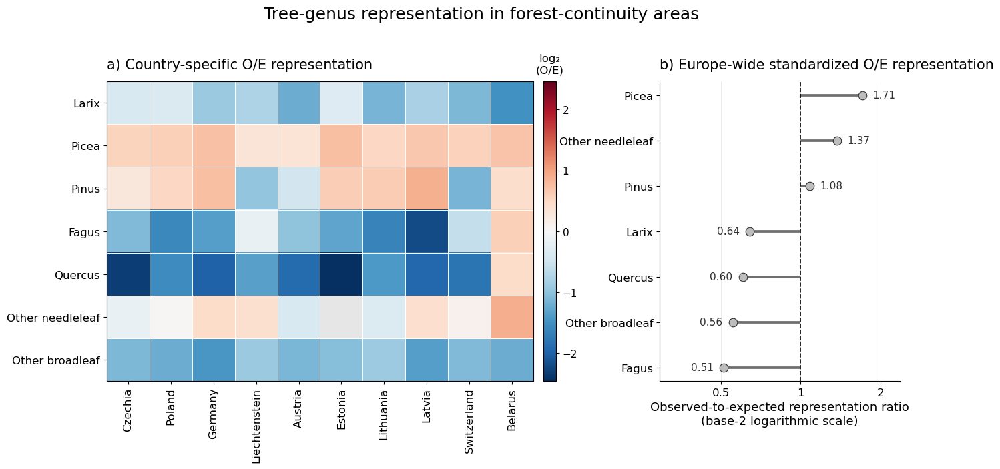

Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/main_oe_representation_top10_relative_share.png
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/main_oe_representation_top10_relative_share.svg
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/main_oe_representation_top10_relative_share.pdf


In [76]:
# ============================================================
# 7. MAIN FIGURE
#    A: Top-10 country × genus heatmap
#    B: Europe-wide standardized O/E representation
# ============================================================


def prepare_country_heatmap(country_order):
    """Return a complete genus × country matrix of log2(O/E) values."""
    plot_data = country_genus_oe[
        country_genus_oe["country"].isin(country_order)
    ].copy()

    # A ratio is undefined where the genus has no mapped forest area or the
    # country contains no mapped continuity forest. Such cells remain grey.
    valid = (
        (plot_data["total_pixels"] > 0)
        & (plot_data["country_continuity_pixels"] > 0)
    )
    plot_data.loc[
        ~valid,
        "log2_observed_expected_ratio_smoothed",
    ] = np.nan

    heat = (
        plot_data.pivot_table(
            index="genus",
            columns="country",
            values="log2_observed_expected_ratio_smoothed",
            aggfunc="first",
        )
        .reindex(
            index=GENUS_ORDER,
            columns=country_order,
        )
    )

    q_values = (
        plot_data.pivot_table(
            index="genus",
            columns="country",
            values="fisher_fdr_q_value",
            aggfunc="first",
        )
        .reindex(
            index=GENUS_ORDER,
            columns=country_order,
        )
    )

    return heat, q_values


# All countries with mapped forest and at least some mapped continuity forest.
# The supplementary figure uses this complete list, ordered by relative share.
all_country_order = (
    country_summary[
        (country_summary["forest_area_km2"] > 0)
        & (country_summary["continuity_area_km2"] > 0)
    ]
    .sort_values(
        "relative_continuity_share_percent",
        ascending=False,
    )["country"]
    .tolist()
)

main_country_order = [
    country
    for country in MAIN_COUNTRY_ORDER
    if country in all_country_order
]

main_heat, main_q_values = prepare_country_heatmap(
    main_country_order
)
all_country_heat, all_country_q_values = prepare_country_heatmap(
    all_country_order
)

# Use one colour range for the main and supplementary heatmaps so that their
# colours are directly comparable. The 98th percentile prevents isolated
# extreme values from compressing the remaining colour variation.
finite_all = all_country_heat.to_numpy()[
    np.isfinite(all_country_heat.to_numpy())
]
if finite_all.size == 0:
    raise ValueError(
        "The country heatmap contains no finite O/E values."
    )

color_limit = np.nanpercentile(
    np.abs(finite_all),
    98,
)
color_limit = max(
    1.0,
    min(float(color_limit), 6.0),
)

heat_width = max(
    7.8,
    0.58 * len(main_country_order) + 2.2,
)
figure_width = heat_width + 5.2

fig = plt.figure(
    figsize=(figure_width, 7.3)
)

# Use a nested grid for panel A and its colour bar. This keeps the colour bar
# close to the heatmap while retaining enough separation from panel B.
outer_grid = fig.add_gridspec(
    nrows=1,
    ncols=2,
    width_ratios=[heat_width + 0.42, 4.5],
    wspace=0.30,
)
left_grid = outer_grid[0, 0].subgridspec(
    nrows=1,
    ncols=2,
    width_ratios=[heat_width, 0.24],
    wspace=0.045,
)

ax_heat = fig.add_subplot(left_grid[0, 0])
ax_colorbar = fig.add_subplot(left_grid[0, 1])
ax_europe = fig.add_subplot(outer_grid[0, 1])

# ------------------------------------------------------------
# Panel A: top-10 country heatmap
# ------------------------------------------------------------

cmap = plt.get_cmap("RdBu_r").copy()
cmap.set_bad("#E6E6E6")

image = ax_heat.imshow(
    np.ma.masked_invalid(main_heat.to_numpy()),
    aspect="auto",
    cmap=cmap,
    norm=TwoSlopeNorm(
        vmin=-color_limit,
        vcenter=0,
        vmax=color_limit,
    ),
)

ax_heat.set_xticks(
    np.arange(len(main_country_order))
)
ax_heat.set_xticklabels(
    main_country_order,
    rotation=90,
    ha="center",
    fontsize=FONT_TICK,
)
ax_heat.set_yticks(
    np.arange(len(GENUS_ORDER))
)
ax_heat.set_yticklabels(
    GENUS_ORDER,
    fontsize=FONT_TICK,
)
ax_heat.set_xlabel("")
ax_heat.set_ylabel("")
ax_heat.set_title(
    "a) Country-specific O/E representation",
    loc="left",
    fontsize=FONT_PANEL_TITLE,
    pad=14,
)

ax_heat.set_xticks(
    np.arange(-0.5, len(main_country_order), 1),
    minor=True,
)
ax_heat.set_yticks(
    np.arange(-0.5, len(GENUS_ORDER), 1),
    minor=True,
)
ax_heat.grid(
    which="minor",
    color="white",
    linestyle="-",
    linewidth=0.7,
)
ax_heat.tick_params(
    which="minor",
    bottom=False,
    left=False,
)
ax_heat.tick_params(
    axis="both",
    which="major",
    labelsize=FONT_TICK,
)

if (
    RUN_EXPLORATORY_PIXEL_TESTS
    and ANNOTATE_EXPLORATORY_STARS
):
    for row_idx, genus in enumerate(GENUS_ORDER):
        for col_idx, country in enumerate(main_country_order):
            q = main_q_values.loc[genus, country]
            star = significance_star(q)
            if star:
                ax_heat.text(
                    col_idx,
                    row_idx,
                    star,
                    ha="center",
                    va="center",
                    fontsize=FONT_ANNOTATION - 1,
                    color="black",
                )

colorbar = fig.colorbar(
    image,
    cax=ax_colorbar,
)
colorbar.ax.set_title(
    "log₂\n(O/E)",
    fontsize=FONT_COLORBAR_TITLE,
    pad=9,
)
colorbar.ax.tick_params(
    labelsize=FONT_COLORBAR_TICK,
)

# ------------------------------------------------------------
# Panel B: Europe-wide standardized O/E representation
# ------------------------------------------------------------

europe_plot = (
    europe_genus_oe[
        europe_genus_oe["genus"].isin(GENUS_ORDER)
    ]
    .sort_values(
        "observed_expected_ratio_smoothed",
        ascending=True,
    )
    .reset_index(drop=True)
)

y = np.arange(len(europe_plot))

for y_pos, (_, row) in zip(
    y,
    europe_plot.iterrows(),
):
    ratio_plot = row[
        "observed_expected_ratio_smoothed"
    ]
    ratio_raw = row[
        "observed_expected_ratio"
    ]

    ax_europe.hlines(
        y=y_pos,
        xmin=min(1, ratio_plot),
        xmax=max(1, ratio_plot),
        color=LOLLIPOP_LINE_COLOR,
        linewidth=2.7,
        zorder=1,
    )
    ax_europe.scatter(
        ratio_plot,
        y_pos,
        s=82,
        color=LOLLIPOP_MARKER_COLOR,
        edgecolor=LOLLIPOP_EDGE_COLOR,
        linewidth=0.8,
        zorder=3,
    )

    label = (
        f"{ratio_raw:.2f}"
        if ratio_raw > 0
        else "0"
    )

    # Place labels outside the lollipop segment so that they do not cover the
    # marker or line. Values below one are labelled to the left; values above
    # one are labelled to the right.
    if ratio_plot < 1:
        text_offset = (-11, 0)
        horizontal_alignment = "right"
    else:
        text_offset = (11, 0)
        horizontal_alignment = "left"

    ax_europe.annotate(
        label,
        xy=(ratio_plot, y_pos),
        xytext=text_offset,
        textcoords="offset points",
        va="center",
        ha=horizontal_alignment,
        fontsize=FONT_ANNOTATION,
        color="#303030",
        clip_on=False,
    )

ax_europe.axvline(
    1,
    color="black",
    linewidth=1.2,
    linestyle="--",
)
ax_europe.set_xscale(
    "log",
    base=2,
)

max_abs_log = np.nanmax(
    np.abs(
        europe_plot[
            "log2_observed_expected_ratio_smoothed"
        ].to_numpy()
    )
)
power_limit = int(
    np.clip(
        np.ceil(max_abs_log),
        1,
        7,
    )
)

# Add extra room outside the outermost markers for the value annotations.
ax_europe.set_xlim(
    2 ** (-power_limit) / 1.7,
    2 ** power_limit * 1.18,
)

power_ticks = np.arange(
    -power_limit,
    power_limit + 1,
)
ax_europe.set_xticks(
    2.0 ** power_ticks
)
ax_europe.xaxis.set_major_formatter(
    FuncFormatter(
        lambda value, _: f"{value:g}"
    )
)

ax_europe.set_yticks(y)
ax_europe.set_yticklabels(
    europe_plot["genus"],
    fontsize=FONT_TICK,
)
ax_europe.set_xlabel(
    "Observed-to-expected representation ratio\n"
    "(base-2 logarithmic scale)",
    fontsize=FONT_AXIS_LABEL,
)
ax_europe.set_ylabel("")
ax_europe.set_title(
    "b) Europe-wide standardized O/E representation",
    loc="left",
    fontsize=FONT_PANEL_TITLE,
    pad=14,
)
ax_europe.grid(
    axis="x",
    which="major",
    linewidth=0.6,
    alpha=0.30,
)
ax_europe.spines["top"].set_visible(False)
ax_europe.spines["right"].set_visible(False)
ax_europe.tick_params(
    axis="x",
    labelsize=FONT_TICK,
)

fig.suptitle(
    "Tree-genus representation in forest-continuity areas",
    fontsize=FONT_SUPTITLE,
    y=1.015,
)

fig.subplots_adjust(
    left=0.075,
    right=0.975,
    top=0.86,
    bottom=0.245,
)

MAIN_PNG = (
    FIGURE_DIR
    / "main_oe_representation_top10_relative_share.png"
)
MAIN_SVG = (
    FIGURE_DIR
    / "main_oe_representation_top10_relative_share.svg"
)
MAIN_PDF = (
    FIGURE_DIR
    / "main_oe_representation_top10_relative_share.pdf"
)

fig.savefig(
    MAIN_PNG,
    dpi=FIGURE_DPI,
    bbox_inches="tight",
    facecolor="white",
)
fig.savefig(
    MAIN_SVG,
    bbox_inches="tight",
    facecolor="white",
)
fig.savefig(
    MAIN_PDF,
    bbox_inches="tight",
    facecolor="white",
)
plt.show()

print(f"Saved: {MAIN_PNG}")
print(f"Saved: {MAIN_SVG}")
print(f"Saved: {MAIN_PDF}")


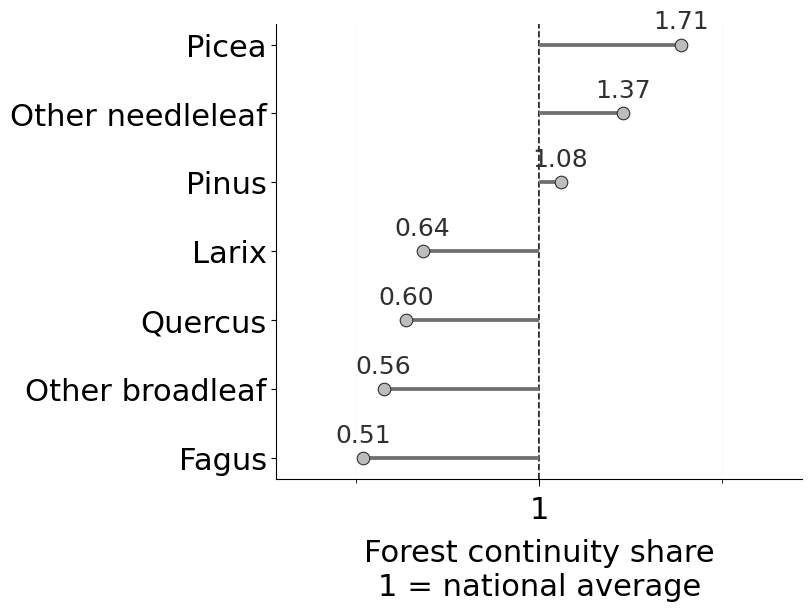

Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/europe_forest_continuity_share_by_genus_gt0729.png
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/europe_forest_continuity_share_by_genus_gt0729.svg
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/europe_forest_continuity_share_by_genus_gt0729.pdf


In [78]:
# ============================================================
# PANEL B ONLY
# Europe-wide genus-specific forest-continuity share
# relative to the national forest average
# ============================================================

europe_plot = (
    europe_genus_oe[
        europe_genus_oe["genus"].isin(GENUS_ORDER)
    ]
    .sort_values(
        "observed_expected_ratio_smoothed",
        ascending=True,
    )
    .reset_index(drop=True)
)

y = np.arange(len(europe_plot))

fig, ax_europe = plt.subplots(
    figsize=(7.4, 6.5)
)


# ------------------------------------------------------------
# Lollipop plot
# ------------------------------------------------------------

for y_pos, (_, row) in zip(
    y,
    europe_plot.iterrows(),
):
    ratio_plot = row[
        "observed_expected_ratio_smoothed"
    ]

    ratio_raw = row[
        "observed_expected_ratio"
    ]

    # Line between the national reference value and the genus value.
    ax_europe.hlines(
        y=y_pos,
        xmin=min(1, ratio_plot),
        xmax=max(1, ratio_plot),
        color=LOLLIPOP_LINE_COLOR,
        linewidth=2.7,
        zorder=1,
    )

    ax_europe.scatter(
        ratio_plot,
        y_pos,
        s=82,
        color=LOLLIPOP_MARKER_COLOR,
        edgecolor=LOLLIPOP_EDGE_COLOR,
        linewidth=0.8,
        zorder=3,
    )

    label = (
        f"{ratio_raw:.2f}"
        if ratio_raw > 0
        else "0"
    )

    # Place values above the marker.
    ax_europe.annotate(
        label,
        xy=(ratio_plot, y_pos),
        xytext=(0, 8),
        textcoords="offset points",
        ha="center",
        va="bottom",
        fontsize=18,
        color="#303030",
        clip_on=False,
    )


# ------------------------------------------------------------
# National reference value
# ------------------------------------------------------------

ax_europe.axvline(
    1,
    color="black",
    linewidth=1.2,
    linestyle="--",
    zorder=0,
)


# ------------------------------------------------------------
# Base-2 logarithmic x-axis
# ------------------------------------------------------------

ax_europe.set_xscale(
    "log",
    base=2,
)

log2_values = (
    europe_plot[
        "log2_observed_expected_ratio_smoothed"
    ]
    .replace([np.inf, -np.inf], np.nan)
    .dropna()
    .to_numpy()
)

if log2_values.size == 0:
    raise ValueError(
        ""
    )

lower_power = int(
    np.floor(np.nanmin(log2_values))
)

upper_power = int(
    np.ceil(np.nanmax(log2_values))
)

# Always include the national reference value 1 = 2^0.
lower_power = min(lower_power, 0)
upper_power = max(upper_power, 0)

# Prevent isolated extreme values from producing an excessively wide axis.
lower_power = max(lower_power, -7)
upper_power = min(upper_power, 7)

ax_europe.set_xlim(
    2.0 ** lower_power / 1.35,
    2.0 ** upper_power * 1.35,
)


# ------------------------------------------------------------
# Major and minor ticks
# ------------------------------------------------------------

all_powers = np.arange(
    lower_power,
    upper_power + 1,
)

# Label every second power of two.
# The reference value 1 is always labelled.
major_powers = np.array(
    [
        power
        for power in all_powers
        if power == 0 or power % 2 == 0
    ],
    dtype=int,
)

minor_powers = np.array(
    [
        power
        for power in all_powers
        if power not in major_powers
    ],
    dtype=int,
)

major_ticks = 2.0 ** major_powers
minor_ticks = 2.0 ** minor_powers

ax_europe.set_xticks(
    major_ticks,
    minor=False,
)

if minor_ticks.size > 0:
    ax_europe.set_xticks(
        minor_ticks,
        minor=True,
    )


def format_power_label(power):
    """Format powers below one as fractions."""

    if power < 0:
        denominator = int(2 ** (-power))
        return f"1/{denominator}"

    return f"{int(2 ** power)}"


ax_europe.set_xticklabels(
    [
        format_power_label(power)
        for power in major_powers
    ],
    fontsize=22,
)

ax_europe.tick_params(
    axis="x",
    which="major",
    labelsize=22,
    length=5,
    pad=7,
)

ax_europe.tick_params(
    axis="x",
    which="minor",
    length=3,
    labelbottom=False,
)


# ------------------------------------------------------------
# Labels and styling
# ------------------------------------------------------------

ax_europe.set_yticks(y)

ax_europe.set_yticklabels(
    europe_plot["genus"],
    fontsize=22,
)

ax_europe.set_xlabel(
    "Forest continuity share\n"
    "1 = national average",
    fontsize=22,
    labelpad=10,
)

ax_europe.set_ylabel("")

ax_europe.set_title(
    "",
    fontsize=FONT_PANEL_TITLE + 1,
    pad=16,
)

ax_europe.grid(
    axis="x",
    which="major",
    linewidth=0.7,
    alpha=0.30,
)

ax_europe.grid(
    axis="x",
    which="minor",
    linewidth=0.4,
    alpha=0.13,
)

ax_europe.spines["top"].set_visible(False)
ax_europe.spines["right"].set_visible(False)

fig.subplots_adjust(
    left=0.25,
    right=0.96,
    top=0.88,
    bottom=0.18,
)


# ------------------------------------------------------------
# Export
# ------------------------------------------------------------

PANEL_B_PNG = (
    FIGURE_DIR
    / "europe_forest_continuity_share_by_genus_gt0729.png"
)

PANEL_B_SVG = (
    FIGURE_DIR
    / "europe_forest_continuity_share_by_genus_gt0729.svg"
)

PANEL_B_PDF = (
    FIGURE_DIR
    / "europe_forest_continuity_share_by_genus_gt0729.pdf"
)

fig.savefig(
    PANEL_B_PNG,
    dpi=FIGURE_DPI,
    bbox_inches="tight",
    facecolor="white",
)

fig.savefig(
    PANEL_B_SVG,
    bbox_inches="tight",
    facecolor="white",
)

fig.savefig(
    PANEL_B_PDF,
    bbox_inches="tight",
    facecolor="white",
)

plt.show()

print(f"Saved: {PANEL_B_PNG}")
print(f"Saved: {PANEL_B_SVG}")
print(f"Saved: {PANEL_B_PDF}")

## Supplementary heatmap

The supplementary figure shows the same country-specific \(\log_2(O/E)\) metric for **all countries with mapped forest and at least some mapped forest-continuity area**, retaining all seven genus classes. Countries are ordered by decreasing relative forest-continuity share.

Grey cells indicate that a genus has no mapped forest area in the respective country, so an O/E ratio cannot be defined. The colour scale is identical to that of the main heatmap.


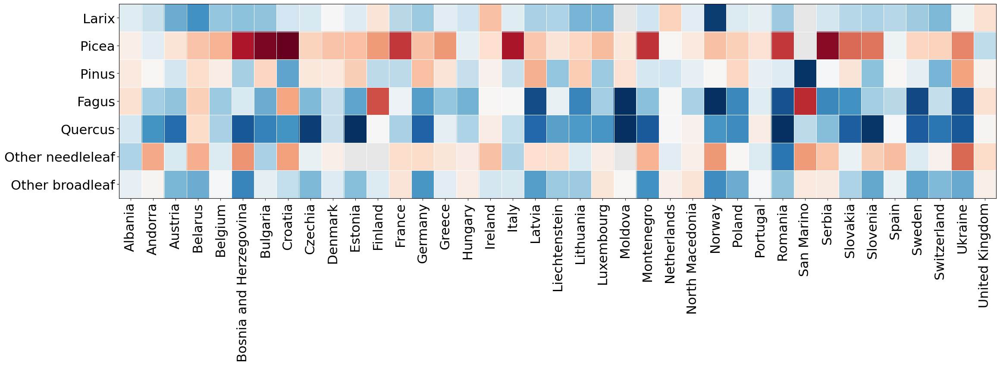

Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/supplement_oe_representation_all_countries.png
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/supplement_oe_representation_all_countries.svg
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/supplement_oe_representation_all_countries.pdf


In [79]:
# ============================================================
# 8. SUPPLEMENTARY HEATMAP: ALL COUNTRIES × ALL GENERA
#    Countries ordered alphabetically, without colour bar
# ============================================================

# Alphabetical country order for this figure only
supp_country_order = sorted(
    all_country_order,
    key=str.casefold,
)

# Reorder heatmap values and optional significance values
supp_country_heat = all_country_heat.reindex(
    columns=supp_country_order
)

supp_country_q_values = all_country_q_values.reindex(
    columns=supp_country_order
)

supp_width = max(
    12.5,
    0.48 * len(supp_country_order) + 4.0,
)

fig, ax = plt.subplots(
    figsize=(supp_width, 7.4)
)

supp_image = ax.imshow(
    np.ma.masked_invalid(
        supp_country_heat.to_numpy()
    ),
    aspect="auto",
    cmap=cmap,
    norm=TwoSlopeNorm(
        vmin=-color_limit,
        vcenter=0,
        vmax=color_limit,
    ),
)

# ------------------------------------------------------------
# Axis labels
# ------------------------------------------------------------

ax.set_xticks(
    np.arange(len(supp_country_order))
)

ax.set_xticklabels(
    supp_country_order,
    rotation=90,
    ha="center",
    fontsize=22,
)

ax.set_yticks(
    np.arange(len(GENUS_ORDER))
)

ax.set_yticklabels(
    GENUS_ORDER,
    fontsize=16,
)

ax.set_xlabel("")
ax.set_ylabel("")

ax.set_title(
    "",
    fontsize=22,
    pad=15,
)

# ------------------------------------------------------------
# Grid between heatmap cells
# ------------------------------------------------------------

ax.set_xticks(
    np.arange(
        -0.5,
        len(supp_country_order),
        1,
    ),
    minor=True,
)

ax.set_yticks(
    np.arange(
        -0.5,
        len(GENUS_ORDER),
        1,
    ),
    minor=True,
)

ax.grid(
    which="minor",
    color="white",
    linestyle="-",
    linewidth=0.7,
)

ax.tick_params(
    which="minor",
    bottom=False,
    left=False,
)

ax.tick_params(
    axis="both",
    which="major",
    labelsize=22,
)

# ------------------------------------------------------------
# Optional exploratory significance annotations
# ------------------------------------------------------------

if (
    RUN_EXPLORATORY_PIXEL_TESTS
    and ANNOTATE_EXPLORATORY_STARS
):
    for row_idx, genus in enumerate(GENUS_ORDER):

        for col_idx, country in enumerate(
            supp_country_order
        ):

            q = supp_country_q_values.loc[
                genus,
                country,
            ]

            star = significance_star(q)

            if star:
                ax.text(
                    col_idx,
                    row_idx,
                    star,
                    ha="center",
                    va="center",
                    fontsize=20,
                    color="black",
                )

# ------------------------------------------------------------
# Layout
# ------------------------------------------------------------

fig.subplots_adjust(
    left=0.09,
    right=0.985,
    top=0.88,
    bottom=0.27,
)

# ------------------------------------------------------------
# Export
# ------------------------------------------------------------

SUPP_PNG = (
    FIGURE_DIR
    / "supplement_oe_representation_all_countries.png"
)

SUPP_SVG = (
    FIGURE_DIR
    / "supplement_oe_representation_all_countries.svg"
)

SUPP_PDF = (
    FIGURE_DIR
    / "supplement_oe_representation_all_countries.pdf"
)

fig.savefig(
    SUPP_PNG,
    dpi=FIGURE_DPI,
    bbox_inches="tight",
    facecolor="white",
)

fig.savefig(
    SUPP_SVG,
    bbox_inches="tight",
    facecolor="white",
)

fig.savefig(
    SUPP_PDF,
    bbox_inches="tight",
    facecolor="white",
)

plt.show()

print(f"Saved: {SUPP_PNG}")
print(f"Saved: {SUPP_SVG}")
print(f"Saved: {SUPP_PDF}")

In [80]:
# ============================================================
# 9. RESULT SUMMARY FOR MANUSCRIPT DEVELOPMENT
# ============================================================

largest_area = (
    europe_genus_oe
    .sort_values(
        "continuity_area_km2",
        ascending=False,
    )
    .iloc[0]
)
strongest_over = (
    europe_genus_oe
    .sort_values(
        "observed_expected_ratio",
        ascending=False,
    )
    .iloc[0]
)
strongest_under = (
    europe_genus_oe
    .sort_values(
        "observed_expected_ratio",
        ascending=True,
    )
    .iloc[0]
)

print(
    f"{largest_area['genus']} accounted for the largest absolute area "
    f"of continuity forest "
    f"({largest_area['continuity_area_km2']:,.0f} km²). "
    f"After standardizing for country-specific genus composition, "
    f"{strongest_over['genus']} was most strongly overrepresented "
    f"(O/E = {strongest_over['observed_expected_ratio']:.2f}), whereas "
    f"{strongest_under['genus']} was most strongly underrepresented "
    f"(O/E = {strongest_under['observed_expected_ratio']:.2f})."
)

print("\nMain outputs:")
for fp in [
    COUNTRY_OE_CSV,
    EUROPE_OE_CSV,
    COUNTRY_SUMMARY_CSV,
    MAIN_COUNTRIES_CSV,
    MAIN_PNG,
    MAIN_SVG,
    MAIN_PDF,
    SUPP_PNG,
    SUPP_SVG,
    SUPP_PDF,
]:
    print(fp)


Picea accounted for the largest absolute area of continuity forest (63,851 km²). After standardizing for country-specific genus composition, Picea was most strongly overrepresented (O/E = 1.71), whereas Fagus was most strongly underrepresented (O/E = 0.51).

Main outputs:
/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/country_genus_observed_expected.csv
/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/europe_genus_observed_expected.csv
/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/country_forest_continuity_summary_gt0729.csv
/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/main_top10_countries_relative_continuity_share_gt0729.csv
/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/main_oe_representation_top10_relative_share.png
/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/main_oe_representation_top10_relative_share.svg
/mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/main_oe_representation_top10_relat

## Spatial representation maps

The following cells add two complementary spatial products:

1. **Country-level maps:** the same country-specific relative genus representation used in the heatmap, shown as one European choropleth per genus.
2. **Hexagon-level maps:** locally calculated relative genus representation within the existing approximately 500 km² hexagon grid.

For the hexagon maps, values are shown only where the total mapped genus area, forest-continuity area, genus-specific area, and expected genus-specific forest-continuity area exceed configurable minimum values. The thresholds are intended to suppress unstable ratios where the expected area approaches zero and should be checked in a sensitivity analysis.


In [81]:
# ============================================================
# 10. SPATIAL MAP SETTINGS AND HELPERS
#     Run after the country-level O/E analysis.
# ============================================================

import matplotlib as mpl
from shapely.geometry import Polygon

# Output folders
COUNTRY_MAP_DIR = FIGURE_DIR / "country_genus_maps"
HEX_MAP_DIR = FIGURE_DIR / "hexagon_genus_maps"
COUNTRY_MAP_DIR.mkdir(parents=True, exist_ok=True)
HEX_MAP_DIR.mkdir(parents=True, exist_ok=True)

# Existing approximately 500 km² hexagon grid from the forest-continuity
# analysis. If the file does not exist, the grid is recreated below.
HEX_GRID_GPKG = (
    CACHE_DIR / "forest_continuity_gt0729_by_small_clipped_hexagon_lon45_gt0729.gpkg"
)
HEX_GRID_LAYER = "hexes"
HEX_RADIUS_M = 17_500

# Cache and output tables for the new hexagon × genus analysis
HEX_GENUS_COUNTS_CACHE = (
    CACHE_DIR / "hexagon_genus_total_and_continuity_counts_gt0729.csv"
)
HEX_GENUS_RESULTS_CSV = (
    ANALYSIS_DIR / "hexagon_genus_relative_representation.csv"
)
HEX_GENUS_RESULTS_GPKG = (
    ANALYSIS_DIR / "hexagon_genus_relative_representation.gpkg"
)

FORCE_RECOMPUTE_HEX_GENUS = True
EXPORT_HEX_RESULTS_GPKG = True

# Reliability filters for the hexagon maps.
# These are starting values, not universal ecological thresholds.
MIN_HEX_TOTAL_MAPPED_GENUS_AREA_KM2 = 10.0
MIN_HEX_CONTINUITY_WITH_GENUS_AREA_KM2 = 1.0
MIN_HEX_GENUS_AREA_KM2 = 5.0
MIN_HEX_EXPECTED_CONTINUITY_AREA_KM2 = 0.25

# Shared map styling
MAP_NCOLS = 4
MAP_CMAP = plt.get_cmap("RdBu_r").copy()
MAP_CMAP.set_bad("#E6E6E6")
MAP_MISSING_COLOR = "#E8E8E8"
MAP_COUNTRY_EDGE_COLOR = "#4A4A4A"
MAP_HEX_EDGE_COLOR = "#B8B8B8"


def geometry_union(geoseries):
    """Compatibility wrapper for GeoPandas versions."""
    if hasattr(geoseries, "union_all"):
        return geoseries.union_all()
    return geoseries.unary_union


def create_hex_grid(bounds, hex_radius, crs):
    """Create a flat-top hexagon grid for a projected bounding box."""
    minx, miny, maxx, maxy = bounds
    dx = 1.5 * hex_radius
    dy = np.sqrt(3) * hex_radius

    geometries = []
    x = minx - 2 * hex_radius
    column = 0

    while x < maxx + 2 * hex_radius:
        y_offset = 0 if column % 2 == 0 else dy / 2
        y = miny - dy

        while y < maxy + dy:
            center_y = y + y_offset
            angles = np.deg2rad([0, 60, 120, 180, 240, 300])
            coordinates = [
                (
                    x + hex_radius * np.cos(angle),
                    center_y + hex_radius * np.sin(angle),
                )
                for angle in angles
            ]
            geometries.append(Polygon(coordinates))
            y += dy

        x += dx
        column += 1

    grid = gpd.GeoDataFrame(
        geometry=geometries,
        crs=crs,
    )
    grid["hex_id"] = np.arange(
        1,
        len(grid) + 1,
        dtype=np.int32,
    )
    return grid


def load_or_create_hex_grid():
    """Load the existing clipped hexagons or recreate the same grid."""
    with rasterio.open(CONTINUITY_FP) as continuity_src:
        target_crs = continuity_src.crs

    countries = load_study_countries(target_crs)

    if HEX_GRID_GPKG.exists():
        hexes = gpd.read_file(
            HEX_GRID_GPKG,
            layer=HEX_GRID_LAYER,
        )
        if hexes.crs != target_crs:
            hexes = hexes.to_crs(target_crs)
        if "hex_id" not in hexes.columns:
            raise KeyError(
                f"The cached grid {HEX_GRID_GPKG} has no 'hex_id' column."
            )
        hexes = hexes[["hex_id", "geometry"]].copy()
        print(f"Loaded existing hexagon grid: {HEX_GRID_GPKG}")

    else:
        europe_geometry = geometry_union(countries.geometry)
        hexes = create_hex_grid(
            bounds=countries.total_bounds,
            hex_radius=HEX_RADIUS_M,
            crs=target_crs,
        )
        hexes = hexes[hexes.intersects(europe_geometry)].copy()
        europe_clip = gpd.GeoDataFrame(
            geometry=[europe_geometry],
            crs=target_crs,
        )
        hexes = gpd.clip(hexes, europe_clip)
        hexes = hexes[
            hexes.geometry.notna() & ~hexes.geometry.is_empty
        ].copy()
        hexes["geometry"] = hexes.geometry.make_valid()
        hexes = hexes.reset_index(drop=True)
        hexes["hex_id"] = np.arange(
            1,
            len(hexes) + 1,
            dtype=np.int32,
        )
        print(
            "Existing hexagon grid not found; recreated an approximately "
            "500 km² grid."
        )

    hexes = hexes[
        hexes.geometry.notna() & ~hexes.geometry.is_empty
    ].copy()
    hexes["geometry"] = hexes.geometry.make_valid()
    hexes["hex_id"] = hexes["hex_id"].astype(np.int32)
    hexes = hexes.drop_duplicates("hex_id").reset_index(drop=True)

    return hexes, countries


def genus_panel_title(genus):
    """Italicize scientific genus names but not aggregated classes."""
    if genus in {"Larix", "Picea", "Pinus", "Fagus", "Quercus"}:
        return rf"$\it{{{genus}}}$"
    return genus


def robust_symmetric_limit(values, percentile=98, minimum=1.0, maximum=6.0):
    """Return a robust symmetric limit for a diverging colour scale."""
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        raise ValueError("No finite representation values available for mapping.")

    limit = float(np.nanpercentile(np.abs(values), percentile))
    return max(minimum, min(limit, maximum))


def save_map_figure(fig, output_stem):
    """Export one figure as PNG, SVG and PDF."""
    png = output_stem.with_suffix(".png")
    svg = output_stem.with_suffix(".svg")
    pdf = output_stem.with_suffix(".pdf")

    fig.savefig(
        png,
        dpi=FIGURE_DPI,
        bbox_inches="tight",
        facecolor="white",
    )
    fig.savefig(
        svg,
        bbox_inches="tight",
        facecolor="white",
    )
    fig.savefig(
        pdf,
        bbox_inches="tight",
        facecolor="white",
    )

    print(f"Saved: {png}")
    print(f"Saved: {svg}")
    print(f"Saved: {pdf}")


Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/country_genus_maps/country_relative_genus_representation_all_genera.png
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/country_genus_maps/country_relative_genus_representation_all_genera.svg
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/country_genus_maps/country_relative_genus_representation_all_genera.pdf


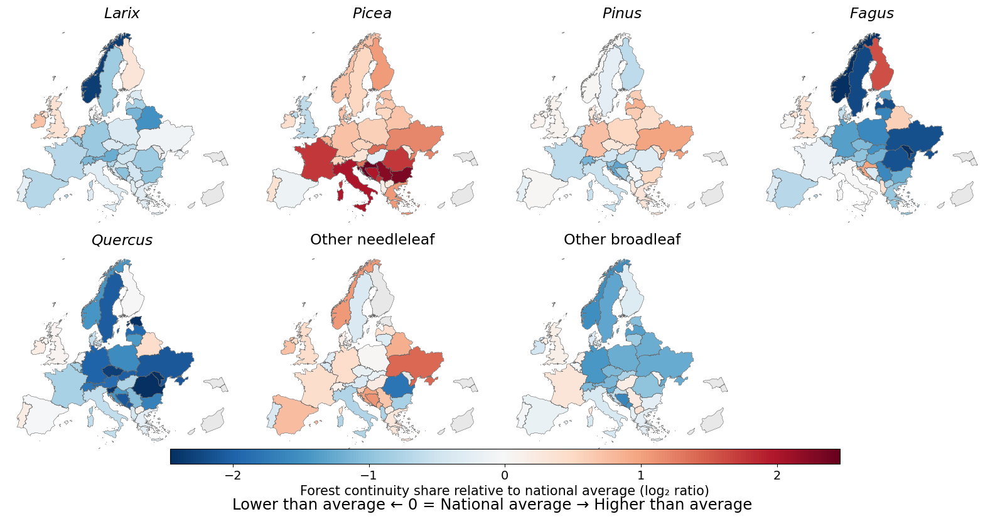

In [82]:
# ============================================================
# 11. COUNTRY-LEVEL MAPS
#     Same country-specific metric as in the heatmap.
# ============================================================

with rasterio.open(CONTINUITY_FP) as continuity_src:
    countries_map = load_study_countries(continuity_src.crs)

country_map_values = country_genus_oe[
    [
        "country",
        "genus",
        "total_pixels",
        "country_continuity_pixels",
        "observed_expected_ratio",
        "log2_observed_expected_ratio_smoothed",
    ]
].copy()

country_genus_map = countries_map.merge(
    country_map_values,
    on="country",
    how="left",
)

# Use the same colour limit as the country heatmap when it is available.
if "color_limit" in globals():
    country_map_limit = float(color_limit)
else:
    country_map_limit = robust_symmetric_limit(
        country_genus_map[
            "log2_observed_expected_ratio_smoothed"
        ]
    )

country_map_norm = TwoSlopeNorm(
    vmin=-country_map_limit,
    vcenter=0,
    vmax=country_map_limit,
)

nrows = int(np.ceil(len(GENUS_ORDER) / MAP_NCOLS))
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=MAP_NCOLS,
    figsize=(16.5, 8.8),
)
axes = np.atleast_1d(axes).ravel()

for ax, genus in zip(axes, GENUS_ORDER):
    genus_map = country_genus_map[
        country_genus_map["genus"] == genus
    ].copy()

    valid = (
        (genus_map["total_pixels"] > 0)
        & (genus_map["country_continuity_pixels"] > 0)
        & genus_map[
            "log2_observed_expected_ratio_smoothed"
        ].notna()
    )

    # Base layer: countries without a defined ratio remain light grey.
    countries_map.plot(
        ax=ax,
        color=MAP_MISSING_COLOR,
        edgecolor="white",
        linewidth=0.25,
        zorder=1,
    )

    genus_map.loc[valid].plot(
        ax=ax,
        column="log2_observed_expected_ratio_smoothed",
        cmap=MAP_CMAP,
        norm=country_map_norm,
        edgecolor="white",
        linewidth=0.25,
        zorder=2,
    )

    countries_map.boundary.plot(
        ax=ax,
        color=MAP_COUNTRY_EDGE_COLOR,
        linewidth=0.35,
        zorder=3,
    )

    ax.set_title(
        genus_panel_title(genus),
        fontsize=17,
        pad=5,
    )
    ax.set_axis_off()

for ax in axes[len(GENUS_ORDER):]:
    ax.set_axis_off()

scalar_mappable = mpl.cm.ScalarMappable(
    cmap=MAP_CMAP,
    norm=country_map_norm,
)
scalar_mappable.set_array([])

colorbar = fig.colorbar(
    scalar_mappable,
    ax=axes.tolist(),
    orientation="horizontal",
    fraction=0.035,
    pad=0.035,
    aspect=45,
)
colorbar.set_label(
    "Forest continuity share relative to national average (log₂ ratio)",
    fontsize=15,
)
colorbar.ax.tick_params(labelsize=14)

fig.suptitle(
    "",
    fontsize=16,
    y=0.98,
)
fig.text(
    0.5,
    0.035,
    "Lower than average ← 0 = National average → Higher than average",
    ha="center",
    va="center",
    fontsize=17.5,
)

fig.subplots_adjust(
    left=0.025,
    right=0.985,
    top=0.91,
    bottom=0.12,
    wspace=0.02,
    hspace=0.08,
)

COUNTRY_MAP_STEM = (
    COUNTRY_MAP_DIR / "country_relative_genus_representation_all_genera"
)
save_map_figure(fig, COUNTRY_MAP_STEM)
plt.show()


Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/country_genus_maps/country_relative_genus_representation_selected_genera.png
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/country_genus_maps/country_relative_genus_representation_selected_genera.svg
Saved: /mnt/eo/EO4Backcasting/_analysis/genus_observed_expected/figures/country_genus_maps/country_relative_genus_representation_selected_genera.pdf


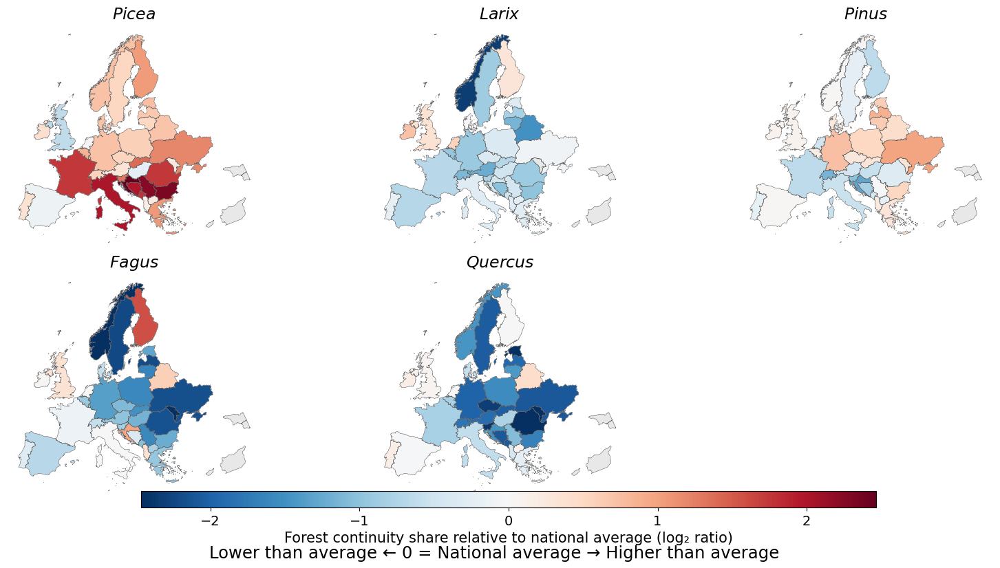

In [84]:
# ============================================================
# 11. COUNTRY-LEVEL MAPS
#     Same country-specific metric as in the heatmap.
#     Panels restricted to five genera in the desired order:
#     Row 1: Picea, Larix, Pinus
#     Row 2: Fagus, Quercus
# ============================================================

COUNTRY_MAP_GENUS_ORDER = [
    "Picea",
    "Larix",
    "Pinus",
    "Fagus",
    "Quercus",
]

with rasterio.open(CONTINUITY_FP) as continuity_src:
    countries_map = load_study_countries(continuity_src.crs)

country_map_values = country_genus_oe[
    [
        "country",
        "genus",
        "total_pixels",
        "country_continuity_pixels",
        "observed_expected_ratio",
        "log2_observed_expected_ratio_smoothed",
    ]
].copy()

# Restrict the map data to the five selected genera
country_map_values = country_map_values[
    country_map_values["genus"].isin(COUNTRY_MAP_GENUS_ORDER)
].copy()

country_genus_map = countries_map.merge(
    country_map_values,
    on="country",
    how="left",
)

# Use the same colour limit as the country heatmap when available
if "color_limit" in globals():
    country_map_limit = float(color_limit)
else:
    country_map_limit = robust_symmetric_limit(
        country_genus_map[
            "log2_observed_expected_ratio_smoothed"
        ]
    )

country_map_norm = TwoSlopeNorm(
    vmin=-country_map_limit,
    vcenter=0,
    vmax=country_map_limit,
)

# Fixed 2 x 3 layout:
# first row: Picea, Larix, Pinus
# second row: Fagus, Quercus, empty
nrows = 2
ncols = 3

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(16.5, 8.8),
)

axes = np.atleast_1d(axes).ravel()

for ax, genus in zip(axes, COUNTRY_MAP_GENUS_ORDER):
    genus_map = country_genus_map[
        country_genus_map["genus"] == genus
    ].copy()

    valid = (
        (genus_map["total_pixels"] > 0)
        & (genus_map["country_continuity_pixels"] > 0)
        & genus_map[
            "log2_observed_expected_ratio_smoothed"
        ].notna()
    )

    # Base layer: countries without a defined ratio remain light grey
    countries_map.plot(
        ax=ax,
        color=MAP_MISSING_COLOR,
        edgecolor="white",
        linewidth=0.25,
        zorder=1,
    )

    genus_map.loc[valid].plot(
        ax=ax,
        column="log2_observed_expected_ratio_smoothed",
        cmap=MAP_CMAP,
        norm=country_map_norm,
        edgecolor="white",
        linewidth=0.25,
        zorder=2,
    )

    countries_map.boundary.plot(
        ax=ax,
        color=MAP_COUNTRY_EDGE_COLOR,
        linewidth=0.35,
        zorder=3,
    )

    ax.set_title(
        genus_panel_title(genus),
        fontsize=17,
        pad=5,
    )

    ax.set_axis_off()
    ax.set_aspect("equal")

# Hide the unused sixth panel
for ax in axes[len(COUNTRY_MAP_GENUS_ORDER):]:
    ax.set_axis_off()
    ax.set_visible(False)

# ------------------------------------------------------------
# Shared colorbar
# ------------------------------------------------------------

scalar_mappable = mpl.cm.ScalarMappable(
    cmap=MAP_CMAP,
    norm=country_map_norm,
)

scalar_mappable.set_array([])

colorbar = fig.colorbar(
    scalar_mappable,
    ax=axes[:len(COUNTRY_MAP_GENUS_ORDER)].tolist(),
    orientation="horizontal",
    fraction=0.035,
    pad=0.035,
    aspect=45,
)

colorbar.set_label(
    "Forest continuity share relative to national average (log₂ ratio)",
    fontsize=15,
)

colorbar.ax.tick_params(
    labelsize=14
)

# ------------------------------------------------------------
# Titles and layout
# ------------------------------------------------------------

fig.suptitle(
    "",
    fontsize=16,
    y=0.98,
)

fig.text(
    0.5,
    0.035,
    "Lower than average ← 0 = National average → Higher than average",
    ha="center",
    va="center",
    fontsize=17.5,
)

fig.subplots_adjust(
    left=0.025,
    right=0.985,
    top=0.91,
    bottom=0.12,
    wspace=0.02,
    hspace=0.08,
)

# ------------------------------------------------------------
# Export
# ------------------------------------------------------------

COUNTRY_MAP_STEM = (
    COUNTRY_MAP_DIR
    / "country_relative_genus_representation_selected_genera"
)

save_map_figure(
    fig,
    COUNTRY_MAP_STEM
)

plt.show()

In [85]:
# ============================================================
# 12. HEXAGON × GENUS COUNTS AND LOCAL RELATIVE REPRESENTATION
# ============================================================

hexes, countries_for_hex_map = load_or_create_hex_grid()


def complete_hex_genus_grid(counts, hex_ids):
    """Ensure one row per hexagon and genus, including zero counts."""
    complete_index = pd.MultiIndex.from_product(
        [
            sorted(np.asarray(hex_ids, dtype=int)),
            GENUS_ORDER,
        ],
        names=["hex_id", "genus"],
    )

    out = (
        counts.set_index(["hex_id", "genus"])
        .reindex(complete_index)
        .reset_index()
    )

    out["genus_code"] = out["genus"].map(GENUS_CODE_BY_NAME)
    out["total_pixels"] = pd.to_numeric(
        out.get("total_pixels", 0),
        errors="coerce",
    ).fillna(0).astype(np.int64)
    out["continuity_pixels"] = pd.to_numeric(
        out.get("continuity_pixels", 0),
        errors="coerce",
    ).fillna(0).astype(np.int64)

    return out


def count_hexagon_genus_from_rasters(hexagons):
    """Count mapped-genus and forest-continuity pixels by hexagon × genus."""
    total_counter = Counter()
    continuity_counter = Counter()
    hex_sindex = hexagons.sindex

    with rasterio.open(CONTINUITY_FP) as continuity_src:
        block_height, block_width = continuity_src.block_shapes[0]
        total_windows = (
            ceil(continuity_src.height / block_height)
            * ceil(continuity_src.width / block_width)
        )

        with rasterio.open(GENUS_FP) as genus_src:
            with WarpedVRT(
                genus_src,
                crs=continuity_src.crs,
                transform=continuity_src.transform,
                width=continuity_src.width,
                height=continuity_src.height,
                resampling=Resampling.nearest,
                src_nodata=genus_src.nodata,
                nodata=255,
            ) as genus_vrt:

                for _, window in tqdm(
                    continuity_src.block_windows(1),
                    total=total_windows,
                    desc="Counting hexagon × genus pixels",
                ):
                    genus = genus_vrt.read(1, window=window)
                    valid_genus = np.isin(
                        genus,
                        VALID_GENUS_CODES,
                    )
                    if not valid_genus.any():
                        continue

                    block_geometry = box(
                        *window_bounds(
                            window,
                            continuity_src.transform,
                        )
                    )
                    candidate_idx = list(
                        hex_sindex.intersection(
                            block_geometry.bounds
                        )
                    )
                    if not candidate_idx:
                        continue

                    hex_block = hexagons.iloc[candidate_idx].copy()
                    hex_block = hex_block[
                        hex_block.intersects(block_geometry)
                    ]
                    if hex_block.empty:
                        continue

                    hex_raster = rasterize(
                        [
                            (geometry, int(hex_id))
                            for geometry, hex_id in zip(
                                hex_block.geometry,
                                hex_block["hex_id"],
                            )
                        ],
                        out_shape=genus.shape,
                        transform=window_transform(
                            window,
                            continuity_src.transform,
                        ),
                        fill=0,
                        dtype="int32",
                        all_touched=False,
                    )

                    valid = valid_genus & (hex_raster > 0)
                    if not valid.any():
                        continue

                    update_counter(
                        total_counter,
                        hex_raster[valid],
                        genus[valid].astype(np.int16),
                    )

                    continuity = continuity_src.read(
                        1,
                        window=window,
                    )
                    continuity_valid = valid & (
                        continuity == CONTINUITY_VALUE
                    )

                    if continuity_valid.any():
                        update_counter(
                            continuity_counter,
                            hex_raster[continuity_valid],
                            genus[continuity_valid].astype(np.int16),
                        )

    rows = []
    for hex_id in hexagons["hex_id"].astype(int):
        for genus_code, genus in GENUS_LOOKUP.items():
            if genus == "No trees":
                continue

            rows.append(
                {
                    "hex_id": int(hex_id),
                    "genus": genus,
                    "genus_code": int(genus_code),
                    "total_pixels": total_counter.get(
                        (int(hex_id), int(genus_code)),
                        0,
                    ),
                    "continuity_pixels": continuity_counter.get(
                        (int(hex_id), int(genus_code)),
                        0,
                    ),
                }
            )

    return pd.DataFrame(rows)


if HEX_GENUS_COUNTS_CACHE.exists() and not FORCE_RECOMPUTE_HEX_GENUS:
    hex_genus_counts = pd.read_csv(HEX_GENUS_COUNTS_CACHE)
    hex_genus_counts = complete_hex_genus_grid(
        hex_genus_counts,
        hexes["hex_id"],
    )
    print(f"Loaded hexagon × genus cache: {HEX_GENUS_COUNTS_CACHE}")
else:
    hex_genus_counts = count_hexagon_genus_from_rasters(hexes)
    hex_genus_counts = complete_hex_genus_grid(
        hex_genus_counts,
        hexes["hex_id"],
    )
    hex_genus_counts.to_csv(
        HEX_GENUS_COUNTS_CACHE,
        index=False,
    )
    print(f"Written: {HEX_GENUS_COUNTS_CACHE}")

hex_genus_counts["total_area_km2"] = (
    hex_genus_counts["total_pixels"]
    * PIXEL_AREA_HA
    / 100
)
hex_genus_counts["continuity_area_km2"] = (
    hex_genus_counts["continuity_pixels"]
    * PIXEL_AREA_HA
    / 100
)


def calculate_hexagon_relative_representation(counts):
    """Calculate raw, smoothed and mapping-filtered ratios by hexagon."""
    df = counts.copy()

    grouped = df.groupby("hex_id")
    df["hex_total_pixels"] = grouped[
        "total_pixels"
    ].transform("sum")
    df["hex_continuity_pixels"] = grouped[
        "continuity_pixels"
    ].transform("sum")

    valid_hex = (
        (df["hex_total_pixels"] > 0)
        & (df["hex_continuity_pixels"] > 0)
    )

    df["share_in_all_forests"] = np.where(
        valid_hex,
        df["total_pixels"] / df["hex_total_pixels"],
        np.nan,
    )
    df["share_in_continuity_forests"] = np.where(
        valid_hex,
        df["continuity_pixels"] / df["hex_continuity_pixels"],
        np.nan,
    )

    df["observed_expected_ratio"] = np.where(
        df["share_in_all_forests"] > 0,
        (
            df["share_in_continuity_forests"]
            / df["share_in_all_forests"]
        ),
        np.nan,
    )

    n_genera = len(GENUS_ORDER)
    df["share_in_all_forests_smoothed"] = (
        (df["total_pixels"] + PSEUDOCOUNT)
        / (
            df["hex_total_pixels"]
            + PSEUDOCOUNT * n_genera
        )
    )
    df["share_in_continuity_forests_smoothed"] = (
        (df["continuity_pixels"] + PSEUDOCOUNT)
        / (
            df["hex_continuity_pixels"]
            + PSEUDOCOUNT * n_genera
        )
    )
    df["observed_expected_ratio_smoothed"] = (
        df["share_in_continuity_forests_smoothed"]
        / df["share_in_all_forests_smoothed"]
    )
    df["log2_observed_expected_ratio_smoothed"] = np.log2(
        df["observed_expected_ratio_smoothed"]
    )

    df["expected_continuity_pixels"] = (
        df["share_in_all_forests"]
        * df["hex_continuity_pixels"]
    )
    df["expected_continuity_area_km2"] = (
        df["expected_continuity_pixels"]
        * PIXEL_AREA_HA
        / 100
    )
    df["hex_total_area_km2"] = (
        df["hex_total_pixels"]
        * PIXEL_AREA_HA
        / 100
    )
    df["hex_continuity_area_km2"] = (
        df["hex_continuity_pixels"]
        * PIXEL_AREA_HA
        / 100
    )

    df["valid_for_mapping"] = (
        (
            df["hex_total_area_km2"]
            >= MIN_HEX_TOTAL_MAPPED_GENUS_AREA_KM2
        )
        & (
            df["hex_continuity_area_km2"]
            >= MIN_HEX_CONTINUITY_WITH_GENUS_AREA_KM2
        )
        & (
            df["total_area_km2"]
            >= MIN_HEX_GENUS_AREA_KM2
        )
        & (
            df["expected_continuity_area_km2"]
            >= MIN_HEX_EXPECTED_CONTINUITY_AREA_KM2
        )
        & np.isfinite(
            df["log2_observed_expected_ratio_smoothed"]
        )
    )

    df["log2_relative_representation_map"] = df[
        "log2_observed_expected_ratio_smoothed"
    ].where(df["valid_for_mapping"])

    df["representation"] = np.select(
        [
            df["observed_expected_ratio"] > 1,
            df["observed_expected_ratio"] < 1,
        ],
        [
            "overrepresented",
            "underrepresented",
        ],
        default="as expected",
    )

    return df


hex_genus_oe = calculate_hexagon_relative_representation(
    hex_genus_counts
)
hex_genus_oe.to_csv(
    HEX_GENUS_RESULTS_CSV,
    index=False,
)
print(f"Written: {HEX_GENUS_RESULTS_CSV}")

hex_genus_map = hexes[["hex_id", "geometry"]].merge(
    hex_genus_oe,
    on="hex_id",
    how="left",
)
hex_genus_map = gpd.GeoDataFrame(
    hex_genus_map,
    geometry="geometry",
    crs=hexes.crs,
)

if EXPORT_HEX_RESULTS_GPKG:
    if HEX_GENUS_RESULTS_GPKG.exists():
        HEX_GENUS_RESULTS_GPKG.unlink()
    hex_genus_map.to_file(
        HEX_GENUS_RESULTS_GPKG,
        layer="hex_genus_representation",
        driver="GPKG",
        engine="pyogrio",
    )
    print(f"Written: {HEX_GENUS_RESULTS_GPKG}")

valid_hex_summary = (
    hex_genus_oe.groupby("genus", as_index=False)
    .agg(
        total_hexagons=("hex_id", "nunique"),
        mapped_hexagons=("valid_for_mapping", "sum"),
    )
    .set_index("genus")
    .reindex(GENUS_ORDER)
    .reset_index()
)

display(valid_hex_summary)


Loaded existing hexagon grid: /mnt/eo/EO4Backcasting/_analysis_cache/forest_continuity_gt0729_by_small_clipped_hexagon_lon45_gt0729.gpkg


Counting hexagon × genus pixels:   0%|          | 0/140000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
# ============================================================
# 13. HEXAGON-LEVEL MAPS
#     Local relative genus representation in forest continuity.
# ============================================================

hex_map_limit = robust_symmetric_limit(
    hex_genus_oe["log2_relative_representation_map"]
)
hex_map_norm = TwoSlopeNorm(
    vmin=-hex_map_limit,
    vcenter=0,
    vmax=hex_map_limit,
)

nrows = int(np.ceil(len(GENUS_ORDER) / MAP_NCOLS))
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=MAP_NCOLS,
    figsize=(16.5, 8.8),
)
axes = np.atleast_1d(axes).ravel()

# Only hexagons with sufficient total mapped genus and continuity area form
# the neutral background. Genus-specific reliability is then applied per map.
hex_background_ids = hex_genus_oe.loc[
    (
        hex_genus_oe["hex_total_area_km2"]
        >= MIN_HEX_TOTAL_MAPPED_GENUS_AREA_KM2
    )
    & (
        hex_genus_oe["hex_continuity_area_km2"]
        >= MIN_HEX_CONTINUITY_WITH_GENUS_AREA_KM2
    ),
    "hex_id",
].unique()

hex_background = hexes[
    hexes["hex_id"].isin(hex_background_ids)
].copy()

for ax, genus in zip(axes, GENUS_ORDER):
    genus_map = hex_genus_map[
        hex_genus_map["genus"] == genus
    ].copy()
    genus_valid = genus_map[
        genus_map["valid_for_mapping"].fillna(False)
    ].copy()

    hex_background.plot(
        ax=ax,
        color=MAP_MISSING_COLOR,
        edgecolor=MAP_HEX_EDGE_COLOR,
        linewidth=0.12,
        zorder=1,
    )

    if not genus_valid.empty:
        genus_valid.plot(
            ax=ax,
            column="log2_relative_representation_map",
            cmap=MAP_CMAP,
            norm=hex_map_norm,
            edgecolor=MAP_HEX_EDGE_COLOR,
            linewidth=0.12,
            zorder=2,
        )

    countries_for_hex_map.boundary.plot(
        ax=ax,
        color=MAP_COUNTRY_EDGE_COLOR,
        linewidth=0.35,
        zorder=3,
    )

    ax.set_title(
        genus_panel_title(genus),
        fontsize=14,
        pad=5,
    )
    ax.set_axis_off()

for ax in axes[len(GENUS_ORDER):]:
    ax.set_axis_off()

scalar_mappable = mpl.cm.ScalarMappable(
    cmap=MAP_CMAP,
    norm=hex_map_norm,
)
scalar_mappable.set_array([])

colorbar = fig.colorbar(
    scalar_mappable,
    ax=axes.tolist(),
    orientation="horizontal",
    fraction=0.035,
    pad=0.035,
    aspect=45,
)
colorbar.set_label(
    "Local representation in forest continuity (log₂ ratio)",
    fontsize=12,
)
colorbar.ax.tick_params(labelsize=11)

fig.suptitle(
    "Local relative genus representation in forest continuity",
    fontsize=17,
    y=0.98,
)
fig.text(
    0.5,
    0.035,
    "Underrepresented   ←   0 = local forest share   →   Overrepresented",
    ha="center",
    va="center",
    fontsize=11,
)
fig.text(
    0.5,
    0.012,
    (
        "Grey hexagons do not meet the genus-specific area or expected-area "
        "requirements."
    ),
    ha="center",
    va="center",
    fontsize=9.5,
    color="#505050",
)

fig.subplots_adjust(
    left=0.025,
    right=0.985,
    top=0.91,
    bottom=0.13,
    wspace=0.02,
    hspace=0.08,
)

HEX_MAP_STEM = (
    HEX_MAP_DIR / "hexagon_relative_genus_representation_all_genera"
)
save_map_figure(fig, HEX_MAP_STEM)
plt.show()

print("\nHexagon map thresholds:")
print(
    "Minimum total mapped genus area per hexagon:",
    f"{MIN_HEX_TOTAL_MAPPED_GENUS_AREA_KM2:g} km²",
)
print(
    "Minimum forest-continuity area with genus information per hexagon:",
    f"{MIN_HEX_CONTINUITY_WITH_GENUS_AREA_KM2:g} km²",
)
print(
    "Minimum total area of the mapped genus per hexagon:",
    f"{MIN_HEX_GENUS_AREA_KM2:g} km²",
)
print(
    "Minimum expected genus-specific forest-continuity area:",
    f"{MIN_HEX_EXPECTED_CONTINUITY_AREA_KM2:g} km²",
)


# 6. Forest-age comparison

The comparison with forest age is recalculated using the final `gt0729` forest-continuity map. Threshold-specific cache and output names are used wherever identifiable from the original notebook.


In [86]:
# ------------------------------------------------------------
# Imports and global settings
# ------------------------------------------------------------
from pathlib import Path
from collections import Counter
import os
import pickle
import warnings

import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.vrt import WarpedVRT
from rasterio.enums import Resampling
from rasterio.features import rasterize
from rasterio.windows import bounds as window_bounds
from rasterio.windows import transform as window_transform
from rasterio.warp import reproject

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Patch
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from shapely.geometry import Polygon, box
from tqdm.auto import tqdm
from scipy.stats import gaussian_kde

try:
    import xarray as xr
    import rioxarray  # noqa: F401
except ImportError:
    xr = None

# ------------------------------------------------------------
# Behaviour switches
# ------------------------------------------------------------
RUN_EXPENSIVE_IF_MISSING = False   # keep False to avoid heavy raster computations
OVERWRITE_OUTPUTS = True           # only affects figures / small summary tables

# ------------------------------------------------------------
# Main paths
# ------------------------------------------------------------
old_growth_fp = Path("/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif")
old_growth_nodata0_fp = Path("/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist_gt0729_4conn_5ha_nodata0.tif")
prob_fp = Path("/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/global_model_no_dist.tif")
slope_fp = Path("/mnt/eo/EO4Backcasting/_sen_slope_1985_1995/slope_NBR_1985_1995_mosaic.vrt")
undist_fp = Path("/mnt/eo/EFDA_v211/undisturbed_forest.tif")
forest_mask_fp = Path("/mnt/eo/EFDA_v211/forest_landuse_aligned.tif")
genus_fp = Path("/mnt/dss_project/lmandl/_backcasting/data/genus_map_europe.tif")
country_gpkg_10m = Path("/mnt/eo/EO4Backcasting/_data/CNTR_RG_10M_2024_3035.gpkg")
country_gpkg_20m = Path("/mnt/eo/EO4Backcasting/_data/CNTR_RG_20M_2024_3035.gpkg")
forest_age_nc = Path("/mnt/eo/EO4Backcasting/_data/forest_age/GAMIv2-1_2010-2020_100m.nc")

# Forest-age comparison settings
# A stand that pre-dates 1965 must be at least 55 years old in the 2020 forest-age layer.
forest_continuity_start_year = 1965
forest_age_reference_year = 2020
age_threshold = forest_age_reference_year - forest_continuity_start_year

# ------------------------------------------------------------
# Output/cache folders
# ------------------------------------------------------------
fig_dir = Path("/mnt/eo/EO4Backcasting/figures")
fig_dir.mkdir(parents=True, exist_ok=True)

prob_genus_fig_dir = Path("/mnt/eo/EO4Backcasting/_figures/genus_probability")
prob_genus_fig_dir.mkdir(parents=True, exist_ok=True)

cache_dir = Path("/mnt/eo/EO4Backcasting/_analysis_cache")
cache_dir.mkdir(parents=True, exist_ok=True)

threshold_dir = Path("/mnt/eo/EO4Backcasting/_analysis/threshold_sensitivity")
forest_age_dir = Path("/mnt/eo/EO4Backcasting/_analysis/forest_age_comparison")
session_backup_dir = Path("/mnt/eo/EO4Backcasting/_analysis/session_backups")
aligned_dir = Path("/mnt/eo/EO4Backcasting/_data_aligned")
aligned_dir.mkdir(parents=True, exist_ok=True)

genus_aligned_fp = aligned_dir / "genus_map_europe_aligned_to_probability_30m.tif"

forest_age_2020_member1_europe_fp = (
    aligned_dir / "GAMIv2_1_forest_age_2020_member1_europe_100m_epsg4326.tif"
)

hex_compare_gpkg = (
    forest_age_dir / f"hex_continuity_vs_forest_age_ge_{age_threshold}_member1_same_denominator_gt0729.gpkg"
)
hex_compare_csv = (
    forest_age_dir / f"hex_continuity_vs_forest_age_ge_{age_threshold}_member1_same_denominator_gt0729.csv"
)

# ------------------------------------------------------------
# Known cached analysis products
# ------------------------------------------------------------
nbr_sample_csv = cache_dir / "nbr_trend_sample_oldgrowth_vs_undisturbed_gt0729.csv"
genus_counts_csv = cache_dir / "continuously_undisturbed_area_by_genus_gt0729.csv"
genus_country_csv = cache_dir / "continuously_undisturbed_area_by_genus_country_gt0729.csv"
genus_share_csv = cache_dir / "continuously_undisturbed_share_by_genus_gt0729.csv"
country_share_csv = cache_dir / "continuously_undisturbed_share_by_country_gt0729.csv"
hex_gpkg = cache_dir / "continuously_undisturbed_gt0729_by_small_clipped_hexagon_gt0729.gpkg"
prob_genus_sample_csv = cache_dir / "probability_by_genus_sample.csv"
prob_genus_summary_csv = cache_dir / "probability_by_genus_summary.csv"

# ------------------------------------------------------------
# Analysis settings
# ------------------------------------------------------------
pixel_area_ha = 0.09       # 30 m pixel = 900 m² = 0.09 ha
forest_value = 1
country_name_col = "NAME_ENGL"
exclude_russia = True
hex_radius = 17_500
min_forest_area_ha = 500

forest_label = "continuously undisturbed forest"
forest_label_cap = "Continuously undisturbed forest"

genus_lookup = {
    0: "Larix",
    1: "Picea",
    2: "Pinus",
    3: "Fagus",
    4: "Quercus",
    5: "Other needleleaf",
    6: "Other broadleaf",
    7: "No trees",
}

genus_colors = {
    "Picea": "#2C7FB8",
    "Pinus": "#F28E2B",
    "Fagus": "#59A14F",
    "Quercus": "#E15759",
    "Larix": "#B07AA1",
    "Other broadleaf": "#76B7B2",
    "Other needleleaf": "#EDC948",
    "Other": "#BDBDBD",
}

european_countries = [
    "Albania", "Andorra", "Austria", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Czechia",
    "Denmark", "Estonia", "Finland", "France", "Germany",
    "Greece", "Hungary", "Ireland", "Italy", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine",
    "United Kingdom", "Vatican"
]

mainland_bbox_4326 = box(-11, 34, 35, 72)

print("Load-first mode. Expensive recomputation enabled:", RUN_EXPENSIVE_IF_MISSING)


Load-first mode. Expensive recomputation enabled: False


In [87]:
# ------------------------------------------------------------
# Small, safe loading helpers
# ------------------------------------------------------------
def path_exists(fp):
    fp = Path(fp)
    return fp.exists()


def read_csv_if_exists(fp, **kwargs):
    fp = Path(fp)
    if fp.exists():
        df = pd.read_csv(fp, **kwargs)
        print(f"Loaded CSV: {fp}  shape={df.shape}")
        return df
    print(f"Missing CSV: {fp}")
    return None


def read_gpkg_if_exists(fp, layer=None, **kwargs):
    fp = Path(fp)
    if fp.exists():
        try:
            gdf = gpd.read_file(fp, layer=layer, **kwargs) if layer else gpd.read_file(fp, **kwargs)
            layer_msg = f", layer={layer}" if layer else ""
            print(f"Loaded GPKG: {fp}{layer_msg}  shape={gdf.shape}")
            return gdf
        except Exception as e:
            print(f"Could not load GPKG {fp}: {e}")
            return None
    print(f"Missing GPKG: {fp}")
    return None


def save_fig(fig, out_base, dpi=600):
    out_base = Path(out_base)
    out_base.parent.mkdir(parents=True, exist_ok=True)
    png = out_base.with_suffix(".png")
    svg = out_base.with_suffix(".svg")
    if OVERWRITE_OUTPUTS or not png.exists():
        fig.savefig(png, dpi=dpi, bbox_inches="tight", facecolor="white")
    if OVERWRITE_OUTPUTS or not svg.exists():
        fig.savefig(svg, bbox_inches="tight", facecolor="white")
    print("Saved PNG:", png)
    print("Saved SVG:", svg)


def require(obj, name):
    if obj is None:
        raise RuntimeError(f"Required object `{name}` is missing. Load the cached file first or enable recomputation.")
    return obj


def add_genus_names(df, code_col="genus_code"):
    df = df.copy()
    df["genus"] = df[code_col].map(genus_lookup)
    df["genus"] = df["genus"].fillna("Code " + df[code_col].astype(str))
    return df


def create_hex_grid(bounds, hex_radius, crs):
    minx, miny, maxx, maxy = bounds
    dx = 1.5 * hex_radius
    dy = np.sqrt(3) * hex_radius
    hexagons = []
    hex_ids = []
    x = minx - 2 * hex_radius
    col = 0
    hex_id = 1
    while x < maxx + 2 * hex_radius:
        y_offset = 0 if col % 2 == 0 else dy / 2
        y = miny - dy
        while y < maxy + dy:
            cy = y + y_offset
            angles = np.deg2rad([0, 60, 120, 180, 240, 300])
            coords = [(x + hex_radius * np.cos(a), cy + hex_radius * np.sin(a)) for a in angles]
            hexagons.append(Polygon(coords))
            hex_ids.append(hex_id)
            hex_id += 1
            y += dy
        x += dx
        col += 1
    return gpd.GeoDataFrame({"hex_id": hex_ids}, geometry=hexagons, crs=crs)


def load_europe_countries(target_crs=None, clip_mainland=False, prefer_20m=False):
    country_gpkg = country_gpkg_20m if prefer_20m and country_gpkg_20m.exists() else country_gpkg_10m
    countries = gpd.read_file(country_gpkg)
    countries["country"] = countries[country_name_col].astype(str).str.strip()
    countries = countries[countries["country"].isin(european_countries)].copy()
    if exclude_russia:
        countries = countries[countries["country"] != "Russian Federation"].copy()
    countries = countries[countries.geometry.notna() & ~countries.geometry.is_empty].copy()
    countries["geometry"] = countries.geometry.make_valid()

    if clip_mainland:
        countries_4326 = countries.to_crs(4326)
        parts = countries_4326.explode(index_parts=False).reset_index(drop=True)
        rep = parts.representative_point()
        keep = (rep.x >= -11) & (rep.x <= 35) & (rep.y >= 34) & (rep.y <= 72)
        parts = parts.loc[keep].copy()
        bbox_gdf = gpd.GeoDataFrame(geometry=[mainland_bbox_4326], crs=4326)
        parts = gpd.clip(parts, bbox_gdf)
        countries = parts.dissolve(by="country", as_index=False)

    if target_crs is not None and countries.crs != target_crs:
        countries = countries.to_crs(target_crs)
    return countries


def ensure_aligned_genus():
    if genus_aligned_fp.exists():
        print(f"Using existing aligned genus raster: {genus_aligned_fp}")
        return genus_aligned_fp

    if not RUN_EXPENSIVE_IF_MISSING:
        print(f"Aligned genus raster missing and recomputation disabled: {genus_aligned_fp}")
        return None

    print("Creating aligned genus raster. This can be expensive.")
    with rasterio.open(prob_fp) as prob_src, rasterio.open(genus_fp) as genus_src:
        profile = prob_src.profile.copy()
        profile.update(
            dtype="uint8", count=1, nodata=255, compress="deflate",
            tiled=True, blockxsize=512, blockysize=512, BIGTIFF="YES",
        )
        with rasterio.open(genus_aligned_fp, "w", **profile) as dst:
            reproject(
                source=rasterio.band(genus_src, 1), destination=rasterio.band(dst, 1),
                src_transform=genus_src.transform, src_crs=genus_src.crs, src_nodata=genus_src.nodata,
                dst_transform=prob_src.transform, dst_crs=prob_src.crs, dst_nodata=255,
                resampling=Resampling.nearest,
            )
    print(f"Written: {genus_aligned_fp}")
    return genus_aligned_fp

# ------------------------------------------------------------
# Forest-age preprocessing and aggregation helpers
# ------------------------------------------------------------
def extract_forest_age_2020_member1_europe(
    nc_fp=forest_age_nc,
    out_fp=forest_age_2020_member1_europe_fp,
    bbox=(-11, 34, 35, 72),
    reference_year=forest_age_reference_year,
):
    """Extract Europe, reference year, and first ensemble member from the global GAMI NetCDF."""
    if xr is None:
        raise ImportError("xarray/rioxarray is required for extracting the forest-age NetCDF.")

    out_fp = Path(out_fp)
    out_fp.parent.mkdir(parents=True, exist_ok=True)

    if out_fp.exists() and not OVERWRITE_OUTPUTS:
        print(f"Using existing forest-age raster: {out_fp}")
        return out_fp

    print("Opening global forest-age NetCDF:", nc_fp)
    ds = xr.open_dataset(nc_fp)

    if "forest_age" in ds.data_vars:
        age = ds["forest_age"]
    else:
        first_var = list(ds.data_vars)[0]
        print(f"Variable `forest_age` not found. Using first data variable: {first_var}")
        age = ds[first_var]

    lat_name = next((d for d in age.dims if "lat" in d.lower()), None)
    lon_name = next((d for d in age.dims if "lon" in d.lower()), None)
    if lat_name is None or lon_name is None:
        raise ValueError(f"Could not detect latitude/longitude dimensions. Dims are: {age.dims}")

    time_dim = next((d for d in ["time", "year"] if d in age.dims), None)
    member_dim = next((d for d in ["members", "member", "ensemble", "ens"] if d in age.dims), None)

    age_sel = age

    if time_dim is not None:
        try:
            age_sel = age_sel.sel({time_dim: f"{reference_year}-01-01"}, method="nearest")
        except Exception:
            age_sel = age_sel.sel({time_dim: reference_year}, method="nearest")

    if member_dim is not None:
        age_sel = age_sel.isel({member_dim: 0})
        print(f"Selected first forest-age member along dimension `{member_dim}`.")
    else:
        print("No ensemble/member dimension detected. Using the selected forest-age layer as-is.")

    age_sel = age_sel.squeeze(drop=True)

    xmin, ymin, xmax, ymax = bbox
    lat_values = age_sel[lat_name].values

    if lat_values[0] > lat_values[-1]:
        age_eur = age_sel.sel({lon_name: slice(xmin, xmax), lat_name: slice(ymax, ymin)})
    else:
        age_eur = age_sel.sel({lon_name: slice(xmin, xmax), lat_name: slice(ymin, ymax)})

    age_eur = age_eur.astype("float32")
    age_eur = (
        age_eur
        .rio.set_spatial_dims(x_dim=lon_name, y_dim=lat_name)
        .rio.write_crs("EPSG:4326")
        .rio.write_nodata(-9999, encoded=True)
    )

    age_eur.rio.to_raster(
        out_fp,
        dtype="float32",
        compress="deflate",
        tiled=True,
        BIGTIFF="YES",
    )

    ds.close()
    print("Written forest-age Europe/member-1 raster:", out_fp)
    return out_fp


def compute_hex_forest_age_comparison(
    forest_age_fp=forest_age_2020_member1_europe_fp,
    out_gpkg=hex_compare_gpkg,
    out_csv=hex_compare_csv,
):
    """Aggregate continuity and forest-age >= threshold to the same hexagons and same forest denominator."""
    forest_age_fp = Path(forest_age_fp)
    if not forest_age_fp.exists():
        raise FileNotFoundError(f"Forest-age raster missing: {forest_age_fp}")

    with rasterio.open(old_growth_fp) as ref_src:
        ref_crs = ref_src.crs
        ref_bounds = ref_src.bounds

    countries_eur_local = load_europe_countries(target_crs=ref_crs, clip_mainland=True)

    hexes = create_hex_grid(ref_bounds, hex_radius=hex_radius, crs=ref_crs)
    hexes = gpd.clip(hexes, countries_eur_local[["geometry"]])
    hexes = hexes[hexes.geometry.notna() & ~hexes.geometry.is_empty].copy()
    hexes["hex_id"] = np.arange(1, len(hexes) + 1).astype("int32")

    print("Number of hexagons:", len(hexes))

    sindex = hexes.sindex
    max_hex_id = int(hexes["hex_id"].max())

    forest_pix = np.zeros(max_hex_id + 1, dtype=np.int64)
    cont_pix = np.zeros(max_hex_id + 1, dtype=np.int64)
    age_ge_pix = np.zeros(max_hex_id + 1, dtype=np.int64)
    age_valid_forest_pix = np.zeros(max_hex_id + 1, dtype=np.int64)

    with rasterio.open(old_growth_fp) as cont_src, \
         rasterio.open(forest_mask_fp) as forest_src, \
         rasterio.open(forest_age_fp) as age_src:

        forest_vrt = WarpedVRT(
            forest_src,
            crs=cont_src.crs,
            transform=cont_src.transform,
            width=cont_src.width,
            height=cont_src.height,
            resampling=Resampling.nearest,
        )

        age_vrt = WarpedVRT(
            age_src,
            crs=cont_src.crs,
            transform=cont_src.transform,
            width=cont_src.width,
            height=cont_src.height,
            resampling=Resampling.nearest,
            src_nodata=age_src.nodata,
            nodata=np.nan,
        )

        windows = list(cont_src.block_windows(1))

        for _, window in tqdm(windows, desc="Aggregating continuity and forest age by hexagon"):
            wb = window_bounds(window, cont_src.transform)
            win_geom = box(*wb)

            cand_idx = list(sindex.intersection(wb))
            if len(cand_idx) == 0:
                continue

            cand = hexes.iloc[cand_idx].copy()
            cand = cand[cand.intersects(win_geom)]
            if len(cand) == 0:
                continue

            win_transform = window_transform(window, cont_src.transform)
            out_shape = (int(window.height), int(window.width))

            hex_id_arr = rasterize(
                [(geom, int(hid)) for geom, hid in zip(cand.geometry, cand["hex_id"])],
                out_shape=out_shape,
                transform=win_transform,
                fill=0,
                dtype="int32",
                all_touched=False,
            )

            if hex_id_arr.max() == 0:
                continue

            forest = forest_vrt.read(1, window=window)
            cont = cont_src.read(1, window=window)
            age = age_vrt.read(1, window=window, masked=True).filled(np.nan).astype("float32")

            forest_mask = (forest == forest_value) & (hex_id_arr > 0)
            if not np.any(forest_mask):
                continue

            ids = hex_id_arr[forest_mask]
            forest_pix += np.bincount(ids, minlength=max_hex_id + 1)

            cont_mask = forest_mask & (cont == 1)
            if np.any(cont_mask):
                cont_pix += np.bincount(hex_id_arr[cont_mask], minlength=max_hex_id + 1)

            age_valid_mask = forest_mask & np.isfinite(age)
            if np.any(age_valid_mask):
                age_valid_forest_pix += np.bincount(hex_id_arr[age_valid_mask], minlength=max_hex_id + 1)

            age_ge_mask = age_valid_mask & (age >= age_threshold)
            if np.any(age_ge_mask):
                age_ge_pix += np.bincount(hex_id_arr[age_ge_mask], minlength=max_hex_id + 1)

        forest_vrt.close()
        age_vrt.close()

    hex_compare = hexes.copy()
    ids = hex_compare["hex_id"].values.astype(int)

    age_area_col = f"forest_age_ge_{age_threshold}_area_ha"
    age_share_col = f"forest_age_ge_{age_threshold}_share_percent"

    hex_compare["forest_area_ha"] = forest_pix[ids] * pixel_area_ha
    hex_compare["continuously_undisturbed_area_ha"] = cont_pix[ids] * pixel_area_ha
    hex_compare[age_area_col] = age_ge_pix[ids] * pixel_area_ha
    hex_compare["forest_age_valid_forest_area_ha"] = age_valid_forest_pix[ids] * pixel_area_ha

    hex_compare["continuously_undisturbed_share_percent"] = (
        hex_compare["continuously_undisturbed_area_ha"] / hex_compare["forest_area_ha"] * 100
    )
    hex_compare[age_share_col] = (
        hex_compare[age_area_col] / hex_compare["forest_area_ha"] * 100
    )
    hex_compare["forest_age_valid_coverage_percent"] = (
        hex_compare["forest_age_valid_forest_area_ha"] / hex_compare["forest_area_ha"] * 100
    )

    hex_compare = hex_compare[hex_compare["forest_area_ha"] >= min_forest_area_ha].copy()
    hex_compare["forest_age_low_coverage"] = hex_compare["forest_age_valid_coverage_percent"] < 80

    out_gpkg = Path(out_gpkg)
    out_csv = Path(out_csv)
    out_gpkg.parent.mkdir(parents=True, exist_ok=True)
    out_csv.parent.mkdir(parents=True, exist_ok=True)

    hex_compare.to_file(out_gpkg, layer="hexes", driver="GPKG")
    hex_compare.drop(columns="geometry").to_csv(out_csv, index=False)

    print("Written:", out_gpkg)
    print("Written:", out_csv)
    return hex_compare


## 1. Load all written analysis products

This section loads the known cached products and also scans the main analysis folders for additional CSV/GPKG files. This makes the notebook robust after a kernel restart and avoids relying on hidden session state.


In [88]:
# ------------------------------------------------------------
# 1a. Load session backup if available, but do not rely on it
# ------------------------------------------------------------
session_backup_fp = session_backup_dir / "backcasting_threshold_session_backup.pkl"
loaded_from_session = {}

if session_backup_fp.exists():
    try:
        with open(session_backup_fp, "rb") as f:
            loaded_from_session = pickle.load(f)
        globals().update(loaded_from_session)
        print("Loaded session backup objects:", sorted(loaded_from_session.keys()))
    except Exception as e:
        print("Session backup exists but could not be loaded:", e)
else:
    print("No session backup found:", session_backup_fp)


Loaded session backup objects: ['genus_fp', 'out_dir', 'prob_fp']


In [89]:
# ------------------------------------------------------------
# 1b. Load threshold sensitivity tables
# ------------------------------------------------------------
threshold_files = {
    "df_threshold_total": threshold_dir / "threshold_sensitivity_total.csv",
    "df_threshold_genus": threshold_dir / "threshold_sensitivity_from_050_by_genus.csv",
    "df_threshold_ecoregion": threshold_dir / "threshold_sensitivity_from_050_by_ecoregion.csv",
    "df_threshold_ecoregion_genus": threshold_dir / "threshold_sensitivity_from_050_by_ecoregion_genus.csv",
    "df_threshold_class_check": threshold_dir / "threshold_class_raster_check.csv",
}

for obj_name, fp in threshold_files.items():
    globals()[obj_name] = read_csv_if_exists(fp)

# Backwards-compatible names used in older cells
if "df_total" not in globals() or globals().get("df_total") is None:
    df_total = df_threshold_total
if "df_genus" not in globals() or globals().get("df_genus") is None:
    df_genus = df_threshold_genus
if "df_ecoregion" not in globals() or globals().get("df_ecoregion") is None:
    df_ecoregion = df_threshold_ecoregion
if "df_ecoregion_genus" not in globals() or globals().get("df_ecoregion_genus") is None:
    df_ecoregion_genus = df_threshold_ecoregion_genus
if "df_class_check" not in globals() or globals().get("df_class_check") is None:
    df_class_check = df_threshold_class_check

for name in ["df_total", "df_genus", "df_ecoregion", "df_ecoregion_genus", "df_class_check"]:
    obj = globals().get(name)
    if isinstance(obj, pd.DataFrame):
        print(f"{name}:", obj.shape)


Missing CSV: /mnt/eo/EO4Backcasting/_analysis/threshold_sensitivity/threshold_sensitivity_total.csv
Loaded CSV: /mnt/eo/EO4Backcasting/_analysis/threshold_sensitivity/threshold_sensitivity_from_050_by_genus.csv  shape=(56, 11)
Loaded CSV: /mnt/eo/EO4Backcasting/_analysis/threshold_sensitivity/threshold_sensitivity_from_050_by_ecoregion.csv  shape=(24, 11)
Loaded CSV: /mnt/eo/EO4Backcasting/_analysis/threshold_sensitivity/threshold_sensitivity_from_050_by_ecoregion_genus.csv  shape=(165, 13)
Missing CSV: /mnt/eo/EO4Backcasting/_analysis/threshold_sensitivity/threshold_class_raster_check.csv
df_genus: (56, 11)
df_ecoregion: (24, 11)
df_ecoregion_genus: (165, 13)


In [90]:
# ------------------------------------------------------------
# 1c. Load known cached analysis products
# ------------------------------------------------------------
df_nbr = read_csv_if_exists(nbr_sample_csv)
df_counts = read_csv_if_exists(genus_counts_csv)
df_genus_share = read_csv_if_exists(genus_share_csv)
df_gc = read_csv_if_exists(genus_country_csv)
df_country_share = read_csv_if_exists(country_share_csv)
df_prob_genus = read_csv_if_exists(prob_genus_sample_csv)
summary = read_csv_if_exists(prob_genus_summary_csv)

if df_counts is not None and "genus" not in df_counts.columns and "genus_code" in df_counts.columns:
    df_counts = add_genus_names(df_counts)
if df_genus_share is not None and "genus" not in df_genus_share.columns and "genus_code" in df_genus_share.columns:
    df_genus_share = add_genus_names(df_genus_share)
if df_gc is not None and "genus" not in df_gc.columns and "genus_code" in df_gc.columns:
    df_gc = add_genus_names(df_gc)
if df_prob_genus is not None and "genus" not in df_prob_genus.columns and "genus_code" in df_prob_genus.columns:
    df_prob_genus = add_genus_names(df_prob_genus)
if df_prob_genus is not None:
    df_prob_genus = df_prob_genus[df_prob_genus["genus"] != "No trees"].copy()

hexes_plot = read_gpkg_if_exists(hex_gpkg, layer="hexes")
if hexes_plot is not None:
    with rasterio.open(old_growth_fp) as src:
        countries_eur = load_europe_countries(target_crs=src.crs, clip_mainland=True)
else:
    countries_eur = None

aligned_genus = ensure_aligned_genus()


Missing CSV: /mnt/eo/EO4Backcasting/_analysis_cache/nbr_trend_sample_oldgrowth_vs_undisturbed_gt0729.csv
Missing CSV: /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_area_by_genus_gt0729.csv
Missing CSV: /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_share_by_genus_gt0729.csv
Missing CSV: /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_area_by_genus_country_gt0729.csv
Loaded CSV: /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_share_by_country_gt0729.csv  shape=(54, 6)
Loaded CSV: /mnt/eo/EO4Backcasting/_analysis_cache/probability_by_genus_sample.csv  shape=(15816946, 2)
Loaded CSV: /mnt/eo/EO4Backcasting/_analysis_cache/probability_by_genus_summary.csv  shape=(7, 9)
Missing GPKG: /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_gt0729_by_small_clipped_hexagon_gt0729.gpkg
Using existing aligned genus raster: /mnt/eo/EO4Backcasting/_data_aligned/genus_map_europe_aligned_to_probability_30m.tif


In [91]:
# ------------------------------------------------------------
# 1d. Scan relevant folders for additional written products
# ------------------------------------------------------------
scan_dirs = [
    cache_dir,
    threshold_dir,
    forest_age_dir,
    fig_dir,
    prob_genus_fig_dir,
]

available_files = []
for d in scan_dirs:
    if not d.exists():
        continue
    for pattern in ["*.csv", "*.gpkg", "*.geojson", "*.parquet", "*.pkl"]:
        available_files.extend(sorted(d.glob(pattern)))

manifest = pd.DataFrame({
    "path": [str(p) for p in available_files],
    "name": [p.stem for p in available_files],
    "suffix": [p.suffix.lower() for p in available_files],
    "size_mb": [round(p.stat().st_size / 1024**2, 2) for p in available_files],
})

print(f"Found {len(manifest)} written tabular/vector/cache products.")
display(manifest)

# Load additional small CSV/GPKG products into dictionaries.
# Known products above remain available under their explicit variable names.
loaded_tables = {}
loaded_geodata = {}

for p in available_files:
    key = p.stem
    if p.suffix.lower() == ".csv" and key not in loaded_tables:
        try:
            loaded_tables[key] = pd.read_csv(p)
        except Exception as e:
            print(f"Skipped CSV {p}: {e}")
    elif p.suffix.lower() in [".gpkg", ".geojson"] and key not in loaded_geodata:
        try:
            loaded_geodata[key] = gpd.read_file(p)
        except Exception as e:
            print(f"Skipped vector {p}: {e}")

print("Additional CSV tables loaded:", sorted(loaded_tables.keys()))
print("Additional geodata loaded:", sorted(loaded_geodata.keys()))


Found 63 written tabular/vector/cache products.


,path,name,suffix,size_mb
0,/mnt/eo/EO4Backcasting/_analysis_cache/ALS_hei...,ALS_height_samples_50pct_per_ALS_tile_with_gen...,.csv,0.06
1,/mnt/eo/EO4Backcasting/_analysis_cache/ALS_hei...,ALS_height_samples_continuous_probability_cust...,.csv,7.39
2,/mnt/eo/EO4Backcasting/_analysis_cache/ALS_hei...,ALS_height_samples_continuous_probability_cust...,.csv,0.10
3,/mnt/eo/EO4Backcasting/_analysis_cache/ALS_hei...,ALS_height_samples_highprob_gt08_vs_disturbed_...,.csv,1.84
4,/mnt/eo/EO4Backcasting/_analysis_cache/ALS_hei...,ALS_height_samples_probability_bins_50pct_per_...,.csv,9.58
...,...,...,...,...
58,/mnt/eo/EO4Backcasting/figures/forest_continui...,forest_continuity_country_table_all_pixelbased...,.csv,0.00
59,/mnt/eo/EO4Backcasting/figures/forest_continui...,forest_continuity_country_table_remaining_lon45,.csv,0.00
60,/mnt/eo/EO4Backcasting/figures/forest_continui...,forest_continuity_country_table_remaining_pixe...,.csv,0.00
61,/mnt/eo/EO4Backcasting/figures/forest_continui...,forest_continuity_country_table_remaining_pixe...,.csv,0.00


Skipped vector /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_by_small_clipped_hexagon_lon45_backup_20260707_134410.gpkg: '/mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_by_small_clipped_hexagon_lon45_backup_20260707_134410.gpkg' not recognized as being in a supported file format.; It might help to specify the correct driver explicitly by prefixing the file path with '<DRIVER>:', e.g. 'CSV:path'.
Skipped vector /mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_by_small_clipped_hexagon_lon45_backup_20260708_060204.gpkg: '/mnt/eo/EO4Backcasting/_analysis_cache/continuously_undisturbed_by_small_clipped_hexagon_lon45_backup_20260708_060204.gpkg' not recognized as being in a supported file format.; It might help to specify the correct driver explicitly by prefixing the file path with '<DRIVER>:', e.g. 'CSV:path'.
Additional CSV tables loaded: ['ALS_height_samples_50pct_per_ALS_tile_with_genus_biome', 'ALS_height_samples_continuous_probability_

## 2. Optional heavy recomputation functions

These functions are kept for reproducibility, but the notebook will not call them unless `RUN_EXPENSIVE_IF_MISSING = True` and a cached product is missing.


In [92]:
# ------------------------------------------------------------
# Heavy functions: only called if RUN_EXPENSIVE_IF_MISSING=True
# ------------------------------------------------------------
def sample_nbr_trend(n_samples=50_000, seed=42):
    rng = np.random.default_rng(seed)
    with rasterio.open(old_growth_nodata0_fp) as old_src, \
         rasterio.open(undist_fp) as undist_src, \
         rasterio.open(prob_fp) as prob_src, \
         rasterio.open(slope_fp) as slope_src:

        same_grid = (
            old_src.width == undist_src.width == prob_src.width == slope_src.width and
            old_src.height == undist_src.height == prob_src.height == slope_src.height and
            old_src.transform == undist_src.transform == prob_src.transform == slope_src.transform
        )
        if not same_grid:
            raise ValueError("Input rasters are not on the same grid.")

        total_pixels = old_src.height * old_src.width
        sample_idx = rng.choice(total_pixels, size=n_samples, replace=False)
        rows, cols = np.unravel_index(sample_idx, (old_src.height, old_src.width))
        xs, ys = rasterio.transform.xy(old_src.transform, rows, cols)
        pts = list(zip(xs, ys))

        old_vals = np.array([v[0] for v in tqdm(old_src.sample(pts), total=len(pts), desc="Sampling continuity")])
        undist_vals = np.array([v[0] for v in tqdm(undist_src.sample(pts), total=len(pts), desc="Sampling undisturbed")])
        prob_vals = np.array([v[0] for v in tqdm(prob_src.sample(pts), total=len(pts), desc="Sampling probability")])
        slope_vals = np.array([v[0] for v in tqdm(slope_src.sample(pts), total=len(pts), desc="Sampling NBR slope")])

        valid = np.isfinite(old_vals) & np.isfinite(undist_vals) & np.isfinite(prob_vals) & np.isfinite(slope_vals)
        for src, vals in [(old_src, old_vals), (undist_src, undist_vals), (prob_src, prob_vals), (slope_src, slope_vals)]:
            if src.nodata is not None:
                valid &= vals != src.nodata

    return pd.DataFrame({
        "oldgrowth": old_vals[valid],
        "undisturbed": undist_vals[valid],
        "probability": prob_vals[valid],
        "slope": slope_vals[valid],
    })


def sample_probability_by_genus(prob_fp, genus_fp, sample_fraction=0.01, max_samples_per_block=3000, seed=42):
    rng = np.random.default_rng(seed)
    samples = []
    with rasterio.open(prob_fp) as prob_src, rasterio.open(genus_fp) as genus_src:
        same_grid = (
            prob_src.crs == genus_src.crs and
            prob_src.shape == genus_src.shape and
            prob_src.transform == genus_src.transform
        )
        if not same_grid:
            raise ValueError("Probability and genus raster are not on the same grid.")

        prob_nodata = prob_src.nodata
        genus_nodata = genus_src.nodata
        total_blocks = sum(1 for _ in prob_src.block_windows(1))

        for i, (_, window) in enumerate(prob_src.block_windows(1), start=1):
            prob = prob_src.read(1, window=window)
            genus = genus_src.read(1, window=window)

            valid = np.isfinite(prob) & np.isfinite(genus)
            if prob_nodata is not None:
                valid &= prob != prob_nodata
            if genus_nodata is not None:
                valid &= genus != genus_nodata
            valid &= (prob >= 0) & (prob <= 1) & (genus >= 0)

            idx = np.flatnonzero(valid)
            if len(idx) == 0:
                continue

            n_sample = min(int(len(idx) * sample_fraction), max_samples_per_block)
            if n_sample <= 0:
                continue

            chosen = rng.choice(idx, size=n_sample, replace=False)
            samples.append(pd.DataFrame({
                "probability": prob.ravel()[chosen].astype("float32"),
                "genus_code": genus.ravel()[chosen].astype("int32"),
            }))

            if i % 500 == 0:
                print(f"Processed {i:,}/{total_blocks:,} blocks")

    if not samples:
        raise ValueError("No valid samples found.")
    return pd.concat(samples, ignore_index=True)


In [93]:
# ------------------------------------------------------------
# Build missing cached products only when explicitly enabled
# ------------------------------------------------------------
if df_nbr is None and RUN_EXPENSIVE_IF_MISSING:
    df_nbr = sample_nbr_trend(n_samples=50_000, seed=42)
    df_nbr.to_csv(nbr_sample_csv, index=False)
    print("Written:", nbr_sample_csv)

if df_prob_genus is None and RUN_EXPENSIVE_IF_MISSING:
    aligned_genus = ensure_aligned_genus()
    if aligned_genus is not None:
        df_prob_genus = sample_probability_by_genus(prob_fp, aligned_genus)
        df_prob_genus = add_genus_names(df_prob_genus)
        df_prob_genus = df_prob_genus[df_prob_genus["genus"] != "No trees"].copy()
        df_prob_genus.to_csv(prob_genus_sample_csv, index=False)
        print("Written:", prob_genus_sample_csv)

if df_nbr is None:
    print("NBR sample not available. NBR comparison plot will be skipped.")
if df_prob_genus is None:
    print("Probability-by-genus sample not available. Ridge plot will be skipped.")


NBR sample not available. NBR comparison plot will be skipped.


## 3. NBR trend comparison


In [94]:
# ------------------------------------------------------------
# Plot: NBR trend comparison
# ------------------------------------------------------------
if df_nbr is not None:
    g1 = df_nbr[df_nbr["oldgrowth"] == 1].copy()
    g2 = df_nbr[(df_nbr["oldgrowth"] != 1) & (df_nbr["undisturbed"] == 1)].copy()

    plot_df = pd.concat([
        g1.assign(group="Continuously undisturbed forest"),
        g2.assign(group="Other undisturbed forest"),
    ], ignore_index=True)

    fig, ax = plt.subplots(figsize=(6.2, 5.2))
    ax.boxplot(
        [
            plot_df.loc[plot_df["group"] == "Continuously undisturbed forest", "slope"].dropna(),
            plot_df.loc[plot_df["group"] == "Other undisturbed forest", "slope"].dropna(),
        ],
        tick_labels=["Continuously\nundisturbed forest", "Other undisturbed\nforest"],
        showfliers=False,
        patch_artist=True,
        medianprops=dict(linewidth=2.2, color="black"),
        boxprops=dict(linewidth=1.4),
        whiskerprops=dict(linewidth=1.2),
        capprops=dict(linewidth=1.2),
    )
    ax.axhline(0, linestyle="--", linewidth=1.2, color="grey", alpha=0.8)
    ax.set_ylabel("NBR slope 1985–1995", fontsize=12)
    ax.set_title("NBR trend comparison", fontsize=14, pad=10)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    plt.tight_layout()
    save_fig(fig, fig_dir / "nbr_trend_boxplot")
    plt.show()
else:
    print("Skipped: df_nbr is missing.")


Skipped: df_nbr is missing.


## 4. Tree genus composition and country summaries


In [95]:
# ------------------------------------------------------------
# Plot: genus composition of continuously undisturbed forest
# ------------------------------------------------------------
if df_counts is not None:
    plot_df = df_counts[df_counts["genus"] != "No trees"].copy()
    plot_df = plot_df.sort_values("area_ha", ascending=True)
    plot_df["color"] = plot_df["genus"].map(genus_colors).fillna("#BDBDBD")

    fig, ax = plt.subplots(figsize=(7.5, 5.5))
    ax.barh(plot_df["genus"], plot_df["area_ha"], color=plot_df["color"], edgecolor="none")
    ax.set_xlabel(f"{forest_label_cap} area [ha]", fontsize=12)
    ax.set_ylabel("Tree genus", fontsize=12)
    ax.set_title(f"Tree genus composition of {forest_label}", fontsize=14, pad=10)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    xmax = plot_df["area_ha"].max()
    for i, (_, row) in enumerate(plot_df.iterrows()):
        ax.text(row["area_ha"] + xmax * 0.01, i, f'{row["percent"]:.1f}%', va="center", fontsize=10)

    plt.tight_layout()
    save_fig(fig, fig_dir / "old_growth_genus_barplot")
    plt.show()
else:
    print("Skipped: df_counts is missing.")


Skipped: df_counts is missing.


In [96]:
# ------------------------------------------------------------
# Plot: absolute area and relative share by genus
# ------------------------------------------------------------
if df_genus_share is not None:
    plot_df = df_genus_share.sort_values("oldgrowth_area_ha", ascending=True).copy()

    fig, axes = plt.subplots(
        1, 2, figsize=(12, 5.8), sharey=True,
        gridspec_kw={"width_ratios": [1.2, 1]},
    )
    axes[0].barh(plot_df["genus"], plot_df["oldgrowth_area_ha"], color="#1FA6A8")
    axes[0].set_xlabel(f"{forest_label_cap} area [ha]", fontsize=12)
    axes[0].set_ylabel("Tree genus", fontsize=12)
    axes[0].set_title("Absolute area", fontsize=13, pad=10)

    axes[1].barh(plot_df["genus"], plot_df["oldgrowth_share_percent"], color="#D641A7")
    axes[1].set_xlabel("Share of genus area [%]", fontsize=12)
    axes[1].set_title("Relative share", fontsize=13, pad=10)

    for ax in axes:
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.tick_params(axis="both", labelsize=11)

    fig.suptitle(f"{forest_label_cap} by tree genus: absolute area and relative share", fontsize=15, y=1.02)
    plt.tight_layout()
    save_fig(fig, fig_dir / "old_growth_absolute_and_relative_by_genus")
    plt.show()
else:
    print("Skipped: df_genus_share is missing.")


Skipped: df_genus_share is missing.


In [97]:
# ------------------------------------------------------------
# Plot: country share barplot and map
# ------------------------------------------------------------
if df_country_share is not None:
    cmap = plt.get_cmap("YlGnBu")
    vmin = 0
    vmax = df_country_share["oldgrowth_share_percent"].max()
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    country_bar = df_country_share.sort_values("oldgrowth_share_percent", ascending=True).copy()
    country_bar["plot_color"] = country_bar["oldgrowth_share_percent"].apply(lambda x: cmap(norm(x)))

    fig, ax = plt.subplots(figsize=(8.5, 10))
    ax.barh(country_bar["country"], country_bar["oldgrowth_share_percent"], color=country_bar["plot_color"])
    ax.set_xlabel(f"{forest_label_cap} [% of forest area]", fontsize=12)
    ax.set_ylabel("Country", fontsize=12)
    ax.set_title(f"Relative share of {forest_label} by country", fontsize=14, pad=12)
    ax.grid(axis="x", linestyle="--", linewidth=0.6, alpha=0.4)
    ax.set_axisbelow(True)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=12)
    plt.tight_layout()
    save_fig(fig, fig_dir / "old_growth_share_of_forest_by_country_barplot_matched_colors")
    plt.show()

    with rasterio.open(old_growth_fp) as src:
        countries_map = load_europe_countries(target_crs=src.crs, clip_mainland=False)

    countries_map = countries_map.merge(
        country_bar[["country", "oldgrowth_share_percent", "plot_color"]],
        on="country", how="left",
    )
    countries_map["oldgrowth_share_percent"] = countries_map["oldgrowth_share_percent"].fillna(0)
    countries_map["plot_color"] = countries_map["plot_color"].fillna("#eeeeee")
    countries_map = countries_map.to_crs(4326)

    fig, ax = plt.subplots(figsize=(8, 8))
    countries_map.plot(color=countries_map["plot_color"], linewidth=0.5, edgecolor="white", ax=ax)
    countries_map.boundary.plot(ax=ax, color="0.7", linewidth=0.35)

    sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, orientation="horizontal", shrink=0.75, fraction=0.045, pad=0.04)
    cbar.set_label(f"{forest_label_cap} [% of forest area]", fontsize=11)
    cbar.ax.tick_params(labelsize=12)

    ax.set_xlim(-25, 45)
    ax.set_ylim(34, 72)
    ax.set_title(f"Relative share of {forest_label} by country", fontsize=14, pad=12)
    ax.set_axis_off()
    plt.tight_layout()
    save_fig(fig, fig_dir / "old_growth_share_of_forest_by_country_map_matched_colors")
    plt.show()
else:
    print("Skipped: df_country_share is missing.")


KeyError: 'oldgrowth_share_percent'

## 5. Hexagon maps


In [98]:
# ------------------------------------------------------------
# Plot: absolute and relative hexagon maps
# ------------------------------------------------------------
if hexes_plot is not None:
    if countries_eur is None:
        with rasterio.open(old_growth_fp) as src:
            countries_eur = load_europe_countries(target_crs=src.crs, clip_mainland=True)

    abs_vmin = 0
    abs_vmax = np.nanpercentile(hexes_plot["oldgrowth_area_ha"], 98)
    abs_norm = mpl.colors.PowerNorm(gamma=0.45, vmin=abs_vmin, vmax=abs_vmax)
    abs_cmap = plt.get_cmap("YlGn")

    rel_vmin = 0
    rel_vmax = np.nanpercentile(hexes_plot["oldgrowth_share_percent"], 98)
    rel_norm = mpl.colors.PowerNorm(gamma=0.35, vmin=rel_vmin, vmax=rel_vmax)
    rel_cmap = plt.get_cmap("YlGnBu")

    hexes_plot = hexes_plot.copy()
    hexes_plot["oldgrowth_area_ha_plot"] = hexes_plot["oldgrowth_area_ha"].clip(upper=abs_vmax)
    hexes_plot["oldgrowth_share_percent_plot"] = hexes_plot["oldgrowth_share_percent"].clip(upper=rel_vmax)

    title_size = 18
    legend_label_size = 15
    legend_tick_size = 13

    # Absolute area
    fig, ax = plt.subplots(figsize=(10, 10))
    hexes_zero_abs = hexes_plot[(hexes_plot["oldgrowth_area_ha"].isna()) | (hexes_plot["oldgrowth_area_ha"] <= 0)].copy()
    hexes_pos_abs = hexes_plot[(hexes_plot["oldgrowth_area_ha"].notna()) & (hexes_plot["oldgrowth_area_ha"] > 0)].copy()
    if len(hexes_zero_abs) > 0:
        hexes_zero_abs.plot(color="#f6f6ee", linewidth=0.05, edgecolor="0.3", ax=ax, zorder=1)
    hexes_pos_abs.plot(
        column="oldgrowth_area_ha_plot", cmap=abs_cmap, norm=abs_norm,
        linewidth=0.05, edgecolor="0.1", ax=ax, zorder=2,
    )
    countries_eur.boundary.plot(ax=ax, color="black", linewidth=0.35, zorder=3)
    sm_abs = mpl.cm.ScalarMappable(cmap=abs_cmap, norm=abs_norm)
    sm_abs.set_array([])
    cbar = fig.colorbar(sm_abs, ax=ax, orientation="horizontal", shrink=0.72, fraction=0.045, pad=0.03)
    cbar.set_label(f"{forest_label_cap} area [ha]\ncolor scale capped at 98th percentile", fontsize=legend_label_size)
    cbar.ax.tick_params(labelsize=legend_tick_size)
    ax.set_title(f"Absolute area of {forest_label} by hexagon", fontsize=title_size, pad=12)
    ax.set_axis_off()
    plt.tight_layout()
    save_fig(fig, fig_dir / "old_growth_absolute_area_by_small_clipped_hexagon_map")
    plt.show()

    # Relative share
    fig, ax = plt.subplots(figsize=(10, 10))
    hexes_zero_rel = hexes_plot[(hexes_plot["oldgrowth_share_percent"].isna()) | (hexes_plot["oldgrowth_share_percent"] <= 0)].copy()
    hexes_pos_rel = hexes_plot[(hexes_plot["oldgrowth_share_percent"].notna()) & (hexes_plot["oldgrowth_share_percent"] > 0)].copy()
    if len(hexes_zero_rel) > 0:
        hexes_zero_rel.plot(color="#f6f6ee", linewidth=0.05, edgecolor="0.3", ax=ax, zorder=1)
    hexes_pos_rel.plot(
        column="oldgrowth_share_percent_plot", cmap=rel_cmap, norm=rel_norm,
        linewidth=0.05, edgecolor="0.1", ax=ax, zorder=2,
    )
    countries_eur.boundary.plot(ax=ax, color="black", linewidth=0.35, zorder=3)
    sm_rel = mpl.cm.ScalarMappable(cmap=rel_cmap, norm=rel_norm)
    sm_rel.set_array([])
    cbar = fig.colorbar(sm_rel, ax=ax, orientation="horizontal", shrink=0.72, fraction=0.045, pad=0.03)
    cbar.set_label(f"{forest_label_cap} [% of forest area]\ncolor scale capped at 98th percentile", fontsize=legend_label_size)
    cbar.ax.tick_params(labelsize=legend_tick_size)
    ax.set_title(f"Relative share of {forest_label} by hexagon", fontsize=title_size, pad=12)
    ax.set_axis_off()
    plt.tight_layout()
    save_fig(fig, fig_dir / "old_growth_relative_share_by_small_clipped_hexagon_map")
    plt.show()
else:
    print("Skipped: hexes_plot is missing.")


Skipped: hexes_plot is missing.


## 6. Country pie map and simple genus summary


In [99]:
# ------------------------------------------------------------
# Plot: country pie map of genus composition
# ------------------------------------------------------------
if df_gc is not None:
    top_n_genera = 5
    min_size = 0.2
    max_size = 0.5

    plot_gc = df_gc.copy()
    plot_gc["country"] = plot_gc["country"].astype(str).str.strip()
    plot_gc["genus"] = plot_gc["genus"].astype(str).str.strip()
    plot_gc = plot_gc[plot_gc["genus"] != "No trees"].copy()
    if exclude_russia:
        plot_gc = plot_gc[plot_gc["country"] != "Russian Federation"].copy()

    top_genera = (
        plot_gc.groupby("genus")["area_ha"]
        .sum().sort_values(ascending=False)
        .head(top_n_genera).index.tolist()
    )
    plot_gc["genus_plot"] = np.where(plot_gc["genus"].isin(top_genera), plot_gc["genus"], "Other")

    df_country_genus = plot_gc.groupby(["country", "genus_plot"], as_index=False)["area_ha"].sum()
    df_country_total = (
        df_country_genus.groupby("country", as_index=False)["area_ha"]
        .sum().rename(columns={"area_ha": "total_oldgrowth_ha"})
    )

    pie_table = df_country_genus.pivot(index="country", columns="genus_plot", values="area_ha").fillna(0)
    genus_order = [g for g in top_genera if g in pie_table.columns]
    if "Other" in pie_table.columns:
        genus_order = genus_order + ["Other"]
    pie_table = pie_table[genus_order]

    countries_map = load_europe_countries(target_crs=None, clip_mainland=True).to_crs(4326)
    countries_map = countries_map.merge(df_country_total, on="country", how="left")
    countries_with_data = countries_map[countries_map["total_oldgrowth_ha"].notna()].copy()
    if len(countries_with_data) == 0:
        raise ValueError("No countries with matched data found.")

    points = countries_with_data.representative_point()
    countries_with_data["x"] = points.x
    countries_with_data["y"] = points.y

    vals_sqrt = np.sqrt(countries_with_data["total_oldgrowth_ha"].values.astype(float))
    vmin, vmax = vals_sqrt.min(), vals_sqrt.max()
    countries_with_data["pie_size"] = (
        (min_size + max_size) / 2 if vmax == vmin
        else min_size + ((vals_sqrt - vmin) / (vmax - vmin)) * (max_size - min_size)
    )

    offsets = {
        "Belgium": (-0.6, 0.15), "Netherlands": (0.6, 0.4), "Luxembourg": (0.35, -0.35),
        "Switzerland": (-0.7, -0.25), "Austria": (0.7, -0.25), "Czechia": (0.7, 0.2),
        "Slovakia": (0.8, 0.0), "Slovenia": (-0.3, -0.5), "Croatia": (0.7, -0.3),
        "Bosnia and Herzegovina": (0.55, -0.2), "Serbia": (0.6, -0.1), "Montenegro": (0.55, -0.45),
        "Kosovo": (0.55, -0.2), "Albania": (0.6, -0.2), "North Macedonia": (0.7, -0.05),
        "Moldova": (0.7, 0.0), "Portugal": (-0.5, -0.1), "Ireland": (-0.4, 0.0), "Denmark": (0.2, 0.4),
    }
    for country, (dx, dy) in offsets.items():
        idx = countries_with_data["country"] == country
        countries_with_data.loc[idx, "x"] += dx
        countries_with_data.loc[idx, "y"] += dy

    fig, ax = plt.subplots(figsize=(14, 10))
    countries_map.plot(ax=ax, color="#eeeeee", edgecolor="white", linewidth=0.5, zorder=1)
    countries_map.boundary.plot(ax=ax, color="0.55", linewidth=0.35, zorder=2)

    for _, row in countries_with_data.iterrows():
        country = row["country"]
        if country not in pie_table.index:
            continue
        values = pie_table.loc[country, genus_order].values.astype(float)
        if values.sum() <= 0:
            continue
        axins = inset_axes(
            ax, width=row["pie_size"], height=row["pie_size"], loc="center",
            bbox_to_anchor=(row["x"], row["y"]), bbox_transform=ax.transData, borderpad=0,
        )
        axins.pie(
            values,
            colors=[genus_colors.get(g, "#cccccc") for g in genus_order],
            startangle=90, counterclock=False,
            wedgeprops={"linewidth": 0.5, "edgecolor": "white"},
        )
        axins.set_aspect("equal")
        axins.set_axis_off()

    handles = [Patch(facecolor=genus_colors.get(g, "#cccccc"), edgecolor="none", label=g) for g in genus_order]
    ax.legend(handles=handles, title="Tree genus", loc="center left", bbox_to_anchor=(1.02, 0.5), frameon=True, facecolor="white", edgecolor="0.85", fontsize=12, title_fontsize=13)
    ax.set_xlim(-11, 35)
    ax.set_ylim(34, 72)
    ax.set_axis_off()
    ax.set_title(f"Tree genus composition of {forest_label} by country", fontsize=16, pad=12)
    plt.tight_layout()
    save_fig(fig, fig_dir / "old_growth_country_pie_map_fixed_allcountries")
    plt.show()
else:
    print("Skipped: df_gc is missing.")


Skipped: df_gc is missing.


## 7. Probability distributions by genus


KeyboardInterrupt: 

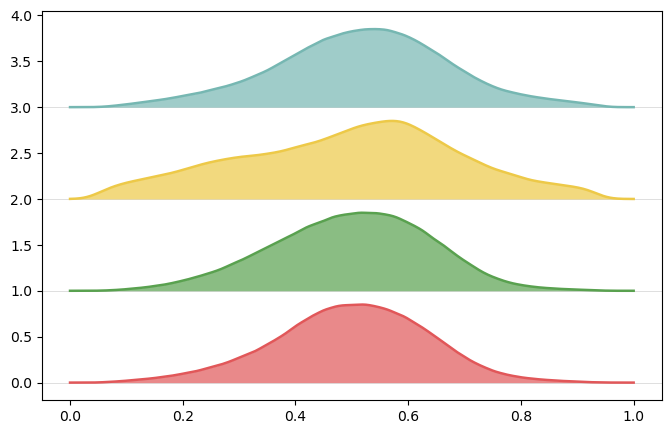

In [100]:
# ------------------------------------------------------------
# Ridge plot: density curves of continuity probability by genus
# with relative forest area share per genus
# ------------------------------------------------------------
if df_prob_genus is not None:
    df_plot = df_prob_genus.copy()
    df_plot = df_plot[
        df_plot["probability"].notna() &
        df_plot["genus"].notna() &
        (df_plot["probability"] >= 0) &
        (df_plot["probability"] <= 1) &
        (df_plot["genus"] != "No trees")
    ].copy()

    min_n = 50
    x_grid = np.linspace(0, 1, 500)
    ridge_height = 0.85

    genus_area_share = (
        df_plot["genus"].value_counts(normalize=True).mul(100).round(1).to_dict()
    )
    order = (
        df_plot.groupby("genus")["probability"].median().sort_values(ascending=True).index.tolist()
    )
    order = [g for g in order if (df_plot["genus"] == g).sum() >= min_n]

    fig_height = max(4.5, 0.55 * len(order) + 1.2)
    fig, ax = plt.subplots(figsize=(8, fig_height))

    for y, genus in enumerate(order):
        vals = df_plot.loc[df_plot["genus"] == genus, "probability"].dropna().values
        if len(vals) < min_n:
            continue
        kde = gaussian_kde(vals)
        dens = kde(x_grid)
        dens = dens / dens.max() * ridge_height
        color = genus_colors.get(genus, "#BDBDBD")
        ax.fill_between(x_grid, y, y + dens, color=color, alpha=0.70, linewidth=0)
        ax.plot(x_grid, y + dens, color=color, linewidth=1.8)
        ax.axhline(y, color="0.85", linewidth=0.6, zorder=0)

    labels = [f"{g} ({genus_area_share.get(g, np.nan):.1f}%)" for g in order]
    ax.set_yticks(range(len(order)))
    ax.set_yticklabels(labels, fontsize=11)
    ax.set_xlim(0, 1)
    ax.set_xlabel("Continuity probability", fontsize=12)
    ax.set_ylabel("Tree genus (% of sampled forest area)", fontsize=12)
    ax.set_title("Continuity probability distributions by tree genus", fontsize=14, pad=10)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.grid(axis="x", linestyle="--", linewidth=0.5, alpha=0.35)
    plt.tight_layout()
    save_fig(fig, prob_genus_fig_dir / "ridge_probability_by_genus_named_area_share")
    plt.show()
else:
    print("Skipped: df_prob_genus is missing.")


In [ ]:
# ------------------------------------------------------------
# Summary table: probability by genus
# ------------------------------------------------------------
if df_prob_genus is not None:
    summary = (
        df_prob_genus
        .groupby("genus")
        .agg(
            n=("probability", "size"),
            mean_prob=("probability", "mean"),
            median_prob=("probability", "median"),
            q10=("probability", lambda x: x.quantile(0.10)),
            q90=("probability", lambda x: x.quantile(0.90)),
            share_gt_075=("probability", lambda x: (x > 0.75).mean()),
            share_gt_090=("probability", lambda x: (x > 0.90).mean()),
            share_gt_095=("probability", lambda x: (x > 0.95).mean()),
        )
        .reset_index()
        .sort_values("median_prob", ascending=False)
    )
    summary.to_csv(prob_genus_summary_csv, index=False)
    print("Written:", prob_genus_summary_csv)
    display(summary)
else:
    print("Skipped: df_prob_genus is missing.")


## 8. Forest-age preprocessing and apples-to-apples map

This section uses a prepared forest-age raster instead of repeatedly opening the global NetCDF. The prepared raster contains only Europe, the 2020 forest-age layer, and the first ensemble member. If it is missing, it is only created when `RUN_EXPENSIVE_IF_MISSING = True`.

The hexagon comparison uses the same denominator for both products: total forest area from the 30 m forest mask. The forest-age threshold is `2020 - 1965 = 55` years, i.e. stands old enough in 2020 to have potentially existed before 1965.


In [101]:
# ------------------------------------------------------------
# Prepare/load forest-age Europe raster and forest-age hex comparison
# ------------------------------------------------------------
print("Forest-age threshold:", age_threshold, "years")
print("Target forest-age raster:", forest_age_2020_member1_europe_fp)

if forest_age_2020_member1_europe_fp.exists():
    print("Using existing prepared forest-age raster:", forest_age_2020_member1_europe_fp)
elif RUN_EXPENSIVE_IF_MISSING:
    forest_age_2020_member1_europe_fp = extract_forest_age_2020_member1_europe()
else:
    print(
        "Prepared forest-age raster is missing. "
        "Set RUN_EXPENSIVE_IF_MISSING = True once to extract Europe/member 1 from the global NetCDF."
    )

hex_compare = globals().get("hex_compare", None)

# Prefer the exact output generated by this notebook version.
if hex_compare is None and hex_compare_gpkg.exists():
    hex_compare = gpd.read_file(hex_compare_gpkg, layer="hexes")
    print("Loaded exact forest-age comparison product:", hex_compare_gpkg)

# Fall back to scanned geodata if the exact output name differs.
if hex_compare is None:
    for name, gdf in loaded_geodata.items():
        cols = set(gdf.columns)
        if any(c.startswith("forest_age_ge_") and c.endswith("_share_percent") for c in cols):
            hex_compare = gdf.copy()
            print(f"Using forest-age geodata from loaded_geodata['{name}']")
            break

# Compute only if explicitly enabled.
if hex_compare is None and RUN_EXPENSIVE_IF_MISSING:
    if not forest_age_2020_member1_europe_fp.exists():
        forest_age_2020_member1_europe_fp = extract_forest_age_2020_member1_europe()
    hex_compare = compute_hex_forest_age_comparison(
        forest_age_fp=forest_age_2020_member1_europe_fp,
        out_gpkg=hex_compare_gpkg,
        out_csv=hex_compare_csv,
    )

if hex_compare is None:
    print("No forest-age hex comparison product available. Forest-age maps will be skipped.")
else:
    print("hex_compare available:", hex_compare.shape)
    display(hex_compare.head())


Forest-age threshold: 55 years
Target forest-age raster: /mnt/eo/EO4Backcasting/_data_aligned/GAMIv2_1_forest_age_2020_member1_europe_100m_epsg4326.tif
Using existing prepared forest-age raster: /mnt/eo/EO4Backcasting/_data_aligned/GAMIv2_1_forest_age_2020_member1_europe_100m_epsg4326.tif
Using forest-age geodata from loaded_geodata['continuously_undisturbed_by_small_clipped_hexagon_with_forest_age']
hex_compare available: (7553, 13)


,hex_id,forest_pixels,oldgrowth_pixels,forest_area_ha,oldgrowth_area_ha,oldgrowth_share_percent,forest_age_valid_pixels,forest_age_ge_55_pixels,forest_age_valid_area_ha,forest_age_ge_55_area_ha,forest_age_ge_55_share_percent,forest_age_valid_coverage_percent,geometry
0,4,34169.0,69.0,3075.21,6.21,0.201937,26452,21769,2380.68,1959.21,63.709795,77.415201,"MULTIPOLYGON (((2987951.141 1627568.992, 30054..."
1,7,52732.0,131.0,4745.88,11.79,0.248426,45408,45212,4086.72,4069.08,85.739210,86.110900,"MULTIPOLYGON (((3066701.141 1642724.437, 30842..."
2,8,36758.0,0.0,3308.22,0.00,0.000000,32156,32067,2894.04,2886.03,87.238152,87.480276,"MULTIPOLYGON (((3005451.141 1627568.992, 30142..."
3,9,64124.0,0.0,5771.16,0.00,0.000000,51343,50727,4620.87,4565.43,79.107666,80.068305,"MULTIPOLYGON (((3110451.141 1627568.992, 31192..."
4,10,145163.0,0.0,13064.67,0.00,0.000000,68678,64816,6181.02,5833.44,44.650496,47.310954,"MULTIPOLYGON (((3162951.141 1627568.992, 31454..."


In [102]:
import xarray as xr
import rioxarray
import netCDF4
import dask

print("xarray:", xr.__version__)
print("rioxarray works")

xarray: 2026.4.0
rioxarray works


In [103]:
# ------------------------------------------------------------
# Create Europe-only forest age raster:
# 2020, first member, Europe bounding box
# ------------------------------------------------------------

from pathlib import Path
import xarray as xr
import rioxarray  # important for .rio accessor
import numpy as np

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

forest_age_nc = Path(
    "/mnt/eo/EO4Backcasting/_data/forest_age/"
    "GAMIv2-1_2010-2020_100m.nc"
)

out_dir = Path("/mnt/eo/EO4Backcasting/_data_aligned")
out_dir.mkdir(parents=True, exist_ok=True)

forest_age_fp = out_dir / "GAMIv2_1_forest_age_2020_member1_europe_100m_epsg4326.tif"

# ------------------------------------------------------------
# Europe bounding box in lon/lat
# ------------------------------------------------------------

xmin, ymin, xmax, ymax = -11, 34, 35, 72

# ------------------------------------------------------------
# Check input
# ------------------------------------------------------------

if not forest_age_nc.exists():
    raise FileNotFoundError(f"Forest age NetCDF not found: {forest_age_nc}")

print("Input NetCDF:", forest_age_nc)
print("Output GeoTIFF:", forest_age_fp)

# ------------------------------------------------------------
# Open global NetCDF
# ------------------------------------------------------------

ds = xr.open_dataset(
    forest_age_nc,
    chunks={"latitude": 1000, "longitude": 1000}
)

print(ds)

age = ds["forest_age"]

# ------------------------------------------------------------
# Detect dimension names
# ------------------------------------------------------------

lat_name = "latitude" if "latitude" in age.dims else "lat"
lon_name = "longitude" if "longitude" in age.dims else "lon"

time_name = "time" if "time" in age.dims else None

member_dim = None
for cand in ["members", "member", "ensemble", "ens"]:
    if cand in age.dims:
        member_dim = cand
        break

print("lat_name:", lat_name)
print("lon_name:", lon_name)
print("time_name:", time_name)
print("member_dim:", member_dim)

# ------------------------------------------------------------
# Select year 2020 and first member
# ------------------------------------------------------------

age_sel = age

if time_name is not None:
    age_sel = age_sel.sel({time_name: "2020-01-01"}, method="nearest")

if member_dim is not None:
    age_sel = age_sel.isel({member_dim: 0})

age_sel = age_sel.squeeze(drop=True)

print(age_sel)

# ------------------------------------------------------------
# Subset to Europe
# ------------------------------------------------------------

lat_values = age_sel[lat_name].values

if lat_values[0] > lat_values[-1]:
    # descending latitude
    age_eur = age_sel.sel({
        lon_name: slice(xmin, xmax),
        lat_name: slice(ymax, ymin)
    })
else:
    # ascending latitude
    age_eur = age_sel.sel({
        lon_name: slice(xmin, xmax),
        lat_name: slice(ymin, ymax)
    })

# ------------------------------------------------------------
# Prepare spatial metadata
# ------------------------------------------------------------

age_eur = age_eur.astype("float32")

age_eur = (
    age_eur
    .rio.set_spatial_dims(x_dim=lon_name, y_dim=lat_name)
    .rio.write_crs("EPSG:4326")
)

# Keep NaN as nodata-compatible output
age_eur = age_eur.rio.write_nodata(-9999, encoded=True)

# ------------------------------------------------------------
# Save GeoTIFF
# ------------------------------------------------------------

age_eur.rio.to_raster(
    forest_age_fp,
    dtype="float32",
    compress="deflate",
    tiled=True,
    BIGTIFF="YES"
)

print("Written:", forest_age_fp)

Input NetCDF: /mnt/eo/EO4Backcasting/_data/forest_age/GAMIv2-1_2010-2020_100m.nc
Output GeoTIFF: /mnt/eo/EO4Backcasting/_data_aligned/GAMIv2_1_forest_age_2020_member1_europe_100m_epsg4326.tif


/tmp/ipykernel_933835/628394417.py:45: UserWarning: The specified chunks separate the stored chunks along dimension "latitude" starting at index 1000. This could degrade performance. Instead, consider rechunking after loading.
  ds = xr.open_dataset(
/tmp/ipykernel_933835/628394417.py:45: UserWarning: The specified chunks separate the stored chunks along dimension "longitude" starting at index 1000. This could degrade performance. Instead, consider rechunking after loading.
  ds = xr.open_dataset(


<xarray.Dataset> Size: 7TB
Dimensions:     (members: 20, latitude: 202500, longitude: 405000, time: 2)
Coordinates:
  * members     (members) int64 160B 0 1 2 3 4 5 6 7 ... 12 13 14 15 16 17 18 19
  * latitude    (latitude) float64 2MB 90.0 90.0 90.0 90.0 ... -90.0 -90.0 -90.0
  * longitude   (longitude) float64 3MB -180.0 -180.0 -180.0 ... 180.0 180.0
  * time        (time) datetime64[ns] 16B 2010-01-01 2020-01-01
Data variables:
    forest_age  (members, latitude, longitude, time) int16 7TB dask.array<chunksize=(1, 1000, 1000, 1), meta=np.ndarray>
    crs         int64 8B ...
Attributes:
    product_name:   Global Age Mapping Integration (GAMI) v2.0
    version:        v2.1
    institution:    Helmholtz Center Potsdam GFZ German Research Centre for G...
    institute_id:   GFZ-Potsdam and MPI-BGC
    _FillValue:     -9999
    created_by:     Simon Besnard
    contact:        Simon Besnard (besnard@gfz-potsdam.de) and Nuno Carvalhai...
    references:     https://doi.org/10.5880/GFZ.1

KeyboardInterrupt: 

In [ ]:
import rasterio
import numpy as np

with rasterio.open(forest_age_fp) as src:
    print("Path:", src.name)
    print("CRS:", src.crs)
    print("Bounds:", src.bounds)
    print("Shape:", src.height, src.width)
    print("Nodata:", src.nodata)

    arr = src.read(1, masked=True)

    print("Valid pixels:", arr.count())
    print("Min:", float(arr.min()))
    print("Max:", float(arr.max()))
    print("Mean:", float(arr.mean()))

In [106]:
# ------------------------------------------------------------
# Add forest-age-based share to existing hexagon GPKG
# ------------------------------------------------------------

from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.vrt import WarpedVRT
from rasterio.enums import Resampling
from rasterio.features import rasterize
from rasterio.windows import bounds as window_bounds
from rasterio.windows import transform as window_transform
from shapely.geometry import box
from tqdm.auto import tqdm

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

analysis_cache_dir = Path(
    "/mnt/eo/EO4Backcasting/_analysis_cache"
)

hex_fp = analysis_cache_dir / (
    "forest_continuity_gt0729_"
    "by_small_clipped_hexagon_lon45_gt0729.gpkg"
)

forest_mask_fp = Path(
    "/mnt/eo/EFDA_v211/forest_landuse_aligned.tif"
)

old_growth_fp = Path(
    "/mnt/eo/EO4Backcasting/_predictions/predictions_global_model/"
    "global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif"
)

forest_age_fp = Path(
    "/mnt/eo/EO4Backcasting/_data_aligned/"
    "GAMIv2_1_forest_age_2020_member1_europe_100m_epsg4326.tif"
)

out_fp = analysis_cache_dir / (
    "forest_continuity_gt0729_"
    "by_small_clipped_hexagon_lon45_"
    "with_forest_age.gpkg"
)

print("Hexagon file exists:", hex_fp.exists())
print("Hexagon file:", hex_fp)

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

age_threshold = 55       # 2020 - 1965
forest_value = 1
pixel_area_ha = 0.09     # 30 m pixel
overwrite = True

# ------------------------------------------------------------
# Load existing hexagons
# ------------------------------------------------------------

hex_compare = gpd.read_file(hex_fp).copy()

print("Loaded:", hex_fp)
print("CRS:", hex_compare.crs)
print("N hexagons:", len(hex_compare))
print("Columns:", list(hex_compare.columns))

required_cols = ["hex_id", "forest_area_ha", "geometry"]
missing = [c for c in required_cols if c not in hex_compare.columns]

if missing:
    raise ValueError(f"Missing required columns: {missing}")

hex_compare["hex_id"] = hex_compare["hex_id"].astype(int)
hex_compare["forest_area_ha"] = pd.to_numeric(
    hex_compare["forest_area_ha"],
    errors="coerce"
)

hex_compare = hex_compare[
    hex_compare["forest_area_ha"].notna() &
    (hex_compare["forest_area_ha"] > 0)
].copy()

print("Hexagons with forest area > 0:", len(hex_compare))

# ------------------------------------------------------------
# Prepare counters
# ------------------------------------------------------------

max_hex_id = int(hex_compare["hex_id"].max())

forest_age_valid_pixels = np.zeros(max_hex_id + 1, dtype=np.int64)
forest_age_ge_55_pixels = np.zeros(max_hex_id + 1, dtype=np.int64)

# ------------------------------------------------------------
# Aggregate forest age to existing hexagons
# ------------------------------------------------------------

with rasterio.open(old_growth_fp) as cont_src, \
     rasterio.open(forest_mask_fp) as forest_src, \
     rasterio.open(forest_age_fp) as age_src:

    print("\nTarget raster CRS:", cont_src.crs)
    print("Target raster bounds:", cont_src.bounds)

    print("\nForest age CRS:", age_src.crs)
    print("Forest age bounds:", age_src.bounds)

    hexes = hex_compare[["hex_id", "geometry"]].copy().to_crs(cont_src.crs)
    sindex = hexes.sindex

    forest_vrt = WarpedVRT(
        forest_src,
        crs=cont_src.crs,
        transform=cont_src.transform,
        width=cont_src.width,
        height=cont_src.height,
        resampling=Resampling.nearest
    )

    age_vrt = WarpedVRT(
        age_src,
        crs=cont_src.crs,
        transform=cont_src.transform,
        width=cont_src.width,
        height=cont_src.height,
        resampling=Resampling.nearest,
        src_nodata=age_src.nodata,
        nodata=-9999
    )

    windows = list(cont_src.block_windows(1))

    for _, window in tqdm(windows, desc="Aggregating forest age by hexagon"):

        wb = window_bounds(window, cont_src.transform)

        cand_idx = list(sindex.intersection(wb))
        if len(cand_idx) == 0:
            continue

        cand = hexes.iloc[cand_idx].copy()

        if len(cand) == 0:
            continue

        win_transform = window_transform(window, cont_src.transform)
        out_shape = (int(window.height), int(window.width))

        hex_id_arr = rasterize(
            [(geom, int(hid)) for geom, hid in zip(cand.geometry, cand["hex_id"])],
            out_shape=out_shape,
            transform=win_transform,
            fill=0,
            dtype="int32",
            all_touched=False
        )

        if hex_id_arr.max() == 0:
            continue

        forest = forest_vrt.read(1, window=window)
        age = age_vrt.read(1, window=window).astype("float32")

        forest_mask = (
            (forest == forest_value) &
            (hex_id_arr > 0)
        )

        if not np.any(forest_mask):
            continue

        age_valid_mask = (
            forest_mask &
            np.isfinite(age) &
            (age != -9999) &
            (age >= 0) &
            (age <= 140)
        )

        if np.any(age_valid_mask):
            forest_age_valid_pixels += np.bincount(
                hex_id_arr[age_valid_mask],
                minlength=max_hex_id + 1
            )

        age_ge_mask = age_valid_mask & (age >= age_threshold)

        if np.any(age_ge_mask):
            forest_age_ge_55_pixels += np.bincount(
                hex_id_arr[age_ge_mask],
                minlength=max_hex_id + 1
            )

    forest_vrt.close()
    age_vrt.close()

# ------------------------------------------------------------
# Add new columns
# ------------------------------------------------------------

ids = hex_compare["hex_id"].values.astype(int)

hex_compare["forest_age_valid_pixels"] = forest_age_valid_pixels[ids]
hex_compare[f"forest_age_ge_{age_threshold}_pixels"] = forest_age_ge_55_pixels[ids]

hex_compare["forest_age_valid_area_ha"] = (
    hex_compare["forest_age_valid_pixels"] * pixel_area_ha
)

hex_compare[f"forest_age_ge_{age_threshold}_area_ha"] = (
    hex_compare[f"forest_age_ge_{age_threshold}_pixels"] * pixel_area_ha
)

hex_compare[f"forest_age_ge_{age_threshold}_share_percent"] = np.where(
    hex_compare["forest_area_ha"] > 0,
    hex_compare[f"forest_age_ge_{age_threshold}_area_ha"] /
    hex_compare["forest_area_ha"] * 100,
    np.nan
)

hex_compare["forest_age_valid_coverage_percent"] = np.where(
    hex_compare["forest_area_ha"] > 0,
    hex_compare["forest_age_valid_area_ha"] /
    hex_compare["forest_area_ha"] * 100,
    np.nan
)

# ------------------------------------------------------------
# Check result
# ------------------------------------------------------------

age_share_col = f"forest_age_ge_{age_threshold}_share_percent"

cols_check = [
    "forest_area_ha",
    "oldgrowth_area_ha",
    "oldgrowth_share_percent",
    "forest_age_valid_area_ha",
    f"forest_age_ge_{age_threshold}_area_ha",
    age_share_col,
    "forest_age_valid_coverage_percent"
]

existing_cols_check = [c for c in cols_check if c in hex_compare.columns]

display(hex_compare[existing_cols_check].describe())

print("Valid forest-age share hexagons:", hex_compare[age_share_col].notna().sum())
print("Hexagons with age coverage > 0:", (hex_compare["forest_age_valid_pixels"] > 0).sum())

display(hex_compare[existing_cols_check].head())

# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

if out_fp.exists() and overwrite:
    out_fp.unlink()

hex_compare.to_file(out_fp, driver="GPKG")

print("Saved:", out_fp)

Hexagon file exists: True
Hexagon file: /mnt/eo/EO4Backcasting/_analysis_cache/forest_continuity_gt0729_by_small_clipped_hexagon_lon45_gt0729.gpkg
Loaded: /mnt/eo/EO4Backcasting/_analysis_cache/forest_continuity_gt0729_by_small_clipped_hexagon_lon45_gt0729.gpkg
CRS: EPSG:3035
N hexagons: 7694
Columns: ['hex_id', 'forest_pixels', 'continuity_pixels', 'forest_area_ha', 'continuity_area_ha', 'continuity_area_km2', 'continuity_share_percent', 'geometry']
Hexagons with forest area > 0: 7694

Target raster CRS: EPSG:3035
Target raster bounds: BoundingBox(left=2612197.933345846, bottom=1365550.4228236396, right=6512197.933345846, top=5565550.42282364)

Forest age CRS: EPSG:4326
Forest age bounds: BoundingBox(left=-11.000000000000004, bottom=34.0, right=35.0, top=72.0)


Aggregating forest age by hexagon:   0%|          | 0/140000 [00:00<?, ?it/s]

,forest_area_ha,forest_age_valid_area_ha,forest_age_ge_55_area_ha,forest_age_ge_55_share_percent,forest_age_valid_coverage_percent
count,7694.000000,7694.0,7694.0,7694.0,7694.0
mean,27920.501811,0.0,0.0,0.0,0.0
std,21003.522128,0.0,0.0,0.0,0.0
min,505.080000,0.0,0.0,0.0,0.0
25%,8850.667500,0.0,0.0,0.0,0.0
50%,24244.965000,0.0,0.0,0.0,0.0
75%,44162.370000,0.0,0.0,0.0,0.0
max,75618.090000,0.0,0.0,0.0,0.0


Valid forest-age share hexagons: 7694
Hexagons with age coverage > 0: 0


,forest_area_ha,forest_age_valid_area_ha,forest_age_ge_55_area_ha,forest_age_ge_55_share_percent,forest_age_valid_coverage_percent
0,3075.21,0.0,0.0,0.0,0.0
1,4745.88,0.0,0.0,0.0,0.0
2,5771.16,0.0,0.0,0.0,0.0
3,3308.22,0.0,0.0,0.0,0.0
4,14613.30,0.0,0.0,0.0,0.0


Saved: /mnt/eo/EO4Backcasting/_analysis_cache/forest_continuity_gt0729_by_small_clipped_hexagon_lon45_with_forest_age.gpkg


In [109]:
from shapely.geometry import box
import geopandas as gpd

# ------------------------------------------------------------
# Remove overseas regions / keep European mainland extent only
# ------------------------------------------------------------

europe_bbox_4326 = box(-11, 34, 35, 72)

bbox_gdf = gpd.GeoDataFrame(
    geometry=[europe_bbox_4326],
    crs="EPSG:4326"
)

bbox_plot_crs = bbox_gdf.to_crs(hex_compare.crs)

# ------------------------------------------------------------
# Clip hexagons
# ------------------------------------------------------------

hex_compare = gpd.clip(
    hex_compare,
    bbox_plot_crs
).copy()

hex_compare = hex_compare[
    hex_compare.geometry.notna()
    & ~hex_compare.geometry.is_empty
].copy()

print("Hexagons after Europe bbox clip:", len(hex_compare))

# ------------------------------------------------------------
# Clip countries only if available
# ------------------------------------------------------------

if countries_eur is not None:
    if not isinstance(countries_eur, (gpd.GeoDataFrame, gpd.GeoSeries)):
        raise TypeError(
            f"countries_eur must be a GeoDataFrame or GeoSeries, "
            f"but is {type(countries_eur)}"
        )

    if countries_eur.crs != hex_compare.crs:
        countries_eur = countries_eur.to_crs(hex_compare.crs)

    countries_eur = gpd.clip(
        countries_eur,
        bbox_plot_crs
    ).copy()

    countries_eur = countries_eur[
        countries_eur.geometry.notna()
        & ~countries_eur.geometry.is_empty
    ].copy()

    print(
        "Country geometries after Europe bbox clip:",
        len(countries_eur)
    )

else:
    print(
        "countries_eur is None. Country geometries were not clipped."
    )

Hexagons after Europe bbox clip: 7502
countries_eur is None. Country geometries were not clipped.


<class 'NoneType'>
None


In [110]:
# ------------------------------------------------------------
# Load Europe country boundaries without overseas regions
# ------------------------------------------------------------

from shapely.geometry import box
import geopandas as gpd

european_countries = [
    "Albania", "Andorra", "Austria", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Czechia",
    "Denmark", "Estonia", "Finland", "France", "Germany",
    "Greece", "Hungary", "Ireland", "Italy", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Ukraine",
    "United Kingdom", "Vatican"
]

countries_eur = gpd.read_file(country_gpkg_10m)
countries_eur["country"] = countries_eur[country_name_col].astype(str).str.strip()
countries_eur = countries_eur[countries_eur["country"].isin(european_countries)].copy()
countries_eur = countries_eur[countries_eur.geometry.notna() & ~countries_eur.geometry.is_empty].copy()
countries_eur["geometry"] = countries_eur.geometry.make_valid()

# First go to lon/lat, explode multipart geometries, and keep only Europe bbox
countries_eur = countries_eur.to_crs("EPSG:4326")
countries_eur = countries_eur.explode(index_parts=False).reset_index(drop=True)

europe_bbox = gpd.GeoDataFrame(
    geometry=[box(-11, 34, 35, 72)],
    crs="EPSG:4326"
)

countries_eur = gpd.clip(countries_eur, europe_bbox)

# Back to plot CRS
countries_eur = countries_eur.to_crs(hex_compare.crs)

countries_eur = countries_eur[
    countries_eur.geometry.notna() &
    ~countries_eur.geometry.is_empty
].copy()

print("Country geometries:", len(countries_eur))

Country geometries: 663


In [115]:
from shapely.geometry import box
import geopandas as gpd

# ------------------------------------------------------------
# Keep only mainland / main Europe extent
# ------------------------------------------------------------

# Adjust if needed
# xmin, ymin, xmax, ymax in lon/lat
europe_bbox_4326 = box(-11, 34, 35, 72)

bbox_gdf = gpd.GeoDataFrame(
    geometry=[europe_bbox_4326],
    crs="EPSG:4326"
)

# Reproject bbox to plotting CRS
bbox_plot_crs = bbox_gdf.to_crs(hexes_plot.crs)

# Clip countries
countries_eur = gpd.clip(
    countries_eur,
    bbox_plot_crs
).copy()

countries_eur = countries_eur[
    countries_eur.geometry.notna() &
    ~countries_eur.geometry.is_empty
].copy()

# Clip hexagons
hexes_plot = gpd.clip(
    hexes_plot,
    bbox_plot_crs
).copy()

hexes_plot = hexes_plot[
    hexes_plot.geometry.notna() &
    ~hexes_plot.geometry.is_empty
].copy()

print("Countries after bbox clip:", len(countries_eur))
print("Hexagons after bbox clip:", len(hexes_plot))

AttributeError: 'NoneType' object has no attribute 'crs'

In [116]:
# ------------------------------------------------------------
# Clip hexagons to same European extent
# ------------------------------------------------------------

europe_bbox_plot = europe_bbox.to_crs(hex_compare.crs)

hex_compare = gpd.clip(hex_compare, europe_bbox_plot).copy()

hex_compare = hex_compare[
    hex_compare.geometry.notna() &
    ~hex_compare.geometry.is_empty
].copy()

print("Hexagons after clipping:", len(hex_compare))

Hexagons after clipping: 7502


Forest-age native vmax: 0.0


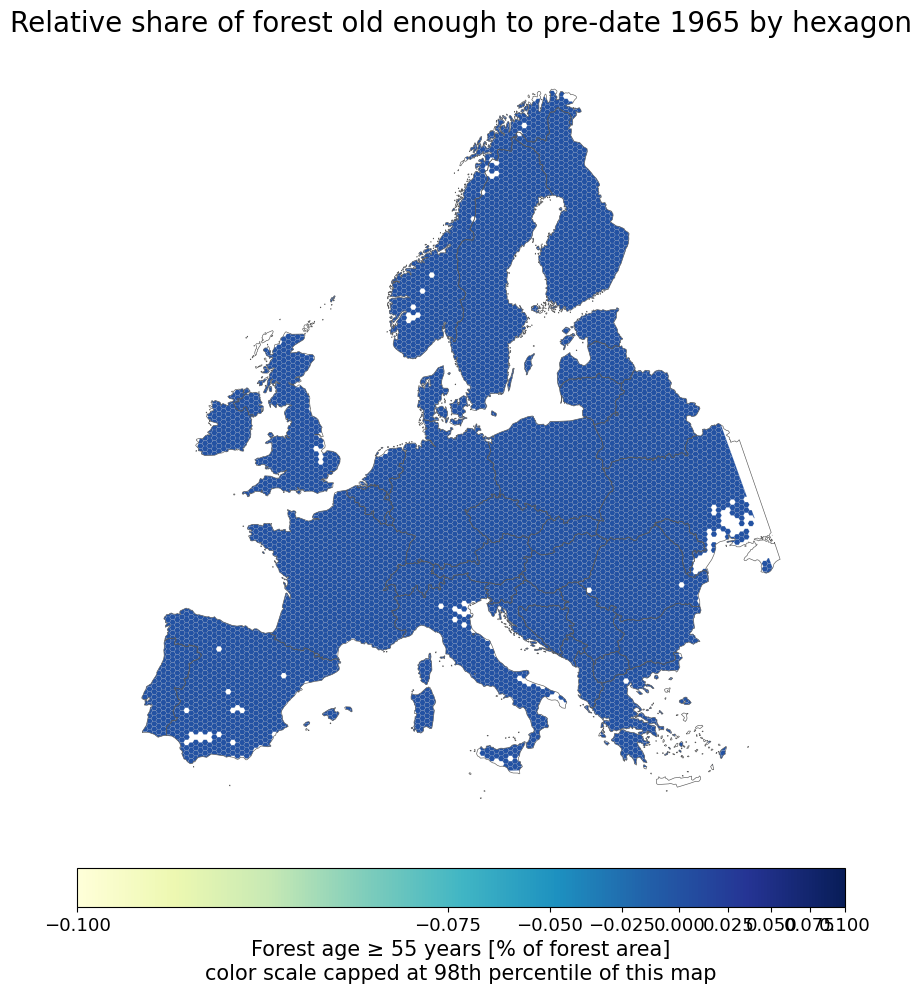

Saved: /mnt/eo/EO4Backcasting/figures/map_relative_share_forest_age_ge_55_by_hexagon_native_scale.png
Saved: /mnt/eo/EO4Backcasting/figures/map_relative_share_forest_age_ge_55_by_hexagon_native_scale.svg


In [117]:
# ------------------------------------------------------------
# Native color scaling for forest-age map
# ------------------------------------------------------------

vmax_age = np.nanpercentile(hex_compare[age_share_col], 98)

print("Forest-age native vmax:", vmax_age)

norm_age = mpl.colors.PowerNorm(gamma=0.35, vmin=0, vmax=vmax_age)
cmap = plt.get_cmap("YlGnBu")


# ------------------------------------------------------------
# Single map: forest age >= 55 years with native value range
# ------------------------------------------------------------

plot_gdf = hex_compare.copy()
plot_gdf[f"{age_share_col}_plot"] = plot_gdf[age_share_col].clip(upper=vmax_age)

fig, ax = plt.subplots(figsize=(10, 10))

plot_gdf.plot(
    ax=ax,
    column=f"{age_share_col}_plot",
    cmap=cmap,
    norm=norm_age,
    linewidth=0.08,
    edgecolor="0.75",
    missing_kwds={
        "color": "white",
        "edgecolor": "0.85"
    }
)

countries_eur.boundary.plot(
    ax=ax,
    color="0.35",
    linewidth=0.45
)

sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm_age)
sm.set_array([])

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="horizontal",
    shrink=0.80,
    fraction=0.045,
    pad=0.04
)

cbar.set_label(
    "Forest age ≥ 55 years [% of forest area]\n"
    "color scale capped at 98th percentile of this map",
    fontsize=15
)

cbar.ax.tick_params(labelsize=13)

ax.set_title(
    "Relative share of forest old enough to pre-date 1965 by hexagon",
    fontsize=20,
    pad=16
)

ax.set_axis_off()

plt.tight_layout()

out_png = fig_dir / "map_relative_share_forest_age_ge_55_by_hexagon_native_scale.png"
out_svg = fig_dir / "map_relative_share_forest_age_ge_55_by_hexagon_native_scale.svg"

fig.savefig(out_png, dpi=600, bbox_inches="tight", facecolor="white")
fig.savefig(out_svg, bbox_inches="tight", facecolor="white")

plt.show()

print("Saved:", out_png)
print("Saved:", out_svg)

## 9. Final object backup

This backup is small and helps you restart later without rebuilding Python objects. It does not replace the written CSV/GPKG products, which remain the primary cache.


In [113]:
# ------------------------------------------------------------
# Save currently loaded analysis objects
# ------------------------------------------------------------
session_backup_dir.mkdir(parents=True, exist_ok=True)
objects_to_save = {}

for obj_name in [
    "df_total", "df_genus", "df_ecoregion", "df_ecoregion_genus", "df_class_check",
    "df_nbr", "df_counts", "df_genus_share", "df_gc", "df_country_share",
    "hexes_plot", "countries_eur", "df_prob_genus", "summary", "hex_compare",
    "manifest",
]:
    if obj_name in globals() and globals()[obj_name] is not None:
        objects_to_save[obj_name] = globals()[obj_name]

backup_fp = session_backup_dir / "backcasting_analysis_load_first_session_backup.pkl"
with open(backup_fp, "wb") as f:
    pickle.dump(objects_to_save, f)

print("Saved backup:", backup_fp)
print("Saved objects:", sorted(objects_to_save.keys()))


Saved backup: /mnt/eo/EO4Backcasting/_analysis/session_backups/backcasting_analysis_load_first_session_backup.pkl
Saved objects: ['countries_eur', 'df_country_share', 'df_ecoregion', 'df_ecoregion_genus', 'df_genus', 'df_prob_genus', 'hex_compare', 'manifest', 'summary']


In [ ]:
from pathlib import Path
import rasterio

forest_age_nc = Path(
    "/mnt/eo/EO4Backcasting/_data/forest_age/"
    "GAMIv2-1_2010-2020_100m.nc"
)

print("Exists:", forest_age_nc.exists())
print("Path:", forest_age_nc)

with rasterio.open(forest_age_nc) as ds:
    print("Driver:", ds.driver)
    print("Subdatasets:")
    for s in ds.subdatasets:
        print(s)

# 7. Final consistency checks

The following checks confirm that the main downstream notebooks point to the `gt0729` product and that threshold-specific output files can be distinguished from earlier analyses.


In [ ]:
# ============================================================
# Final consistency checks
# ============================================================

assert np.isclose(FINAL_THRESHOLD, 0.729)
assert FINAL_BINARY_RASTER.name == (
    "global_model_no_dist_gt0729_4conn_5ha_TRUE_0_1.tif"
)

print("Final threshold:", FINAL_THRESHOLD)
print("Binary raster exists:", FINAL_BINARY_RASTER.exists())
print("Binary raster:", FINAL_BINARY_RASTER)
print("Threshold-specific cache directory:", ANALYSIS_CACHE_DIR)
print("Threshold-specific figure directory:", FIGURE_DIR)

print(
    "\nBefore using manuscript numbers, verify that every downstream "
    "section completed without falling back to an old cache."
)
